In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
from bokeh.plotting import figure, output_notebook, show, save
from bokeh.models import ColumnDataSource, HoverTool, GroupFilter, CDSView

output_notebook()

Loading BokehJS ...

In [3]:
pd.set_option('display.max_columns', 20)
pd.set_option('display.max_rows', 10)

In [4]:
dfriskdirty=pd.read_csv('ClimateRiskDataset.csv', encoding='utf-8')

In [5]:
dfriskdirty.head()

,index,cartodb_id,the_geom,the_geom_webmercator,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
0,0,1,NaN,NaN,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,1.229,SAU,Saudi Arabia
1,1,2,NaN,NaN,Romania,61,61.50,112,0.01,102,1,16,0.6746,11,2797.884,ROU,Romania
2,2,3,NaN,NaN,Spain,69,66.33,74,0.05,47,22,86,0.0394,31,637.070,ESP,Spain
3,3,4,NaN,NaN,Slovenia,135,124.50,114,0.00,114,0,135,NaN,135,0.000,SVN,Slovenia
4,4,5,NaN,NaN,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,122,0.508,SSD,South Sudan


In [6]:
dfriskdirty.shape[:]

(182, 17)

In [7]:
dfriskdirty[['country', 'rw_country_name']].head()

,country,rw_country_name
0,Saudi Arabia,Saudi Arabia
1,Romania,Romania
2,Spain,Spain
3,Slovenia,Slovenia
4,South Sudan,South Sudan


In [8]:
dfriskdirty[dfriskdirty['rw_country_name']!=dfriskdirty['country']].shape[0]

21

In [9]:
dfriskdirty.describe()

,index,cartodb_id,the_geom,the_geom_webmercator,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total
count,182.000000,182.000000,0.0,0.0,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000,131.000000,182.000000,182.000000
mean,90.500000,91.500000,NaN,NaN,85.230769,81.791923,78.609890,0.519670,77.626374,86.840659,85.302198,1.517654,85.302198,907.507599
std,52.683014,52.683014,NaN,NaN,44.708529,34.582412,37.858511,3.393934,37.500688,427.350623,44.691600,8.171267,44.691600,4483.998505
min,0.000000,1.000000,NaN,NaN,1.000000,12.170000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000100,1.000000,0.000000
25%,45.250000,46.250000,NaN,NaN,46.250000,52.872500,46.250000,0.000000,46.250000,0.000000,46.250000,0.016500,46.250000,0.000000
50%,90.500000,91.500000,NaN,NaN,91.000000,77.500000,91.500000,0.020000,90.000000,2.000000,91.500000,0.084100,91.500000,30.347000
75%,135.750000,136.750000,NaN,NaN,135.000000,124.500000,114.000000,0.120000,114.000000,22.750000,135.000000,0.275950,135.000000,262.178250
max,181.000000,182.000000,NaN,NaN,135.000000,124.500000,114.000000,43.660000,114.000000,4317.000000,135.000000,77.369400,135.000000,40077.222000


In [10]:
dfriskdirty['the_geom'].unique(), dfriskdirty['the_geom_webmercator'].unique(), #dfriskdirty['']

(array([nan]), array([nan]))

In [11]:
dropcols=['the_geom', 'the_geom_webmercator', 'index',]                                                                      #cartodb is a spatial analysis software that has assined a number to each place. It may be redundant here but if i have access might be useful
dfriskcleaner=dfriskdirty.copy()
dfriskcleaner=dfriskcleaner.drop(dropcols, axis=1)
dfriskcleaner.shape

(182, 14)

In [12]:
pd.set_option('display.max_rows', None)

In [13]:
print(dfriskcleaner.isna().sum())

cartodb_id                    0
country                       0
cri_rank                      0
cri_score                     0
fatalities_per_100k_rank      0
fatalities_per_100k_total     0
fatalities_rank               0
fatalities_total              0
losses_per_gdp__rank          0
losses_per_gdp__total        51
losses_usdm_ppp_rank          0
losses_usdm_ppp_total         0
rw_country_code               3
rw_country_name               3
dtype: int64


In [14]:
dfriskcleaner[dfriskcleaner['losses_per_gdp__total'].isna()]

,cartodb_id,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
3,4,Slovenia,135,124.50,114,0.00,114,0,135,NaN,135,0.000,SVN,Slovenia
13,14,Tunisia,135,124.50,114,0.00,114,0,135,NaN,135,0.000,TUN,Tunisia
20,21,Venezuela,135,124.50,114,0.00,114,0,135,NaN,135,0.000,VEN,Venezuela
23,24,United Arab Emirates,127,109.17,86,0.03,85,3,133,NaN,132,0.087,ARE,United Arab Emirates
34,35,Mauritania,135,124.50,114,0.00,114,0,135,NaN,135,0.000,MRT,Mauritania
36,37,Singapore,135,124.50,114,0.00,114,0,135,NaN,135,0.000,SGP,Singapore
37,38,Suriname,135,124.50,114,0.00,114,0,135,NaN,135,0.000,SUR,Suriname
38,39,Azerbaijan,135,124.50,114,0.00,114,0,135,NaN,135,0.000,AZE,Azerbaijan
42,43,Guyana,135,124.50,114,0.00,114,0,135,NaN,135,0.000,GUY,Guyana
52,53,Antigua and Barbuda,135,124.50,114,0.00,114,0,135,NaN,135,0.000,ATG,Antigua and Barbuda


In [15]:
pd.set_option('display.max_rows', 10)

In [16]:
growth_trend_Vis = figure(width=900, height=350)
growth_trend_Vis.vbar(x=dfriskcleaner.index, top=dfriskcleaner['fatalities_rank'])
show(growth_trend_Vis)

In [17]:
dfriskcleaner[dfriskcleaner['country']=='Albania']

,cartodb_id,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
53,54,Albania,55,58.0,54,0.1,85,3,41,0.2254,73,73.622,ALB,Albania


In [18]:
#dfriskclean=dfriskcleaner.drop('rw_country_code', axis=1)
#dfriskclean.head()
        #### these cant both be true
dfriskclean=dfriskcleaner.copy()

In [19]:
dfriskclean.shape[:]

(182, 14)

In [20]:
dfriskclean.sort_values(by='cri_rank').head(3)

,cartodb_id,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
165,166,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,34,500.073,MOZ,Mozambique
137,138,Dominica,2,13.00,1,43.66,42,31,1,77.3694,32,611.219,DMA,Dominica
99,100,Malawi,3,13.83,14,0.61,20,111,6,4.4507,23,907.985,MWI,Malawi


In [21]:
dfriskclean.sort_values(by='fatalities_per_100k_rank').head(3)     ### HUH. i guess maybe i should include the missing countries in the new DF and just allow the NaNs. (can say wanted to keep NaNs as NaNs)

,cartodb_id,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
137,138,Dominica,2,13.00,1,43.66,42,31,1,77.3694,32,611.219,DMA,Dominica
15,16,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,72,80.642,BHS,The Bahamas
159,160,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,86,38.491,FSM,Federated States of Micronesia


In [22]:
dfriskclean.sort_values(by='losses_usdm_ppp_rank').head(3)

,cartodb_id,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
89,90,India,4,15.33,24,0.33,1,4317,21,0.5011,1,40077.222,IND,India
69,70,China,23,38.00,68,0.07,4,916,43,0.1842,2,36272.535,CHN,China
21,22,United States,21,36.17,55,0.10,8,325,48,0.1504,3,27122.700,USA,United States of America


In [23]:
# cool. now its time to see what countries match. especially, what ones arent on the risk one
type(dfriskclean.loc[0,'country']), type(dfriskclean.loc[0,'rw_country_name'])

(str, str)

In [24]:
[dfriskclean[~dfriskclean['country'].isin(dfriskclean['rw_country_name'])].shape[0], \
 dfriskclean[~dfriskclean['rw_country_name'].isin(dfriskclean['country'])].shape[0]]

[21, 21]

In [25]:
extrariskCcheck=list(set(dfriskclean[~dfriskclean['rw_country_name'].isin(dfriskclean['country'])]['rw_country_name']))

In [26]:
extrariskCcheck

['Republic of Serbia',
 'Timor-Leste',
 'Guinea Bissau',
 'Ivory Coast',
 'Iran',
 'Saint Lucia',
 'Yemen',
 'United States of America',
 nan,
 'Macedonia',
 'Slovakia',
 'Federated States of Micronesia',
 'United Republic of Tanzania',
 'Brunei',
 'Saint Kitts and Nevis',
 'Kyrgyzstan',
 'Laos',
 'South Korea',
 'Democratic Republic of the Congo']

In [27]:
#***&&&
# I Cut a useless imported df from here

In [28]:
droppingcols=['cartodb_id']#, 'country_y', 'country_x']
climateCstats=dfriskclean.drop(droppingcols, axis=1)
climateCstats

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,1.229,SAU,Saudi Arabia
1,Romania,61,61.50,112,0.01,102,1,16,0.6746,11,2797.884,ROU,Romania
2,Spain,69,66.33,74,0.05,47,22,86,0.0394,31,637.070,ESP,Spain
3,Slovenia,135,124.50,114,0.00,114,0,135,NaN,135,0.000,SVN,Slovenia
4,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,122,0.508,SSD,South Sudan
...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,Seychelles,135,124.50,114,0.00,114,0,135,NaN,135,0.000,SYC,Seychelles
178,Gambia,135,124.50,114,0.00,114,0,135,NaN,135,0.000,GMB,Gambia
179,Togo,131,114.33,104,0.01,102,1,123,0.0012,130,0.130,TGO,Togo
180,Trinidad and Tobago,135,124.50,114,0.00,114,0,135,NaN,135,0.000,TTO,Trinidad and Tobago


In [29]:
climateCstats.columns

Index(['country', 'cri_rank', 'cri_score', 'fatalities_per_100k_rank',
       'fatalities_per_100k_total', 'fatalities_rank', 'fatalities_total',
       'losses_per_gdp__rank', 'losses_per_gdp__total', 'losses_usdm_ppp_rank',
       'losses_usdm_ppp_total', 'rw_country_code', 'rw_country_name'],
      dtype='object')

In [30]:
climateCstats[~climateCstats['rw_country_name'].isin(climateCstats['country'])]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
7,Serbia,83,75.50,114,0.00,114,0,33,0.2794,45,272.927,SRB,Republic of Serbia
8,Slovak Republic,123,105.33,97,0.02,102,1,115,0.0046,106,7.468,SVK,Slovakia
12,Tanzania,72,68.67,40,0.17,26,79,104,0.0123,98,17.055,TZA,United Republic of Tanzania
21,United States,21,36.17,55,0.10,8,325,48,0.1504,3,27122.700,USA,United States of America
27,Cote d'Ivoire,108,95.00,67,0.07,53,16,128,0.0003,127,0.253,CIV,Ivory Coast
...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,St. Kitts and Nevis,135,124.50,114,0.00,114,0,135,NaN,135,0.000,KNA,Saint Kitts and Nevis
151,Former Yugoslav Republic of Macedonia,18,33.83,28,0.29,76,6,12,0.8921,47,259.554,MKD,Macedonia
159,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,86,38.491,FSM,Federated States of Micronesia
160,Kosovo,135,124.50,114,0.00,114,0,135,NaN,135,0.000,NaN,NaN


In [31]:
moredrops=['rw_country_name',]
climateCstats=climateCstats.drop(moredrops, axis=1)

In [32]:
climateCstats=climateCstats.rename(columns={'gdpp': 'GDP/capita', 'health':'Health Spending(%GDP/Cap)', 'imports':'imports(%GDP/Cap)',\
                                            'exports':'exports(%GDP/Cap)', 'income':'income/pers'})

In [33]:
climateCstats.shape

(182, 12)

In [34]:
####  Time to play I think. Maybe can eliminate some Nans too

In [35]:
climateCstats[climateCstats['fatalities_total']==climateCstats['fatalities_total'].max()]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
89,India,4,15.33,24,0.33,1,4317,21,0.5011,1,40077.222,IND


In [36]:
climateCstats[climateCstats['fatalities_per_100k_total']==climateCstats['fatalities_per_100k_total'].max()]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
137,Dominica,2,13.0,1,43.66,42,31,1,77.3694,32,611.219,DMA


In [37]:
climateCstats[climateCstats['cri_rank']==climateCstats['cri_rank'].min()]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
165,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,34,500.073,MOZ


In [38]:
climateCstats.sort_values(by='cri_rank').head()

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
165,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,34,500.073,MOZ
137,Dominica,2,13.00,1,43.66,42,31,1,77.3694,32,611.219,DMA
99,Malawi,3,13.83,14,0.61,20,111,6,4.4507,23,907.985,MWI
89,India,4,15.33,24,0.33,1,4317,21,0.5011,1,40077.222,IND
22,Vanuatu,5,20.33,5,4.09,65,11,2,40.6504,43,278.862,VUT


In [39]:
climateCstats.sort_values(by='fatalities_rank').head()  ##losses_usdm_ppp_rank is interesting here. no.1 and no.2 also feature here. \
                                                ##Also kinda interesting that losses_per_gdp_rank seems less important fatality wise
                                                ##Also pretty interesting that it seems like GDP losses has more of a correlation with CRI rank, despite its (potential) near lack of correlation in terms of fatalities

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
89,India,4,15.33,24,0.33,1,4317,21,0.5011,1,40077.222,IND
85,France,16,33.33,4,5.19,2,3336,85,0.0401,20,1069.897,FRA
117,Pakistan,11,28.17,11,0.88,3,1663,60,0.0974,24,907.122,PAK
69,China,23,38.00,68,0.07,4,916,43,0.1842,2,36272.535,CHN
26,Belgium,46,52.83,6,3.66,5,410,108,0.0088,84,43.583,BEL


In [40]:
climateCstats.sort_values(by='fatalities_per_100k_rank').head()

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
137,Dominica,2,13.00,1,43.66,42,31,1,77.3694,32,611.219,DMA
15,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,72,80.642,BHS
159,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,86,38.491,FSM
85,France,16,33.33,4,5.19,2,3336,85,0.0401,20,1069.897,FRA
22,Vanuatu,5,20.33,5,4.09,65,11,2,40.6504,43,278.862,VUT


In [41]:
climateCstats.sort_values(by='losses_per_gdp__rank').head()

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
137,Dominica,2,13.00,1,43.66,42,31,1,77.3694,32,611.219,DMA
22,Vanuatu,5,20.33,5,4.09,65,11,2,40.6504,43,278.862,VUT
157,Tuvalu,81,75.17,114,0.00,114,0,3,33.3333,103,12.333,TUV
159,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,86,38.491,FSM
96,Kiribati,83,75.50,114,0.00,114,0,5,6.2500,101,12.625,KIR


In [42]:
#### Time to drop some unaffected countries

In [43]:
#***&&&

In [44]:
unaffectedCs=climateCstats[climateCstats['cri_rank']==climateCstats['cri_rank'].max()]
print(unaffectedCs.shape), 
unaffectedCs
# This data seems super unreliable

(48, 12)


,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
3,Slovenia,135,124.5,114,0.0,114,0,135,NaN,135,0.0,SVN
13,Tunisia,135,124.5,114,0.0,114,0,135,NaN,135,0.0,TUN
20,Venezuela,135,124.5,114,0.0,114,0,135,NaN,135,0.0,VEN
34,Mauritania,135,124.5,114,0.0,114,0,135,NaN,135,0.0,MRT
36,Singapore,135,124.5,114,0.0,114,0,135,NaN,135,0.0,SGP
...,...,...,...,...,...,...,...,...,...,...,...,...
176,Samoa,135,124.5,114,0.0,114,0,135,NaN,135,0.0,WSM
177,Seychelles,135,124.5,114,0.0,114,0,135,NaN,135,0.0,SYC
178,Gambia,135,124.5,114,0.0,114,0,135,NaN,135,0.0,GMB
180,Trinidad and Tobago,135,124.5,114,0.0,114,0,135,NaN,135,0.0,TTO


In [45]:
climateCstats=climateCstats[~climateCstats['country'].isin(unaffectedCs['country'])]

In [46]:
climateCstats.shape

(134, 12)

In [47]:
climateCstats[climateCstats['losses_per_gdp__total'].isna()]
# The amount this will skew the dat is negligable. For now I will wait to eliminate these NaNs as there may  nah I lie FFill

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
23,United Arab Emirates,127,109.17,86,0.03,85,3,133,NaN,132,0.087,ARE
102,Malaysia,132,117.00,111,0.01,90,2,132,NaN,126,0.276,MYS
108,Morocco,134,121.50,113,0.00,102,1,134,NaN,133,0.027,MAR


In [48]:
climateCstats.sort_values(by = 'losses_per_gdp__rank').tail(10)

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
48,Iraq,93,78.00,37,0.18,30,65,125,0.0006,114,3.233,IRQ
120,Republic of Congo,119,104.00,77,0.05,90,2,126,0.0006,128,0.166,COG
105,Mali,124,105.83,87,0.03,78,5,127,0.0004,129,0.136,MLI
27,Cote d'Ivoire,108,95.00,67,0.07,53,16,128,0.0003,127,0.253,CIV
11,Turkey,126,106.00,103,0.02,57,13,129,0.0002,115,3.223,TUR
173,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,134,0.025,RWA
0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,1.229,SAU
102,Malaysia,132,117.00,111,0.01,90,2,132,NaN,126,0.276,MYS
23,United Arab Emirates,127,109.17,86,0.03,85,3,133,NaN,132,0.087,ARE
108,Morocco,134,121.50,113,0.00,102,1,134,NaN,133,0.027,MAR


In [49]:
pd.set_option('display.max_rows', None)
climateCstats['losses_per_gdp__total'].value_counts()

losses_per_gdp__total
0.0001     2
0.0006     2
0.0012     2
0.0088     2
0.0080     2
0.0419     2
0.0974     1
0.0989     1
0.4262     1
0.4154     1
0.0453     1
0.0331     1
0.0039     1
0.1202     1
0.4655     1
0.0139     1
0.0025     1
0.0151     1
0.0118     1
0.0220     1
0.0004     1
0.0983     1
0.6417     1
4.4507     1
6.2500     1
0.0862     1
0.0020     1
0.0217     1
0.0856     1
0.5011     1
0.0539     1
0.1420     1
0.3048     1
0.0050     1
0.0252     1
0.1435     1
0.0060     1
0.3901     1
0.2417     1
0.4786     1
1.4993     1
0.1740     1
0.0299     1
0.6409     1
12.5786    1
33.3333    1
0.0028     1
0.0317     1
0.2990     1
0.8921     1
1.0945     1
0.3490     1
0.0196     1
0.0758     1
0.1338     1
77.3694    1
0.4726     1
0.2494     1
0.0959     1
0.6938     1
0.0522     1
0.9044     1
0.0456     1
0.0401     1
0.2301     1
0.0743     1
0.6746     1
0.0559     1
1.5444     1
0.0497     1
0.0153     1
0.0099     1
0.0079     1
0.1638     1
0.0003     1
0.0

In [50]:
plotting_gdp_losses_dist_df = climateCstats[['losses_per_gdp__total']].copy()

losses_percent_gdp_Freq = plotting_gdp_losses_dist_df['losses_per_gdp__total'].value_counts()

plotting_gdp_losses_dist_df = plotting_gdp_losses_dist_df.set_index('losses_per_gdp__total')
plotting_gdp_losses_dist_df['losses_percent_gdp_Freq'] = losses_percent_gdp_Freq
plotting_gdp_losses_dist_df.reset_index(inplace = True)

plotting_gdp_losses_dist_df['losses_percent_gdp_Freq']

0      2.0
1      1.0
2      1.0
3      1.0
4      1.0
5      1.0
6      1.0
7      1.0
8      1.0
9      1.0
10     1.0
11     1.0
12     1.0
13     1.0
14     2.0
15     1.0
16     1.0
17     1.0
18     1.0
19     1.0
20     NaN
21     1.0
22     1.0
23     2.0
24     1.0
25     1.0
26     1.0
27     1.0
28     1.0
29     1.0
30     1.0
31     1.0
32     1.0
33     1.0
34     1.0
35     1.0
36     1.0
37     1.0
38     1.0
39     1.0
40     2.0
41     1.0
42     1.0
43     1.0
44     1.0
45     1.0
46     1.0
47     1.0
48     1.0
49     1.0
50     1.0
51     1.0
52     1.0
53     1.0
54     1.0
55     1.0
56     1.0
57     1.0
58     1.0
59     1.0
60     1.0
61     1.0
62     1.0
63     1.0
64     1.0
65     1.0
66     1.0
67     1.0
68     1.0
69     2.0
70     1.0
71     2.0
72     1.0
73     1.0
74     1.0
75     1.0
76     1.0
77     1.0
78     1.0
79     NaN
80     1.0
81     1.0
82     1.0
83     1.0
84     NaN
85     1.0
86     1.0
87     1.0
88     1.0
89     1.0
90     1.0

In [51]:
plotting_gdp_losses_dist_df.max()

losses_per_gdp__total      77.3694
losses_percent_gdp_Freq     2.0000
dtype: float64

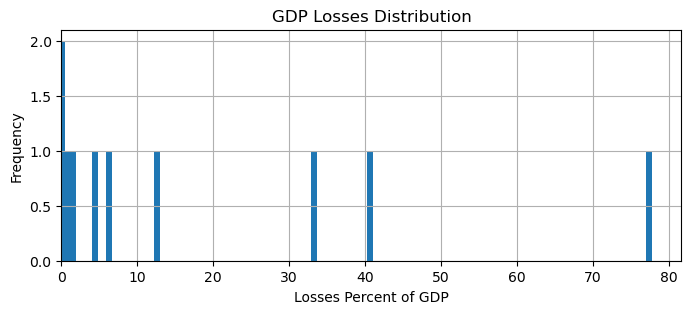

In [52]:
plt.figure(figsize=(8, 3))
plt.bar(plotting_gdp_losses_dist_df['losses_per_gdp__total'], plotting_gdp_losses_dist_df['losses_percent_gdp_Freq'])
plt.xlim(0)
plt.xlabel('Losses Percent of GDP')
plt.ylabel('Frequency')
plt.title('GDP Losses Distribution')
plt.grid(True)
plt.show()

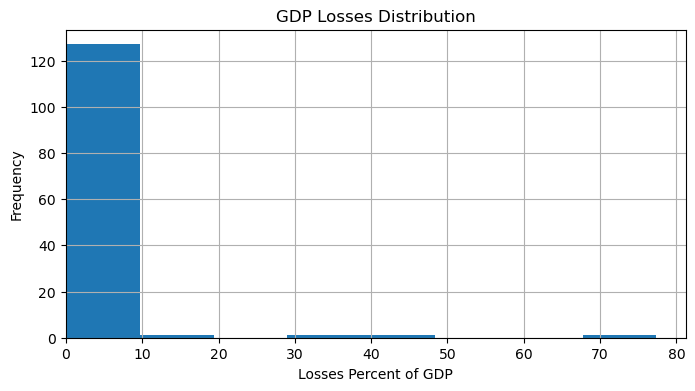

In [53]:
plt.figure(figsize=(8, 4))
plt.hist(plotting_gdp_losses_dist_df['losses_per_gdp__total'], bins = 8)
plt.xlim(0)
plt.xlabel('Losses Percent of GDP')
plt.ylabel('Frequency')
plt.title('GDP Losses Distribution')
plt.grid(True)
plt.show()

In [54]:
pd.set_option('display.max_rows', 10)

In [55]:
pd.set_option('display.max_rows', 10)

In [56]:
# Not a Normal Distribution so should FillNa with Median not Mean

In [57]:
climateCstats1 = climateCstats.loc[:,climateCstats.columns.isin(dfriskcleaner)]

In [58]:
print(climateCstats1.isna().sum())

country                      0
cri_rank                     0
cri_score                    0
fatalities_per_100k_rank     0
fatalities_per_100k_total    0
                            ..
losses_per_gdp__rank         0
losses_per_gdp__total        3
losses_usdm_ppp_rank         0
losses_usdm_ppp_total        0
rw_country_code              2
Length: 12, dtype: int64


In [59]:
climateCstats1[climateCstats1['rw_country_code'].isna()]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
139,Taiwan,51,56.17,75,0.05,65,11,53,0.1338,16,1472.523,NaN
175,Puerto Rico,110,97.00,114,0.00,114,0,81,0.0437,78,57.565,NaN


In [60]:
climateCstats['losses_per_gdp__total'].\
fillna(climateCstats['losses_per_gdp__total'].median(),\
       inplace = True)

In [61]:
climateCstats[['country','losses_per_gdp__total', 'losses_per_gdp__rank', ]].sort_values(by = 'losses_per_gdp__rank', ascending = False)

,country,losses_per_gdp__total,losses_per_gdp__rank
108,Morocco,0.0841,134
23,United Arab Emirates,0.0841,133
102,Malaysia,0.0841,132
0,Saudi Arabia,0.0001,131
173,Rwanda,0.0001,130
...,...,...,...
96,Kiribati,6.2500,5
159,Micronesia,12.5786,4
157,Tuvalu,33.3333,3
22,Vanuatu,40.6504,2


In [62]:
## Now lets try and play a bit

In [63]:
dfriskcleaner

,cartodb_id,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,rw_country_name
0,1,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,1.229,SAU,Saudi Arabia
1,2,Romania,61,61.50,112,0.01,102,1,16,0.6746,11,2797.884,ROU,Romania
2,3,Spain,69,66.33,74,0.05,47,22,86,0.0394,31,637.070,ESP,Spain
3,4,Slovenia,135,124.50,114,0.00,114,0,135,NaN,135,0.000,SVN,Slovenia
4,5,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,122,0.508,SSD,South Sudan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,178,Seychelles,135,124.50,114,0.00,114,0,135,NaN,135,0.000,SYC,Seychelles
178,179,Gambia,135,124.50,114,0.00,114,0,135,NaN,135,0.000,GMB,Gambia
179,180,Togo,131,114.33,104,0.01,102,1,123,0.0012,130,0.130,TGO,Togo
180,181,Trinidad and Tobago,135,124.50,114,0.00,114,0,135,NaN,135,0.000,TTO,Trinidad and Tobago


In [64]:
# O.G no rw_country_code
#CCScorrs=climateCstats.loc[: ,climateCstats.columns!='country'].corr()

In [65]:
nonstringcCsCols=climateCstats.columns[(climateCstats.columns!='country') & (climateCstats.columns!='rw_country_code')]

In [66]:
CCScorrs=climateCstats.loc[: ,nonstringcCsCols].corr()

In [67]:
CCScorrs.sort_values(by='cri_rank')

,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total
fatalities_total,-0.294600,-0.303723,-0.276405,0.057368,-0.379365,1.000000,-0.073879,-0.030448,-0.255253,0.596955
losses_usdm_ppp_total,-0.260193,-0.265942,-0.070144,-0.020647,-0.295593,0.596955,-0.172992,-0.024058,-0.364133,1.000000
fatalities_per_100k_total,-0.250283,-0.274380,-0.289317,1.000000,-0.125133,0.057368,-0.203815,0.833039,-0.081202,-0.020647
losses_per_gdp__total,-0.208756,-0.235593,-0.173022,0.833039,0.002193,-0.030448,-0.296654,1.000000,-0.068869,-0.024058
losses_usdm_ppp_rank,0.665639,0.669413,0.104737,-0.081202,0.369405,-0.255253,0.632993,-0.068869,1.000000,-0.364133
fatalities_rank,0.675155,0.675416,0.750934,-0.125133,1.000000,-0.379365,0.063516,0.002193,0.369405,-0.295593
losses_per_gdp__rank,0.738792,0.744733,0.226041,-0.203815,0.063516,-0.073879,1.000000,-0.296654,0.632993,-0.172992
fatalities_per_100k_rank,0.744208,0.747407,1.000000,-0.289317,0.750934,-0.276405,0.226041,-0.173022,0.104737,-0.070144
cri_score,0.994762,1.000000,0.747407,-0.274380,0.675416,-0.303723,0.744733,-0.235593,0.669413,-0.265942
cri_rank,1.000000,0.994762,0.744208,-0.250283,0.675155,-0.294600,0.738792,-0.208756,0.665639,-0.260193


In [68]:
CCScorrs.sort_values(by='fatalities_per_100k_rank')

,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total
fatalities_per_100k_total,-0.250283,-0.274380,-0.289317,1.000000,-0.125133,0.057368,-0.203815,0.833039,-0.081202,-0.020647
fatalities_total,-0.294600,-0.303723,-0.276405,0.057368,-0.379365,1.000000,-0.073879,-0.030448,-0.255253,0.596955
losses_per_gdp__total,-0.208756,-0.235593,-0.173022,0.833039,0.002193,-0.030448,-0.296654,1.000000,-0.068869,-0.024058
losses_usdm_ppp_total,-0.260193,-0.265942,-0.070144,-0.020647,-0.295593,0.596955,-0.172992,-0.024058,-0.364133,1.000000
losses_usdm_ppp_rank,0.665639,0.669413,0.104737,-0.081202,0.369405,-0.255253,0.632993,-0.068869,1.000000,-0.364133
losses_per_gdp__rank,0.738792,0.744733,0.226041,-0.203815,0.063516,-0.073879,1.000000,-0.296654,0.632993,-0.172992
cri_rank,1.000000,0.994762,0.744208,-0.250283,0.675155,-0.294600,0.738792,-0.208756,0.665639,-0.260193
cri_score,0.994762,1.000000,0.747407,-0.274380,0.675416,-0.303723,0.744733,-0.235593,0.669413,-0.265942
fatalities_rank,0.675155,0.675416,0.750934,-0.125133,1.000000,-0.379365,0.063516,0.002193,0.369405,-0.295593
fatalities_per_100k_rank,0.744208,0.747407,1.000000,-0.289317,0.750934,-0.276405,0.226041,-0.173022,0.104737,-0.070144


In [69]:
climateCstats.describe()

,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total
count,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000
mean,67.402985,66.493507,65.932836,0.705821,64.597015,117.947761,67.500000,1.485560,67.500000,1232.584948
std,38.808208,27.082875,36.559602,3.942533,35.571197,494.816140,38.826537,8.081389,38.826537,5192.199223
min,1.000000,12.170000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000100,1.000000,0.025000
25%,33.500000,45.795000,34.250000,0.020000,34.250000,2.000000,34.250000,0.017950,34.250000,12.785250
50%,67.500000,65.500000,67.500000,0.070000,66.500000,10.500000,67.500000,0.084100,67.500000,92.935500
75%,100.750000,87.582500,100.750000,0.197500,90.000000,44.500000,100.750000,0.270750,100.750000,471.462750
max,134.000000,121.500000,114.000000,43.660000,114.000000,4317.000000,134.000000,77.369400,134.000000,40077.222000


In [70]:
topproportionDanger=climateCstats.sort_values(by='fatalities_per_100k_total', ascending=False).head(20)
topdeaths=climateCstats.sort_values(by='fatalities_total', ascending=False).head(20)
proportional_deathRank=climateCstats.sort_values(by='fatalities_per_100k_rank')

In [71]:
proportional_deathRank.head(10)

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
137,Dominica,2,13.00,1,43.66,42,31,1,77.3694,32,611.219,DMA
15,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,72,80.642,BHS
159,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,86,38.491,FSM
85,France,16,33.33,4,5.19,2,3336,85,0.0401,20,1069.897,FRA
22,Vanuatu,5,20.33,5,4.09,65,11,2,40.6504,43,278.862,VUT
26,Belgium,46,52.83,6,3.66,5,410,108,0.0088,84,43.583,BEL
154,Guatemala,31,45.00,7,1.77,9,288,83,0.0419,81,52.921,GTM
165,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,34,500.073,MOZ
87,Afghanistan,28,43.33,9,1.14,6,364,73,0.0539,90,33.450,AFG
45,Ghana,8,23.33,10,0.99,10,267,35,0.2655,40,306.280,GHA


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Dominica'),
  Text(1, 0, 'The Bahamas'),
  Text(2, 0, 'Micronesia'),
  Text(3, 0, 'France'),
  Text(4, 0, 'Vanuatu'),
  Text(5, 0, 'Belgium'),
  Text(6, 0, 'Guatemala'),
  Text(7, 0, 'Mozambique'),
  Text(8, 0, 'Afghanistan'),
  Text(9, 0, 'Ghana')])

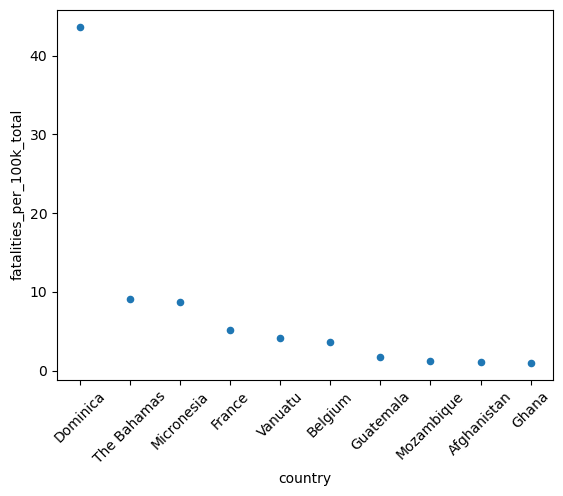

In [72]:
proportional_deathRank[proportional_deathRank['fatalities_per_100k_rank']<=10].plot(kind='scatter', x='country', y='fatalities_per_100k_total')
plt.xticks(rotation=45)
## got this below also

(array([-10.,   0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90.]),
 [Text(-10.0, 0, '−10'),
  Text(0.0, 0, '0'),
  Text(10.0, 0, '10'),
  Text(20.0, 0, '20'),
  Text(30.0, 0, '30'),
  Text(40.0, 0, '40'),
  Text(50.0, 0, '50'),
  Text(60.0, 0, '60'),
  Text(70.0, 0, '70'),
  Text(80.0, 0, '80'),
  Text(90.0, 0, '90')])

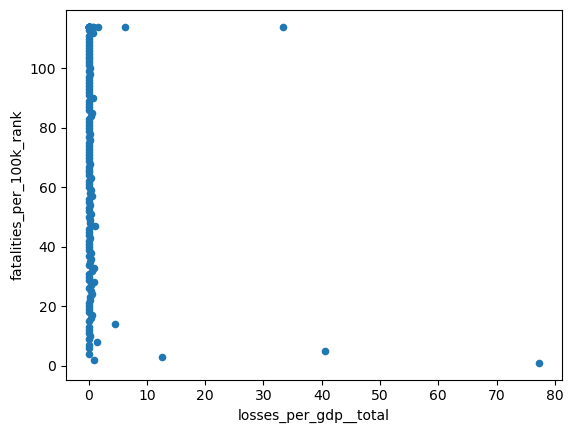

In [73]:
climateCstats.plot(kind='scatter', x='losses_per_gdp__total', y='fatalities_per_100k_rank')          ##- Similar/Clearer one down \/
plt.xticks(rotation=0)

In [74]:
proportional_deathRank.tail(10)

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
128,Armenia,113,98.33,114,0.0,114,0,74,0.0522,100,13.266,ARM
96,Kiribati,83,75.50,114,0.0,114,0,5,6.2500,101,12.625,KIR
32,Sweden,104,90.33,114,0.0,114,0,75,0.0497,50,235.938,SWE
33,Moldova,70,66.67,114,0.0,114,0,7,1.5444,44,277.066,MDA
10,Swaziland,128,109.33,114,0.0,114,0,98,0.0174,118,1.890,SWZ
122,Senegal,124,105.83,114,0.0,114,0,94,0.0220,105,8.071,SEN
126,Zambia,113,98.33,114,0.0,114,0,78,0.0456,92,28.500,ZMB
7,Serbia,83,75.50,114,0.0,114,0,33,0.2794,45,272.927,SRB
4,South Sudan,133,117.33,114,0.0,114,0,120,0.0021,122,0.508,SSD
76,Czech Republic,115,98.67,114,0.0,114,0,91,0.0270,68,91.282,CZE


(array([-5000.,     0.,  5000., 10000., 15000., 20000., 25000., 30000.,
        35000., 40000., 45000.]),
 [Text(-5000.0, 0, '−5000'),
  Text(0.0, 0, '0'),
  Text(5000.0, 0, '5000'),
  Text(10000.0, 0, '10000'),
  Text(15000.0, 0, '15000'),
  Text(20000.0, 0, '20000'),
  Text(25000.0, 0, '25000'),
  Text(30000.0, 0, '30000'),
  Text(35000.0, 0, '35000'),
  Text(40000.0, 0, '40000'),
  Text(45000.0, 0, '45000')])

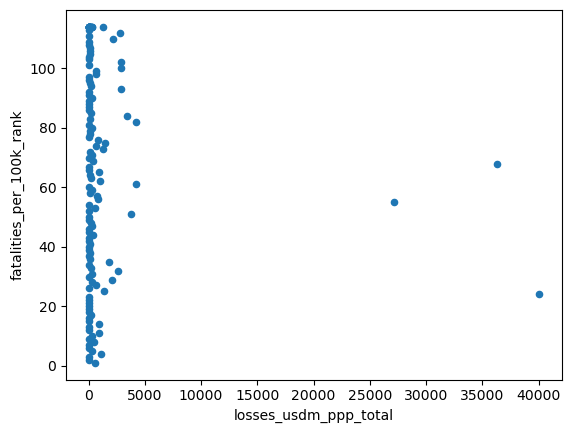

In [75]:
climateCstats.plot(kind='scatter', x='losses_usdm_ppp_total', y='fatalities_per_100k_rank')
plt.xticks(rotation=0)

In [76]:
CCScorrs.sort_values(by='fatalities_rank')     ##interesting. when including the unaffectedCs fatality rank is 5% more correlated with imports than exports (i wonder how much china has to do with this - i wonder if this is also related to why ppp matters more?)
## Ok Crazy. when you eliminate unaffectedCs, things really shuffle around. Imports 45% overtakes ppp losses 37%, then exports 35% then health 23%, then income at 18%

,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total
fatalities_total,-0.294600,-0.303723,-0.276405,0.057368,-0.379365,1.000000,-0.073879,-0.030448,-0.255253,0.596955
losses_usdm_ppp_total,-0.260193,-0.265942,-0.070144,-0.020647,-0.295593,0.596955,-0.172992,-0.024058,-0.364133,1.000000
fatalities_per_100k_total,-0.250283,-0.274380,-0.289317,1.000000,-0.125133,0.057368,-0.203815,0.833039,-0.081202,-0.020647
losses_per_gdp__total,-0.208756,-0.235593,-0.173022,0.833039,0.002193,-0.030448,-0.296654,1.000000,-0.068869,-0.024058
losses_per_gdp__rank,0.738792,0.744733,0.226041,-0.203815,0.063516,-0.073879,1.000000,-0.296654,0.632993,-0.172992
losses_usdm_ppp_rank,0.665639,0.669413,0.104737,-0.081202,0.369405,-0.255253,0.632993,-0.068869,1.000000,-0.364133
cri_rank,1.000000,0.994762,0.744208,-0.250283,0.675155,-0.294600,0.738792,-0.208756,0.665639,-0.260193
cri_score,0.994762,1.000000,0.747407,-0.274380,0.675416,-0.303723,0.744733,-0.235593,0.669413,-0.265942
fatalities_per_100k_rank,0.744208,0.747407,1.000000,-0.289317,0.750934,-0.276405,0.226041,-0.173022,0.104737,-0.070144
fatalities_rank,0.675155,0.675416,0.750934,-0.125133,1.000000,-0.379365,0.063516,0.002193,0.369405,-0.295593


In [77]:
CCScorrs.sort_values(by='fatalities_total')

,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total
fatalities_rank,0.675155,0.675416,0.750934,-0.125133,1.000000,-0.379365,0.063516,0.002193,0.369405,-0.295593
cri_score,0.994762,1.000000,0.747407,-0.274380,0.675416,-0.303723,0.744733,-0.235593,0.669413,-0.265942
cri_rank,1.000000,0.994762,0.744208,-0.250283,0.675155,-0.294600,0.738792,-0.208756,0.665639,-0.260193
fatalities_per_100k_rank,0.744208,0.747407,1.000000,-0.289317,0.750934,-0.276405,0.226041,-0.173022,0.104737,-0.070144
losses_usdm_ppp_rank,0.665639,0.669413,0.104737,-0.081202,0.369405,-0.255253,0.632993,-0.068869,1.000000,-0.364133
losses_per_gdp__rank,0.738792,0.744733,0.226041,-0.203815,0.063516,-0.073879,1.000000,-0.296654,0.632993,-0.172992
losses_per_gdp__total,-0.208756,-0.235593,-0.173022,0.833039,0.002193,-0.030448,-0.296654,1.000000,-0.068869,-0.024058
fatalities_per_100k_total,-0.250283,-0.274380,-0.289317,1.000000,-0.125133,0.057368,-0.203815,0.833039,-0.081202,-0.020647
losses_usdm_ppp_total,-0.260193,-0.265942,-0.070144,-0.020647,-0.295593,0.596955,-0.172992,-0.024058,-0.364133,1.000000
fatalities_total,-0.294600,-0.303723,-0.276405,0.057368,-0.379365,1.000000,-0.073879,-0.030448,-0.255253,0.596955


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'fatalities_total'),
  Text(1, 0, 'losses_usdm_ppp_total'),
  Text(2, 0, 'fatalities_per_100k_total'),
  Text(3, 0, 'losses_per_gdp__total'),
  Text(4, 0, 'losses_per_gdp__rank'),
  Text(5, 0, 'losses_usdm_ppp_rank'),
  Text(6, 0, 'cri_rank'),
  Text(7, 0, 'cri_score'),
  Text(8, 0, 'fatalities_per_100k_rank'),
  Text(9, 0, 'fatalities_rank')])

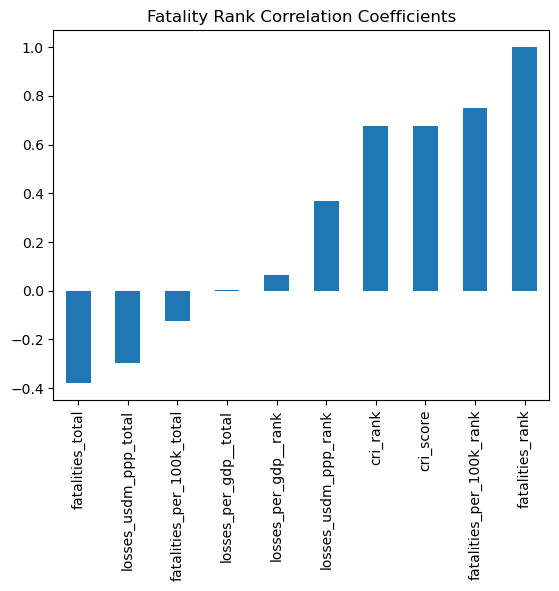

In [78]:
CCScorrs['fatalities_rank'].sort_values().plot(kind='bar')
plt.title('Fatality Rank Correlation Coefficients')
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'fatalities_rank'),
  Text(1, 0, 'cri_score'),
  Text(2, 0, 'cri_rank'),
  Text(3, 0, 'fatalities_per_100k_rank'),
  Text(4, 0, 'losses_usdm_ppp_rank'),
  Text(5, 0, 'losses_per_gdp__rank'),
  Text(6, 0, 'losses_per_gdp__total'),
  Text(7, 0, 'fatalities_per_100k_total'),
  Text(8, 0, 'losses_usdm_ppp_total'),
  Text(9, 0, 'fatalities_total')])

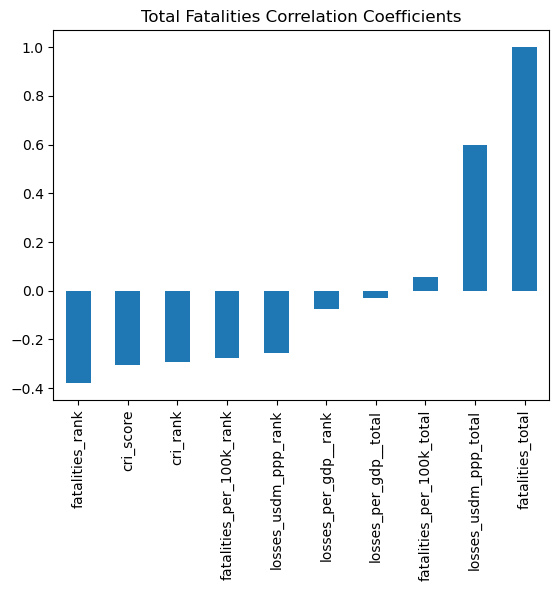

In [79]:
CCScorrs['fatalities_total'].sort_values().plot(kind='bar')
plt.title('Total Fatalities Correlation Coefficients')
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'fatalities_per_100k_total'),
  Text(1, 0, 'fatalities_total'),
  Text(2, 0, 'losses_per_gdp__total'),
  Text(3, 0, 'losses_usdm_ppp_total'),
  Text(4, 0, 'losses_usdm_ppp_rank'),
  Text(5, 0, 'losses_per_gdp__rank'),
  Text(6, 0, 'cri_rank'),
  Text(7, 0, 'cri_score'),
  Text(8, 0, 'fatalities_rank'),
  Text(9, 0, 'fatalities_per_100k_rank')])

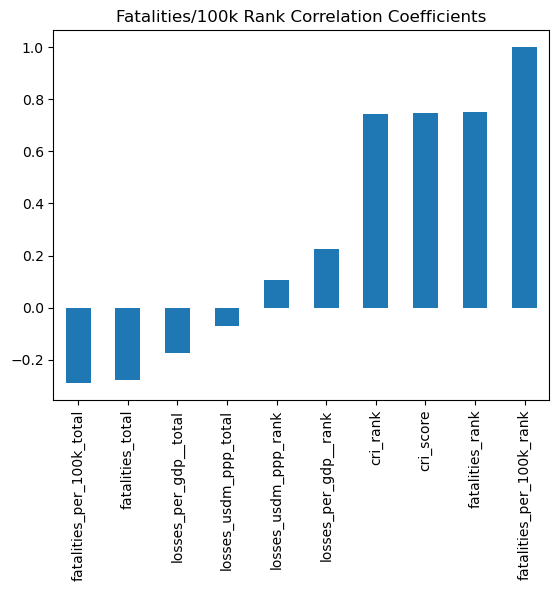

In [80]:
CCScorrs['fatalities_per_100k_rank'].sort_values().plot(kind='bar')
plt.title('Fatalities/100k Rank Correlation Coefficients')
plt.xticks(rotation=90)
#Hmm the fatalities_per_100k_total is not super correlated with its rank :/ I guess thats probably in large part due to lots of repeated values, and the inconcsistancy of rank placement (the necessary total deaths required to move up a rank)
####Ok so things really switch around when you eliminate unaffectedCs. income/pers becomes super correlated; interestingly GDP/cap 24% correlates and a LITTLE bit MORE than gdp losses a few steps below 'exporters' which are are 2x more rep than importers; 
#\- so these countries should be thinking about switching to import based economies (self-sufficiency in these cases is bad move as eratic weather will mess it up but would be good to find more datasets on airable land; and how many agricultural exporters are less affected)./
#

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'fatalities_per_100k_rank'),
  Text(1, 0, 'cri_score'),
  Text(2, 0, 'cri_rank'),
  Text(3, 0, 'losses_per_gdp__rank'),
  Text(4, 0, 'fatalities_rank'),
  Text(5, 0, 'losses_usdm_ppp_rank'),
  Text(6, 0, 'losses_usdm_ppp_total'),
  Text(7, 0, 'fatalities_total'),
  Text(8, 0, 'losses_per_gdp__total'),
  Text(9, 0, 'fatalities_per_100k_total')])

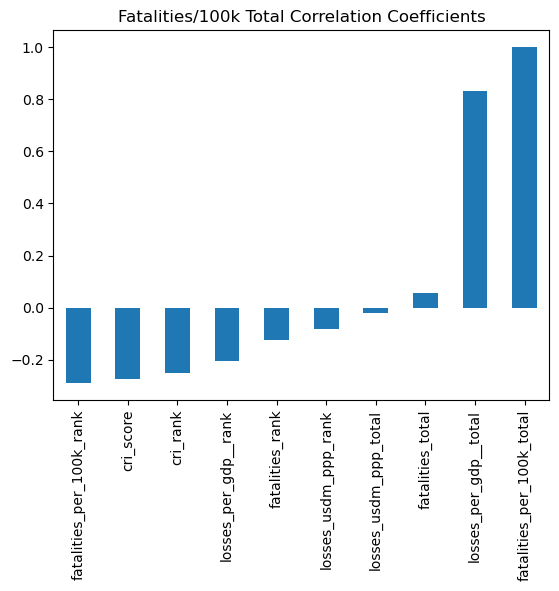

In [81]:
CCScorrs['fatalities_per_100k_total'].sort_values().plot(kind='bar')
plt.title('Fatalities/100k Total Correlation Coefficients')
plt.xticks(rotation=90)
## Ok so this is super interesting because a) its super different to 'per/100k total' and b) because by far and away it's strongest correlation is with GDP losses.      mmm no no no exactly the opposite /100k inhabitants doesnt mean in the region i dont think; it means in the country. (so maybe time to question if gdp unit % is the right metric/ maybe this makes sense because of crop failure or internal business collapse as a result???)      >I would expect that both of these can be explained by the probability that lots of countries suffering big GDP losses are ones with big GDPs/big economies and these often have smaller populations. Therefore impying a correlation NOT a causation. This might be supported by how insignificant 'gdp_losses_RANK' is (the gap in significance implying vast gaps in the size of losses) and also the above graph on 'fatalities/100k RANKS' showing marginaly higher 'GDP losses Rank/total' significance to 'ppp losses Rank/total', either implying that these small population countries with big economies and big economic losses were quite concentrated/clustered together (strong correlations between totals, fair correlation the second ranks get involved), or that a select few countries big population countries with massive economies/econ losses, suffered huge losses of life. In either case implies focussed clustering? 
## wanna look at the size of the gdp losses by country,
## wanna look into GDP/GNI (not just per cap) and economy sizes,  and  population sizes also, maybe landmass and usable landmass,
## also may wanna look at comparing this on a graph with ppplosses and seeing who's who 

In [82]:
climateCstats['losses_per_gdp__total'].dtype

dtype('float64')

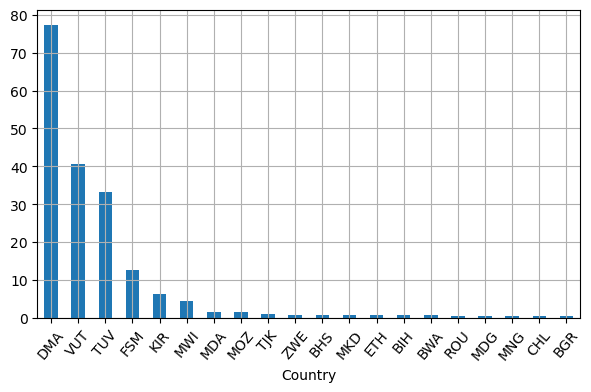

In [83]:
##  Cool so time to look at the size of some of these losses. and who
## nb - if a country enters droubt and needs to start importing more food would decrease ppp same if a currency value decreases.
climateCstats.sort_values(by='losses_per_gdp__total', ascending=False).head(20).plot(kind='bar', x='rw_country_code', y='losses_per_gdp__total', figsize = (7, 4))
plt.xticks(rotation=50)
plt.xlabel('Country')
plt.grid(True)
plt.legend().set_visible(False)

plt.show()

(array([], dtype=float64), [])

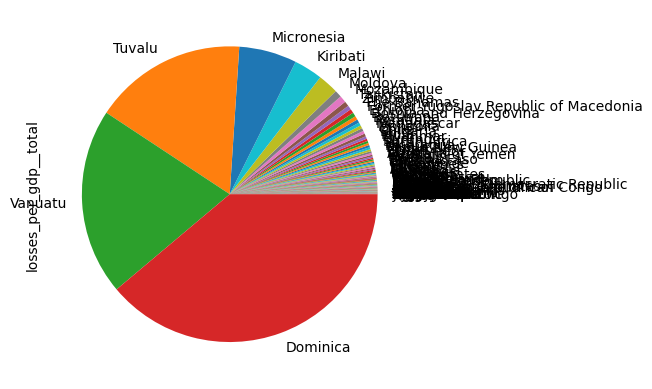

In [84]:
climateCstats.set_index('country').sort_values(by='losses_per_gdp__total')['losses_per_gdp__total'].plot(kind='pie')
plt.xticks(rotation=45)

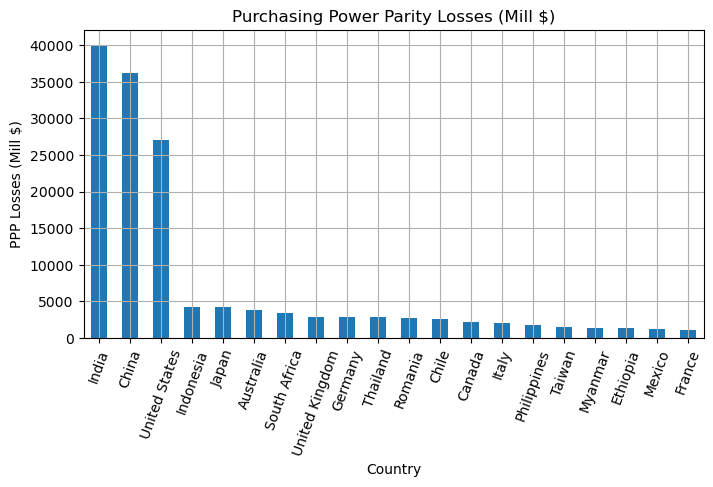

In [85]:
climateCstats.sort_values(by='losses_usdm_ppp_total', ascending=False).head(20).plot(kind='bar', x='country', y='losses_usdm_ppp_total', figsize = (8, 4))
plt.title('Purchasing Power Parity Losses (Mill $)')
plt.ylabel('PPP Losses (Mill $)')
plt.xlabel('Country')
plt.grid(True)
plt.legend().set_visible(False)
plt.xticks(rotation=70)
plt.show()
#UK will have been affected by Brexit here.

In [86]:
MeanPPPlosses = round(climateCstats['losses_usdm_ppp_total'].mean(), 2)
MedianPPPlosses = round(climateCstats['losses_usdm_ppp_total'].median(), 2)
print(f"Mean PPP losses (USDm): {MeanPPPlosses}"),\
print(f'Median PPP losses (USDm): {MedianPPPlosses}')

Mean PPP losses (USDm): 1232.58
Median PPP losses (USDm): 92.94


(None, None)

C:\Users\OWNER\AppData\Local\Temp\ipykernel_14744\3998862411.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  GraphingDF['pie_label'].iloc[5:] = 'Other'


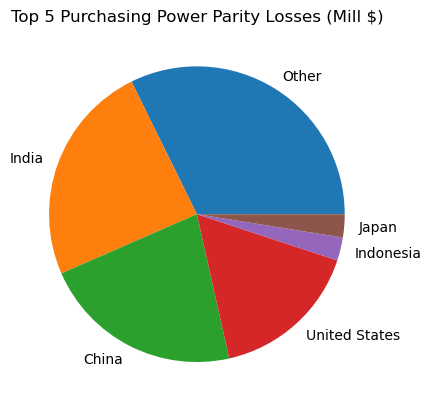

In [87]:
GraphingDF = climateCstats.set_index('country').sort_values(by='losses_usdm_ppp_total', ascending=False)#['losses_usdm_ppp_total']#.head(20)
GraphingDF['pie_label'] = GraphingDF.index
GraphingDF['pie_label'].iloc[5:] = 'Other'
#GraphingDF
GraphingDF.groupby('pie_label')['losses_usdm_ppp_total'].sum().sort_values(ascending = False).plot(kind ='pie',)
plt.ylabel('')
plt.title('Top 5 Purchasing Power Parity Losses (Mill $)')
plt.show()

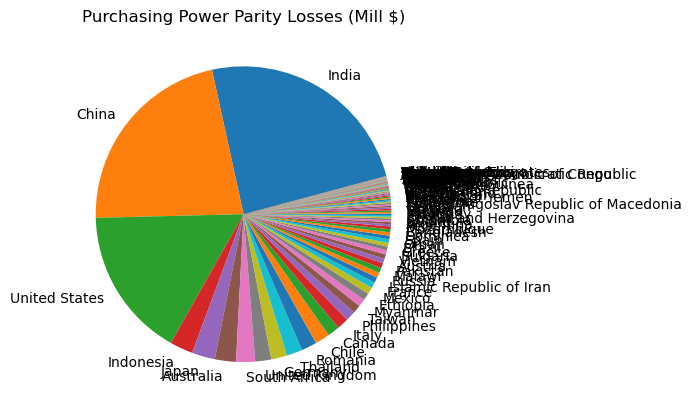

In [88]:
GraphingDF = climateCstats.set_index('country').sort_values(by='losses_usdm_ppp_total', ascending=False)['losses_usdm_ppp_total']#.head(20)
GraphingDF.plot(kind='pie', startangle = 15)
plt.ylabel('')
plt.title('Purchasing Power Parity Losses (Mill $)')
plt.show()

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'India'),
  Text(1, 0, 'France'),
  Text(2, 0, 'Pakistan'),
  Text(3, 0, 'China'),
  Text(4, 0, 'Belgium'),
  Text(5, 0, 'Afghanistan'),
  Text(6, 0, 'Mozambique'),
  Text(7, 0, 'United States'),
  Text(8, 0, 'Guatemala'),
  Text(9, 0, 'Ghana')])

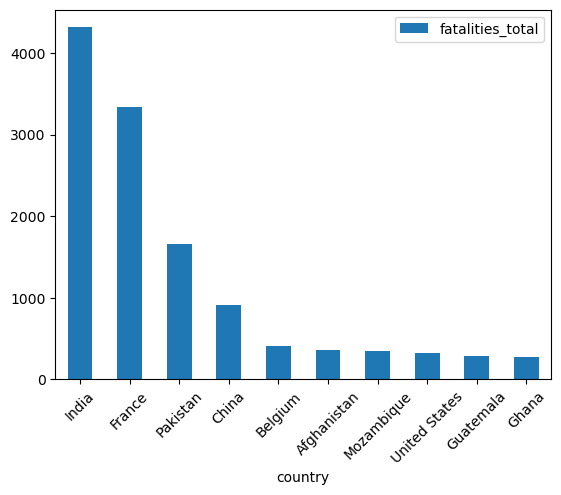

In [89]:
climateCstats.sort_values(by='fatalities_total', ascending=False).head(10).plot(kind='bar', x='country', y='fatalities_total')
plt.xticks(rotation=45)

(array([], dtype=float64), [])

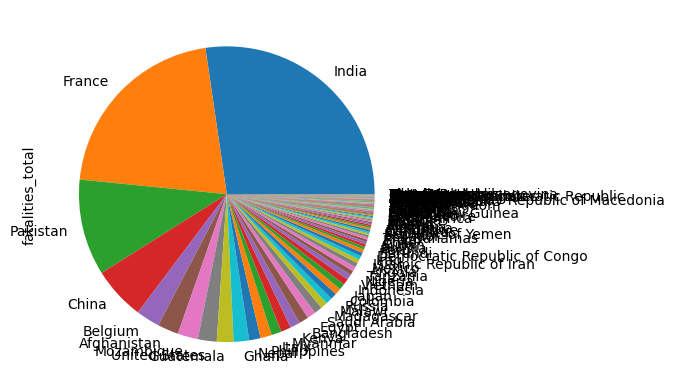

In [90]:
climateCstats.set_index('country').sort_values(by='fatalities_total', ascending=False)['fatalities_total'].plot(kind='pie')
plt.xticks(rotation=45)

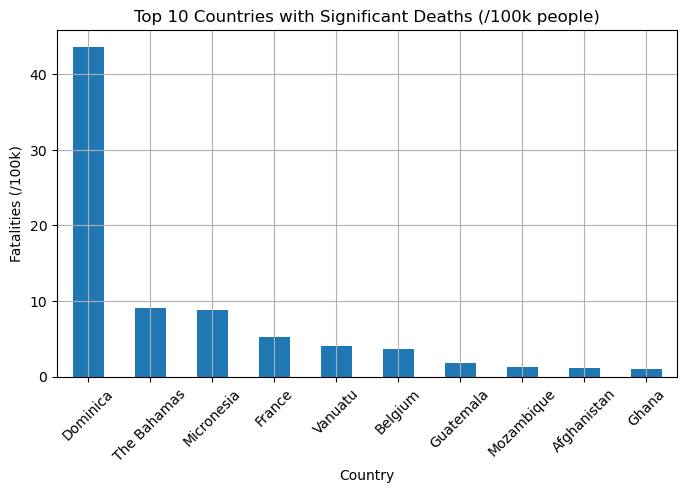

In [91]:
graphingDF = climateCstats.sort_values(by='fatalities_per_100k_total', ascending=False).head(10)
graphingDF.plot(kind='bar', x='country', y='fatalities_per_100k_total', figsize=(8, 4.5))
plt.xticks(rotation=45)
plt.xlabel('Country')
plt.ylabel('Fatalities (/100k)')
plt.grid(True)
plt.legend().set_visible(False)
plt.title('Top 10 Countries with Significant Deaths (/100k people)')
plt.show()

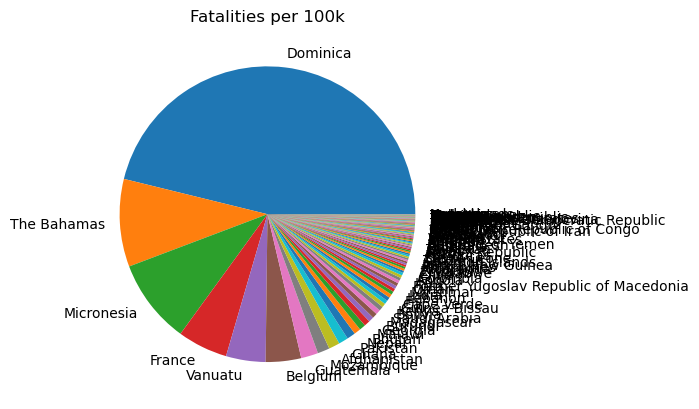

In [92]:
climateCstats.set_index('country').sort_values(by='fatalities_per_100k_total', ascending=False)['fatalities_per_100k_total'].plot(kind='pie')
plt.title('Fatalities per 100k')
plt.legend().set_visible(False)
plt.ylabel('')
plt.show()

(array([-10.,   0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90.]),
 [Text(-10.0, 0, '−10'),
  Text(0.0, 0, '0'),
  Text(10.0, 0, '10'),
  Text(20.0, 0, '20'),
  Text(30.0, 0, '30'),
  Text(40.0, 0, '40'),
  Text(50.0, 0, '50'),
  Text(60.0, 0, '60'),
  Text(70.0, 0, '70'),
  Text(80.0, 0, '80'),
  Text(90.0, 0, '90')])

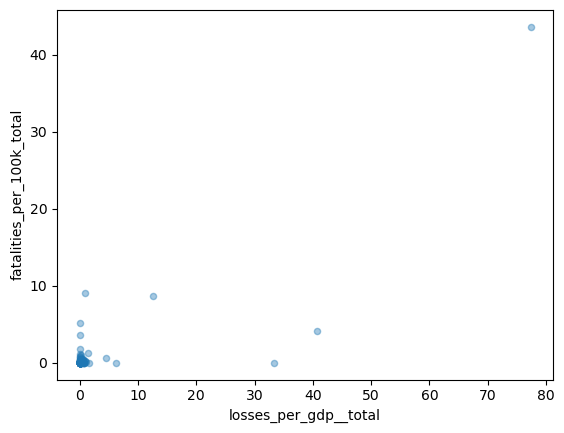

In [93]:
climateCstats.sort_values(by='fatalities_per_100k_total', ascending=True).plot(kind='scatter', x='losses_per_gdp__total', y='fatalities_per_100k_total', alpha=0.4)
plt.xticks(rotation=0)

C:\Users\OWNER\AppData\Local\Temp\ipykernel_14744\1127979068.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  climateCstats.sort_values(by='losses_usdm_ppp_total', ascending=True)[climateCstats['fatalities_total']>10].plot(kind='scatter', x='losses_usdm_ppp_total', y='fatalities_total', alpha=0.4)


(array([-5000.,     0.,  5000., 10000., 15000., 20000., 25000., 30000.,
        35000., 40000., 45000.]),
 [Text(-5000.0, 0, '−5000'),
  Text(0.0, 0, '0'),
  Text(5000.0, 0, '5000'),
  Text(10000.0, 0, '10000'),
  Text(15000.0, 0, '15000'),
  Text(20000.0, 0, '20000'),
  Text(25000.0, 0, '25000'),
  Text(30000.0, 0, '30000'),
  Text(35000.0, 0, '35000'),
  Text(40000.0, 0, '40000'),
  Text(45000.0, 0, '45000')])

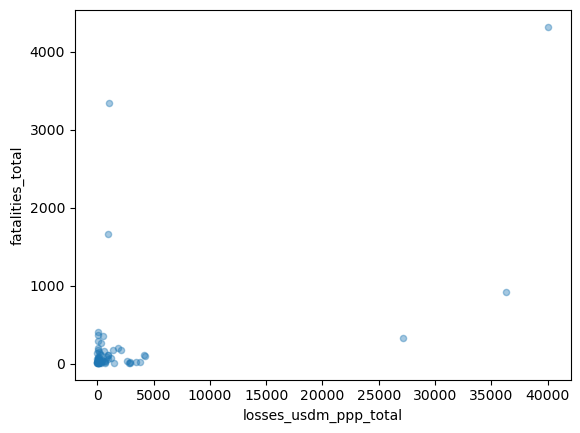

In [94]:
climateCstats.sort_values(by='losses_usdm_ppp_total', ascending=True)[climateCstats['fatalities_total']>10].plot(kind='scatter', x='losses_usdm_ppp_total', y='fatalities_total', alpha=0.4)
plt.xticks(rotation=0)

In [95]:
topdeaths

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
89,India,4,15.33,24,0.33,1,4317,21,0.5011,1,40077.222,IND
85,France,16,33.33,4,5.19,2,3336,85,0.0401,20,1069.897,FRA
117,Pakistan,11,28.17,11,0.88,3,1663,60,0.0974,24,907.122,PAK
69,China,23,38.00,68,0.07,4,916,43,0.1842,2,36272.535,CHN
26,Belgium,46,52.83,6,3.66,5,410,108,0.0088,84,43.583,BEL
...,...,...,...,...,...,...,...,...,...,...,...,...
130,Bangladesh,35,46.17,53,0.11,16,168,61,0.0959,33,556.442,BGD
31,Egypt,58,59.67,41,0.16,17,145,100,0.0153,59,160.896,EGY
0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,1.229,SAU
101,Madagascar,8,23.33,17,0.49,19,118,17,0.6417,53,228.038,MDG


In [96]:
climateCstats[climateCstats['country'].isin(topproportionDanger['country']) & climateCstats['country'].isin(topdeaths['country'])]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,1.229,SAU
26,Belgium,46,52.83,6,3.66,5,410,108,0.0088,84,43.583,BEL
45,Ghana,8,23.33,10,0.99,10,267,35,0.2655,40,306.280,GHA
85,France,16,33.33,4,5.19,2,3336,85,0.0401,20,1069.897,FRA
87,Afghanistan,28,43.33,9,1.14,6,364,73,0.0539,90,33.450,AFG
...,...,...,...,...,...,...,...,...,...,...,...,...
101,Madagascar,8,23.33,17,0.49,19,118,17,0.6417,53,228.038,MDG
117,Pakistan,11,28.17,11,0.88,3,1663,60,0.0974,24,907.122,PAK
154,Guatemala,31,45.00,7,1.77,9,288,83,0.0419,81,52.921,GTM
163,Nepal,42,51.33,12,0.69,11,198,90,0.0299,93,20.981,NPL


In [97]:
climateCstats.sort_values(by='fatalities_total', ascending=False).head(10)

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
89,India,4,15.33,24,0.33,1,4317,21,0.5011,1,40077.222,IND
85,France,16,33.33,4,5.19,2,3336,85,0.0401,20,1069.897,FRA
117,Pakistan,11,28.17,11,0.88,3,1663,60,0.0974,24,907.122,PAK
69,China,23,38.00,68,0.07,4,916,43,0.1842,2,36272.535,CHN
26,Belgium,46,52.83,6,3.66,5,410,108,0.0088,84,43.583,BEL
87,Afghanistan,28,43.33,9,1.14,6,364,73,0.0539,90,33.450,AFG
165,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,34,500.073,MOZ
21,United States,21,36.17,55,0.10,8,325,48,0.1504,3,27122.700,USA
154,Guatemala,31,45.00,7,1.77,9,288,83,0.0419,81,52.921,GTM
45,Ghana,8,23.33,10,0.99,10,267,35,0.2655,40,306.280,GHA


In [98]:
climateCstats.sort_values(by='fatalities_per_100k_total', ascending=False).head(10)
## might be a good point to fid the mean gdp (-outliers)
### biggest gdp losses naturally just means big economic collapse, 

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
137,Dominica,2,13.00,1,43.66,42,31,1,77.3694,32,611.219,DMA
15,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,72,80.642,BHS
159,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,86,38.491,FSM
85,France,16,33.33,4,5.19,2,3336,85,0.0401,20,1069.897,FRA
22,Vanuatu,5,20.33,5,4.09,65,11,2,40.6504,43,278.862,VUT
26,Belgium,46,52.83,6,3.66,5,410,108,0.0088,84,43.583,BEL
154,Guatemala,31,45.00,7,1.77,9,288,83,0.0419,81,52.921,GTM
165,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,34,500.073,MOZ
87,Afghanistan,28,43.33,9,1.14,6,364,73,0.0539,90,33.450,AFG
45,Ghana,8,23.33,10,0.99,10,267,35,0.2655,40,306.280,GHA


In [99]:
topPPPlosses=climateCstats.sort_values(by='losses_usdm_ppp_total', ascending=False).head(20)
climateCstats[climateCstats['country'].isin(topPPPlosses['country']) & climateCstats['country'].isin(topdeaths['country'])]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
21,United States,21,36.17,55,0.10,8,325,48,0.1504,3,27122.700,USA
50,Italy,19,34.83,29,0.29,13,174,62,0.0958,14,2084.897,ITA
69,China,23,38.00,68,0.07,4,916,43,0.1842,2,36272.535,CHN
85,France,16,33.33,4,5.19,2,3336,85,0.0401,20,1069.897,FRA
89,India,4,15.33,24,0.33,1,4317,21,0.5011,1,40077.222,IND
166,Myanmar,6,20.83,25,0.33,14,173,22,0.4786,17,1359.654,MMR
167,Philippines,13,28.83,35,0.19,12,196,38,0.2417,15,1797.737,PHL


In [100]:
climateCstats[climateCstats['country']=='Germany']

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
82,Germany,64,63.83,93,0.02,52,18,68,0.0743,9,2869.197,DEU


In [101]:
print(climateCstats['country'].values)

['Saudi Arabia' 'Romania' 'Spain' 'South Sudan' 'Sierra Leone'
 'South Africa' 'Serbia' 'Slovak Republic' 'Solomon Islands' 'Swaziland'
 'Turkey' 'Tanzania' 'Thailand' 'The Bahamas' 'Uganda' 'Vietnam'
 'United Kingdom' 'Uruguay' 'United States' 'Vanuatu'
 'United Arab Emirates' 'Ukraine' 'Bolivia' 'Belgium' "Cote d'Ivoire"
 'Croatia' 'Sri Lanka' 'Ecuador' 'Egypt' 'Sweden' 'Moldova' 'Mexico'
 'Australia' 'Angola' 'Greece' 'Guinea' 'Honduras' 'Ghana' 'Hungary'
 'Islamic Republic of Iran' 'Iraq' 'Indonesia' 'Italy' 'Ireland' 'Albania'
 'Algeria' 'Austria' 'Argentina' 'Bosnia and Herzegovina' 'Cambodia'
 'Canada' 'Bulgaria' 'Brazil' 'Burkina Faso' 'Cameroon' 'China' 'Chile'
 'Colombia' 'Denmark' 'Democratic Republic of Congo' 'Dominican Republic'
 'Czech Republic' 'Ethiopia' 'Fiji' 'Germany' 'Georgia' 'France'
 'Guinea-Bissau' 'Afghanistan' 'Iceland' 'India' 'Kenya'
 'Lao People’s Democratic Republic' 'Kazakhstan' 'Kyrgyz Republic' 'Japan'
 'Kiribati' 'Malawi' 'Madagascar' 'Malaysia' 'Libe

In [102]:
#### Ok so the combination of extreme outliers, and the potential semi mix of developing and developed nations in both affected\
# and unaffected countries(?); combined with the clear relevance of income, exporter vs importer status, gdp losses, gdp, ppp losses; and the way these /
# flip in the significance of their correlation to fatalities(rank/total) and fatalities_per_100k(rank/total) raises questions about the relevances of/
# the sizes of the economies, and populations; their key industries; and the sizes of the nations (and their usable land). Hypothesis: large climate events/
#impact small countries and their small populations by wiping out all businesses (exports?) and high concentrations of people; whereas such events in/
#big (land, pop, econ(?)) countries wipe out lots of people not relative to their size; and they dont destroy as many businesses/
#(particularly import/non-agroexport based ones) so dont destroy gdp as much but does impact the availability of domestic products so impacts PPP./
#In exploring this vein:        I also want to check out the ratio of impacts on ppp losses between high fat/100k Cs compared to high fat Cs./
#One might expect similar proportions of impact if this hyp is correct, unless these high fat/100k Cs are actually already barely producing/
#for domestic circulation and so a lack of self-provisions is nothing new really? In this vein then, defo more info needed on key industries /
#(and maybe self sufficiency), landmass/use, the types of climate events impacting places also, maybe causes of death.  Stay Flexi though. might evolve differently

In [103]:
#Cool So now for some Cleaning. 
#NB make sure each USD is in 2015 USDs or current ones.

In [104]:
###miiiiiight be useful for changing column names but apart from that idk.   Ignore until much later though

#WBlotsdirty=pd.read_excel('WorldBank Tons of data 2017.xlsx')

#wbolotsdirtycols=WBlotsdirty['Series Name'].values

#wbotestcols=pd.read_csv('Test with some cols.csv')

#smalltestcols=list(wbotestcols.columns)

#WBlotsdirty[WBlotsdirty['Series Name'].isin(smalltestcols)]

#bigWBOlist=list(WBlotsdirty['Series Name'].unique())

#inbigwbo=[]
#onlylittlewbo=[]
#for column in wbotestcols.columns:
#    column_name = str(column)  # Convert column name to string
#    for substring in bigWBOlist:
#        if isinstance(substring, float):
#            continue  # Skip if the substring is a float
#        if substring in column_name:
#            inbigwbo.append(column_name)
#            break  # Stop searching for substrings once a match is found
#    else:
#        onlylittlewbo.append(column_name)

#onlylittlewbo   

In [105]:
WBBigDataDirty=pd.read_csv('Tons of data WorldBank 2015-2017.csv', encoding='utf-8')
WBBigDataDirty.head(2)

,Time,Time Code,Country Name,Country Code,Agricultural irrigated land (% of total agricultural land) [AG.LND.IRIG.AG.ZS],Agricultural land (% of land area) [AG.LND.AGRI.ZS],Agricultural land (sq. km) [AG.LND.AGRI.K2],"Agricultural machinery, tractors [AG.AGR.TRAC.NO]","Agricultural machinery, tractors per 100 sq. km of arable land [AG.LND.TRAC.ZS]",Agricultural raw materials exports (% of merchandise exports) [TX.VAL.AGRI.ZS.UN],...,Refugee population by country or territory of asylum [SM.POP.REFG],"Annual freshwater withdrawals, total (% of internal resources) [ER.H2O.FWTL.ZS]",GDP growth (annual %) [NY.GDP.MKTP.KD.ZG],GDP per capita growth (annual %) [NY.GDP.PCAP.KD.ZG],GNI per capita growth (annual %) [NY.GNP.PCAP.KD.ZG],Population growth (annual %) [SP.POP.GROW],Poverty headcount ratio at societal poverty line (% of population) [SI.POV.SOPO],"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day) [SI.SPR.PC40]","Survey mean consumption or income per capita, total population (2017 PPP $ per day) [SI.SPR.PCAP]",Net primary income (Net income from abroad) (current US$) [NY.GSR.NFCY.CD]
0,2015,YR2015,Afghanistan,AFG,5.710894223,58.12366803,379100,..,..,14.79906667,...,257553,43.01590668,1.45131466,-1.666416415,..,3.121341229,..,..,..,115277794.5
1,2015,YR2015,Albania,ALB,13.45482415,42.85766423,11743,..,..,2.305902254,...,109,3.420074349,2.218726375,2.516827054,2.776762534,-0.291205787,19.7,..,..,134958280.6


In [106]:
WBBigDataDirty.shape

(803, 183)

In [107]:
WBcolumnnames=list(WBBigDataDirty.columns)
WBcolumnnames2=WBcolumnnames.copy()
for columns in WBcolumnnames2:
    if ' [' in columns:
        undesirable=WBcolumnnames2.index(columns)
        columns=columns.split(sep=' [')
        WBcolumnnames2[undesirable]=columns[0]
    else:
        continue
print(WBcolumnnames2)

['Time', 'Time Code', 'Country Name', 'Country Code', 'Agricultural irrigated land (% of total agricultural land)', 'Agricultural land (% of land area)', 'Agricultural land (sq. km)', 'Agricultural machinery, tractors', 'Agricultural machinery, tractors per 100 sq. km of arable land', 'Agricultural raw materials exports (% of merchandise exports)', 'Agricultural raw materials imports (% of merchandise imports)', 'Net trade in goods and services (BoP, current US$)', 'Merchandise trade (% of GDP)', 'Logistics performance index: Quality of trade and transport-related infrastructure (1=low to 5=high)', 'Trade (% of GDP)', 'Trade in services (% of GDP)', 'Textiles and clothing (% of value added in manufacturing)', 'Price level ratio of PPP conversion factor (GDP) to market exchange rate', 'Computer, communications and other services (% of commercial service exports)', 'Computer, communications and other services (% of commercial service imports)', 'Customs and other import duties (% of tax 

In [108]:
WBcolumnnames2[4]

'Agricultural irrigated land (% of total agricultural land)'

In [109]:
WBBigDataDirty.columns=WBcolumnnames2

In [110]:
WBBigDataDirty[WBBigDataDirty['Time'].isna()]

,Time,Time Code,Country Name,Country Code,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),Agricultural land (sq. km),"Agricultural machinery, tractors","Agricultural machinery, tractors per 100 sq. km of arable land",Agricultural raw materials exports (% of merchandise exports),...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total (% of internal resources)",GDP growth (annual %),GDP per capita growth (annual %),GNI per capita growth (annual %),Population growth (annual %),Poverty headcount ratio at societal poverty line (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)",Net primary income (Net income from abroad) (current US$)
798,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
799,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [111]:
WBBigDataDirty=WBBigDataDirty.drop(range(798,803), axis=0)

In [112]:
WBBigDataDirty

,Time,Time Code,Country Name,Country Code,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),Agricultural land (sq. km),"Agricultural machinery, tractors","Agricultural machinery, tractors per 100 sq. km of arable land",Agricultural raw materials exports (% of merchandise exports),...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total (% of internal resources)",GDP growth (annual %),GDP per capita growth (annual %),GNI per capita growth (annual %),Population growth (annual %),Poverty headcount ratio at societal poverty line (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)",Net primary income (Net income from abroad) (current US$)
0,2015,YR2015,Afghanistan,AFG,5.710894223,58.12366803,379100,..,..,14.79906667,...,257553,43.01590668,1.45131466,-1.666416415,..,3.121341229,..,..,..,115277794.5
1,2015,YR2015,Albania,ALB,13.45482415,42.85766423,11743,..,..,2.305902254,...,109,3.420074349,2.218726375,2.516827054,2.776762534,-0.291205787,19.7,..,..,134958280.6
2,2015,YR2015,Algeria,DZA,2.931419515,17.40592281,414564,..,..,0.028116734,...,94176,79.61234107,3.700000001,1.646657261,1.641727813,1.999946051,..,..,..,-4312025235
3,2015,YR2015,American Samoa,ASM,..,13.6,27.2,..,..,..,...,..,..,3.149606299,4.854442301,..,-1.639270188,..,..,..,..
4,2015,YR2015,Andorra,AND,..,40.0212766,188.1,..,..,1.58693664,...,..,..,1.434140395,1.257416013,..,0.17437769,..,..,..,..
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
793,2017,YR2017,Sub-Saharan Africa,SSF,..,43.81730406,10468340.43,..,..,2.960895231,...,6327923,3.283787139,2.444258735,-0.225865682,..,2.676168964,47.8,..,..,..
794,2017,YR2017,Sub-Saharan Africa (excluding high income),SSA,..,43.81808287,10468324.93,..,..,2.965405422,...,6327923,3.283787139,2.443967915,-0.226277201,..,2.676300976,..,..,..,..
795,2017,YR2017,Sub-Saharan Africa (IDA & IBRD countries),TSS,..,43.81730406,10468340.43,..,..,2.960895231,...,6327923,3.283787139,2.444258735,-0.225865682,..,2.676168964,..,..,..,..
796,2017,YR2017,Upper middle income,UMC,..,34.65346308,19010295.2,..,..,1.386205136,...,6947336,6.107143235,5.205581624,4.422470796,4.550578475,0.74994474,24.7,..,..,..


In [113]:
WBBigDataDirty[WBBigDataDirty['Agricultural machinery, tractors']!='..']
WBBigDataDirty[WBBigDataDirty['Agricultural machinery, tractors per 100 sq. km of arable land']!='..']
#WBBigDataDirty[WBBigDataDirty['Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)']!='..']
#WBBigDataDirty[WBBigDataDirty['Agricultural irrigated land (% of total agricultural land)']!='..']

,Time,Time Code,Country Name,Country Code,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),Agricultural land (sq. km),"Agricultural machinery, tractors","Agricultural machinery, tractors per 100 sq. km of arable land",Agricultural raw materials exports (% of merchandise exports),...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total (% of internal resources)",GDP growth (annual %),GDP per capita growth (annual %),GNI per capita growth (annual %),Population growth (annual %),Poverty headcount ratio at societal poverty line (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)",Net primary income (Net income from abroad) (current US$)


In [114]:
WBBiGDataDropCols=['Time Code',]
for column in WBBigDataDirty.columns:
    if (WBBigDataDirty[column]=='..').all():
        WBBiGDataDropCols.append(column)
print(WBBiGDataDropCols)

['Time Code', 'Agricultural machinery, tractors', 'Agricultural machinery, tractors per 100 sq. km of arable land', 'Mortality rate attributed to household and ambient air pollution, age-standardized (per 100,000 population)', 'Droughts, floods, extreme temperatures (% of population, average 1990-2009)']


In [115]:
WBBigDataDirty=WBBigDataDirty.drop(WBBiGDataDropCols, axis=1)

In [116]:
### Changing NaNs

In [117]:
WBBigDataDirty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 798 entries, 0 to 797
Columns: 178 entries, Time to Net primary income (Net income from abroad) (current US$)
dtypes: object(178)
memory usage: 1.1+ MB


In [118]:
WBBigDataDirty['Agricultural land (% of land area)'].dtype

dtype('O')

In [119]:
WBBigDataDirty['Agricultural land (% of land area)'].values[0], \
type(WBBigDataDirty['Agricultural land (% of land area)'].values[0])

('58.12366803', str)

In [120]:
WBBigDataDirty.head()

,Time,Country Name,Country Code,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),Agricultural land (sq. km),Agricultural raw materials exports (% of merchandise exports),Agricultural raw materials imports (% of merchandise imports),"Net trade in goods and services (BoP, current US$)",Merchandise trade (% of GDP),...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total (% of internal resources)",GDP growth (annual %),GDP per capita growth (annual %),GNI per capita growth (annual %),Population growth (annual %),Poverty headcount ratio at societal poverty line (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)",Net primary income (Net income from abroad) (current US$)
0,2015,Afghanistan,AFG,5.710894223,58.12366803,379100,14.79906667,..,-7044964161,43.34641937,...,257553,43.01590668,1.45131466,-1.666416415,..,3.121341229,..,..,..,115277794.5
1,2015,Albania,ALB,13.45482415,42.85766423,11743,2.305902254,0.862938518,-1966180769,54.61561626,...,109,3.420074349,2.218726375,2.516827054,2.776762534,-0.291205787,19.7,..,..,134958280.6
2,2015,Algeria,DZA,2.931419515,17.40592281,414564,0.028116734,1.45755905,-25384908362,52.03663294,...,94176,79.61234107,3.700000001,1.646657261,1.641727813,1.999946051,..,..,..,-4312025235
3,2015,American Samoa,ASM,..,13.6,27.2,..,..,..,156.6121842,...,..,..,3.149606299,4.854442301,..,-1.639270188,..,..,..,..
4,2015,Andorra,AND,..,40.0212766,188.1,1.58693664,0.395745615,..,49.60782276,...,..,..,1.434140395,1.257416013,..,0.17437769,..,..,..,..


In [121]:
suspiciousEntry=[]
def FlowInt(entry):
    if '.' in entry:
        try:
            return float(entry) # Converting the string data to a float here
        except ValueError:
            if '..' in entry:
                return np.nan # Converting '..' to a numpy NaN here
            else:
                suspiciousEntry.append(entry)
                return entry # Accounting for unconsidered exceptions to both conditions here
    elif '.' not in entry:
        try:
            return int(entry) # Converting the string data to an integer
        except ValueError:
            return entry
    

In [122]:
WBBigDataDirty=WBBigDataDirty.applymap(FlowInt)
WBBigDataDirty

C:\Users\OWNER\AppData\Local\Temp\ipykernel_14744\3410138860.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  WBBigDataDirty=WBBigDataDirty.applymap(FlowInt)


,Time,Country Name,Country Code,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),Agricultural land (sq. km),Agricultural raw materials exports (% of merchandise exports),Agricultural raw materials imports (% of merchandise imports),"Net trade in goods and services (BoP, current US$)",Merchandise trade (% of GDP),...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total (% of internal resources)",GDP growth (annual %),GDP per capita growth (annual %),GNI per capita growth (annual %),Population growth (annual %),Poverty headcount ratio at societal poverty line (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)",Net primary income (Net income from abroad) (current US$)
0,2015,Afghanistan,AFG,5.710894,58.123668,379100.00,14.799067,NaN,-7.044964e+09,43.346419,...,257553.0,43.015907,1.451315,-1.666416,NaN,3.121341,NaN,NaN,NaN,1.152778e+08
1,2015,Albania,ALB,13.454824,42.857664,11743.00,2.305902,0.862939,-1.966181e+09,54.615616,...,109.0,3.420074,2.218726,2.516827,2.776763,-0.291206,19.7,NaN,NaN,1.349583e+08
2,2015,Algeria,DZA,2.931420,17.405923,414564.00,0.028117,1.457559,-2.538491e+10,52.036633,...,94176.0,79.612341,3.700000,1.646657,1.641728,1.999946,NaN,NaN,NaN,-4.312025e+09
3,2015,American Samoa,ASM,NaN,13.600000,27.20,NaN,NaN,NaN,156.612184,...,NaN,NaN,3.149606,4.854442,NaN,-1.639270,NaN,NaN,NaN,NaN
4,2015,Andorra,AND,NaN,40.021277,188.10,1.586937,0.395746,NaN,49.607823,...,NaN,NaN,1.434140,1.257416,NaN,0.174378,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
793,2017,Sub-Saharan Africa,SSF,NaN,43.817304,10468340.43,2.960895,1.029197,NaN,37.870668,...,6327923.0,3.283787,2.444259,-0.225866,NaN,2.676169,47.8,NaN,NaN,NaN
794,2017,Sub-Saharan Africa (excluding high income),SSA,NaN,43.818083,10468324.93,2.965405,1.031221,NaN,37.796019,...,6327923.0,3.283787,2.443968,-0.226277,NaN,2.676301,NaN,NaN,NaN,NaN
795,2017,Sub-Saharan Africa (IDA & IBRD countries),TSS,NaN,43.817304,10468340.43,2.960895,1.029197,NaN,37.870668,...,6327923.0,3.283787,2.444259,-0.225866,NaN,2.676169,NaN,NaN,NaN,NaN
796,2017,Upper middle income,UMC,NaN,34.653463,19010295.20,1.386205,2.579474,NaN,38.537738,...,6947336.0,6.107143,5.205582,4.422471,4.550578,0.749945,24.7,NaN,NaN,NaN


In [123]:
WBBigDataDirty['Time'] = pd.to_datetime(WBBigDataDirty['Time'], format = '%Y')
WBBigDataDirty['Time'] = WBBigDataDirty['Time'].dt.year
WBBigDataDirty['Time'].dtype

dtype('int32')

In [124]:
len(suspiciousEntry), suspiciousEntry[::7]

(39,
 ['Congo, Dem. Rep.',
  'St. Kitts and Nevis',
  'Congo, Rep.',
  'St. Lucia',
  'Egypt, Arab Rep.',
  'St. Martin (French part)'])

In [125]:
WBBigDataDirty[WBBigDataDirty['Country Name'].isin(suspiciousEntry)]

,Time,Country Name,Country Code,Agricultural irrigated land (% of total agricultural land),Agricultural land (% of land area),Agricultural land (sq. km),Agricultural raw materials exports (% of merchandise exports),Agricultural raw materials imports (% of merchandise imports),"Net trade in goods and services (BoP, current US$)",Merchandise trade (% of GDP),...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total (% of internal resources)",GDP growth (annual %),GDP per capita growth (annual %),GNI per capita growth (annual %),Population growth (annual %),Poverty headcount ratio at societal poverty line (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)",Net primary income (Net income from abroad) (current US$)
44,2015,"Congo, Dem. Rep.",COD,NaN,14.313756,324500.000,0.611838,1.509271,-2.308129e+09,44.182525,...,383095.0,0.075956,6.916167,3.353084,5.171038,3.389391,NaN,NaN,NaN,-2.790929e+09
45,2015,"Congo, Rep.",COG,NaN,31.118594,106270.000,1.091918,0.229806,-4.427610e+09,154.187879,...,44952.0,0.020721,0.415193,-1.954714,0.000037,2.388405,NaN,NaN,NaN,6.583955e+07
58,2015,"Egypt, Arab Rep.",EGY,NaN,3.807200,37898.771,2.539124,2.822802,-3.036940e+10,25.783733,...,212492.0,6090.000000,4.372019,2.095538,2.794922,2.205260,19.3,3.97,7.25,-5.700900e+09
91,2015,"Iran, Islamic Rep.",IRN,16.580494,28.214102,459540.000,0.584979,2.595303,NaN,28.223507,...,979435.0,72.334630,-1.424885,-3.629417,-4.100838,2.261785,19.4,NaN,NaN,3.042942e+08
103,2015,"Korea, Dem. People's Rep.",PRK,NaN,21.842040,26300.000,NaN,NaN,NaN,NaN,...,NaN,12.922090,NaN,NaN,NaN,0.523515,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714,2017,St. Lucia,LCA,NaN,16.295082,99.400,0.141768,1.163120,7.835641e+07,39.164404,...,NaN,14.300000,3.387020,2.949342,NaN,0.424238,NaN,NaN,NaN,-1.187000e+08
715,2017,St. Martin (French part),MAF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,-8.000000,-7.159903,NaN,-0.909005,NaN,NaN,NaN,NaN
716,2017,St. Vincent and the Grenadines,VCT,NaN,17.948718,70.000,0.029732,1.755041,-1.361663e+08,44.073895,...,NaN,7.900000,1.548102,1.946409,NaN,-0.391468,NaN,NaN,NaN,-3.366667e+06
744,2017,Virgin Islands (U.S.),VIR,NaN,11.428571,40.000,NaN,NaN,NaN,NaN,...,NaN,NaN,-0.735294,-0.517854,NaN,-0.218811,NaN,NaN,NaN,NaN


In [126]:
not_in_country_names = ~np.isin(suspiciousEntry, WBBigDataDirty['Country Name'])
weird_ones = np.where(not_in_country_names)[0]
weird_ones

array([], dtype=int64)

In [127]:
#### Could be useful/Pretty to do this Up here. But Less of a priority uness it makes str to float/int easier
#def Nanning(value):
#    if value == '..':
#        return np.nan
#    else:
#        return value

In [128]:
WBBigDataDirty.shape

(798, 178)

In [129]:
### Figuring out matching countries

In [130]:
WBBigDataDirty[WBBigDataDirty['Country Name'].isin(climateCstats['country'])].shape[0]/3   ##Contains Data for three years but climateCstats for only 1

118.0

In [131]:
climateCstats.shape

(134, 12)

In [132]:
AncientdroppedCode=dfriskcleaner['rw_country_code']
codecountry_list=[]
for codes in WBBigDataDirty['Country Code']:
    if codes in AncientdroppedCode.values:
        codecountry_list.append(WBBigDataDirty[WBBigDataDirty['Country Code']==codes]['Country Name'].values[0])
codecountry_list=list(set(codecountry_list))
print(codecountry_list)

['Nepal', 'Bangladesh', 'Brazil', 'Belarus', 'Armenia', 'Iraq', 'Iran, Islamic Rep.', 'Algeria', 'Israel', 'Mauritania', 'Guinea', 'Marshall Islands', 'Eritrea', 'Eswatini', 'Uganda', 'El Salvador', 'Germany', 'Tanzania', 'Ethiopia', 'Guyana', 'Lithuania', 'North Macedonia', 'Viet Nam', 'Malaysia', 'Niger', 'Cambodia', 'Sierra Leone', 'Panama', 'Paraguay', 'Bulgaria', 'Brunei Darussalam', 'Turkiye', 'Cabo Verde', 'Montenegro', 'Tonga', 'Timor-Leste', 'Cyprus', 'South Sudan', 'Norway', 'Jordan', 'Portugal', 'Indonesia', 'Costa Rica', 'Singapore', 'Malawi', 'Italy', 'Guinea-Bissau', 'Ghana', 'Greece', 'Sri Lanka', 'South Africa', 'Papua New Guinea', 'New Zealand', 'Central African Republic', 'St. Vincent and the Grenadines', 'Colombia', 'Saudi Arabia', 'Iceland', 'Croatia', 'Netherlands', 'Tajikistan', 'Finland', 'Austria', 'Malta', 'Luxembourg', 'Trinidad and Tobago', 'Lesotho', 'Kiribati', 'United Kingdom', 'Burundi', 'Spain', 'Azerbaijan', 'Lebanon', 'Samoa', 'Madagascar', 'Bolivia', 

In [133]:
len(codecountry_list)

179

In [134]:
WBBDataDirty=WBBigDataDirty.copy()
WBBDataDirty=WBBDataDirty[WBBDataDirty['Country Name'].isin(codecountry_list)]

In [135]:
# I want the Values of USD consistant
WBBDataDirty.loc[:,((WBBDataDirty.columns.str.contains('2017'))\
                    | (WBBDataDirty.columns.str.contains('2016'))\
                    | (WBBDataDirty.columns.str.contains('2015'))\
                    | (WBBDataDirty.columns.str.contains('current')))]

,"Net trade in goods and services (BoP, current US$)",Gross capital formation (constant 2015 US$),Gross domestic savings (current US$),Gross national expenditure (constant 2015 US$),Gross value added at basic prices (GVA) (constant 2015 US$),Gross savings (current US$),"GNI per capita, Atlas method (current US$)","GNI, Atlas method (current US$)",Exports of goods and services (constant 2015 US$),Commercial service exports (current US$),...,Merchandise imports (current US$),"Service imports (BoP, current US$)",GNI per capita (constant 2015 US$),GNI (constant 2015 US$),"GNI per capita, PPP (constant 2017 international $)",Poverty headcount ratio at $6.85 a day (2017 PPP) (% of population),Poverty headcount ratio at $2.15 a day (2017 PPP) (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)",Net primary income (Net income from abroad) (current US$)
0,-7.044964e+09,NaN,NaN,NaN,1.836764e+10,NaN,600.0,2.011410e+10,NaN,7.794333e+08,...,7.723000e+09,1.216087e+09,570.296417,1.924950e+10,NaN,NaN,NaN,NaN,NaN,1.152778e+08
1,-1.966181e+09,2.939977e+09,9.331076e+08,1.339372e+10,1.000087e+10,1.920277e+09,4390.0,1.263576e+10,3.104898e+09,2.206246e+09,...,4.302000e+09,1.666904e+09,3999.652652,1.152181e+10,12016.256720,25.4,0.1,NaN,NaN,1.349583e+08
2,-2.538491e+10,8.428539e+10,6.212466e+10,1.881400e+11,1.525350e+11,6.056237e+10,4880.0,1.927850e+11,3.846034e+10,3.394622e+09,...,5.170200e+10,1.102903e+10,4088.373923,1.616670e+11,11475.065750,NaN,NaN,NaN,NaN,-4.312025e+09
5,-3.531471e+09,3.095203e+10,2.789387e+10,9.355458e+10,8.880737e+10,2.245900e+10,3930.0,1.104140e+11,2.692685e+10,1.256163e+09,...,2.069300e+10,1.727623e+10,3053.762681,8.589538e+10,7593.484443,NaN,NaN,NaN,NaN,-4.601036e+09
6,1.629748e+08,NaN,NaN,NaN,1.300589e+09,NaN,14480.0,1.301963e+09,1.016367e+09,9.474932e+08,...,4.490000e+08,4.272820e+08,15049.207160,1.353541e+09,NaN,NaN,NaN,NaN,NaN,-8.421481e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
742,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.057000e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
743,6.816000e+09,9.304585e+10,8.965935e+10,2.830100e+11,2.485420e+11,8.118985e+10,2720.0,2.554780e+11,2.270880e+11,1.307000e+10,...,2.129190e+11,1.710000e+10,2721.567863,2.559170e+11,8503.905970,NaN,NaN,NaN,NaN,-1.699750e+10
746,NaN,NaN,-6.305789e+09,NaN,3.505381e+10,NaN,1000.0,3.004274e+10,1.324446e+09,NaN,...,3.088000e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.040135e+07
747,3.508694e+08,NaN,1.016780e+10,NaN,2.165732e+10,9.379818e+09,1270.0,2.193093e+10,NaN,8.649403e+08,...,7.988000e+09,1.474252e+09,NaN,NaN,3244.979459,NaN,NaN,NaN,NaN,-1.146814e+09


In [136]:
### Gonna Deal with the issue of Currency and inflation. I want all collumns measured in USD to be in USD as of 2015

In [137]:
WBBDataDirty.loc[:,(WBBDataDirty.columns.str.contains('2017'))]

,Proportion of population pushed or further pushed below the $2.15 ($ 2017 PPP) poverty line by out-of-pocket health care expenditure (%),Proportion of population pushed or further pushed below the $3.65 ($ 2017 PPP) poverty line by out-of-pocket health care expenditure (%),"GNI per capita, PPP (constant 2017 international $)",Poverty headcount ratio at $6.85 a day (2017 PPP) (% of population),Poverty headcount ratio at $2.15 a day (2017 PPP) (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)"
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,12016.256720,25.4,0.1,NaN,NaN
2,NaN,NaN,11475.065750,NaN,NaN,NaN,NaN
5,NaN,NaN,7593.484443,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
742,NaN,NaN,NaN,NaN,NaN,NaN,NaN
743,NaN,NaN,8503.905970,NaN,NaN,NaN,NaN
746,NaN,NaN,NaN,NaN,NaN,NaN,NaN
747,NaN,NaN,3244.979459,NaN,NaN,NaN,NaN


In [138]:
sneekycols=['Current education expenditure, total (% of total expenditure in public institutions)','Current health expenditure per capita (current US$)', 'Current health expenditure per capita, PPP (current international $)']
WBBDataDirty=WBBDataDirty.drop(sneekycols, axis=1)

In [139]:
WBBDataDirty.columns[(WBBDataDirty.columns.str.upper()\
                    .str.contains('16'))]

Index([], dtype='object')

In [140]:
WBBDataDirty.loc[:,(WBBDataDirty.columns\
                    .str.upper().str.contains('20'))]

,Gross capital formation (constant 2015 US$),Gross national expenditure (constant 2015 US$),Gross value added at basic prices (GVA) (constant 2015 US$),Exports of goods and services (constant 2015 US$),Proportion of population pushed or further pushed below the $2.15 ($ 2017 PPP) poverty line by out-of-pocket health care expenditure (%),Proportion of population pushed or further pushed below the $3.65 ($ 2017 PPP) poverty line by out-of-pocket health care expenditure (%),"Agriculture, forestry, and fishing, value added per worker (constant 2015 US$)",Imports of goods and services (constant 2015 US$),GNI per capita (constant 2015 US$),GNI (constant 2015 US$),"GNI per capita, PPP (constant 2017 international $)",Poverty headcount ratio at $6.85 a day (2017 PPP) (% of population),Poverty headcount ratio at $2.15 a day (2017 PPP) (% of population),"Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)"
0,NaN,NaN,1.836764e+10,NaN,NaN,NaN,1073.345203,NaN,570.296417,1.924950e+10,NaN,NaN,NaN,NaN,NaN
1,2.939977e+09,1.339372e+10,1.000087e+10,3.104898e+09,NaN,NaN,5057.191269,5.070977e+09,3999.652652,1.152181e+10,12016.256720,25.4,0.1,NaN,NaN
2,8.428539e+10,1.881400e+11,1.525350e+11,3.846034e+10,NaN,NaN,17553.603190,6.062117e+10,4088.373923,1.616670e+11,11475.065750,NaN,NaN,NaN,NaN
5,3.095203e+10,9.355458e+10,8.880737e+10,2.692685e+10,NaN,NaN,1953.325763,2.998501e+10,3053.762681,8.589538e+10,7593.484443,NaN,NaN,NaN,NaN
6,NaN,NaN,1.300589e+09,1.016367e+09,NaN,NaN,NaN,8.533926e+08,15049.207160,1.353541e+09,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
742,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
743,9.304585e+10,2.830100e+11,2.485420e+11,2.270880e+11,NaN,NaN,1538.914828,2.266100e+11,2721.567863,2.559170e+11,8503.905970,NaN,NaN,NaN,NaN
746,NaN,NaN,3.505381e+10,1.324446e+09,NaN,NaN,1586.519353,1.091103e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
747,NaN,NaN,2.165732e+10,NaN,NaN,NaN,390.497616,NaN,NaN,NaN,3244.979459,NaN,NaN,NaN,NaN


In [141]:
WBBDataDirty.loc[:,(WBBDataDirty.columns\
                    .str.upper().str.contains('POVERTY HEADCOUNT'))]

,Poverty headcount ratio at $6.85 a day (2017 PPP) (% of population),Poverty headcount ratio at $2.15 a day (2017 PPP) (% of population),Poverty headcount ratio at national poverty lines (% of population),Poverty headcount ratio at societal poverty line (% of population)
0,NaN,NaN,NaN,NaN
1,25.4,0.1,NaN,19.7
2,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN
...,...,...,...,...
742,NaN,NaN,NaN,NaN
743,NaN,NaN,7.9,NaN
746,NaN,NaN,NaN,NaN
747,NaN,NaN,NaN,NaN


In [142]:
inflation15to24=1.3215
inflation15toNow=inflation15to24

#inflation15to17=1.03

def CurrentUSDconv15(column, inflation15toNow = inflation15to24):
    return column/inflation15toNow

def USD_17conv15(column):
    return column/1.03

In [143]:
df = WBBDataDirty

currencyIssue17=[]
sneekycurrencyIssue16=[]
currencyIssueCurrent=[]

for column in df.columns:
    if '2016' in column:
        if 'CONSTANT' in column.upper() or 'PER DAY' in column.upper():               # or 'A DAY' in column.upper():
            sneekycurrencyIssue16.append(column) 
            
    elif '2017' in column:
        if 'CONSTANT' in column.upper() or 'PER DAY' in column.upper():               # or 'A DAY' in column.upper(): #Nothing can be done about poverty headcount ratio on x$/day (2017 PPP) because the currency is built into the data collection
            currencyIssue17.append(column)
            
    elif 'CURRENT' in column.upper():
        currencyIssueCurrent.append(column)
        
print(currencyIssue17), print(sneekycurrencyIssue16), print(currencyIssueCurrent)

['GNI per capita, PPP (constant 2017 international $)', 'Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)', 'Survey mean consumption or income per capita, total population (2017 PPP $ per day)']
[]
['Net trade in goods and services (BoP, current US$)', 'Gross domestic savings (current US$)', 'Gross savings (current US$)', 'GNI per capita, Atlas method (current US$)', 'GNI, Atlas method (current US$)', 'Commercial service exports (current US$)', 'Merchandise exports (current US$)', 'Exports of goods, services and primary income (BoP, current US$)', 'Goods exports (BoP, current US$)', 'Service exports (BoP, current US$)', 'Exports of goods and services (current US$)', 'Commercial service imports (current US$)', 'Goods imports (BoP, current US$)', 'Imports of goods, services and primary income (BoP, current US$)', 'Merchandise imports (current US$)', 'Service imports (BoP, current US$)', 'Net primary income (Net income from abroad) (current US$)'

(None, None, None)

In [144]:
#Apply 2017 Currency Adjustment and Rename

In [145]:
WBBDataDirty[currencyIssue17]

,"GNI per capita, PPP (constant 2017 international $)","Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)"
0,NaN,NaN,NaN
1,12016.256720,NaN,NaN
2,11475.065750,NaN,NaN
5,7593.484443,NaN,NaN
6,NaN,NaN,NaN
...,...,...,...
742,NaN,NaN,NaN
743,8503.905970,NaN,NaN
746,NaN,NaN,NaN
747,3244.979459,NaN,NaN


In [146]:
WBBDataDirty[currencyIssue17]=WBBDataDirty[currencyIssue17].apply(USD_17conv15)

In [147]:
WBBDataDirty[currencyIssue17]

,"GNI per capita, PPP (constant 2017 international $)","Survey mean consumption or income per capita, bottom 40% of population (2017 PPP $ per day)","Survey mean consumption or income per capita, total population (2017 PPP $ per day)"
0,NaN,NaN,NaN
1,11666.268660,NaN,NaN
2,11140.840534,NaN,NaN
5,7372.314993,NaN,NaN
6,NaN,NaN,NaN
...,...,...,...
742,NaN,NaN,NaN
743,8256.219388,NaN,NaN
746,NaN,NaN,NaN
747,3150.465494,NaN,NaN


In [148]:
renamed17Currency15={}

for entry in currencyIssue17:
    renamed17Currency15[entry]=entry.replace('2017','2015')

In [149]:
WBBDataDirty=WBBDataDirty.rename(columns=renamed17Currency15)

In [150]:
#Apply Current Currency Adjustment and Rename

In [151]:
WBBDataDirty[currencyIssueCurrent]=WBBDataDirty[currencyIssueCurrent].apply(CurrentUSDconv15, args=(inflation15toNow,))

In [152]:
renamedCurrent15={}

for entry in currencyIssueCurrent:
    renamedCurrent15[entry]=entry.replace('current US','2015 US')
renamedCurrent15

{'Net trade in goods and services (BoP, current US$)': 'Net trade in goods and services (BoP, 2015 US$)',
 'Gross domestic savings (current US$)': 'Gross domestic savings (2015 US$)',
 'Gross savings (current US$)': 'Gross savings (2015 US$)',
 'GNI per capita, Atlas method (current US$)': 'GNI per capita, Atlas method (2015 US$)',
 'GNI, Atlas method (current US$)': 'GNI, Atlas method (2015 US$)',
 'Commercial service exports (current US$)': 'Commercial service exports (2015 US$)',
 'Merchandise exports (current US$)': 'Merchandise exports (2015 US$)',
 'Exports of goods, services and primary income (BoP, current US$)': 'Exports of goods, services and primary income (BoP, 2015 US$)',
 'Goods exports (BoP, current US$)': 'Goods exports (BoP, 2015 US$)',
 'Service exports (BoP, current US$)': 'Service exports (BoP, 2015 US$)',
 'Exports of goods and services (current US$)': 'Exports of goods and services (2015 US$)',
 'Commercial service imports (current US$)': 'Commercial service impor

In [153]:
WBBDataDirty=WBBDataDirty.rename(columns=renamedCurrent15)

In [154]:
WBBDataDirty.loc[:,WBBDataDirty.columns.str.contains('Net trade in goods and services')]

,"Net trade in goods and services (BoP, 2015 US$)"
0,-5.331036e+09
1,-1.487840e+09
2,-1.920916e+10
5,-2.672320e+09
6,1.233256e+08
...,...
742,NaN
743,5.157775e+09
746,NaN
747,2.655085e+08


In [155]:
#Should've gotten rid of special characters earlier. Necessary for troubleshooting
#First though lets check its gone through properly
WBBDataDirty.loc[:,WBBDataDirty.columns.str.contains('Gross value added at basic prices')]

,Gross value added at basic prices (GVA) (constant 2015 US$)
0,1.836764e+10
1,1.000087e+10
2,1.525350e+11
5,8.880737e+10
6,1.300589e+09
...,...
742,NaN
743,2.485420e+11
746,3.505381e+10
747,2.165732e+10


In [156]:
special_characters = ['-','(', ')',]             # Created a list of Special Characters to remove
SpecialC_cols = list(WBBDataDirty.columns)      # Created a new list of my new column names
noChar={}                                       # Started a blank dictionary to store my codes output
                               # NB. To apply the following code to a new dataframe, just change the 'special_' variables

for entries in SpecialC_cols:                  # Iterated through the column names
    
    NewEntry=entries                           # Made a copy of the column name to be modified
    noChar.update({entries: NewEntry})         # Prepared my dictionary to return modified column names
    
    entries_list = list(NewEntry)              # Converted the string to a list of characters
    
    for punc in special_characters:            # Iterated through the list of special characters
        while punc in entries_list:            # Used a 'while loop' to remove ALL instances of that character
            entries_list.remove(punc)
    
    NewEntry = ''.join(entries_list)           # Converted the name's modified list of characters back into a single object
    
    if '%' in NewEntry:                        # Replaced necessary symbols representing units of measurement
        NewEntry = NewEntry.replace('%', 'percent')
    if 'US$' in NewEntry:
        NewEntry = NewEntry.replace('US$', 'USD')
    if 'international $' in NewEntry:
        NewEntry = NewEntry.replace('international $', 'USD')     # NB. Here, these mean the same thing
    if '$ per day' in NewEntry:
        NewEntry = NewEntry.replace('$ per day', 'USD per day')
    if 'Middle East & North Africa' in NewEntry:
        NewEntry = NewEntry.replace('Middle East & North Africa', 'MENA')
    noChar[entries]=NewEntry
noChar

{'Time': 'Time',
 'Country Name': 'Country Name',
 'Country Code': 'Country Code',
 'Agricultural irrigated land (% of total agricultural land)': 'Agricultural irrigated land percent of total agricultural land',
 'Agricultural land (% of land area)': 'Agricultural land percent of land area',
 'Agricultural land (sq. km)': 'Agricultural land sq. km',
 'Agricultural raw materials exports (% of merchandise exports)': 'Agricultural raw materials exports percent of merchandise exports',
 'Agricultural raw materials imports (% of merchandise imports)': 'Agricultural raw materials imports percent of merchandise imports',
 'Net trade in goods and services (BoP, 2015 US$)': 'Net trade in goods and services BoP, 2015 USD',
 'Merchandise trade (% of GDP)': 'Merchandise trade percent of GDP',
 'Logistics performance index: Quality of trade and transport-related infrastructure (1=low to 5=high)': 'Logistics performance index: Quality of trade and transportrelated infrastructure 1=low to 5=high',
 '

In [157]:
WBBDataDirty = WBBDataDirty.rename(columns=noChar)

In [158]:
# noChar['Survey mean consumption or income per capita, total population (2015 PPP $ per day)']

In [159]:
WBBDataDirty.columns[WBBDataDirty.columns.str.contains('Gross value added at basic prices GVA')]

Index(['Gross value added at basic prices GVA constant 2015 USD'], dtype='object')

In [160]:
WBBDataDirty[WBBDataDirty['Country Code']=='AFG']

,Time,Country Name,Country Code,Agricultural irrigated land percent of total agricultural land,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
0,2015,Afghanistan,AFG,5.710894,58.123668,379100.0,14.799067,NaN,-5.331036e+09,43.346419,...,257553.0,43.015907,1.451315,-1.666416,NaN,3.121341,NaN,NaN,NaN,8.723253e+07
266,2016,Afghanistan,AFG,6.481140,58.123668,379100.0,16.359109,NaN,-4.685179e+09,39.356231,...,59770.0,43.015907,2.260314,-0.345802,NaN,2.581549,NaN,NaN,NaN,1.769985e+08
532,2017,Afghanistan,AFG,5.990504,58.123668,379100.0,17.063634,1.871025,-5.148362e+09,41.528344,...,75927.0,43.015907,2.647003,-0.253594,NaN,2.866492,NaN,NaN,NaN,1.576340e+08


In [161]:
### Where the Bokeh Bit was.

In [162]:
WBBDataDirty[WBBDataDirty['Time']==2015].shape

(179, 175)

In [163]:
WBBDataDirty[WBBDataDirty['Time']==2016].shape

(179, 175)

In [164]:
WBBDataDirty[WBBDataDirty['Time']==2017].shape

(179, 175)

In [165]:
WB17BigDataDirty=WBBDataDirty[WBBDataDirty['Time']==2017].reset_index()
WB16BigDataDirty=WBBDataDirty[WBBDataDirty['Time']==2016].reset_index()
WB15BigDataDirty=WBBDataDirty[WBBDataDirty['Time']==2015].reset_index()

In [166]:
WB15BigDataDirty.tail(2)

,index,Time,Country Name,Country Code,Agricultural irrigated land percent of total agricultural land,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
177,215,2015,Zambia,ZMB,NaN,31.933440,237390.0,1.460892,0.511155,-4.881946e+08,...,26434.0,1.96010,2.920375,-0.312861,NaN,3.191896,60.8,0.679612,2.883495,-3.117687e+08
178,216,2015,Zimbabwe,ZWE,NaN,41.876696,162000.0,3.501931,0.372487,-2.459790e+09,...,6943.0,27.69168,2.023650,-0.132760,-1.728409,2.136294,NaN,NaN,NaN,-1.784518e+09


In [167]:
# NaNning Come BAck to

In [168]:
WB15DropCols=[]
for column in WB15BigDataDirty.columns:
    if (pd.isna(WB15BigDataDirty[column])).all():
        WB15DropCols.append(column)
print(WB15DropCols)

['Logistics performance index: Quality of trade and transportrelated infrastructure 1=low to 5=high', 'Terrestrial protected areas percent of total land area', 'Human capital index HCI scale 01', 'Human capital index HCI, lower bound scale 01', 'Human capital index HCI, upper bound scale 01']


In [169]:
WB16DropCols=[]
for column in WB16BigDataDirty.columns:
    if (pd.isna(WB16BigDataDirty[column])).all():
        WB16DropCols.append(column)
print(WB16DropCols)

['Land area where elevation is below 5 meters percent of total land area', 'Rural land area sq. km', 'Rural land area where elevation is below 5 meters percent of total land area', 'Urban land area sq. km', 'Urban land area where elevation is below 5 meters percent of total land area', 'Cause of death, by injury percent of total', 'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions percent of total', 'Energy imports, net percent of energy use', 'Human capital index HCI scale 01', 'Human capital index HCI, lower bound scale 01', 'Human capital index HCI, upper bound scale 01', 'Rural population living in areas where elevation is below 5 meters percent of total population', 'Urban population living in areas where elevation is below 5 meters percent of total population', 'International migrant stock percent of population']


In [170]:
WB17DropCols=[]
for column in WB17BigDataDirty.columns:
    if (pd.isna(WB17BigDataDirty[column])).all():
        WB17DropCols.append(column)
print(WB17DropCols)

['Logistics performance index: Quality of trade and transportrelated infrastructure 1=low to 5=high', 'Land area where elevation is below 5 meters percent of total land area', 'Rural land area sq. km', 'Rural land area where elevation is below 5 meters percent of total land area', 'Urban land area sq. km', 'Urban land area where elevation is below 5 meters percent of total land area', 'Cause of death, by injury percent of total', 'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions percent of total', 'Energy imports, net percent of energy use', 'Rural population living in areas where elevation is below 5 meters percent of total population', 'Urban population living in areas where elevation is below 5 meters percent of total population', 'International migrant stock percent of population']


In [171]:
newlydropped=[]
for column in WB16BigDataDirty.columns:
    if column in WB16DropCols and column in WB17DropCols:   ###column in WB15DropCols and 
        WB16BigDataDirty=WB16BigDataDirty.drop(column, axis=1)
        WB17BigDataDirty=WB17BigDataDirty.drop(column, axis=1)
        newlydropped.append(column)
print(newlydropped)

['Land area where elevation is below 5 meters percent of total land area', 'Rural land area sq. km', 'Rural land area where elevation is below 5 meters percent of total land area', 'Urban land area sq. km', 'Urban land area where elevation is below 5 meters percent of total land area', 'Cause of death, by injury percent of total', 'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions percent of total', 'Energy imports, net percent of energy use', 'Rural population living in areas where elevation is below 5 meters percent of total population', 'Urban population living in areas where elevation is below 5 meters percent of total population', 'International migrant stock percent of population']


In [172]:
WB15BigDataDirty.columns

Index(['index', 'Time', 'Country Name', 'Country Code',
       'Agricultural irrigated land percent of total agricultural land',
       'Agricultural land percent of land area', 'Agricultural land sq. km',
       'Agricultural raw materials exports percent of merchandise exports',
       'Agricultural raw materials imports percent of merchandise imports',
       'Net trade in goods and services BoP, 2015 USD',
       ...
       'Refugee population by country or territory of asylum',
       'Annual freshwater withdrawals, total percent of internal resources',
       'GDP growth annual percent', 'GDP per capita growth annual percent',
       'GNI per capita growth annual percent',
       'Population growth annual percent',
       'Poverty headcount ratio at societal poverty line percent of population',
       'Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day',
       'Survey mean consumption or income per capita, total population 2015 PPP 

In [173]:
##  Doesnt seem like the proportional method A will work exactly as there's just too many NaNs for it to be remotely consistant.\
# at the same time If I group by region/ again by economy size/substance and again by income size, could maybe figure out a ratio\
# for each group. Seems like lots of work for potential inconsistancy though so    Do other Cleaning and speak to Mwasha and see what he thinks.\      # as not quite sure what other choice I have, and he'll have some idea.
# Can also play with GNI GDP theories and stuff (and indeed the risk index stuff). Can also think about changing NaNs from '..' as then when i fill LATER i can do 'fillna'. 








## sTART HEEERRREE

In [174]:
WB15BigDataDirty=WB15BigDataDirty.drop(WB15DropCols, axis=1)

In [175]:
WB15BigDataDirty.shape

(179, 171)

In [176]:
#doublechecking list merges
newlydropped + WB15DropCols

['Land area where elevation is below 5 meters percent of total land area',
 'Rural land area sq. km',
 'Rural land area where elevation is below 5 meters percent of total land area',
 'Urban land area sq. km',
 'Urban land area where elevation is below 5 meters percent of total land area',
 'Cause of death, by injury percent of total',
 'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions percent of total',
 'Energy imports, net percent of energy use',
 'Rural population living in areas where elevation is below 5 meters percent of total population',
 'Urban population living in areas where elevation is below 5 meters percent of total population',
 'International migrant stock percent of population',
 'Logistics performance index: Quality of trade and transportrelated infrastructure 1=low to 5=high',
 'Terrestrial protected areas percent of total land area',
 'Human capital index HCI scale 01',
 'Human capital index HCI, lower bound scale 01',
 'Huma

In [177]:
### I could try to eliminate NaNs with models and estimates, But Would this actually be bad if I cant do this for all of the NaNs?/
#Or could i do it for all the NaNs by using the mean ratio difference? There are usually a lot of outliers tbf :/  

#### SOOOO HEEERRREEE IS WHERE i'M ACTUALLY WORKING WITH MY DATA BELOW AS THIS   HHHHAAASSSS AAALLLL BBBEEEEN DROOOPPPPEEEED
NaNcoordinatecol=[]
NaNcoord=[]
colnaughtiness15Dropped={}

notincluding=newlydropped+WB15DropCols

df=WB15BigDataDirty

for column in df.columns:
    if column not in notincluding:
        n=0
        colnaughtiness15Dropped[column]=n
        for index, values in df[column].items():
            if pd.isna(values):    ### if this doesnt work, might want to try a) !=np.nan b) just the mathsy way, which could be 'try: proportional thing', then 'try: proporstional thing according to relevant columns'
                NaNcoord.append((index, column))
                NaNcoordinatecol.append(column)
                n+=1
                colnaughtiness15Dropped[column]=n
            
print(NaNcoord[-4:])

[(178, 'Survey mean consumption or income per capita, total population 2015 PPP USD per day'), (51, 'Net primary income Net income from abroad 2015 USD'), (72, 'Net primary income Net income from abroad 2015 USD'), (174, 'Net primary income Net income from abroad 2015 USD')]


In [178]:
NaNcoord[-4:]

[(178,
  'Survey mean consumption or income per capita, total population 2015 PPP USD per day'),
 (51, 'Net primary income Net income from abroad 2015 USD'),
 (72, 'Net primary income Net income from abroad 2015 USD'),
 (174, 'Net primary income Net income from abroad 2015 USD')]

In [179]:
succesful_coords=[]
tw16=[]
tw17=[]

drop15s=WB15DropCols

for entry in NaNcoord:
    if entry not in drop15s:
        if (not pd.isna(WB16BigDataDirty.loc[entry]))  and (not pd.isna(WB17BigDataDirty.loc[entry])):
            succesful_coords.append(entry)
        elif (not pd.isna(WB16BigDataDirty.loc[entry])) and (pd.isna(WB17BigDataDirty.loc[entry])):
            tw16.append(entry)
        elif (pd.isna(WB16BigDataDirty.loc[entry])) and (not pd.isna(WB17BigDataDirty.loc[entry])):
            tw17.append(entry)
len(succesful_coords), len(tw16), len(tw17)

(136, 391, 290)

In [180]:
# How many NaNs in WB15BigDataDirty there currently are
len(NaNcoord)

4873

In [181]:
colnaughtiness15Less={}
df=WB15BigDataDirty
overhalfnancol=[]
for key, value in colnaughtiness15Dropped.items():
    if value >= df.shape[0]/2:
        colnaughtiness15Less.update({key:value})
        overhalfnancol.append(key)

In [182]:
colnaughtiness15Less

{'Agricultural irrigated land percent of total agricultural land': 138,
 'Central government debt, total percent of GDP': 117,
 'Taxes on exports percent of tax revenue': 139,
 'Proportion of population pushed or further pushed below the $2.15 $ 2017 PPP poverty line by outofpocket health care expenditure percent': 135,
 'Proportion of population pushed or further pushed below the $3.65 $ 2017 PPP poverty line by outofpocket health care expenditure percent': 135,
 'Proportion of population pushed or further pushed below the 60percent median consumption poverty line by outofpocket health expenditure percent': 134,
 'Completeness of death registration with causeofdeath information percent': 160,
 'Adequacy of social insurance programs percent of total welfare of beneficiary households': 145,
 'Adequacy of social protection and labor programs percent of total welfare of beneficiary households': 143,
 'Adequacy of unemployment benefits and ALMP percent of total welfare of beneficiary house

In [183]:
#### NB - Time for seeing what Majority info looks like (Not Real as not concatted)

# I experimented with What it would look like with over HalfNan columns having been eliminated. 
# I have cut this code to assist CPU running speed. It is stored in another notebook and is available upon request but is essentially the same as the code above.

In [184]:
# where i was meant to start if i wasnt skipping steps to see

######       WB15BigDataDirty[~WB15BigDataDirty[''].isna()]                    ### Right here ready for checks


###Concatting Time I believe

In [185]:
climateCstats

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,1.229,SAU
1,Romania,61,61.50,112,0.01,102,1,16,0.6746,11,2797.884,ROU
2,Spain,69,66.33,74,0.05,47,22,86,0.0394,31,637.070,ESP
4,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,122,0.508,SSD
5,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,131,0.114,SLE
...,...,...,...,...,...,...,...,...,...,...,...,...
170,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,108,6.651,LBN
173,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,134,0.025,RWA
174,Qatar,129,110.33,114,0.00,114,0,113,0.0060,94,19.273,QAT
175,Puerto Rico,110,97.00,114,0.00,114,0,81,0.0437,78,57.565,NaN


In [186]:
commonCN = WB15BigDataDirty[WB15BigDataDirty['Country Name'].isin(climateCstats['country'])].shape[0]
commonCC = WB15BigDataDirty[WB15BigDataDirty['Country Code'].isin(climateCstats['rw_country_code'])].shape[0]
Total_Cs = climateCstats.shape[0]
print(f'{commonCN} Shared Country Names'),\
print(f'{commonCC} Shared Country Codes'),\
print(f'{Total_Cs} Countries in Original')

117 Shared Country Names
132 Shared Country Codes
134 Countries in Original


(None, None, None)

In [187]:
WB15BigDataDirty[WB15BigDataDirty['Country Code'].isin(climateCstats['rw_country_code'])].shape[0]

132

In [188]:
climateCstats.shape[0]

134

In [189]:
climateCstats[~climateCstats['rw_country_code'].isin(WB15BigDataDirty['Country Code'])]     ##Ok cool. so double check that these dont matter and delete.

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
139,Taiwan,51,56.17,75,0.05,65,11,53,0.1338,16,1472.523,NaN
175,Puerto Rico,110,97.00,114,0.00,114,0,81,0.0437,78,57.565,NaN


In [190]:
WB15BigDataDirty[(WB15BigDataDirty['Country Name'].str.contains('Taiwan'))\
                 | (WB15BigDataDirty['Country Name'].str.contains('Puerto Rico'))].shape

(0, 171)

In [191]:
WB15BigDataDirty[WB15BigDataDirty['Country Name']=='Afghanistan']

,index,Time,Country Name,Country Code,Agricultural irrigated land percent of total agricultural land,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
0,0,2015,Afghanistan,AFG,5.710894,58.123668,379100.0,14.799067,NaN,-5.331036e+09,...,257553.0,43.015907,1.451315,-1.666416,NaN,3.121341,NaN,NaN,NaN,8.723253e+07


In [192]:
WB15BigDataDirty[WB15BigDataDirty['Country Name']=='Puerto Rico']

,index,Time,Country Name,Country Code,Agricultural irrigated land percent of total agricultural land,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD


In [193]:
#Cleary Puerto Rico's Statistical significance is negligable. One of the least affected (but not the least affected). 
#Whilst the fact that it is a small island in the caribean means more data on it might be interesting to explore in another
#project specifically focusing on island nations; its affiliation as a part of the US makes unique hurricain strategies an outlier
#to those of other island nations, and I do not have the time to explore this further.
climateCstats[climateCstats['fatalities_rank']==climateCstats['fatalities_rank'].max()]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
4,South Sudan,133,117.33,114,0.0,114,0,120,0.0021,122,0.508,SSD
7,Serbia,83,75.50,114,0.0,114,0,33,0.2794,45,272.927,SRB
10,Swaziland,128,109.33,114,0.0,114,0,98,0.0174,118,1.890,SWZ
19,Uruguay,112,97.50,114,0.0,114,0,77,0.0471,89,34.317,URY
24,Ukraine,103,89.33,114,0.0,114,0,70,0.0608,54,206.680,UKR
...,...,...,...,...,...,...,...,...,...,...,...,...
129,Botswana,75,70.17,114,0.0,114,0,15,0.6938,49,242.431,BWA
157,Tuvalu,81,75.17,114,0.0,114,0,3,33.3333,103,12.333,TUV
164,Namibia,97,85.83,114,0.0,114,0,45,0.1740,83,44.533,NAM
174,Qatar,129,110.33,114,0.0,114,0,113,0.0060,94,19.273,QAT


In [194]:
climateCstats[(climateCstats['cri_rank']>=45) & (climateCstats['cri_rank']<=60)].sort_values(by='cri_rank')
## It is regretable that Taiwan is not included in the WB's Dataset - particularly as it is in the top 20\
#countries with ppp losses as the main consequence of climate change. Its placement among the top 20 here\
#is i suspect due to its superconductor exports being less contingent on climate change, with the greatest\
#impacts being financial purchasing power and exchange rates rather than, the loss of business and GDP\
#(as the GDP is most contingent on superconductors). unfortunately it is not possible to test this hypothesis\
#at present, so I must continue without the relevant data. It may be necessary to eliminate Taiwain completely\
#from the dataset due to this lack. This decision does not represent any political stance one way or the other.

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
26,Belgium,46,52.83,6,3.66,5,410,108,0.0088,84,43.583,BEL
148,El Salvador,47,53.00,63,0.08,78,5,29,0.3490,56,184.311,SLV
62,Cambodia,48,54.17,58,0.09,55,14,44,0.1760,66,95.701,KHM
86,Guinea-Bissau,49,54.83,20,0.39,74,7,52,0.1420,111,3.814,GNB
40,Angola,50,56.00,30,0.28,28,75,87,0.0388,74,71.805,AGO
...,...,...,...,...,...,...,...,...,...,...,...,...
60,Bosnia and Herzegovina,56,58.17,90,0.03,102,1,14,0.7565,39,308.306,BIH
123,Russia,57,59.50,65,0.08,21,110,92,0.0252,22,937.386,RUS
31,Egypt,58,59.67,41,0.16,17,145,100,0.0153,59,160.896,EGY
162,Mongolia,59,59.83,85,0.03,102,1,18,0.6409,51,231.767,MNG


In [195]:
WB15BigDataDirty['Time'].dtype

dtype('int32')

In [196]:
###  Time
###   To
###    Join Them

In [197]:
WB15BigDataDirty.columns[WB15BigDataDirty.columns.str.contains('Gross value added at basic prices GVA')]

Index(['Gross value added at basic prices GVA constant 2015 USD'], dtype='object')

In [198]:
climateCSBig=climateCstats.merge(WB15BigDataDirty, how='left', left_on='rw_country_code', right_on='Country Code')
climateCSBig.head(2)

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
0,Saudi Arabia,79,72.5,18,0.45,18,140,131,0.0001,119,...,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,NaN,NaN,NaN,1.307606e+10
1,Romania,61,61.5,112,0.01,102,1,16,0.6746,11,...,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,25.8,NaN,NaN,-1.414073e+09


In [199]:
climateCSBig[~climateCSBig['Country Name'].isin(climateCSBig['country'])]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
9,Swaziland,128,109.33,114,0.00,114,0,98,0.0174,118,...,694.0,40.454545,2.227481,1.499858,1.809589,0.714314,NaN,NaN,NaN,-1.207115e+08
10,Turkey,126,106.00,103,0.02,57,13,129,0.0002,115,...,2541348.0,23.660793,6.084487,4.678596,NaN,1.334116,NaN,NaN,NaN,-7.328012e+09
13,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,72,...,7.0,NaN,0.996231,0.079105,-0.346102,0.912227,NaN,NaN,NaN,-3.744381e+08
15,Vietnam,29,43.50,56,0.10,25,91,49,0.1486,26,...,NaN,22.776139,6.987154,5.877849,4.565558,1.042271,NaN,NaN,NaN,-9.187634e+09
28,Egypt,58,59.67,41,0.16,17,145,100,0.0153,59,...,212492.0,6090.000000,4.372019,2.095538,2.794922,2.205260,19.3,3.854369,7.038835,-4.313961e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,Cape Verde,43,52.00,22,0.38,90,2,37,0.2494,104,...,NaN,8.433333,0.936027,-0.177226,0.997016,1.109057,29.1,NaN,NaN,-4.469032e+07
109,Taiwan,51,56.17,75,0.05,65,11,53,0.1338,16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
115,Former Yugoslav Republic of Macedonia,18,33.83,28,0.29,76,6,12,0.8921,47,...,697.0,15.940420,3.855865,3.717657,2.279083,0.133166,26.0,NaN,NaN,-2.399457e+08
121,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,86,...,5.0,NaN,4.621884,4.203251,NaN,0.400942,NaN,NaN,NaN,4.492024e+07


In [200]:
CSBIG_dropcols=['index', 'Country Name',] # 'Time', Country Code'
climateCSBig1=climateCSBig.copy()
climateCSBig1=climateCSBig1.drop(CSBIG_dropcols, axis=1)

In [201]:
climateCSBig1

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,...,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,NaN,NaN,NaN,1.307606e+10
1,Romania,61,61.50,112,0.01,102,1,16,0.6746,11,...,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,25.8,NaN,NaN,-1.414073e+09
2,Spain,69,66.33,74,0.05,47,22,86,0.0394,31,...,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,19.0,NaN,NaN,-1.989819e+08
3,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,122,...,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,NaN,NaN,NaN,-1.116156e+09
4,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,131,...,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,NaN,NaN,NaN,-1.786899e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,108,...,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,NaN,NaN,NaN,-3.848035e+08
130,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,134,...,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,NaN,NaN,NaN,-1.228484e+08
131,Qatar,129,110.33,114,0.00,114,0,113,0.0060,94,...,117.0,446.428571,4.753346,-3.928099,NaN,8.651162,NaN,NaN,NaN,-2.697983e+09
132,Puerto Rico,110,97.00,114,0.00,114,0,81,0.0437,78,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [202]:
print((climateCSBig1.isna().sum()).sum())

3634


In [203]:
# Time to make that '..' an actual NaN value and not string
#def Nanning(value):
#    if value == '..':
#        return np.nan
#    else:
#        return value

In [204]:
#climateCSBig1=climateCSBig1.applymap(Nanning)
#climateCSBig1.head(3)

In [205]:
## Ok so now lets look at affected Cs NaN count. See what it looks like

In [206]:
climateCSBig1.shape

(134, 181)

In [207]:
CNaNcount={}

df = climateCSBig1

for country in df['country']:
    n=0
    CNaNcount[country]=n
    for column in df.columns:
        if pd.isna(df[df['country']==country][column].values[0]):
            n+=1
            CNaNcount[country]=n
            
sorted_CNaNcount=dict(sorted(CNaNcount.items(), key= lambda key_value: key_value[1], reverse=True))
sorted_CNaNcount

{'Taiwan': 170,
 'Puerto Rico': 170,
 'Tuvalu': 95,
 'Micronesia': 92,
 'Liberia': 78,
 'Papua New Guinea': 68,
 'Afghanistan': 58,
 'South Sudan': 56,
 'Mozambique': 56,
 'Dominica': 55,
 'United Arab Emirates': 51,
 'Malawi': 50,
 'Islamic Republic of Iran': 49,
 'Kiribati': 49,
 'Sudan': 46,
 'Nigeria': 41,
 'Vanuatu': 40,
 'Guinea-Bissau': 40,
 'Haiti': 40,
 'Republic of Yemen': 39,
 'Myanmar': 39,
 'Democratic Republic of Congo': 37,
 'Bhutan': 37,
 'Sierra Leone': 36,
 'Guinea': 36,
 'Iraq': 35,
 'Vietnam': 34,
 'Tajikistan': 34,
 'Cameroon': 32,
 'Mali': 32,
 'Cambodia': 31,
 'Qatar': 31,
 'Fiji': 29,
 'Burundi': 29,
 'Solomon Islands': 28,
 'Swaziland': 28,
 'Ghana': 28,
 'Lao People’s Democratic Republic': 28,
 'The Bahamas': 27,
 'Burkina Faso': 27,
 'Sri Lanka': 26,
 'Angola': 26,
 'Iceland': 26,
 'Niger': 26,
 'Cape Verde': 26,
 'Oman': 26,
 'Lebanon': 26,
 'Uganda': 25,
 'Madagascar': 25,
 'Republic of Congo': 25,
 'Zimbabwe': 25,
 'Guatemala': 25,
 'Jordan': 25,
 'Saudi A

In [208]:
#I am now going to eliminate rows with more than 40% of the data missing\
#(After checking how statisticallly insignificant they are to my initial point of exploration). if they are significant, I will check what data there is available on them.
# Statistically significant here means either a high rank in several (more than 2 ([fat, fat/100k, gdp, ppp, cri]/2=2.5))\
# ranks concerning CRI, human or financial losses, or a discrepency from the trends we noted earlier\
# (involving an esceptionally high ranking in one of these).

# Hmm ok so I think I'm changing my mind. not eliminating them for having little data [apart from those that are missing over 2/3] of the data.
#  Instead I think I'll hone in focus by looking at top ranked. (maybe top 50 or something)

#--- I am interested in countries affected by climate change, AND either suffering or coping/managing their losses   :/
#--- (I am interested in social structures mitigating risk, and not simply geographically blessed) :/ mm   ////
#--- mmm could just say most affected countries
190/100*50

95.0

In [209]:
climateCSBig1[climateCSBig1['country']=='Tuvalu']
##Tuvalu is an Island country in Oceana, with a mid to low CRI_rank. It is statistically interesting as
#it suffers substantial GDP losses with few fatalities (top 5). This mayyy be worth further investigation. 
#It may however be beyond the scope of this inquest

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
120,Tuvalu,81,75.17,114,0.0,114,0,3,33.3333,103,...,NaN,NaN,10.416667,10.639997,NaN,-0.202057,NaN,NaN,NaN,1.526285e+07


In [210]:
climateCSBig1[climateCSBig1['Trade in services percent of GDP'].astype(float)>100]

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
43,Ireland,74,69.67,80,0.04,90,2,63,0.0923,42,...,6108.0,2.456463,24.475253,23.304693,19.640237,0.944845,11.5,NaN,NaN,-5.082514e+10
120,Tuvalu,81,75.17,114,0.00,114,0,3,33.3333,103,...,NaN,NaN,10.416667,10.639997,NaN,-0.202057,NaN,NaN,NaN,1.526285e+07


In [211]:
climateCstats[climateCstats['country']=='Micronesia']
## Micronesia is a big loss. it is in the top 5  fat/100k,  the top 5 gdp losses, the top 15 cri_rank

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
159,Micronesia,12,28.5,3,8.74,71,9,4,12.5786,86,38.491,FSM


In [212]:
climateCstats[climateCstats['country']=='Liberia']
# Statistically insignificant. neither its cri_rank is high, nor any stats on financial or human losses
# However, If I just go for the most affected countries Liberia which means nothing, is eliminated

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
103,Liberia,98,86.0,92,0.02,102,1,59,0.0983,112,3.694,LBR


In [213]:
climateCstats[climateCstats['country']=='Papua New Guinea']
# Statistically insignificant??  Whilst it is in the top 50% for several criteria, it is not in the top 20% for any, and only just in the top 30 gdp percent losses.


,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
114,Papua New Guinea,25,41.5,38,0.18,55,14,27,0.4154,64,112.043,PNG


In [214]:
climateCSBig1.loc[climateCSBig1['country'] == 'Micronesia'].loc[:, ~climateCSBig1.loc[climateCSBig1['country'] == 'Micronesia'].isna().any()]
# There is enough info here to do something with for sure. SO YEAH! Ok time to get eliminating

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,Urban population living in areas where elevation is below 5 meters percent of total population,Urban population,International migrant stock percent of population,"Population, total",Net migration,Refugee population by country or territory of asylum,GDP growth annual percent,GDP per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
121,Micronesia,12,28.5,3,8.74,71,9,4,12.5786,86,...,3.343148,24581.0,2.63833,109462.0,-1415.0,5.0,4.621884,4.203251,0.400942,4.492024e+07


In [215]:
countrydrops=['Taiwan', 'Puerto Rico', ]                                                                        #,'Liberia'
climateCSBig1=climateCSBig1.drop(climateCSBig1[climateCSBig1['country'].isin(countrydrops)].index, axis=0)
climateCSBig1

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,...,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,NaN,NaN,NaN,1.307606e+10
1,Romania,61,61.50,112,0.01,102,1,16,0.6746,11,...,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,25.8,NaN,NaN,-1.414073e+09
2,Spain,69,66.33,74,0.05,47,22,86,0.0394,31,...,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,19.0,NaN,NaN,-1.989819e+08
3,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,122,...,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,NaN,NaN,NaN,-1.116156e+09
4,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,131,...,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,NaN,NaN,NaN,-1.786899e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128,Oman,16,33.33,27,0.31,60,12,28,0.3901,30,...,244.0,116.714286,5.017058,0.444639,3.074528,4.451608,NaN,NaN,NaN,-1.712205e+09
129,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,108,...,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,NaN,NaN,NaN,-3.848035e+08
130,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,134,...,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,NaN,NaN,NaN,-1.228484e+08
131,Qatar,129,110.33,114,0.00,114,0,113,0.0060,94,...,117.0,446.428571,4.753346,-3.928099,NaN,8.651162,NaN,NaN,NaN,-2.697983e+09


In [216]:
#### so right here im trying to account for the fact that cri index is/
#weighted towards lossses (%GDP) and away from ppp losses (USD)
#/ The problem is with the below method is that if one country in e.g. fatalities is in ppp and fat/100k it leaves each of them with 9 entries and gdpwith 10: weighting it towards gdp
#/ so on the one hand i could weight it (that wouldnt account for the %GDP vs USD ppp), on the other I could focus on fatalities (because I'm sweetly assuming thats the priority)



In [217]:
# CRI rank is weighted towards no.1 . This means allows for a potential bias in ppp-fatality relativity etc. although its probs one they are aware of. nevertheless. I'm going to account for this weighting by
# 4) losses_usdm_ppp_rank 
#  3) fatalities_rank 
#   2) losses_per_gdp__rank
#    1) fatalities_per_100k_rank

## (NB I Changed my mind on the above). Instead I will explore by country size, population size, GDP (total) size - which isnt here - and/or fatalities total. 
## i.e. The main variables i will be focusing on is Landmass, Wealth, Population, Deaths (and various permutations/facets of these)

In [218]:
### So as my Primary Focus is an Exploration of Fatalities resulting from climate change; \
#I will create a fatalities as a result of climate change index, by weighting deaths/100k's rank 0.5\
#and fatalities rank 0.5. I have ranked them evenly as I am interested in the problems both large and small countries face. and the correlations noted earlier regarding majority imports/exports based economies and ppp lossses ranks/gdp losses also had a divide in the size of the countries but certainly not a consistant correlation to fatalities. They face different problems and manage them differently too

Weight_TDeaths_rank=0.5
Weight_DeathsP100k_rank=0.5

climateCSBig1['Fatalities Index'] = (Weight_TDeaths_rank * climateCSBig1['fatalities_rank']) + (Weight_DeathsP100k_rank * climateCSBig1['fatalities_per_100k_rank'])

other=list(climateCSBig1.columns[climateCSBig1.columns != 'Fatalities Index'])
other.index('country')

climateCSBig1=climateCSBig1[['Fatalities Index', *other]]

climateCSBig1.sort_values(by='Fatalities Index').iloc[50:70,]

#(I may want to create a ranking list for this index). I may actually want to do it with reference to ppp losses (%GDP). MMM maybe if there was more time?

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
31,51.0,Mexico,52,56.33,73,0.06,29,67,72,0.0559,...,2904.0,20.943765,2.702323,1.510745,1.379052,1.167009,NaN,NaN,NaN,-2.295243e+10
36,51.5,Honduras,44,52.17,43,0.15,60,12,46,0.1668,...,28.0,1.772557,3.840080,1.978132,2.557962,1.809362,35.1,NaN,NaN,-1.082307e+09
115,52.0,Former Yugoslav Republic of Macedonia,18,33.83,28,0.29,76,6,12,0.8921,...,697.0,15.940420,3.855865,3.717657,2.279083,0.133166,26.0,NaN,NaN,-2.399457e+08
83,52.5,Nigeria,86,76.00,79,0.04,26,79,105,0.0118,...,1387.0,5.643439,2.652693,0.076962,NaN,2.541187,43.5,NaN,NaN,-9.616156e+09
41,53.0,Indonesia,39,48.67,82,0.04,24,104,50,0.1470,...,5954.0,10.690033,4.876322,3.717745,3.779313,1.110855,32.3,NaN,NaN,-2.160831e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,59.0,Algeria,91,77.50,72,0.06,46,23,102,0.0144,...,94176.0,79.612341,3.700000,1.646657,1.641728,1.999946,NaN,NaN,NaN,-3.262978e+09
24,60.0,Cote d'Ivoire,108,95.00,67,0.07,53,16,128,0.0003,...,1972.0,1.512233,7.194949,4.463890,4.075486,2.580767,44.3,NaN,NaN,-7.622046e+08
2,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,19.0,NaN,NaN,-1.989819e+08
26,63.5,Sri Lanka,98,86.00,70,0.06,57,13,111,0.0079,...,781.0,24.518939,4.205955,3.731047,NaN,0.456782,NaN,NaN,NaN,-1.530291e+09


In [219]:
### From here its me experimenting with the shape/look of the figure according to various death rates.
# ---NB I also made GDP Total which is good
# It ultimately includes some workings out and thought process behind going for/making a climate fatalities index
# This goes until 'NNNNNEEEEXXXXTTTT'

In [220]:
climateCSBig1[climateCSBig1['country']=='China']

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
55,36.0,China,23,38.0,68,0.07,4,916,43,0.1842,...,301044.0,21.038786,7.041329,6.420736,5.779628,0.581456,25.0,4.640777,10.864078,-3.994105e+10


In [221]:
climateCSBig1['Fatalities Index'].nunique

<bound method IndexOpsMixin.nunique of 0       18.0
1      107.0
2       60.5
3      114.0
4       55.0
       ...  
128     43.5
129     40.0
130     64.0
131    114.0
133    103.0
Name: Fatalities Index, Length: 132, dtype: float64>

In [222]:
climateCSBig1.sort_values(by='fatalities_per_100k_rank').head(10)

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
108,21.5,Dominica,2,13.00,1,43.66,42,31,1,77.3694,...,NaN,10.000000,-2.731503,-3.615168,NaN,0.912632,NaN,NaN,NaN,-1.429632e+07
13,20.5,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,...,7.0,NaN,0.996231,0.079105,-0.346102,0.912227,NaN,NaN,NaN,-3.744381e+08
121,37.0,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,...,5.0,NaN,4.621884,4.203251,NaN,0.400942,NaN,NaN,NaN,4.492024e+07
66,3.0,France,16,33.33,4,5.19,2,3336,85,0.0401,...,273117.0,14.058000,1.112912,0.754024,1.748671,0.355569,11.8,NaN,NaN,3.986102e+10
19,35.0,Vanuatu,5,20.33,5,4.09,65,11,2,40.6504,...,NaN,NaN,0.366522,-1.997431,-1.735018,2.383501,NaN,NaN,NaN,9.859832e+06
23,5.5,Belgium,46,52.83,6,3.66,5,410,108,0.0088,...,35302.0,33.283333,2.041459,1.451893,1.523878,0.579446,11.9,NaN,NaN,4.951374e+09
117,8.0,Guatemala,31,45.00,7,1.77,9,288,83,0.0419,...,222.0,3.044048,4.092171,2.346295,2.556686,1.691465,NaN,NaN,NaN,-1.124783e+09
125,7.5,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,...,5624.0,1.468594,7.393094,4.174323,NaN,3.043020,NaN,NaN,NaN,-4.223532e+08
68,7.5,Afghanistan,28,43.33,9,1.14,6,364,73,0.0539,...,257553.0,43.015907,1.451315,-1.666416,NaN,3.121341,NaN,NaN,NaN,8.723253e+07
37,10.0,Ghana,8,23.33,10,0.99,10,267,35,0.2655,...,17404.0,4.747442,2.120759,-0.265333,2.114422,2.364270,NaN,NaN,NaN,-1.124073e+09


In [223]:
L_prop_deathTotal = climateCstats.sort_values(by='fatalities_per_100k_total', ascending=False)
L_topdeath = climateCstats.sort_values(by='fatalities_total', ascending=False)
L_prop_deathRank = climateCstats.sort_values(by='fatalities_per_100k_rank')
L_topdeathRank = climateCstats.sort_values(by='fatalities_rank')

In [224]:
fatP100kTL=climateCstats.sort_values(by='fatalities_per_100k_rank').iloc[:15, 0].values
fatP100kTL

array(['Dominica', 'The Bahamas', 'Micronesia', 'France', 'Vanuatu',
       'Belgium', 'Guatemala', 'Mozambique', 'Afghanistan', 'Ghana',
       'Pakistan', 'Nepal', 'Bhutan', 'Malawi', 'Georgia'], dtype=object)

In [225]:
fatP100kTL=climateCstats.sort_values(by='fatalities_per_100k_rank').iloc[:15, 0].values
fatP100kTL

array(['Dominica', 'The Bahamas', 'Micronesia', 'France', 'Vanuatu',
       'Belgium', 'Guatemala', 'Mozambique', 'Afghanistan', 'Ghana',
       'Pakistan', 'Nepal', 'Bhutan', 'Malawi', 'Georgia'], dtype=object)

In [226]:
## Experimenting with some Wealth indicator rankings/ sampling methods/ ranking

In [227]:
#### 
gdplossrank=climateCstats.sort_values(by='losses_per_gdp__rank')['country'].head(15)
gdplossrank

137                                 Dominica
22                                   Vanuatu
157                                   Tuvalu
159                               Micronesia
96                                  Kiribati
                       ...                  
15                               The Bahamas
151    Former Yugoslav Republic of Macedonia
79                                  Ethiopia
60                    Bosnia and Herzegovina
129                                 Botswana
Name: country, Length: 15, dtype: object

In [228]:
climateCstats.sort_values(by='losses_usdm_ppp_rank')['country'].head(15)

89             India
69             China
21     United States
49         Indonesia
95             Japan
           ...      
1            Romania
71             Chile
63            Canada
50             Italy
167      Philippines
Name: country, Length: 15, dtype: object

In [229]:
#top_15_fatalities_per_100k = list(climateCSBig1.nsmallest(15, 'fatalities_per_100k_rank')['country'])
#top_15_fatalities = list(climateCSBig1.nsmallest(15, 'fatalities_rank')['country'])

## This wouldnt necessarily be bad. But TBH my main interest is in preventing fatalities. So I think Im gonna have to go with the Above. Assign 0.5 to fat rank and 0.5 to fat/100k rank

top_15_losses_per_gdp = list(climateCSBig1.nlargest(15, 'losses_per_gdp__total')['country'])
top_15_losses_usdm_ppp = list(climateCSBig1.nsmallest(15, 'losses_usdm_ppp_rank')['country'])

# Concatenate the lists and keep unique countries
country_list = list(set(top_15_losses_per_gdp + top_15_losses_usdm_ppp))
len(country_list)

30

In [230]:
climateCSBig1[climateCSBig1['country'].isin(country_list)].sort_values(by='fatalities_per_100k_rank')

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
108,21.5,Dominica,2,13.00,1,43.66,42,31,1,77.3694,...,NaN,10.000000,-2.731503,-3.615168,NaN,0.912632,NaN,NaN,NaN,-1.429632e+07
13,20.5,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,...,7.0,NaN,0.996231,0.079105,-0.346102,0.912227,NaN,NaN,NaN,-3.744381e+08
121,37.0,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,...,5.0,NaN,4.621884,4.203251,NaN,0.400942,NaN,NaN,NaN,4.492024e+07
19,35.0,Vanuatu,5,20.33,5,4.09,65,11,2,40.6504,...,NaN,NaN,0.366522,-1.997431,-1.735018,2.383501,NaN,NaN,NaN,9.859832e+06
125,7.5,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,...,5624.0,1.468594,7.393094,4.174323,NaN,3.043020,NaN,NaN,NaN,-4.223532e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,114.0,Kiribati,83,75.50,114,0.00,114,0,5,6.2500,...,NaN,NaN,9.865175,8.244125,20.644349,1.486484,NaN,NaN,NaN,1.370497e+08
120,114.0,Tuvalu,81,75.17,114,0.00,114,0,3,33.3333,...,NaN,NaN,10.416667,10.639997,NaN,-0.202057,NaN,NaN,NaN,1.526285e+07
62,114.0,Ethiopia,65,64.33,114,0.00,114,0,13,0.8113,...,736081.0,8.445760,10.392463,7.456695,7.317727,2.695393,41.0,1.766990,3.631068,-1.986381e+08
104,114.0,Botswana,75,70.17,114,0.00,114,0,15,0.6938,...,2127.0,7.829167,-4.851336,-6.700302,-6.972352,1.962369,36.8,2.339806,8.563107,-3.434780e+08


In [231]:
climateCSBig1.loc[:,climateCSBig1.columns.str.contains('GDP')]

,Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Price level ratio of PPP conversion factor GDP to market exchange rate,"Manufacturing, value added percent of GDP",Gross capital formation percent of GDP,Gross domestic savings percent of GDP,Gross national expenditure percent of GDP,Gross savings percent of GDP,"Central government debt, total percent of GDP",Exports of goods and services percent of GDP,General government final consumption expenditure percent of GDP,Final consumption expenditure percent of GDP,"Agriculture, forestry, and fishing, value added percent of GDP",Imports of goods and services percent of GDP,GDP growth annual percent,GDP per capita growth annual percent
0,56.495119,69.503884,15.311781,0.424346,12.833633,34.223505,29.847472,104.376033,25.750747,NaN,32.563925,29.321637,70.152528,2.772925,36.939958,4.690145,2.694521
1,73.316929,83.521163,17.168567,0.415131,20.208167,25.521694,24.699499,100.822195,24.713472,45.169915,41.349484,13.915289,75.300501,4.425961,42.171679,3.160504,3.646554
2,49.669484,64.183205,15.351618,0.737538,11.294027,18.987433,22.025950,96.961484,21.008191,105.395477,33.610861,19.517537,77.974050,2.734089,30.572344,3.838519,3.919117
3,NaN,65.551349,9.530497,0.906802,3.534277,5.750756,13.502106,92.248650,6.176862,NaN,36.651349,NaN,86.497894,10.355027,28.900000,-10.793365,-10.642074
4,48.024128,66.279357,25.470121,0.370727,1.735555,15.407139,-12.450461,127.857600,0.102896,NaN,19.210881,10.165521,112.450461,58.756137,47.068477,-20.491074,-22.383315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128,77.415050,96.375598,17.291620,0.515169,8.916116,36.371567,39.298117,97.073450,22.459796,NaN,49.651239,24.638270,60.701883,1.729761,46.724358,5.017058,0.444639
129,45.958951,71.839043,59.284775,0.507344,8.048539,22.222779,-3.336928,125.559707,2.440395,NaN,23.139668,12.531744,103.336928,3.284663,48.699375,0.462321,-1.493848
130,35.858814,45.197424,20.914534,0.416213,6.832172,24.236099,5.499593,118.736506,9.876772,NaN,13.230459,13.847845,94.500407,23.978317,31.966965,8.856842,6.290306
131,68.369624,93.707604,28.299904,0.678072,8.915525,37.067176,57.482528,79.584649,45.568987,NaN,57.061478,20.227279,42.517472,0.161318,36.646126,4.753346,-3.928099


In [232]:
## MAKE GDP Total Column

In [233]:
climateCSBig1.loc[:,climateCSBig1.columns.str.contains('GNI')]

,Adjusted savings: gross savings percent of GNI,Gross savings percent of GNI,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",GNI per capita constant 2015 USD,GNI growth annual percent,GNI constant 2015 USD,"GNI per capita, PPP constant 2015 USD",GNI per capita growth annual percent
0,24.846604,25.102820,17729.852440,5.806016e+11,20970.002590,4.683524,6.867640e+11,48253.368990,2.688027
1,24.975856,24.975847,7272.039349,1.440704e+11,8882.650203,2.475981,1.760150e+11,23003.834602,2.958805
2,21.012810,21.012810,21536.133182,1.000303e+12,25748.699380,4.196416,1.195890e+12,36311.480854,4.438222
3,7.042683,7.042683,786.984487,8.830291e+09,940.014427,-5.959195,1.052280e+10,NaN,-5.799706
4,-1.485483,0.103471,416.193719,3.046088e+09,578.065168,-19.302150,4.228415e+09,1464.761556,-21.222686
...,...,...,...,...,...,...,...,...,...
128,23.124551,23.124551,15527.809308,6.508432e+10,18237.643050,7.766665,7.644811e+10,33179.886524,3.074528
129,2.465506,2.465506,5629.965948,3.604623e+10,7723.282305,0.575365,4.942082e+10,15940.187408,-1.383005
130,10.075053,10.068061,552.402573,6.474705e+09,719.943925,9.266177,8.382278e+09,1758.023279,6.689990
131,46.596149,46.596149,59054.105184,1.425827e+11,65508.299380,NaN,1.581750e+11,NaN,NaN


In [234]:
## Made GDP total. Good.
#Tragically GDP/capita was part of an old deleted dataset. Will predominantly use GNI Then. 
"""
climateCSBig1 = climateCSBig1.copy()
climateCSBig1['GDP Total']=climateCSBig1['Population, total'].astype(float)*climateCSBig1['GDP/capita']
climateCSBig1[~climateCSBig1['GDP Total'].isna()]
"""

"\nclimateCSBig1 = climateCSBig1.copy()\nclimateCSBig1['GDP Total']=climateCSBig1['Population, total'].astype(float)*climateCSBig1['GDP/capita']\nclimateCSBig1[~climateCSBig1['GDP Total'].isna()]\n"

In [235]:
'NNNNNEEEEXXXXTTTT'

'NNNNNEEEEXXXXTTTT'

In [236]:
climateCSBig1.shape

(132, 182)

In [237]:
CNaNcount={}

df = climateCSBig1.sort_values(by='Fatalities Index').head(20)

for country in df['country']:
    n=0
    CNaNcount[country]=n
    for column in df.columns:
        if pd.isna(df[df['country']==country][column].values[0]):
            n+=1
            CNaNcount[country]=n
            
sorted_CNaNcount=dict(sorted(CNaNcount.items(), key= lambda bloop:bloop[1], reverse=True))
sorted_CNaNcount

{'Afghanistan': 58,
 'Mozambique': 56,
 'Dominica': 55,
 'Malawi': 50,
 'Myanmar': 39,
 'Burundi': 29,
 'Ghana': 28,
 'The Bahamas': 27,
 'Guatemala': 25,
 'Madagascar': 25,
 'Saudi Arabia': 24,
 'Nepal': 21,
 'Belgium': 20,
 'Italy': 19,
 'France': 18,
 'India': 17,
 'Colombia': 11,
 'Pakistan': 10,
 'Kenya': 9,
 'Philippines': 9}

In [238]:
list(sorted_CNaNcount.values())
NL=[]
for entries in list(sorted_CNaNcount.values()):
    NL.append(int(entries))
sum(NL)

550

In [239]:
## Some Initial inspection revealed the index number had been moved around

In [240]:
climateCSBig1

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
0,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,NaN,NaN,NaN,1.307606e+10
1,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,25.8,NaN,NaN,-1.414073e+09
2,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,19.0,NaN,NaN,-1.989819e+08
3,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,NaN,NaN,NaN,-1.116156e+09
4,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,NaN,NaN,NaN,-1.786899e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128,43.5,Oman,16,33.33,27,0.31,60,12,28,0.3901,...,244.0,116.714286,5.017058,0.444639,3.074528,4.451608,NaN,NaN,NaN,-1.712205e+09
129,40.0,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,...,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,NaN,NaN,NaN,-3.848035e+08
130,64.0,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,...,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,NaN,NaN,NaN,-1.228484e+08
131,114.0,Qatar,129,110.33,114,0.00,114,0,113,0.0060,...,117.0,446.428571,4.753346,-3.928099,NaN,8.651162,NaN,NaN,NaN,-2.697983e+09


In [241]:
#climateCSBig1.loc[[132]]

In [242]:
WB16BigDataDirty.loc[[132,]]

,index,Time,Country Name,Country Code,Agricultural irrigated land percent of total agricultural land,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
132,426,2016,Romania,ROU,1.131573,58.766516,135210.0,1.303925,1.689709,-1.472674e+09,...,2880.0,15.040113,2.857546,3.449295,3.097786,-0.573661,24.5,5.941748,13.592233,-1.889511e+09


In [243]:
climateCSBig1.columns[climateCSBig1.columns.str.contains('Gross value added at basic prices GVA')]

Index(['Gross value added at basic prices GVA constant 2015 USD'], dtype='object')

In [244]:
WB16NaN_Modeling = WB16BigDataDirty.copy()

WB16NaN_Modeling = WB16NaN_Modeling.set_index('Country Code')

WB17NaN_Modeling = WB17BigDataDirty.copy()

WB17NaN_Modeling = WB17NaN_Modeling.set_index('Country Code')


climateCSNaN_Modeling = climateCSBig1.copy()

climateCSNaN_Modeling = climateCSNaN_Modeling.set_index('Country Code')

In [245]:
climateCstats

,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code
0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,119,1.229,SAU
1,Romania,61,61.50,112,0.01,102,1,16,0.6746,11,2797.884,ROU
2,Spain,69,66.33,74,0.05,47,22,86,0.0394,31,637.070,ESP
4,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,122,0.508,SSD
5,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,131,0.114,SLE
...,...,...,...,...,...,...,...,...,...,...,...,...
170,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,108,6.651,LBN
173,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,134,0.025,RWA
174,Qatar,129,110.33,114,0.00,114,0,113,0.0060,94,19.273,QAT
175,Puerto Rico,110,97.00,114,0.00,114,0,81,0.0437,78,57.565,NaN


In [246]:
"""
special_characters = ['-',] #tested all punctuation:  '(', ')', ','
SpecialC_cols = list(climateCSNaN_Modeling.columns)
modified_cols = []
noChar={}

for entries in SpecialC_cols:
    # Convert the string to a list of characters
    NewEntry=entries
    noChar.update({entries: NewEntry})
    
    entries_list = list(NewEntry)
    for punc in special_characters:
        if punc in entries_list:
            # Remove the special character from the list of characters
            entries_list.remove(punc)
    # Convert the modified list of characters back to a string
    NewEntry = ''.join(entries_list)
    if '%' in NewEntry:
        NewEntry = NewEntry.replace('%', 'percent')
    if 'US$' in NewEntry:
        NewEntry = NewEntry.replace('US$', 'USD')
    if 'international $' in NewEntry:
        NewEntry = NewEntry.replace('international $', 'USD') #Same thing
    noChar[entries]=NewEntry
    #modified_cols.append(entries)
    
#modified_cols[0], SpecialC_cols[0]
noChar
"""

"\nspecial_characters = ['-',] #tested all punctuation:  '(', ')', ','\nSpecialC_cols = list(climateCSNaN_Modeling.columns)\nmodified_cols = []\nnoChar={}\n\nfor entries in SpecialC_cols:\n    # Convert the string to a list of characters\n    NewEntry=entries\n    noChar.update({entries: NewEntry})\n    \n    entries_list = list(NewEntry)\n    for punc in special_characters:\n        if punc in entries_list:\n            # Remove the special character from the list of characters\n            entries_list.remove(punc)\n    # Convert the modified list of characters back to a string\n    NewEntry = ''.join(entries_list)\n    if '%' in NewEntry:\n        NewEntry = NewEntry.replace('%', 'percent')\n    if 'US$' in NewEntry:\n        NewEntry = NewEntry.replace('US$', 'USD')\n    if 'international $' in NewEntry:\n        NewEntry = NewEntry.replace('international $', 'USD') #Same thing\n    noChar[entries]=NewEntry\n    #modified_cols.append(entries)\n    \n#modified_cols[0], SpecialC_cols

In [247]:
# Moved the above earlier so this is redundant here
"""
climateCSNaN_Modeling = climateCSNaN_Modeling.rename(columns=noChar)
climateCSNaN_Modeling
"""

'\nclimateCSNaN_Modeling = climateCSNaN_Modeling.rename(columns=noChar)\nclimateCSNaN_Modeling\n'

In [248]:
climateCSNaN_Modeling.iloc[-25:]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
BDI,24.5,Burundi,15,33.00,16,0.51,33,48,23,0.4726,...,53356.0,2.784294,-3.900000,-5.980496,-5.704100,2.188706,NaN,NaN,NaN,2.696528e+05
DMA,21.5,Dominica,2,13.00,1,43.66,42,31,1,77.3694,...,NaN,10.000000,-2.731503,-3.615168,NaN,0.912632,NaN,NaN,NaN,-1.429632e+07
CRI,85.5,Costa Rica,91,77.50,81,0.04,90,2,67,0.0758,...,3603.0,2.826565,3.652081,2.573179,4.189416,1.046343,23.7,NaN,NaN,-1.800984e+09
CHE,84.0,Switzerland,96,85.33,83,0.04,85,3,97,0.0196,...,73326.0,4.222567,1.644628,0.494130,1.979544,1.138337,12.2,37.970874,75.0,5.308760e+09
SDN,42.5,Sudan,82,75.33,50,0.11,35,43,109,0.0080,...,309632.0,673.375000,1.910177,-1.207998,-1.595925,3.107512,NaN,NaN,NaN,-1.445924e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OMN,43.5,Oman,16,33.33,27,0.31,60,12,28,0.3901,...,244.0,116.714286,5.017058,0.444639,3.074528,4.451608,NaN,NaN,NaN,-1.712205e+09
LBN,40.0,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,...,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,NaN,NaN,NaN,-3.848035e+08
RWA,64.0,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,...,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,NaN,NaN,NaN,-1.228484e+08


In [249]:
#### Nan Filling
### 
CCBNaNcoordinatecol=[]
CCBNaNcoord=[]
CCB_ColLetDown={}

#notincluding = newlydropped #+ list(climateCstats.columns)

df = climateCSNaN_Modeling

for column in df.columns:
    n=0
    CCB_ColLetDown[column]=n
    for index, values in df[column].items():
        if pd.isna(values):
            n+=1
            CCB_ColLetDown[column]=n
            if column not in notincluding:    
                CCBNaNcoord.append((index, column))
                CCBNaNcoordinatecol.append(column)
            
print(CCBNaNcoord[0])

('SAU', 'Agricultural irrigated land percent of total agricultural land')


In [250]:
CCB_ColLetDown

{'Fatalities Index': 0,
 'country': 0,
 'cri_rank': 0,
 'cri_score': 0,
 'fatalities_per_100k_rank': 0,
 'fatalities_per_100k_total': 0,
 'fatalities_rank': 0,
 'fatalities_total': 0,
 'losses_per_gdp__rank': 0,
 'losses_per_gdp__total': 0,
 'losses_usdm_ppp_rank': 0,
 'losses_usdm_ppp_total': 0,
 'rw_country_code': 0,
 'Time': 0,
 'Agricultural irrigated land percent of total agricultural land': 100,
 'Agricultural land percent of land area': 0,
 'Agricultural land sq. km': 0,
 'Agricultural raw materials exports percent of merchandise exports': 13,
 'Agricultural raw materials imports percent of merchandise imports': 15,
 'Net trade in goods and services BoP, 2015 USD': 3,
 'Merchandise trade percent of GDP': 1,
 'Trade percent of GDP': 8,
 'Trade in services percent of GDP': 3,
 'Textiles and clothing percent of value added in manufacturing': 46,
 'Price level ratio of PPP conversion factor GDP to market exchange rate': 1,
 'Computer, communications and other services percent of com

In [251]:
colLetDownLess={}
df=climateCSNaN_Modeling                      ## When Using the Full dataset len[overhalfnancol] is 20, with only top 20 its 24. And with it being set to 40% NaNs its 23
over40nancol=[]
for key, value in CCB_ColLetDown.items():
    if value >= (df.shape[0]/100)*40:
        colLetDownLess.update({key:value})
        over40nancol.append(key)
len(over40nancol)

22

In [252]:
len(over40nancol), colLetDownLess

(22,
 {'Agricultural irrigated land percent of total agricultural land': 100,
  'Central government debt, total percent of GDP': 81,
  'Taxes on exports percent of tax revenue': 94,
  'Proportion of population pushed or further pushed below the $2.15 $ 2017 PPP poverty line by outofpocket health care expenditure percent': 98,
  'Proportion of population pushed or further pushed below the $3.65 $ 2017 PPP poverty line by outofpocket health care expenditure percent': 98,
  'Proportion of population pushed or further pushed below the 60percent median consumption poverty line by outofpocket health expenditure percent': 97,
  'Completeness of death registration with causeofdeath information percent': 117,
  'Energy imports, net percent of energy use': 103,
  'Adequacy of social insurance programs percent of total welfare of beneficiary households': 101,
  'Adequacy of social protection and labor programs percent of total welfare of beneficiary households': 99,
  'Adequacy of unemployment be

In [253]:
#1) Checked the relevance of these columns, 
#2) Checked if I had sufficient suplamentary data
# for those most relevant and Dropped Insufficient Columns

climateCSNaN_Modeling = climateCSNaN_Modeling.drop(columns=over40nancol, axis=1)
climateCSNaN_Modeling

FilteredCCBNaN_Coord_col=list(set(CCBNaNcoordinatecol)-set(over40nancol))

In [254]:
# Editted Version to deal with new re-arranged df
succesful_coords=[]
tw16=[]
tw17=[]

drop15s = over40nancol 

for entry in CCBNaNcoord:
    if entry[1] not in drop15s:
        if (not pd.isna(WB16NaN_Modeling.loc[entry])) and (not pd.isna(WB17NaN_Modeling.loc[entry])):
            succesful_coords.append(entry)
        elif (not pd.isna(WB16NaN_Modeling.loc[entry])) and (pd.isna(WB17NaN_Modeling.loc[entry])):
            tw16.append(entry)
        elif (pd.isna(WB16NaN_Modeling.loc[entry])) and (not pd.isna(WB17NaN_Modeling.loc[entry])):
            tw17.append(entry)
len(succesful_coords), len(tw16), len(tw17)


(74, 36, 79)

In [255]:
### The Below is useful if you dont mind more than 40% of your data being imputed
# And if you add e.g. tw16_cols=[],\ tw16_cols.append(entry[1]) to the above code

In [256]:
"""
tw16_col_count = {}
for entry in list(set(tw16_cols)):
    n = 0
    tw16_col_count[entry] = n
    for value in tw16_cols:
        if entry == value:
            n+=1
        tw16_col_count[entry] = n
            
tw16_col_count

New_over40_dict = {}
New_over40_list = []

for key, value in tw16_col_count.items():
    if (CCB_ColLetDown[key] - value) >= (df.shape[0]/100)*40:
        New_over40_dict.update({key:value})
        New_over40_list.append(key)
New_over40_dict,
len(New_over40_list)

has_enough_now = list(set(over40nancol) - set(New_over40_list))
has_enough_now

len(set(tw16_cols)), len(tw16)/len(set(tw16_cols))
"""

'\ntw16_col_count = {}\nfor entry in list(set(tw16_cols)):\n    n = 0\n    tw16_col_count[entry] = n\n    for value in tw16_cols:\n        if entry == value:\n            n+=1\n        tw16_col_count[entry] = n\n            \ntw16_col_count\n\nNew_over40_dict = {}\nNew_over40_list = []\n\nfor key, value in tw16_col_count.items():\n    if (CCB_ColLetDown[key] - value) >= (df.shape[0]/100)*40:\n        New_over40_dict.update({key:value})\n        New_over40_list.append(key)\nNew_over40_dict,\nlen(New_over40_list)\n\nhas_enough_now = list(set(over40nancol) - set(New_over40_list))\nhas_enough_now\n\nlen(set(tw16_cols)), len(tw16)/len(set(tw16_cols))\n'

In [257]:
## Back to reliable 60% 2015 data

In [258]:
CCBNaNcoord[0]

('SAU', 'Agricultural irrigated land percent of total agricultural land')

In [259]:
climateCSNaN_Modeling.loc['QAT', 'GNI per capita, PPP constant 2015 USD']

nan

In [260]:
climateCSNaN_Modeling.loc[['FRA',]]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
FRA,3.0,France,16,33.33,4,5.19,2,3336,85,0.0401,...,66548272.0,18807.0,90.0,273117.0,14.058,1.112912,0.754024,1.748671,0.355569,3.986102e+10


In [261]:
WB16NaN_Modeling.loc[['FRA',]]

,index,Time,Country Name,Agricultural irrigated land percent of total agricultural land,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Poverty headcount ratio at societal poverty line percent of population,"Survey mean consumption or income per capita, bottom 40percent of population 2015 PPP USD per day","Survey mean consumption or income per capita, total population 2015 PPP USD per day",Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
FRA,334,2016,France,NaN,52.447546,287180.21,0.947032,1.160155,-1.001791e+10,43.220842,...,304527.0,13.218,1.095464,0.829057,1.106401,0.263869,11.7,29.456311,57.019417,3.958550e+10


In [262]:
climateCSNaN_Modeling.loc[succesful_coords[0]]

nan

In [263]:
### I have elected to Fill my Datasets NaNs via a hybrid of methods. 
# Imputation A) Predictive Imputation: Impute through modeling from the datasets on other years
# Imputation B) K-Nearest Neighbours Imputation: Impute based on the values (temporally) nearest values - i.e. substitute in missing values from df2016 and df2017
# Imputation C) Mean and Median Imputation: whichever average seems most suitable for the column.
## NB -  It should be noted that given more time I would have a) been able to search longer for substitute datasets and b) had time to weight each of these in Imputation methods 

In [264]:
# From Here Until the next "#^^^>>>" This is all just my workings out and comparisons of different models.
# I did not opt for a linear regression model. I just wanted to briefly compare a couple other possibilities

In [265]:
WB16NaN_Modeling.loc[succesful_coords[0]], WB17NaN_Modeling.loc[succesful_coords[0]]

succesful_coords[0]

WB16NaN_Modeling[succesful_coords[0][1]].std()

WB16NaN_Modeling.loc[succesful_coords[0]]/(WB17NaN_Modeling.loc[succesful_coords[0]]/WB16NaN_Modeling.loc[succesful_coords[0]])

# not actually sure if i want the difference. but the code is useful for now.
# NB - A way to test all of these might be to find the mean for each column from each year. \
# do the chosen column method on the mean for the previous year and see which one is nearest?
col_yr_difference={}

for column in FilteredCCBNaN_Coord_col:
    # Calculate the differences between WB17 and WB16, WB17 and climateCS, WB16 and climateCS
    diff_17_16 = WB17NaN_Modeling[column].sub(WB16NaN_Modeling[column])
    diff_16_15 = WB16NaN_Modeling[column].sub(climateCSNaN_Modeling[column])
    difference_between_diffs = diff_17_16.sub(diff_16_15).dropna()
    # Combine the differences into a single Series
    combined_diff = diff_17_16.add(diff_16_15)
    
    # Exclude NaN values from the calculation
    combined_diff_no_nan = combined_diff.dropna()
    
    # Compute the average of the non-NaN differences
    average_difference = combined_diff_no_nan.mean()
    
    col_yr_difference[column] = [average_difference, diff_17_16.dropna().mean(), diff_16_15.dropna().mean()]

col_yr_difference

difference_between_diffs

average_col_prop_incr={}

for column in FilteredCCBNaN_Coord_col:
    proport_incr16_17 = (WB17NaN_Modeling[column]/WB16NaN_Modeling[column])-1
    proport_incr15_16 = (WB16NaN_Modeling[column]/climateCSNaN_Modeling[column])-1
    
    combined_proport_incr = proport_incr16_17.add(proport_incr15_16)
    
    combined_proport_incrNoNa = combined_proport_incr.dropna()
    
    average_proportional_incr = combined_proport_incrNoNa.mean()
    
    average_col_prop_incr[column] = (average_proportional_incr, proport_incr16_17.dropna().mean(), proport_incr15_16.dropna().mean())
average_col_prop_incr

##
## Tarif ratesmake sense when looking at the above too. tiny proportional growth.
#employment in services having a tiny proportional growth makes sense when you look at the above
# Travel services is crazy different

(proport_incr16_17.dropna().std()+proport_incr15_16.dropna().std())/2

((average_col_prop_incr['Travel services percent of commercial service exports'][1] - average_col_prop_incr['Travel services percent of commercial service exports'][2])**2)**0.5

0.4977113525062333

In [266]:
col_rate_change={}

for column in FilteredCCBNaN_Coord_col:
    rate_incr16_17 = abs(((WB17NaN_Modeling[column]-WB16NaN_Modeling[column])/WB16NaN_Modeling[column])*100)
    rate_incr15_16 = abs(((WB16NaN_Modeling[column]-climateCSNaN_Modeling[column])/climateCSNaN_Modeling[column])*100)
    
    combined_rate_incr = rate_incr16_17.add(rate_incr15_16)
    
    combined_rate_incrNoNa = combined_rate_incr.dropna()
    
    average_rate_incr = combined_rate_incrNoNa.mean()
    
    TenPthresh = climateCSNaN_Modeling[column].mean()/10 # 10% Threshold: 10% the average value for the column
    
    combined_rate_RelativeDiffThresh = combined_rate_incrNoNa.quantile(0.25)         # Not bad as this checks if Countries have adopted a policy less inline with the general trend of other countries

    a16_17=rate_incr16_17.dropna().mean()
    
    b15_16=rate_incr15_16.dropna().mean()
    
    col_rate_change[column] = (average_rate_incr, a16_17, b15_16, combined_rate_RelativeDiffThresh, TenPthresh)

col_rate_change

{'Insurance and financial services percent of commercial service exports': (104.38821935880858,
  110.50370865569197,
  47.90779160699646,
  16.697513469921766,
  0.5778776430314516),
 'International tourism, expenditures percent of total imports': (33.41836740994552,
  16.870539565416212,
  16.262208116626624,
  8.44800614260892,
  0.6566594458905172),
 'Insurance and financial services percent of commercial service imports': (46.87095890362104,
  25.042850229335464,
  19.815218918359477,
  14.48071474395769,
  0.7172561403929134),
 'Adjusted savings: gross savings percent of GNI': (39.093034476308546,
  52.2689261714418,
  19.086172916920628,
  6.002123175580617,
  2.1887583228577236),
 'GNI per capita growth annual percent': (220726.98577399843,
  777.0105656131501,
  217734.76633071006,
  74.75455757041911,
  0.2091134446026846),
 'Gross capital formation constant 2015 USD': (18.92602483986281,
  9.658072259190847,
  9.984842662924777,
  9.422170731428036,
  14983894135.718842),
 '

In [267]:
combined_rate_incrNoNa.quantile(0.25)
## I dont think i want the quartile as I'm not thinking about distribution of the data so much as I am about what might be considered a significant increase.
## Actually, lots of things will be marginal and a significant increase is relative to what other countries are doing in that sector, so I will go for the lower quartile
## And my hesitancy about this because of basing this on an entire column stuff is unfounded because im filling specific NaNs within it and deciding whether based on that colmns data for other years it warrents a modelled estimate because it significantly changed

col_rate_change['GNI per capita growth annual percent'][4]

0.2091134446026846

In [268]:
FilteredCCBNaN_Coord_col #Arable Land;    Not: arable land % of land
# if str.contains('commercial', 'imports', 'exports', '2015 US', 'employment', 'growth', 'of GDP', 'of revenue', 'trade', 'of GNI')
fluxTerms=['commercial', 'imports', 'exports', '2015 US', 'employment', 'growth', 'of GDP', 'of revenue', 'trade', 'of GNI', 'constant 2015',  ]#'population']
ProbsSteady=[]
inherantly_flux=[]
ProbsSteady

for entry in FilteredCCBNaN_Coord_col:
    found_term=False
    for text in fluxTerms:
        if text in entry:
            inherantly_flux.append(entry)
            found_term=True
            break
    if found_term==False:
        ProbsSteady.append(entry)
print(ProbsSteady)
    

['PM2.5 pollution, population exposed to levels exceeding WHO Interim Target3 value percent of total', 'Arable land hectares', 'Permanent cropland percent of land area', 'Annual freshwater withdrawals, total percent of internal resources', 'PM2.5 air pollution, population exposed to levels exceeding WHO guideline value percent of total', 'Customs and other import duties percent of tax revenue', 'Tariff rate, applied, weighted mean, primary products percent', 'Tariff rate, most favored nation, simple mean, primary products percent', 'Other manufacturing percent of value added in manufacturing', 'Tariff rate, applied, simple mean, all products percent', 'Textiles and clothing percent of value added in manufacturing', 'Refugee population by country or territory of origin', 'Arable land percent of land area', 'Tariff rate, most favored nation, simple mean, all products percent', 'Tariff rate, applied, weighted mean, all products percent', 'Arable land hectares per person', 'Price level rat

In [269]:
column_consistancy_check = 'Tariff rate, applied, weighted mean, primary products percent'
col_rate_change[column_consistancy_check], [WB16NaN_Modeling[column_consistancy_check].iloc[:20], WB17NaN_Modeling[column_consistancy_check].iloc[:20]]

((83.71283121085015,
  50.2100637491091,
  32.91271779637008,
  36.64130741053819,
  0.5295405405405404),
 [Country Code
  AFG      NaN
  ALB     1.82
  DZA    10.29
  AGO    17.61
  ATG     9.48
         ...  
  BEL     2.10
  BLZ     8.22
  BEN    12.22
  BTN      NaN
  BOL     3.59
  Name: Tariff rate, applied, weighted mean, primary products percent, Length: 20, dtype: float64,
  Country Code
  AFG      NaN
  ALB     1.26
  DZA     9.79
  AGO      NaN
  ATG    13.38
         ...  
  BEL     1.84
  BLZ     7.98
  BEN    19.86
  BTN      NaN
  BOL     6.01
  Name: Tariff rate, applied, weighted mean, primary products percent, Length: 20, dtype: float64])

In [270]:
Suffix_15=climateCSNaN_Modeling[[*FilteredCCBNaN_Coord_col]].add_suffix('_15')
Suffix_15
Suffix_16=WB16NaN_Modeling[[*FilteredCCBNaN_Coord_col]].add_suffix('_16')
Suffix_16
Suffix_17=WB17NaN_Modeling[[*FilteredCCBNaN_Coord_col]].add_suffix('_17')
Suffix_17

grouping_df=Suffix_15.merge(Suffix_16, how='left', on = 'Country Code')
grouping_df=grouping_df.merge(Suffix_17, how='left', on = 'Country Code')
grouping_df

,Insurance and financial services percent of commercial service exports_15,"International tourism, expenditures percent of total imports_15",Insurance and financial services percent of commercial service imports_15,Adjusted savings: gross savings percent of GNI_15,GNI per capita growth annual percent_15,Gross capital formation constant 2015 USD_15,Merchandise imports 2015 USD_15,Ores and metals imports percent of merchandise imports_15,"Computer, communications and other services percent of commercial service imports_15",Exports of goods and services constant 2015 USD_15,...,"Tariff rate, applied, simple mean, primary products percent_17",Other taxes percent of revenue_17,Refugee population by country or territory of asylum_17,Imports of goods and services annual percent growth_17,"International tourism, receipts percent of total exports_17",Gross domestic savings percent of GDP_17,Machinery and transport equipment percent of value added in manufacturing_17,Agricultural raw materials exports percent of merchandise exports_17,Medium and hightech exports percent manufactured exports_17,"Tariff rate, most favored nation, weighted mean, primary products percent_17"
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,4.030963,8.235100,5.275557,24.846604,2.688027,2.291210e+11,1.321801e+11,3.498718,23.899812,2.180100e+11,...,6.88,2.234715,153.0,0.342109,6.258507,34.113323,4.255558,0.106338,61.022459,9.77
ROU,1.834826,3.368110,5.102598,24.975856,2.958805,4.539898e+10,5.283693e+10,2.666305,56.699162,7.355407e+10,...,5.16,0.036444,3911.0,11.466892,3.984082,21.447555,36.185372,1.172691,61.323020,3.05
ESP,3.812162,NaN,9.635675,21.012810,4.438222,2.271200e+11,2.359826e+11,3.582959,46.020394,4.020390e+11,...,5.16,0.131869,17541.0,6.787160,NaN,23.004803,23.820883,1.064576,58.085435,3.05
SSD,41.804461,23.025957,10.820321,7.042683,-5.799706,6.899643e+08,NaN,NaN,14.777350,4.397356e+09,...,NaN,NaN,283405.0,NaN,1.094773,NaN,NaN,NaN,NaN,NaN
SLE,1.984563,1.524999,5.751559,-1.485483,-21.222686,6.551161e+08,1.157775e+09,0.557715,71.640136,8.168523e+08,...,NaN,NaN,678.0,6.288283,4.621622,-4.049723,NaN,14.041483,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OMN,1.212928,6.003495,9.848973,23.124551,3.074528,2.862835e+10,2.195006e+10,5.191256,34.219103,3.908088e+10,...,5.34,NaN,308.0,13.790841,7.134416,36.321061,3.339105,0.025955,32.213486,5.20
LBN,16.074256,16.793143,15.728185,2.465506,-1.383005,1.109569e+10,1.435112e+10,1.823858,30.871954,1.155348e+10,...,10.75,16.428988,1468431.0,2.090106,42.692852,-2.813628,NaN,0.104074,38.212446,7.62
RWA,2.199626,11.909874,1.100179,10.075053,6.689990,2.070883e+09,1.802497e+09,0.869833,13.420081,1.130493e+09,...,NaN,1.108805,170991.0,5.761043,26.078006,11.216516,NaN,1.806178,4.129315,NaN


In [271]:
# A dict with column names pre-model check testing
#special_characters=['-']  #I believe this LINE has been superceded

prefix_dict={}
#prefixes=[]
df=climateCSNaN_Modeling[[*FilteredCCBNaN_Coord_col]]

for column in df.columns:
    if '_' in column:
        prefix_dict[column] = column.split(sep='_')[0]
    else:
        prefix_dict[column] = column
    
prefix_dict

{'Insurance and financial services percent of commercial service exports': 'Insurance and financial services percent of commercial service exports',
 'International tourism, expenditures percent of total imports': 'International tourism, expenditures percent of total imports',
 'Insurance and financial services percent of commercial service imports': 'Insurance and financial services percent of commercial service imports',
 'Adjusted savings: gross savings percent of GNI': 'Adjusted savings: gross savings percent of GNI',
 'GNI per capita growth annual percent': 'GNI per capita growth annual percent',
 'Gross capital formation constant 2015 USD': 'Gross capital formation constant 2015 USD',
 'Merchandise imports 2015 USD': 'Merchandise imports 2015 USD',
 'Ores and metals imports percent of merchandise imports': 'Ores and metals imports percent of merchandise imports',
 'Computer, communications and other services percent of commercial service imports': 'Computer, communications and ot

In [272]:
## A dict with column names post model check test new df
## Shouldve made a dict so gonna make one here that allows me to access funny_character_cols via OG column names:

df=grouping_df

for column in df.columns:
    if '_' in column:
        prefix_dict[column] = column.split(sep='_')[0]
    else:
        prefix_dict[column] = column
    
prefix_dict

{'Insurance and financial services percent of commercial service exports': 'Insurance and financial services percent of commercial service exports',
 'International tourism, expenditures percent of total imports': 'International tourism, expenditures percent of total imports',
 'Insurance and financial services percent of commercial service imports': 'Insurance and financial services percent of commercial service imports',
 'Adjusted savings: gross savings percent of GNI': 'Adjusted savings: gross savings percent of GNI',
 'GNI per capita growth annual percent': 'GNI per capita growth annual percent',
 'Gross capital formation constant 2015 USD': 'Gross capital formation constant 2015 USD',
 'Merchandise imports 2015 USD': 'Merchandise imports 2015 USD',
 'Ores and metals imports percent of merchandise imports': 'Ores and metals imports percent of merchandise imports',
 'Computer, communications and other services percent of commercial service imports': 'Computer, communications and ot

In [273]:
""" 
Expected Flux Cols: Tarif Rates: 



Maybe steady:  Value Added: 'Machinery and transport equipment percent of value added in manufacturing'  
    - whilst this has a fair bit of missing data. its a good one to show how steady it is generally,
    but how a few countries had stark increases. Therefore supporting the validity of just filling NaNs
    with other years in many cases but in select cases filling NaNs in accordance to the percentage increase
     - Ok so Value added is broadly consistant with a few fluctations. Same as I expect quite a lot of the data. 
     So I will get my earlier difference dict and make a list
     
"""

" \nExpected Flux Cols: Tarif Rates: \n\n\n\nMaybe steady:  Value Added: 'Machinery and transport equipment percent of value added in manufacturing'  \n    - whilst this has a fair bit of missing data. its a good one to show how steady it is generally,\n    but how a few countries had stark increases. Therefore supporting the validity of just filling NaNs\n    with other years in many cases but in select cases filling NaNs in accordance to the percentage increase\n     - Ok so Value added is broadly consistant with a few fluctations. Same as I expect quite a lot of the data. \n     So I will get my earlier difference dict and make a list\n     \n"

In [274]:
#Defo Steady:
#Defo Flux: 'Tariff rate applied, weighted mean, primary products percent'
gni=[]
for entry in inherantly_flux:
    if 'GNI' in entry:
        gni.append(entry)
gni
# ProbsSteady

['Adjusted savings: gross savings percent of GNI',
 'GNI per capita growth annual percent',
 'GNI per capita, PPP constant 2015 USD',
 'GNI growth annual percent',
 'Gross savings percent of GNI']

In [275]:
fluxyy='GNI per capita, PPP constant 2015 USD'
prefix_dict[fluxyy]

grouping_df.columns[grouping_df.columns.str.contains('added') & grouping_df.columns.str.contains('_15')]

Index(['Agriculture, forestry, and fishing, value added per worker constant 2015 USD_15',
       'Agriculture, forestry, and fishing, value added annual percent growth_15',
       'Manufacturing, value added percent of GDP_15',
       'Gross value added at basic prices GVA constant 2015 USD_15',
       'Other manufacturing percent of value added in manufacturing_15',
       'Textiles and clothing percent of value added in manufacturing_15',
       'Machinery and transport equipment percent of value added in manufacturing_15'],
      dtype='object')

In [276]:
bigger_changes=[]
for values in col_rate_change.items():
    if values[1][0]>values[1][4]:  #if the average percantage change is greater than 10% of the column.mean()
        bigger_changes.append(values[0])
len(bigger_changes)

### tTHERES A FEW CHEEKY special characters left over HERE TOO?? # Delt with.

72

In [277]:
len(col_rate_change)

103

In [278]:
# 15 at random just for pulling collumn name
# noChar[f'{inherantly_flux[5]}_15']

# 'Tariff rate, applied, weighted mean, primary products percent', 'Tariff rate applied, simple mean, primary products percent', 'Tariff rate applied, simple mean, all products percent' (NB - this is quite a good one (although missing tons of data) to show that tarif rates flux massively with a general trend upwards)

#column_check = 'Vulnerable employment, total percent of total employment (modeled ILO estimate)'
#column_consistancy_check = prefix_dict[column_check]
#
column_consistancy_check = bigger_changes[3]
column_consistancy_check

'Adjusted savings: gross savings percent of GNI'

In [279]:
#"""
pd.set_option('plotting.backend', 'pandas_bokeh')

import warnings
warnings.filterwarnings('ignore')
#"""

In [280]:
#^^^>>>***&&&

In [281]:
#^^^>>>***&&&

In [282]:
grouping_df_fig = grouping_df.loc[:,grouping_df.columns.str.contains(column_consistancy_check)].iloc[:100].plot(kind='bar', show_figure = False)
grouping_df_fig.plot_width = 2000
show(grouping_df_fig)
#line is the clearest for an overall view and can quickly identify trends in non-conformity
#bar is clearest for showing specific countries' changes

In [283]:
grouping_df.loc[:,grouping_df.columns.str.contains(column_consistancy_check) & grouping_df.columns.str.contains('_15')].plot(kind='line')

Figure(id='1292', ...)

In [284]:
grouping_df.loc[:,grouping_df.columns.str.contains(column_consistancy_check)]

,Adjusted savings: gross savings percent of GNI_15,Adjusted savings: gross savings percent of GNI_16,Adjusted savings: gross savings percent of GNI_17
Country Code,,,
SAU,24.846604,26.587350,29.906818
ROU,24.975856,22.437932,21.122853
ESP,21.012810,21.865903,22.167700
SSD,7.042683,NaN,NaN
SLE,-1.485483,-15.117377,-1.370569
...,...,...,...
OMN,23.124551,19.935215,21.090408
LBN,2.465506,2.097798,-0.938578
RWA,10.075053,11.075338,14.828896


In [285]:
ProbsSteady.append(column_consistancy_check)

In [286]:
ProbsSteady.pop(ProbsSteady.index(column_consistancy_check))

'Adjusted savings: gross savings percent of GNI'

In [287]:
WB16NaN_Modeling[column_consistancy_check].iloc[20:40].plot(kind='bar'),
#Tarif Rate does seem to change 

(Figure(id='1454', ...),)

In [288]:
WB17NaN_Modeling[column_consistancy_check].iloc[20:40].plot(kind='bar')

Figure(id='1621', ...)

In [289]:
#^^^>>>
#^^^>>>
#^^^>>>
"""From here its more normal work again"""

'From here its more normal work again'

In [290]:
### Ok So I've figured out the bokeh problem more completely here. And really what I want to do is for the columns that include a general trend in growth between years (whatever the size) I want to apply my NaN filling function to them. Since there are so many countries, being able to zoom and scroll would be useful, So i will use Bokeh.
### Copy the bit here

In [291]:
WBBDataDirty.shape

(537, 175)

In [292]:
#for grouping
R_index_climateCSNaN_Modeling = climateCSNaN_Modeling.copy()
R_index_climateCSNaN_Modeling.reset_index(inplace=True)
grpd_WBBDataDirty = WBBDataDirty.loc[:,WBBDataDirty.columns.isin(R_index_climateCSNaN_Modeling)]
grpd_WBBDataDirty = grpd_WBBDataDirty[grpd_WBBDataDirty['Country Code'].isin(R_index_climateCSNaN_Modeling['Country Code'])]
grpd_WBBDataDirty.shape

(396, 147)

In [293]:
#### Holy Molly! I finally got Grouping and a double index to Work!


grpd=grpd_WBBDataDirty.groupby(['Country Code', 'Time']).sum()
display(grpd)

Agricultural land percent of land area  \
Country Code Time                                           
AFG          2015                               58.123668   
             2016                               58.123668   
             2017                               58.123668   
AGO          2015                               36.728162   
             2016                               36.756236   
...                                                   ...   
ZMB          2016                               31.933440   
             2017                               32.067959   
ZWE          2015                               41.876696   
             2016                               41.876696   
             2017                               41.876696   

                   Agricultural land sq. km  \
Country Code Time                             
AFG          2015                  379100.0   
             2016                  379100.0   
             2017                  379100.0   
AGO          2015                  457890.0   
             2016                  458240.0   
...                                     ...   
ZMB          2016                  237390.0   
             2017                  238390.0   
ZWE          2015                  162000.0   
             2016                  162000.0   
             2017                  162000.0   

                   Agricultural raw materials exports percent of merchandise exports  \
Country Code Time                                                                      
AFG          2015                                          14.799067                   
             2016                                          16.359109                   
             2017                                          17.063634                   
AGO          2015                                           0.033736                   
             2016                                           0.233868                   
...                                                              ...                   
ZMB          2016                                           1.504282                   
             2017                                           0.800512                   
ZWE          2015                                           3.501931                   
             2016                                           2.880592                   
             2017                                           1.976860                   

                   Agricultural raw materials imports percent of merchandise imports  \
Country Code Time                                                                      
AFG          2015                                           0.000000                   
             2016                                           0.000000                   
             2017                                           1.871025                   
AGO          2015                                           0.689691                   
             2016                                           0.552888                   
...                                                              ...                   
ZMB          2016                                           0.678190                   
             2017                                           0.504076                   
ZWE          2015                                           0.372487                   
             2016                                           0.326428                   
             2017                                           0.442867                   

                   Net trade in goods and services BoP, 2015 USD  \
Country Code Time                                                  
AFG          2015                                  -5.331036e+09   
             2016                                  -4.685179e+09   
             2017                                  

In [294]:
##Playing with Double indexes
"""
type(grpd.index[0][1]), grpd.loc[:,grpd.index['Time']==2015]

grpd.loc[:,grpd.index[]

enumerate(grpd.index)
# NB enumerate indeed retrieves the items but also assigns them with an index number e.g output: (n, value[0], value[1])

grpd.index['AFG'][1]  
"""

"\ntype(grpd.index[0][1]), grpd.loc[:,grpd.index['Time']==2015]\n\ngrpd.loc[:,grpd.index[]\n\nenumerate(grpd.index)\n# NB enumerate indeed retrieves the items but also assigns them with an index number e.g output: (n, value[0], value[1])\n\ngrpd.index['AFG'][1]  \n"

In [295]:
base={}
for code, year in grpd.index:
    tuple_list = []
    base[code, year]=grpd.loc[(code, 2015), :]
base

{('AFG',
  2015): Agricultural land percent of land area                               5.812367e+01
 Agricultural land sq. km                                             3.791000e+05
 Agricultural raw materials exports percent of merchandise exports    1.479907e+01
 Agricultural raw materials imports percent of merchandise imports    0.000000e+00
 Net trade in goods and services BoP, 2015 USD                       -5.331036e+09
                                                                          ...     
 GDP growth annual percent                                            1.451315e+00
 GDP per capita growth annual percent                                -1.666416e+00
 GNI per capita growth annual percent                                 0.000000e+00
 Population growth annual percent                                     3.121341e+00
 Net primary income Net income from abroad 2015 USD                   8.723253e+07
 Name: (AFG, 2015), Length: 145, dtype: float64,
 ('AFG',
  2016): Agr

In [296]:
blorp = base['AGO', 2016][4]
type(blorp)

numpy.float64

In [297]:
type(base['AGO', 2016]['Agricultural land sq. km'])

numpy.float64

In [298]:
base['AFG', 2016]['Gross capital formation annual percent growth']

0.0

In [299]:
base

{('AFG',
  2015): Agricultural land percent of land area                               5.812367e+01
 Agricultural land sq. km                                             3.791000e+05
 Agricultural raw materials exports percent of merchandise exports    1.479907e+01
 Agricultural raw materials imports percent of merchandise imports    0.000000e+00
 Net trade in goods and services BoP, 2015 USD                       -5.331036e+09
                                                                          ...     
 GDP growth annual percent                                            1.451315e+00
 GDP per capita growth annual percent                                -1.666416e+00
 GNI per capita growth annual percent                                 0.000000e+00
 Population growth annual percent                                     3.121341e+00
 Net primary income Net income from abroad 2015 USD                   8.723253e+07
 Name: (AFG, 2015), Length: 145, dtype: float64,
 ('AFG',
  2016): Agr

In [300]:
## hmmm so the thing is therell be lots of base[code,year]==0.0 because its actualy base[code,year][col]
"""
Missing_base = []
for code, year, col in base:
    if base[(code, 2015)][col] == 0.0:
        if code not in Missing_base:
            Missing_base.append((code, col))
Missing_base
"""

'\nMissing_base = []\nfor code, year, col in base:\n    if base[(code, 2015)][col] == 0.0:\n        if code not in Missing_base:\n            Missing_base.append((code, col))\nMissing_base\n'

In [301]:
Missing_base = grpd

In [302]:
growth_df = grpd.loc[:,(grpd.columns.str.upper().str.contains('GROWTH') | grpd.columns.str.upper().str.contains('INCREASE') | grpd.columns.str.upper().str.contains('DECREASE') | grpd.columns.str.upper().str.contains(' CHANGE'))]
growth_df.head()

Gross capital formation annual percent growth  \
Country Code Time                                                  
AFG          2015                                       0.000000   
             2016                                       0.000000   
             2017                                       0.000000   
AGO          2015                                     -19.014683   
             2016                                      -6.048960   

                   Exports of goods and services annual percent growth  \
Country Code Time                                                        
AFG          2015                                           0.000000     
             2016                                           0.000000     
             2017                                           0.000000     
AGO          2015                                         -14.689323     
             2016                                         -18.395525     

                   Agriculture, forestry, and fishing, value added annual percent growth  \
Country Code Time                                                                          
AFG          2015                                          -5.657218                       
             2016                                           5.971752                       
             2017                                           6.411059                       
AGO          2015                                          10.160481                       
             2016                                           3.852721                       

                   Imports of goods and services annual percent growth  \
Country Code Time                                                        
AFG          2015                                           0.000000     
             2016                                           0.000000     
             2017                                           0.000000     
AGO          2015                                         -23.910321     
             2016                                         -24.738901     

                   GNI growth annual percent  \
Country Code Time                              
AFG          2015                   0.000000   
             2016                   0.000000   
             2017                   0.000000   
AGO          2015                   2.794700   
             2016                  -2.992191   

                   Rural population growth annual percent  \
Country Code Time                                           
AFG          2015                                2.834511   
             2016                                2.292555   
             2017                                2.559272   
AGO          2015                                1.680549   
             2016                                1.644297   

                   Urban population growth annual percent  \
Country Code Time                                           
AFG          2015                                3.996008   
             2016                                3.452643   
             2017                                3.781557   
AGO          2015                                4.751019   
             2016                                4.688145   

                   GDP growth annual percent  \
Country Code Time                              
AFG          2015                   1.451315   
             2016                   2.260314   
             2017                   2.647003   
AGO          2015                   0.943572   
             2016                  -2.580111   

                   GDP per capita growth annual percent  \
Country Code Time                                         
AFG          2015                             -1.666416   
             2016                             -0.345802   
             2017                             -0.253594   
AGO          2015                 

In [303]:
percent_df = grpd.loc[:,grpd.columns.str.upper().str.contains('PERCENT')]    ## Percent not in growth
percent_df = percent_df.drop(growth_df.columns, axis=1)
percent_df.head()

Agricultural land percent of land area  \
Country Code Time                                           
AFG          2015                               58.123668   
             2016                               58.123668   
             2017                               58.123668   
AGO          2015                               36.728162   
             2016                               36.756236   

                   Agricultural raw materials exports percent of merchandise exports  \
Country Code Time                                                                      
AFG          2015                                          14.799067                   
             2016                                          16.359109                   
             2017                                          17.063634                   
AGO          2015                                           0.033736                   
             2016                                           0.233868                   

                   Agricultural raw materials imports percent of merchandise imports  \
Country Code Time                                                                      
AFG          2015                                           0.000000                   
             2016                                           0.000000                   
             2017                                           1.871025                   
AGO          2015                                           0.689691                   
             2016                                           0.552888                   

                   Merchandise trade percent of GDP  Trade percent of GDP  \
Country Code Time                                                           
AFG          2015                         43.346419              0.000000   
             2016                         39.356231              0.000000   
             2017                         41.528344              0.000000   
AGO          2015                         59.531636             62.888516   
             2016                         77.004842             53.370158   

                   Trade in services percent of GDP  \
Country Code Time                                     
AFG          2015                         10.742679   
             2016                          9.052921   
             2017                          8.580682   
AGO          2015                         20.478590   
             2016                         25.259709   

                   Textiles and clothing percent of value added in manufacturing  \
Country Code Time                                                                  
AFG          2015                                                0.0               
             2016                                                0.0               
             2017                                                0.0               
AGO          2015                                                0.0               
             2016                                                0.0               

                   Computer, communications and other services percent of commercial service exports  \
Country Code Time                                                                                      
AFG          2015                                          69.922852                                   
             2016                                          61.682080                                   
             2017                                          64.757064                                   
AGO          2015                                           5.425357                                   
             2016                                           7.798874                                   

                   Computer, communications and other services percent of commercial service imports  \
Country C

In [304]:
abs_mins = abs(grpd[grpd.iloc[:,1:]!=0]).min().min()
abs_mins
## Where I left off. I think I'm gonna want to scale some of my results.

2.8421709430404e-14

In [305]:
biggest_vals = grpd.iloc[:,1:].max()
biggest_vals.max()

19678300000000.0

In [306]:
df = grpd
df = df.iloc[:,0:]
df

Agricultural land percent of land area  \
Country Code Time                                           
AFG          2015                               58.123668   
             2016                               58.123668   
             2017                               58.123668   
AGO          2015                               36.728162   
             2016                               36.756236   
...                                                   ...   
ZMB          2016                               31.933440   
             2017                               32.067959   
ZWE          2015                               41.876696   
             2016                               41.876696   
             2017                               41.876696   

                   Agricultural land sq. km  \
Country Code Time                             
AFG          2015                  379100.0   
             2016                  379100.0   
             2017                  379100.0   
AGO          2015                  457890.0   
             2016                  458240.0   
...                                     ...   
ZMB          2016                  237390.0   
             2017                  238390.0   
ZWE          2015                  162000.0   
             2016                  162000.0   
             2017                  162000.0   

                   Agricultural raw materials exports percent of merchandise exports  \
Country Code Time                                                                      
AFG          2015                                          14.799067                   
             2016                                          16.359109                   
             2017                                          17.063634                   
AGO          2015                                           0.033736                   
             2016                                           0.233868                   
...                                                              ...                   
ZMB          2016                                           1.504282                   
             2017                                           0.800512                   
ZWE          2015                                           3.501931                   
             2016                                           2.880592                   
             2017                                           1.976860                   

                   Agricultural raw materials imports percent of merchandise imports  \
Country Code Time                                                                      
AFG          2015                                           0.000000                   
             2016                                           0.000000                   
             2017                                           1.871025                   
AGO          2015                                           0.689691                   
             2016                                           0.552888                   
...                                                              ...                   
ZMB          2016                                           0.678190                   
             2017                                           0.504076                   
ZWE          2015                                           0.372487                   
             2016                                           0.326428                   
             2017                                           0.442867                   

                   Net trade in goods and services BoP, 2015 USD  \
Country Code Time                                                  
AFG          2015                                  -5.331036e+09   
             2016                                  -4.685179e+09   
             2017                                  

In [307]:
#df = a df like grpd
df = grpd
df = df.iloc[:,:]
abs_mins = abs(df[df!=0]).min().min()

def base_div(row):
    #I wanna move the decimal point so that none of the values in df are a tiny decimal
    x = -np.log10(abs_mins)
    scaling_factor = 10**x
    row = row * scaling_factor
    Missing_base = []
    
    code, year = row.name    # Here row is a series called by the row name (the df's index). The series itself has an index of 'column names' (like a list has an index of numbers (nth placement))
    
    if (code, year) in base:
        div_result = row.copy()
        base_df = base[(code, 2015)]
        for col in row.index:
            if base_df[col] == 0 or pd.isna(base_df[col]):
                div_result[col] = pd.NA
            elif (base_df[col] != 0) and (isinstance(base_df[col], (int, float))) and (isinstance(row[col], (int, float))): ## row[col] because my function is being fed a series when using apply()  # I did have this -> in it but i actually want it to produce NaNs if base=0: (base_df[col] != 0)
                div_result[col] = row[col] / (base[code, year][col] * scaling_factor)
        return div_result
    else:
        return row
            

In [308]:
# grpd_growth_base.index

In [309]:
grpd_growth_base = grpd.drop([*growth_df.columns, *percent_df.columns], axis=1)
grpd_growth_base = grpd_growth_base.iloc[:,:].apply(base_div, axis=1)
grpd_growth_base.loc[('ZMB', 2016),]

Agricultural land sq. km                                                  1.000000
Net trade in goods and services BoP, 2015 USD                             0.793456
Price level ratio of PPP conversion factor GDP to market exchange rate    0.964278
Gross capital formation constant 2015 USD                                 0.000000
Gross domestic savings 2015 USD                                           0.927570
                                                                            ...   
Population, total                                                         1.031975
Net migration                                                             1.061537
Refugee population by country or territory of origin                      0.766467
Refugee population by country or territory of asylum                      1.109859
Net primary income Net income from abroad 2015 USD                        1.570634
Name: (ZMB, 2016), Length: 40, dtype: float64

In [310]:
grpd_growth_base.max()

Agricultural land sq. km                                                    1.206218
Net trade in goods and services BoP, 2015 USD                             438.705884
Price level ratio of PPP conversion factor GDP to market exchange rate      1.402925
Gross capital formation constant 2015 USD                                   2.348964
Gross domestic savings 2015 USD                                            17.489540
                                                                             ...    
Population, total                                                           1.123078
Net migration                                                              42.340374
Refugee population by country or territory of origin                        3.133195
Refugee population by country or territory of asylum                        6.500000
Net primary income Net income from abroad 2015 USD                         23.671925
Length: 40, dtype: float64

In [311]:
#!pip install bokeh==2.3.3

In [312]:
#!pip install pandas_bokeh==0.5

In [313]:
#pd.set_option('plotting.backend', 'pandas_bokeh')

In [314]:
grpd_fig = grpd_growth_base.plot(legend = False, kind='bar', show_figure = False)

grpd_fig.plot_width = 2000
grpd_fig.xaxis.axis_label = 'Years by Country'
grpd_fig.yaxis.axis_label = 'Column (Variables)'
grpd_fig.toolbar_location = 'above'
grpd_fig.x_range.range_padding = 0.01

show(grpd_fig)


In [315]:
grpd.loc[('CRI',), 'Net trade in goods and services BoP, 2015 USD']
# CRI shows a significant spike and dip in net trade in goods and services. In order to see the general trend though I need to eliminate this as an outlier


Time
2015    1.179435e+06
2016    5.174253e+08
2017    2.976378e+08
Name: Net trade in goods and services BoP, 2015 USD, dtype: float64

In [316]:
grpd

Agricultural land percent of land area  \
Country Code Time                                           
AFG          2015                               58.123668   
             2016                               58.123668   
             2017                               58.123668   
AGO          2015                               36.728162   
             2016                               36.756236   
...                                                   ...   
ZMB          2016                               31.933440   
             2017                               32.067959   
ZWE          2015                               41.876696   
             2016                               41.876696   
             2017                               41.876696   

                   Agricultural land sq. km  \
Country Code Time                             
AFG          2015                  379100.0   
             2016                  379100.0   
             2017                  379100.0   
AGO          2015                  457890.0   
             2016                  458240.0   
...                                     ...   
ZMB          2016                  237390.0   
             2017                  238390.0   
ZWE          2015                  162000.0   
             2016                  162000.0   
             2017                  162000.0   

                   Agricultural raw materials exports percent of merchandise exports  \
Country Code Time                                                                      
AFG          2015                                          14.799067                   
             2016                                          16.359109                   
             2017                                          17.063634                   
AGO          2015                                           0.033736                   
             2016                                           0.233868                   
...                                                              ...                   
ZMB          2016                                           1.504282                   
             2017                                           0.800512                   
ZWE          2015                                           3.501931                   
             2016                                           2.880592                   
             2017                                           1.976860                   

                   Agricultural raw materials imports percent of merchandise imports  \
Country Code Time                                                                      
AFG          2015                                           0.000000                   
             2016                                           0.000000                   
             2017                                           1.871025                   
AGO          2015                                           0.689691                   
             2016                                           0.552888                   
...                                                              ...                   
ZMB          2016                                           0.678190                   
             2017                                           0.504076                   
ZWE          2015                                           0.372487                   
             2016                                           0.326428                   
             2017                                           0.442867                   

                   Net trade in goods and services BoP, 2015 USD  \
Country Code Time                                                  
AFG          2015                                  -5.331036e+09   
             2016                                  -4.685179e+09   
             2017                                  

In [317]:
df = grpd_growth_base['Net trade in goods and services BoP, 2015 USD']
df
# Eliminating outliers from the graph for the trend
outliers = []
for code, year in df.index:
    if df.loc[(code, year),] > (df.quantile(0.75) + (1.5*(df.quantile(0.75)-df.quantile(0.25)))) or \
        df.loc[(code, year),] < (df.quantile(0.25) - (1.5*(df.quantile(0.75)-df.quantile(0.25)))):
        outliers.append(code)
set(outliers)
df = df.drop([*outliers], axis=0)


grpd_fig = df.iloc[:].unstack().plot(legend = False, kind='bar', show_figure = False)

grpd_fig.plot_width = 2000
grpd_fig.xaxis.axis_label = 'Years by Country'
grpd_fig.yaxis.axis_label = 'yearly change in GNI per capita, (PPP constant 2015 USD)'
grpd_fig.toolbar_location = 'left'

grpd_fig.x_range.range_padding = 0.01

show(grpd_fig)
#cool so GNI per capita, PPP constant 2015 USD apparently wasnt recorded much in 2015. Not Bad. but defo gonna need to sort these into big medium and small catagories. Maybe also have like a limit on the scalar thing. Oh and Majorly, if 2015==0 dont include that code in this modeling thing
# Line is useful here ['GNI per capita, PPP constant 2015 USD'] as it shows quite clearly a trend in orange being higher than blue, and green being higher than orange (meaning 2015<2016<2017)

In [318]:
df = grpd
growth_trend = {}
random_or_stagnant = {}
for col in df.columns:
    n=0
    m=0
    
    for code in df.index.get_level_values(0).unique():
        if ((df.loc[(code, 2015), col] != 0) or (~pd.isna(df.loc[(code, 2015), col]))) \
            and ((df.loc[(code, 2016), col] != 0) or (~pd.isna(df.loc[(code, 2016), col]))) \
            and ((df.loc[(code, 2017), col] != 0) or (~pd.isna(df.loc[(code, 2017), col]))):
            
                 if ((df.loc[(code, 2015), col] < df.loc[(code, 2016), col]) and (df.loc[(code, 2016), col] < df.loc[(code, 2017), col])) or ((df.loc[(code, 2015), col] > df.loc[(code, 2016), col]) and (df.loc[(code, 2016), col] > df.loc[(code, 2017), col])):
                    n+=1
                    growth_trend[col] = n
                
                 else:
                    m+=1
                    random_or_stagnant[col] = m
random_or_stagnant            
            

{'Agricultural land percent of land area': 59,
 'Agricultural land sq. km': 59,
 'Agricultural raw materials exports percent of merchandise exports': 72,
 'Agricultural raw materials imports percent of merchandise imports': 67,
 'Net trade in goods and services BoP, 2015 USD': 67,
 'Merchandise trade percent of GDP': 85,
 'Trade percent of GDP': 77,
 'Trade in services percent of GDP': 67,
 'Textiles and clothing percent of value added in manufacturing': 89,
 'Price level ratio of PPP conversion factor GDP to market exchange rate': 75,
 'Computer, communications and other services percent of commercial service exports': 64,
 'Computer, communications and other services percent of commercial service imports': 68,
 'Customs and other import duties percent of tax revenue': 93,
 'Hightechnology exports percent of manufactured exports': 82,
 'Machinery and transport equipment percent of value added in manufacturing': 104,
 'Manufactures exports percent of merchandise exports': 86,
 'Manufac

In [319]:
growth_trend

{'Agricultural land percent of land area': 73,
 'Agricultural land sq. km': 73,
 'Agricultural raw materials exports percent of merchandise exports': 60,
 'Agricultural raw materials imports percent of merchandise imports': 65,
 'Net trade in goods and services BoP, 2015 USD': 65,
 'Merchandise trade percent of GDP': 47,
 'Trade percent of GDP': 55,
 'Trade in services percent of GDP': 65,
 'Textiles and clothing percent of value added in manufacturing': 43,
 'Price level ratio of PPP conversion factor GDP to market exchange rate': 57,
 'Computer, communications and other services percent of commercial service exports': 68,
 'Computer, communications and other services percent of commercial service imports': 64,
 'Customs and other import duties percent of tax revenue': 39,
 'Hightechnology exports percent of manufactured exports': 50,
 'Machinery and transport equipment percent of value added in manufacturing': 28,
 'Manufactures exports percent of merchandise exports': 46,
 'Manufact

In [320]:
percentage_change_list = []
country_mean_var_fill = []
for col in df.columns:
    if col in growth_trend and col in random_or_stagnant:
        if growth_trend[col] >= random_or_stagnant[col]:   # in instances where the number of values to a variable that show a consistant pattern is equal to the frequency of numbers to a variable that are either constant, have a random increase or a random decrease at any point I have elected to group these int the 'percentage_change_list' as there are more ways of having a random blip in the data than there are of having a consistant trend so if half are random and half are consistant it is logical to assume that some of the random values represent a random blip and not a consistantly random/central tending trend
            percentage_change_list.append(col)
        else:
            country_mean_var_fill.append(col)
    elif col in growth_trend and col not in random_or_stagnant:
        percentage_change_list.append(col)
    else:
        country_mean_var_fill.append(col)
        
        
percentage_change_list, len(percentage_change_list)


(['Agricultural land percent of land area',
  'Agricultural land sq. km',
  'Computer, communications and other services percent of commercial service exports',
  'Manufacturing, value added percent of GDP',
  'Gross capital formation constant 2015 USD',
  'Gross domestic savings 2015 USD',
  'Gross national expenditure constant 2015 USD',
  'Gross value added at basic prices GVA constant 2015 USD',
  'Gross savings 2015 USD',
  'GNI per capita, Atlas method 2015 USD',
  'GNI, Atlas method 2015 USD',
  'Exports of goods and services constant 2015 USD',
  'Communications, computer, etc. percent of service exports, BoP',
  'Commercial service exports 2015 USD',
  'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports',
  'Travel services percent of commercial service exports',
  'General government final consumption expenditure percent of GDP',
  'Arable land hectares per person',
  'Population density people per sq. km of land 

In [321]:
random_or_stagnant['Land area where elevation is below 5 meters percent of total land area']

132

In [322]:
len(percentage_change_list) + len(country_mean_var_fill), len(df.columns)

(145, 145)

In [323]:
####  Niiiceee I've got my Nanning lists! percentage change.  
#  Now just percentage change between 2016-2017 apply it to 2015 for these columns, 
# then fill the rest with mean 2016/2017 vals, then just fill with 2016,2017 vals, then just fill with median.   (the other work you did was play. you learnt tons from it and dont have to delete from notebook, can even include in portfolio and say if i had more time id compare even more methods such as these dicts i prepared earlier and time series, but as it is i have elected to ffill, median and percent change partially cause of time and partially cause of too limited data for time series)

In [324]:
len(succesful_coords)

74

In [325]:
climateCSNaN_Modeling.loc['MYS', 'GNI per capita growth annual percent']

nan

In [326]:
succesful_coords

[('MLI', 'Agricultural raw materials exports percent of merchandise exports'),
 ('DMA', 'Agricultural raw materials exports percent of merchandise exports'),
 ('TJK', 'Agricultural raw materials exports percent of merchandise exports'),
 ('MLI', 'Agricultural raw materials imports percent of merchandise imports'),
 ('DMA', 'Agricultural raw materials imports percent of merchandise imports'),
 ('TJK', 'Agricultural raw materials imports percent of merchandise imports'),
 ('CPV', 'Textiles and clothing percent of value added in manufacturing'),
 ('NPL', 'Textiles and clothing percent of value added in manufacturing'),
 ('MOZ', 'Customs and other import duties percent of tax revenue'),
 ('MLI', 'Hightechnology exports percent of manufactured exports'),
 ('DMA', 'Hightechnology exports percent of manufactured exports'),
 ('TJK', 'Hightechnology exports percent of manufactured exports'),
 ('CPV',
  'Machinery and transport equipment percent of value added in manufacturing'),
 ('NPL',
  'Mac

In [327]:
df_Acu_Fill = climateCSNaN_Modeling.copy()
Y16 = WB16NaN_Modeling
Y17 = WB17NaN_Modeling

for code, column in succesful_coords:
    if pd.isna(df_Acu_Fill.loc[code, column]):
        if column in percentage_change_list:
            if Y17.loc[code, column]-Y16.loc[code, column] != 0:
                df_Acu_Fill.loc[code, column] = Y16.loc[code, column] / \
                (1+((Y17.loc[code, column]-Y16.loc[code, column]) / Y16.loc[code, column])) # I would *100 but that would give the percentage change and i want the decimal change
            else:
                df_Acu_Fill.loc[code, column] = Y16.loc[code, column]
        elif column in country_mean_var_fill:
            df_Acu_Fill.loc[code, column] = (Y16.loc[code, column] + Y17.loc[code, column])/2
df_Acu_Fill.head()

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,32749848.0,60337.0,686.0,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10
ROU,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,19815616.0,-49612.0,1731.0,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,-1.414073e+09
ESP,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,46444832.0,-871.0,60.0,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,-1.989819e+08
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,11194299.0,-160109.0,778722.0,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09
SLE,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,7314773.0,-356.0,4900.0,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,-1.786899e+07


In [328]:
df_Acu_Fill.loc['MYS', 'GNI per capita growth annual percent']

3.8006501779999997

In [329]:
succesful_cols = []
for entries in succesful_coords:
    succesful_cols.append(entries[1])
succesful_cols = list(set(succesful_cols))
succesful_cols

in_both = []
for entry in succesful_cols:
    if entry in percentage_change_list:
        in_both.append(entry)
in_both

['GNI per capita, PPP constant 2015 USD',
 'Refugee population by country or territory of asylum']

In [330]:
climateCSNaN_Modeling.loc['HTI', 'Refugee population by country or territory of asylum'],\
\
Y17.loc['HTI', 'Refugee population by country or territory of asylum'],\
Y16.loc['HTI', 'Refugee population by country or territory of asylum'],\
df_Acu_Fill.loc['HTI', 'Refugee population by country or territory of asylum']

(nan, 5.0, 5.0, 5.0)

In [331]:
len(succesful_coords)

74

In [332]:
succesful_coords.index(('QAT', 'GNI per capita, PPP constant 2015 USD'))

69

In [333]:

climateCSNaN_Modeling.loc['QAT', 'GNI per capita, PPP constant 2015 USD'],\
\
Y17.loc['QAT', 'GNI per capita, PPP constant 2015 USD'],\
Y16.loc['QAT', 'GNI per capita, PPP constant 2015 USD'],\
df_Acu_Fill.loc['QAT', 'GNI per capita, PPP constant 2015 USD']

(nan, 89259.7704368932, 94323.35702912621, 99674.19407082313)

In [334]:
Suffix_15=df_Acu_Fill[[*FilteredCCBNaN_Coord_col]].add_suffix('_15')
Suffix_15
Suffix_16=WB16NaN_Modeling[[*FilteredCCBNaN_Coord_col]].add_suffix('_16')
Suffix_16
Suffix_17=WB17NaN_Modeling[[*FilteredCCBNaN_Coord_col]].add_suffix('_17')
Suffix_17

grouping_df=Suffix_15.merge(Suffix_16, how='left', on = 'Country Code')
grouping_df=grouping_df.merge(Suffix_17, how='left', on = 'Country Code')
grouping_df

,Insurance and financial services percent of commercial service exports_15,"International tourism, expenditures percent of total imports_15",Insurance and financial services percent of commercial service imports_15,Adjusted savings: gross savings percent of GNI_15,GNI per capita growth annual percent_15,Gross capital formation constant 2015 USD_15,Merchandise imports 2015 USD_15,Ores and metals imports percent of merchandise imports_15,"Computer, communications and other services percent of commercial service imports_15",Exports of goods and services constant 2015 USD_15,...,"Tariff rate, applied, simple mean, primary products percent_17",Other taxes percent of revenue_17,Refugee population by country or territory of asylum_17,Imports of goods and services annual percent growth_17,"International tourism, receipts percent of total exports_17",Gross domestic savings percent of GDP_17,Machinery and transport equipment percent of value added in manufacturing_17,Agricultural raw materials exports percent of merchandise exports_17,Medium and hightech exports percent manufactured exports_17,"Tariff rate, most favored nation, weighted mean, primary products percent_17"
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,4.030963,8.235100,5.275557,24.846604,2.688027,2.291210e+11,1.321801e+11,3.498718,23.899812,2.180100e+11,...,6.88,2.234715,153.0,0.342109,6.258507,34.113323,4.255558,0.106338,61.022459,9.77
ROU,1.834826,3.368110,5.102598,24.975856,2.958805,4.539898e+10,5.283693e+10,2.666305,56.699162,7.355407e+10,...,5.16,0.036444,3911.0,11.466892,3.984082,21.447555,36.185372,1.172691,61.323020,3.05
ESP,3.812162,NaN,9.635675,21.012810,4.438222,2.271200e+11,2.359826e+11,3.582959,46.020394,4.020390e+11,...,5.16,0.131869,17541.0,6.787160,NaN,23.004803,23.820883,1.064576,58.085435,3.05
SSD,41.804461,23.025957,10.820321,7.042683,-5.799706,6.899643e+08,NaN,NaN,14.777350,4.397356e+09,...,NaN,NaN,283405.0,NaN,1.094773,NaN,NaN,NaN,NaN,NaN
SLE,1.984563,1.524999,5.751559,-1.485483,-21.222686,6.551161e+08,1.157775e+09,0.557715,71.640136,8.168523e+08,...,NaN,NaN,678.0,6.288283,4.621622,-4.049723,NaN,14.041483,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OMN,1.212928,6.003495,9.848973,23.124551,3.074528,2.862835e+10,2.195006e+10,5.191256,34.219103,3.908088e+10,...,5.34,NaN,308.0,13.790841,7.134416,36.321061,3.339105,0.025955,32.213486,5.20
LBN,16.074256,16.793143,15.728185,2.465506,-1.383005,1.109569e+10,1.435112e+10,1.823858,30.871954,1.155348e+10,...,10.75,16.428988,1468431.0,2.090106,42.692852,-2.813628,NaN,0.104074,38.212446,7.62
RWA,2.199626,11.909874,1.100179,10.075053,6.689990,2.070883e+09,1.802497e+09,0.869833,13.420081,1.130493e+09,...,NaN,1.108805,170991.0,5.761043,26.078006,11.216516,NaN,1.806178,4.129315,NaN


In [335]:
grouping_df.columns

Index(['Insurance and financial services percent of commercial service exports_15',
       'International tourism, expenditures percent of total imports_15',
       'Insurance and financial services percent of commercial service imports_15',
       'Adjusted savings: gross savings percent of GNI_15',
       'GNI per capita growth annual percent_15',
       'Gross capital formation constant 2015 USD_15',
       'Merchandise imports 2015 USD_15',
       'Ores and metals imports percent of merchandise imports_15',
       'Computer, communications and other services percent of commercial service imports_15',
       'Exports of goods and services constant 2015 USD_15',
       ...
       'Tariff rate, applied, simple mean, primary products percent_17',
       'Other taxes percent of revenue_17',
       'Refugee population by country or territory of asylum_17',
       'Imports of goods and services annual percent growth_17',
       'International tourism, receipts percent of total exports_17'

In [336]:
## A dict with column names post model check test new df
## Shouldve made a dict so gonna make one here that allows me to access funny_character_cols via OG column names:

df=grouping_df
prefix_dict = {}

for column in df.columns:
    if '_' in column:
        prefix_dict[column] = column.split(sep='_')[0]
    else:
        prefix_dict[column] = column
    
prefix_dict

{'Insurance and financial services percent of commercial service exports_15': 'Insurance and financial services percent of commercial service exports',
 'International tourism, expenditures percent of total imports_15': 'International tourism, expenditures percent of total imports',
 'Insurance and financial services percent of commercial service imports_15': 'Insurance and financial services percent of commercial service imports',
 'Adjusted savings: gross savings percent of GNI_15': 'Adjusted savings: gross savings percent of GNI',
 'GNI per capita growth annual percent_15': 'GNI per capita growth annual percent',
 'Gross capital formation constant 2015 USD_15': 'Gross capital formation constant 2015 USD',
 'Merchandise imports 2015 USD_15': 'Merchandise imports 2015 USD',
 'Ores and metals imports percent of merchandise imports_15': 'Ores and metals imports percent of merchandise imports',
 'Computer, communications and other services percent of commercial service imports_15': 'Comp

In [337]:
grouping_df_suffix = grouping_df.groupby(prefix_dict, axis=1)
display(grouping_df_suffix)

In [338]:
group_keys = grouping_df_suffix.groups.keys()
print("Group keys:", group_keys)

Group keys: dict_keys(['Adjusted savings: gross savings percent of GNI', 'Agricultural raw materials exports percent of merchandise exports', 'Agricultural raw materials imports percent of merchandise imports', 'Agriculture, forestry, and fishing, value added annual percent growth', 'Agriculture, forestry, and fishing, value added per worker constant 2015 USD', 'Annual freshwater withdrawals, total percent of internal resources', 'Arable land hectares', 'Arable land hectares per person', 'Arable land percent of land area', 'Commercial service exports 2015 USD', 'Commercial service imports 2015 USD', 'Communications, computer, etc. percent of service exports, BoP', 'Communications, computer, etc. percent of service imports, BoP', 'Computer, communications and other services percent of commercial service exports', 'Computer, communications and other services percent of commercial service imports', 'Customs and other import duties percent of tax revenue', 'Employment in agriculture percen

In [339]:
grouping_df_suffix.get_group('Profit tax percent of commercial profits')

,Profit tax percent of commercial profits_15,Profit tax percent of commercial profits_16,Profit tax percent of commercial profits_17
Country Code,,,
SAU,2.2,2.2,2.2
ROU,10.9,12.3,12.3
ESP,13.4,12.5,10.6
SSD,6.9,9.2,9.2
SLE,18.5,18.5,18.5
...,...,...,...
OMN,10.9,10.8,10.8
LBN,6.1,6.1,6.1
RWA,25.8,25.8,25.7


In [340]:
n=6
grouping_df_suffix.get_group(succesful_coords[n][1]).loc[succesful_coords[n][0]]

Textiles and clothing percent of value added in manufacturing_15    4.202883
Textiles and clothing percent of value added in manufacturing_16    4.165125
Textiles and clothing percent of value added in manufacturing_17    4.240640
Name: CPV, dtype: float64

In [341]:
all_in_all_change_cols = []
all_in_all_rando_stag_cols = []
for code, col in succesful_coords:
    if col in group_keys and col in percentage_change_list:
        all_in_all_change_cols.append(col)
    elif col in group_keys and col in country_mean_var_fill:
        all_in_all_rando_stag_cols.append(col)
all_in_all_change_cols


## Wow. Naturally there are other variables in the list of columns that are growing but there is something poetic about the fact that these are the only two that we can be sure are growing (and that require their data to be filled.)

['GNI per capita, PPP constant 2015 USD',
 'Refugee population by country or territory of asylum']

In [342]:
def code_finder(col, series = succesful_coords):
    Area_Codes = []
    for entry in series:
        entry = list(entry)
        if entry[1] == col:
            Area_Codes.append(entry[0])
    return Area_Codes

In [343]:
code_finder(all_in_all_change_cols[0]), code_finder(all_in_all_change_cols[1])

(['QAT'], ['HTI'])

In [344]:
grouping_df_suffix.get_group('GNI per capita, PPP constant 2015 USD').sort_values(by = 'GNI per capita, PPP constant 2015 USD_15', ascending = True).plot(kind = 'bar')
# Its perhaps worth noting that on the whole there is an overwhlming trend in percentage change for this variable being positive with only a few instances of the inverse. 

Figure(id='2911', ...)

In [345]:
df = grouping_df_suffix.get_group('GNI per capita, PPP constant 2015 USD').sort_values(by = 'GNI per capita, PPP constant 2015 USD_15', ascending = True)
df.index[1]
#len(df.columns)
#df.loc[:'COD',].shape[0], df
range(df.shape[0] - 1)
#df.shape[0], df.index[131]

range(0, 131)

In [346]:
df = grouping_df_suffix.get_group('GNI per capita, PPP constant 2015 USD').sort_values(by = 'GNI per capita, PPP constant 2015 USD_15', ascending = True)

shrinking = []
stagn_n_rando = []

for i in range(df.shape[0] - 1):
    if (df.iloc[i, 0] > df.iloc[i, 1]) and (df.iloc[i, 1] > df.iloc[i, 2]):
        shrinking.append(df.index[i])
    elif ((df.iloc[i, 0] >= df.iloc[i, 1]) and (df.iloc[i, 1] <= df.iloc[i, 2])) :#or ((df.iloc[i,0] <= df.iloc[i,1]) and (df.iloc[i, 1] >= df.iloc[i, 2])):
        stagn_n_rando.append(df.index[i])
shrinking, len(stagn_n_rando)
            
            

(['BDI', 'COG', 'AGO', 'SWZ', 'MNG', 'NAM', 'CHE', 'QAT'], 18)

In [347]:
shrink_graph = df.loc[shrinking].plot(kind='bar', show_figure = False)
shrink_graph.legend.location = 'top_left'
show(shrink_graph)

In [348]:
change_but_stag = df.loc[stagn_n_rando].plot(kind='bar', show_figure = False)
change_but_stag.plot_width =850
change_but_stag.legend.location = 'top_left'
show(change_but_stag)

In [349]:
# Since a random dip is more than twice as common than a consistant decrease in 'GNI per capita, PPP constant 2015 USD' 
# (and almost 4x as common when you account for random spikes in 2016 (i.e. random seeming blips in 2016 in either direction))
# I will average the years of those countries with NaN fills based on a decrease. Rather than assume they represent a decrease, I assume they represent a blip.

In [350]:
code_finder(all_in_all_change_cols[0]), all_in_all_change_cols[0]

(['QAT'], 'GNI per capita, PPP constant 2015 USD')

In [351]:
# As this is just one value, I manually searched the GNI per capita of Qatar 
# however the only available data was in Current Int USD ($ 97380) so i ran it through my currency exchange function
CurrentUSDconv15(97380),\
df_Acu_Fill.loc['QAT', all_in_all_change_cols[0]]

(73688.989784336, 99674.19407082313)

In [352]:
df_Acu_Fill.loc['QAT', all_in_all_change_cols[0]] = CurrentUSDconv15(97380)
df_Acu_Fill.loc['QAT', all_in_all_change_cols[0]]

73688.989784336

In [353]:
change_refugee_group = grouping_df_suffix.get_group('Refugee population by country or territory of asylum').sort_values(by = 'Refugee population by country or territory of asylum_15', ascending = False)
change_refugee = change_refugee_group.plot(kind = 'bar', show_figure = False)
change_refugee.plot_width = 850
show(change_refugee)

In [354]:
change_model_graph = grouping_df_suffix.get_group('GNI per capita, PPP constant 2015 USD')
change_model_graph = change_model_graph.merge(grouping_df_suffix.get_group('Refugee population by country or territory of asylum'), how = 'outer', left_index = True, right_index = True)
change_model_graph.plot(kind = 'bar')

Figure(id='3902', ...)

In [355]:
## The values for the refugee by country or territory of asylum is as expected and limited time means I will leave this as is.


In [356]:
all_in_all_rando_stag_cols, len(all_in_all_rando_stag_cols)

(['Agricultural raw materials exports percent of merchandise exports',
  'Agricultural raw materials exports percent of merchandise exports',
  'Agricultural raw materials exports percent of merchandise exports',
  'Agricultural raw materials imports percent of merchandise imports',
  'Agricultural raw materials imports percent of merchandise imports',
  'Agricultural raw materials imports percent of merchandise imports',
  'Textiles and clothing percent of value added in manufacturing',
  'Textiles and clothing percent of value added in manufacturing',
  'Customs and other import duties percent of tax revenue',
  'Hightechnology exports percent of manufactured exports',
  'Hightechnology exports percent of manufactured exports',
  'Hightechnology exports percent of manufactured exports',
  'Machinery and transport equipment percent of value added in manufacturing',
  'Machinery and transport equipment percent of value added in manufacturing',
  'Manufactures exports percent of merchan

In [357]:
percentage_change_list,\
code_finder('GNI per capita constant 2015 USD')

(['Agricultural land percent of land area',
  'Agricultural land sq. km',
  'Computer, communications and other services percent of commercial service exports',
  'Manufacturing, value added percent of GDP',
  'Gross capital formation constant 2015 USD',
  'Gross domestic savings 2015 USD',
  'Gross national expenditure constant 2015 USD',
  'Gross value added at basic prices GVA constant 2015 USD',
  'Gross savings 2015 USD',
  'GNI per capita, Atlas method 2015 USD',
  'GNI, Atlas method 2015 USD',
  'Exports of goods and services constant 2015 USD',
  'Communications, computer, etc. percent of service exports, BoP',
  'Commercial service exports 2015 USD',
  'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports',
  'Travel services percent of commercial service exports',
  'General government final consumption expenditure percent of GDP',
  'Arable land hectares per person',
  'Population density people per sq. km of land 

In [358]:
equal = []
df = grpd
for col in df.columns:
    if col in growth_trend and col in random_or_stagnant:
        if growth_trend[col] == random_or_stagnant[col]:   # in instances where the number of values to a variable that show a consistant pattern is equal to the frequency of numbers to a variable that are either constant, have a random increase or a random decrease at any point I have elected to group these int the 'percentage_change_list' as there are more ways of having a random blip in the data than there are of having a consistant trend so if half are random and half are consistant it is logical to assume that some of the random values represent a random blip and not a consistantly random/central tending trend
            equal.append(col)
equal
code_finder(equal[1])

[]

In [359]:
################## SO from here to the next bit I think I'm just checking over the rando_stable variables that I averaged
# I also have some prior workings out where i was checking over the change_list things (perhaps less efficiently)

In [360]:
import random
random_sample = random.sample(all_in_all_rando_stag_cols, len(all_in_all_rando_stag_cols)//10)
random_sample

['Tariff rate, most favored nation, weighted mean, primary products percent',
 'Manufactures exports percent of merchandise exports',
 'Hightechnology exports percent of manufactured exports',
 'Machinery and transport equipment percent of value added in manufacturing',
 'Manufactures exports percent of merchandise exports',
 'Other taxes percent of revenue',
 'Manufactures imports percent of merchandise imports']

In [361]:
"""
col = 'Manufactures exports percent of merchandise exports'
group = grouping_df_suffix.get_group(f'{col}').sort_values(by = f'{col}_15', ascending = True)
ax = group.plot(kind = 'line')
ax.set_xticks(group.index[::5])

show(ax.figure)
"""

"\ncol = 'Manufactures exports percent of merchandise exports'\ngroup = grouping_df_suffix.get_group(f'{col}').sort_values(by = f'{col}_15', ascending = True)\nax = group.plot(kind = 'line')\nax.set_xticks(group.index[::5])\n\nshow(ax.figure)\n"

In [362]:
#type(ax)

In [363]:
col = 'Manufactures exports percent of merchandise exports'
group = grouping_df_suffix.get_group(f'{col}').sort_values(by = f'{col}_15', ascending = True)
fig = grouping_df_suffix.get_group(f'{col}').sort_values(by = f'{col}_15', ascending = True).plot(kind = 'line', show_figure = False)
fig.plot_height = 400
fig.plot_width = 1000
fig.legend.location = 'top_left'

show(fig)

In [364]:
code_finder(col, succesful_coords)

['MLI', 'DMA', 'TJK']

In [365]:
col = 'Manufactures exports percent of merchandise exports'
group = grouping_df_suffix.get_group(col).sort_values(by = f'{col}_15', ascending = True)

fig = grouping_df_suffix.get_group(f'{col}').sort_values(by = f'{col}_15', ascending = True).plot(kind = 'line', show_figure = False)

In [366]:
group.loc[code_finder(col, succesful_coords)].plot(kind = 'bar', show_figure = True)


Figure(id='4593', ...)

In [367]:
#change_col = 'GNI per capita, PPP constant 2015 USD'
change_col = 'Refugee population by country or territory of asylum'

change_GNI = grouping_df_suffix.get_group(change_col).sort_values(by = f'{change_col}_15', ascending = True)
change_GNI = change_GNI.loc[code_finder(change_col, succesful_coords)].plot(kind='bar', show_figure = False)

num_bars = len(grouping_df_suffix.get_group(change_col).columns)

change_GNI.plot_width = num_bars * 200
change_GNI.height = 400
show(change_GNI)

In [368]:
code_finder(change_col, succesful_coords)

['HTI']

In [369]:
change_col = 'GNI per capita, PPP constant 2015 USD'
#change_col = 'Refugee population by country or territory of asylum'

change_GNI = grouping_df_suffix.get_group(change_col).sort_values(by = f'{change_col}_15', ascending = True)
change_GNI = change_GNI.loc[code_finder(change_col, succesful_coords)].plot(kind='bar', show_figure = False)

num_bars = len(grouping_df_suffix.get_group(change_col).columns)

change_GNI.plot_width = num_bars * 200
change_GNI.height = 400
show(change_GNI)

In [370]:
code_finder(change_col, succesful_coords)

['QAT']

In [371]:
climateCSNaN_Modeling.loc[code_finder(change_col, succesful_coords),'Refugee population by country or territory of asylum']

Country Code
QAT    117.0
Name: Refugee population by country or territory of asylum, dtype: float64

In [372]:
num_bars = len(grouping_df_suffix.get_group(change_col).columns)
num_bars

3

In [373]:
succesful_coords

[('MLI', 'Agricultural raw materials exports percent of merchandise exports'),
 ('DMA', 'Agricultural raw materials exports percent of merchandise exports'),
 ('TJK', 'Agricultural raw materials exports percent of merchandise exports'),
 ('MLI', 'Agricultural raw materials imports percent of merchandise imports'),
 ('DMA', 'Agricultural raw materials imports percent of merchandise imports'),
 ('TJK', 'Agricultural raw materials imports percent of merchandise imports'),
 ('CPV', 'Textiles and clothing percent of value added in manufacturing'),
 ('NPL', 'Textiles and clothing percent of value added in manufacturing'),
 ('MOZ', 'Customs and other import duties percent of tax revenue'),
 ('MLI', 'Hightechnology exports percent of manufactured exports'),
 ('DMA', 'Hightechnology exports percent of manufactured exports'),
 ('TJK', 'Hightechnology exports percent of manufactured exports'),
 ('CPV',
  'Machinery and transport equipment percent of value added in manufacturing'),
 ('NPL',
  'Mac

In [374]:
grouping_df_suffix.get_group('Refugee population by country or territory of asylum').sort_values(by = 'Refugee population by country or territory of asylum_15', ascending = False).plot(kind = 'line')

Figure(id='5445', ...)

In [375]:
col, succesful_coords

('Manufactures exports percent of merchandise exports',
 [('MLI', 'Agricultural raw materials exports percent of merchandise exports'),
  ('DMA', 'Agricultural raw materials exports percent of merchandise exports'),
  ('TJK', 'Agricultural raw materials exports percent of merchandise exports'),
  ('MLI', 'Agricultural raw materials imports percent of merchandise imports'),
  ('DMA', 'Agricultural raw materials imports percent of merchandise imports'),
  ('TJK', 'Agricultural raw materials imports percent of merchandise imports'),
  ('CPV', 'Textiles and clothing percent of value added in manufacturing'),
  ('NPL', 'Textiles and clothing percent of value added in manufacturing'),
  ('MOZ', 'Customs and other import duties percent of tax revenue'),
  ('MLI', 'Hightechnology exports percent of manufactured exports'),
  ('DMA', 'Hightechnology exports percent of manufactured exports'),
  ('TJK', 'Hightechnology exports percent of manufactured exports'),
  ('CPV',
   'Machinery and transpor

In [376]:
percentage_change_list.sort(reverse = False)
percentage_change_list

['Agricultural land percent of land area',
 'Agricultural land sq. km',
 'Agriculture, forestry, and fishing, value added per worker constant 2015 USD',
 'Agriculture, forestry, and fishing, value added percent of GDP',
 'Arable land hectares per person',
 'Commercial service exports 2015 USD',
 'Commercial service imports 2015 USD',
 'Communications, computer, etc. percent of service exports, BoP',
 'Communications, computer, etc. percent of service imports, BoP',
 'Computer, communications and other services percent of commercial service exports',
 'Employment in agriculture percent of total employment modeled ILO estimate',
 'Employment in industry percent of total employment modeled ILO estimate',
 'Employment in services percent of total employment modeled ILO estimate',
 'Exports of goods and services constant 2015 USD',
 'Forest area percent of land area',
 'GNI constant 2015 USD',
 'GNI per capita constant 2015 USD',
 'GNI per capita, Atlas method 2015 USD',
 'GNI per capita, P

In [377]:
succesful_cols.sort(reverse = False)
succesful_cols

['Agricultural raw materials exports percent of merchandise exports',
 'Agricultural raw materials imports percent of merchandise imports',
 'Customs and other import duties percent of tax revenue',
 'Exports of goods and services annual percent growth',
 'Food exports percent of merchandise exports',
 'Food imports percent of merchandise imports',
 'Fuel exports percent of merchandise exports',
 'GNI growth annual percent',
 'GNI per capita growth annual percent',
 'GNI per capita, PPP constant 2015 USD',
 'Gross capital formation annual percent growth',
 'Hightechnology exports percent of manufactured exports',
 'ICT goods exports percent of total goods exports',
 'Imports of goods and services annual percent growth',
 'International tourism, expenditures percent of total imports',
 'International tourism, receipts percent of total exports',
 'Machinery and transport equipment percent of value added in manufacturing',
 'Manufactures exports percent of merchandise exports',
 'Manufact

In [378]:
## Workings Out some stuff for prefixes but not necessary ultimately

"""
prefixes=[]
for column in grouping_df.columns:
    if '_' in column:
        prefixes.append(column.split(sep='_')[0])
list(set(prefixes))


grouping_df.groupby(prefixes)
"""

"\nprefixes=[]\nfor column in grouping_df.columns:\n    if '_' in column:\n        prefixes.append(column.split(sep='_')[0])\nlist(set(prefixes))\n\n\ngrouping_df.groupby(prefixes)\n"

In [379]:
### From here to 'NNEEXXTT' its previous workings out for the initial Base checks and trying to identify trends

In [380]:
grpd_growth_base.max()

Agricultural land sq. km                                                    1.206218
Net trade in goods and services BoP, 2015 USD                             438.705884
Price level ratio of PPP conversion factor GDP to market exchange rate      1.402925
Gross capital formation constant 2015 USD                                   2.348964
Gross domestic savings 2015 USD                                            17.489540
                                                                             ...    
Population, total                                                           1.123078
Net migration                                                              42.340374
Refugee population by country or territory of origin                        3.133195
Refugee population by country or territory of asylum                        6.500000
Net primary income Net income from abroad 2015 USD                         23.671925
Length: 40, dtype: float64

In [381]:
grpd_growth_base[grpd_growth_base['Agricultural land sq. km'] == grpd_growth_base['Agricultural land sq. km'].max()]
#grpd_growth_base[grpd_growth_base['Agricultural raw materials exports percent of merchandise exports'] == grpd_growth_base['Agricultural raw materials exports percent of merchandise exports'].max()]

,,Agricultural land sq. km,"Net trade in goods and services BoP, 2015 USD",Price level ratio of PPP conversion factor GDP to market exchange rate,Gross capital formation constant 2015 USD,Gross domestic savings 2015 USD,Gross national expenditure constant 2015 USD,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",...,GNI per capita constant 2015 USD,GNI constant 2015 USD,"GNI per capita, PPP constant 2015 USD",Rural population,Urban population,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,Net primary income Net income from abroad 2015 USD
Country Code,Time,,,,,,,,,,,,,,,,,,,,,
ISR,2017,1.206218,0.723712,1.032397,1.174655,1.177093,1.111753,1.084419,1.156353,1.045417,1.087012,...,1.059768,1.101906,1.059768,1.018887,1.041532,1.039761,1.204913,0.595934,0.779161,0.695335


In [382]:
grpd_growth_base.loc[('KIR'),:]

,Agricultural land sq. km,"Net trade in goods and services BoP, 2015 USD",Price level ratio of PPP conversion factor GDP to market exchange rate,Gross capital formation constant 2015 USD,Gross domestic savings 2015 USD,Gross national expenditure constant 2015 USD,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",...,GNI per capita constant 2015 USD,GNI constant 2015 USD,"GNI per capita, PPP constant 2015 USD",Rural population,Urban population,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,Net primary income Net income from abroad 2015 USD
Time,,,,,,,,,,,,,,,,,,,,,
2015,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,1.000000
2016,1.0,1.033863,1.042829,0.843919,1.154959,1.034702,1.059402,0.641671,0.810976,0.824335,...,0.864203,0.877576,0.864203,0.998034,1.031821,1.015475,0.982415,NaN,NaN,0.771031
2017,1.0,1.061263,1.078900,0.755328,1.254279,1.042955,1.094635,1.007752,0.850610,0.876981,...,0.926150,0.955155,0.926150,0.996299,1.064140,1.031318,0.950762,NaN,NaN,0.944541


In [383]:
### Just checking for decimal errors via creating a LIST    AND CREATING PERCENT_DF





### Nah super hard to check for decimal errors like this. I think the best way will be to just graph

## MMM could actually be ok to see how percent of GDP has grown. but first and foremost deal with tiny decimals. If i do it this way itll tell me how many base percentages can fit in the rest. whilst this is kinda fine it might get a lil confusing as some percent cols refer to growth or things like that whilst others dont. I think all of this can be easily avoided if i just handle them seperately

### the percent stuff seperately. Plus it helps split it up and means the stuff can all be to a decent 
### scale. Most of all each thing will mean the same kind of thing. as opposed to some variables measuring growth from
### the previous year and others measuring percent of a thing (the shapes of which could still be used to measure growth
### but would be a bit weird and might cause problems and potential issues in interpreting the data)
percent_df = grpd.loc[:,grpd.columns.str.contains('percent')]
base_issues = []
for col in percent_df.columns:
    for values in percent_df[col]:
        if (type(values) == int) or (type(values) == float):
            if values < 1 and values != 0.0:
                base_issues.append(col)
len(set(base_issues)), 

(79,)

In [384]:
percent_df.loc[:,list(set(base_issues))]

Insurance and financial services percent of commercial service exports  \
Country Code Time                                                                           
AFG          2015                                           7.759492                        
             2016                                           4.561874                        
             2017                                           1.972116                        
AGO          2015                                           0.000000                        
             2016                                           0.000000                        
...                                                              ...                        
ZMB          2016                                          10.045456                        
             2017                                           9.864479                        
ZWE          2015                                           0.000000                        
             2016                                           0.000000                        
             2017                                           0.000000                        

                   International tourism, expenditures percent of total imports  \
Country Code Time                                                                 
AFG          2015                                           1.784392              
             2016                                           1.214606              
             2017                                           1.633893              
AGO          2015                                           1.024526              
             2016                                           3.207698              
...                                                              ...              
ZMB          2016                                           5.332950              
             2017                                           4.696653              
ZWE          2015                                           7.720269              
             2016                                           6.559708              
             2017                                           5.416872              

                   Adjusted savings: gross savings percent of GNI  \
Country Code Time                                                   
AFG          2015                                        0.000000   
             2016                                        0.000000   
             2017                                        0.000000   
AGO          2015                                       26.110443   
             2016                                       25.285685   
...                                                           ...   
ZMB          2016                                       31.409963   
             2017                                       37.933833   
ZWE          2015                                      -11.438012   
             2016                                       -5.670411   
             2017                                       -3.024929   

                   GNI per capita growth annual percent  \
Country Code Time                                         
AFG          2015                              0.000000   
             2016                              0.000000   
             2017                              0.000000   
AGO          2015                             -0.857617   
             2016                             -6.409454   
...                                                 ...   
ZMB          2016                              0.000000   
             2017                              0.000000   
ZWE          2015                             -1.728409   
             2016                             -1.687753   
             2017                              3.092953   

                   Merchandise exports to highincome economies 

In [385]:
percent_df

Agricultural land percent of land area  \
Country Code Time                                           
AFG          2015                               58.123668   
             2016                               58.123668   
             2017                               58.123668   
AGO          2015                               36.728162   
             2016                               36.756236   
...                                                   ...   
ZMB          2016                               31.933440   
             2017                               32.067959   
ZWE          2015                               41.876696   
             2016                               41.876696   
             2017                               41.876696   

                   Agricultural raw materials exports percent of merchandise exports  \
Country Code Time                                                                      
AFG          2015                                          14.799067                   
             2016                                          16.359109                   
             2017                                          17.063634                   
AGO          2015                                           0.033736                   
             2016                                           0.233868                   
...                                                              ...                   
ZMB          2016                                           1.504282                   
             2017                                           0.800512                   
ZWE          2015                                           3.501931                   
             2016                                           2.880592                   
             2017                                           1.976860                   

                   Agricultural raw materials imports percent of merchandise imports  \
Country Code Time                                                                      
AFG          2015                                           0.000000                   
             2016                                           0.000000                   
             2017                                           1.871025                   
AGO          2015                                           0.689691                   
             2016                                           0.552888                   
...                                                              ...                   
ZMB          2016                                           0.678190                   
             2017                                           0.504076                   
ZWE          2015                                           0.372487                   
             2016                                           0.326428                   
             2017                                           0.442867                   

                   Merchandise trade percent of GDP  Trade percent of GDP  \
Country Code Time                                                           
AFG          2015                         43.346419              0.000000   
             2016                         39.356231              0.000000   
             2017                         41.528344              0.000000   
AGO          2015                         59.531636             62.888516   
             2016                         77.004842             53.370158   
...                                             ...                   ...   
ZMB          2016                         65.186235             73.958561   
             2017                         61.792712             71.585695   
ZWE          2015                         46.590912             56.748811   
             2016                         42.197362             51.219025   
           

In [386]:
#Bokeh Difficulties attempted solutions
"""
#!pip install pandas_bokeh

print("Bokeh version:", bokeh.__version__)
print("pandas_bokeh version:", pandas_bokeh.__version__)

import bokeh
import pandas_bokeh

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

!pip install --upgrade pandas_bokeh


!pip install pandas-bokeh

from bokeh.plotting import figure, output_notebook, show, save
from bokeh.models import ColumnDataSource, HoverTool, GroupFilter, CDSView
from bokeh.transform import dodge

output_notebook()

pd.set_option('plotting.backend', 'pandas_bokeh')

!pip install --upgrade pandas_bokeh

print("Bokeh version:", bokeh.__version__)
print("pandas_bokeh version:", pandas_bokeh.__version__)

grpd_growth_base.plot(width = 500)
"""

'\n#!pip install pandas_bokeh\n\nprint("Bokeh version:", bokeh.__version__)\nprint("pandas_bokeh version:", pandas_bokeh.__version__)\n\nimport bokeh\nimport pandas_bokeh\n\nimport warnings\nwarnings.filterwarnings("ignore", category=DeprecationWarning)\n\n!pip install --upgrade pandas_bokeh\n\n\n!pip install pandas-bokeh\n\nfrom bokeh.plotting import figure, output_notebook, show, save\nfrom bokeh.models import ColumnDataSource, HoverTool, GroupFilter, CDSView\nfrom bokeh.transform import dodge\n\noutput_notebook()\n\npd.set_option(\'plotting.backend\', \'pandas_bokeh\')\n\n!pip install --upgrade pandas_bokeh\n\nprint("Bokeh version:", bokeh.__version__)\nprint("pandas_bokeh version:", pandas_bokeh.__version__)\n\ngrpd_growth_base.plot(width = 500)\n'

In [387]:
#grpd.get_group('AFG')

#This wasnt working at all

In [388]:
Country_Code='AFG'
grpd.loc[(f'{Country_Code}', 2015), :]
#### The beginings of Greatness


Agricultural land percent of land area                               5.812367e+01
Agricultural land sq. km                                             3.791000e+05
Agricultural raw materials exports percent of merchandise exports    1.479907e+01
Agricultural raw materials imports percent of merchandise imports    0.000000e+00
Net trade in goods and services BoP, 2015 USD                       -5.331036e+09
                                                                         ...     
GDP growth annual percent                                            1.451315e+00
GDP per capita growth annual percent                                -1.666416e+00
GNI per capita growth annual percent                                 0.000000e+00
Population growth annual percent                                     3.121341e+00
Net primary income Net income from abroad 2015 USD                   8.723253e+07
Name: (AFG, 2015), Length: 145, dtype: float64

In [389]:
#base=
# grpd.index[0][grpd.index.str.contains(2015)]
# got an :    'AttributeError: Can only use .str accessor with Index, not MultiIndex' for the above
grpd.iloc[0::3, :]    # This works though.
#base

,,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Country Code,Time,,,,,,,,,,,,,,,,,,,,,
AFG,2015,58.123668,379100.0,14.799067,0.000000,-5.331036e+09,43.346419,0.000000,10.742679,0.000000,0.266376,...,33753499.0,-281739.0,2666294.0,257553.0,43.015907,1.451315,-1.666416,0.000000,3.121341,8.723253e+07
AGO,2015,36.728162,457890.0,0.033736,0.689691,-2.672320e+09,59.531636,62.888516,20.478590,0.000000,0.442301,...,28127721.0,74170.0,11855.0,15547.0,0.476824,0.943572,-2.642975,-0.857617,3.617678,-3.481677e+09
ALB,2015,42.857664,11743.0,2.305902,0.862939,-1.487840e+09,54.615616,71.801006,34.387331,32.388368,0.339039,...,2880703.0,-12240.0,10404.0,109.0,3.420074,2.218726,2.516827,2.776763,-0.291206,1.021251e+08
ARE,2015,5.390031,3828.0,0.075465,0.269039,0.000000e+00,152.290402,169.476237,0.000000,3.852896,0.595721,...,8916899.0,-14154.0,91.0,663.0,1696.363636,6.786773,5.817358,6.107506,0.911950,1.318715e+09
ARG,2015,44.118771,1207394.0,0.987529,0.999527,-4.994492e+09,19.670305,22.486226,5.421119,8.600842,0.685846,...,43131966.0,5522.0,186.0,3187.0,12.907534,2.731160,1.629664,1.823025,1.078001,-8.425148e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VUT,2015,15.340443,1870.0,0.000000,0.000000,-1.423229e+08,55.550174,113.047190,59.434699,0.000000,0.951638,...,276438.0,-756.0,0.0,0.0,0.000000,0.366522,-1.997431,-1.735018,2.383501,9.859832e+06
YEM,2015,44.382446,234326.0,1.549085,0.904203,-4.411754e+09,16.687679,31.637538,4.012510,0.000000,0.000000,...,28516545.0,-38355.0,15901.0,267163.0,169.761905,-27.994546,-29.921761,0.000000,2.712955,-1.018052e+09
ZAF,2015,79.417850,963410.0,2.302119,0.931559,-3.372157e+09,53.547089,56.726676,9.021342,1.793819,0.456858,...,55876504.0,644996.0,447.0,121635.0,41.651786,1.321862,-0.757928,-0.127725,2.074017,-6.010724e+09


In [390]:
'NNEEXXTT'

'NNEEXXTT'

In [391]:
### No permanent changes in the above other than Country_Code = 'AFG'. 

In [392]:
# This was All Sadly lost due to the dataset cut
"""
df_Acu_Fill[(df_Acu_Fill['GDP Total'].isna()) & ((~WB16NaN_Modeling['Population, total'].isna()) | (~WB17NaN_Modeling['Population, total'].isna()))].shape[0]

df_Acu_Fill[df_Acu_Fill['GDP Total'].isna()].shape[0]

df_Acu_Fill[(df_Acu_Fill['GDP Total'].isna()) & (~WB16NaN_Modeling['Population, total'].isna())].shape[0]

def GDP_calc(row, subsequent_years_val_dfs):
    if pd.isna(row['GDP Total']):  # Here this row is a series object being indexxed by the column
        if not pd.isna(subsequent_years_val_dfs[0].loc[row.name, 'Population, total']):  # Here rather than calling on the whole Series object, I'm calling on the Series Name (the index(name))
            return row['GDP Total'] * subsequent_years_val_dfs[0].loc[row.name, 'Population, total']
        elif not pd.isna(subsequent_years_val_dfs[1].loc[row.name, 'Population, total']):
            return row['GDP Total'] * subsequent_years_val_dfs[1].loc[row.name, 'Population, total']
    return row['GDP Total']

df_Acu_Fill_2 = df_Acu_Fill.copy()
df_Acu_Fill_2.apply(GDP_calc, subsequent_years_val_dfs=[WB16NaN_Modeling, WB17NaN_Modeling], axis=1)

df_Acu_Fill[df_Acu_Fill['Population, total'].isna()].shape[0]
# Oh Silly me. the problem was with the original Df

df_Acu_Fill[df_Acu_Fill['GDP Total'].isna()]['country']

# I would normally leave these and allow the median of GDP Total to fill these NaNs like
# the rest of them. however as several of these nations are contain the highest numbers of
# deaths and financial losses i will search for the 16 values

GDP_NANC = list(df_Acu_Fill[df_Acu_Fill['GDP Total'].isna()].index)
print(GDP_NANC), \
print(list(df_Acu_Fill[df_Acu_Fill['GDP Total'].isna()]['country']))





df_Acu_Fill.loc[GDP_NANC[0], 'GDP Total'] = CurrentUSDconv15(11997800760)
df_Acu_Fill.loc[GDP_NANC[1], 'GDP Total'] = 4060000000 
df_Acu_Fill.loc[GDP_NANC[2], 'GDP Total'] = 11.67*(10**9) #billion
df_Acu_Fill.loc[GDP_NANC[3], 'GDP Total'] = 1.21 * (10**12) #trillion
df_Acu_Fill.loc[GDP_NANC[4], 'GDP Total'] = 2.98 * (10**9)
df_Acu_Fill.loc[GDP_NANC[5], 'GDP Total'] = 37.92 * (10**9)
df_Acu_Fill.loc[GDP_NANC[6], 'GDP Total'] = 64.59 * (10**9)
df_Acu_Fill.loc[GDP_NANC[7], 'GDP Total'] = 14.43 * (10**9)
df_Acu_Fill.loc[GDP_NANC[8], 'GDP Total'] = 12.76 * (10**9)
df_Acu_Fill.loc[GDP_NANC[9], 'GDP Total'] = 21.72 * (10**9)
df_Acu_Fill.loc[GDP_NANC[10], 'GDP Total'] = 12.43 * (10**9)
df_Acu_Fill.loc[GDP_NANC[11], 'GDP Total'] = 19.96 * (10**9)
df_Acu_Fill.loc[GDP_NANC[12], 'GDP Total'] = 540737037
df_Acu_Fill.loc[GDP_NANC[13], 'GDP Total'] = 10065
df_Acu_Fill.loc[GDP_NANC[14], 'GDP Total'] = 36811936
df_Acu_Fill.loc[GDP_NANC[15], 'GDP Total'] = 216489900

df_Acu_Fill.loc[GDP_NANC,:]
"""

"\ndf_Acu_Fill[(df_Acu_Fill['GDP Total'].isna()) & ((~WB16NaN_Modeling['Population, total'].isna()) | (~WB17NaN_Modeling['Population, total'].isna()))].shape[0]\n\ndf_Acu_Fill[df_Acu_Fill['GDP Total'].isna()].shape[0]\n\ndf_Acu_Fill[(df_Acu_Fill['GDP Total'].isna()) & (~WB16NaN_Modeling['Population, total'].isna())].shape[0]\n\ndef GDP_calc(row, subsequent_years_val_dfs):\n    if pd.isna(row['GDP Total']):  # Here this row is a series object being indexxed by the column\n        if not pd.isna(subsequent_years_val_dfs[0].loc[row.name, 'Population, total']):  # Here rather than calling on the whole Series object, I'm calling on the Series Name (the index(name))\n            return row['GDP Total'] * subsequent_years_val_dfs[0].loc[row.name, 'Population, total']\n        elif not pd.isna(subsequent_years_val_dfs[1].loc[row.name, 'Population, total']):\n            return row['GDP Total'] * subsequent_years_val_dfs[1].loc[row.name, 'Population, total']\n    return row['GDP Total']\n\ndf_A

In [393]:
'AVG NANS'

'AVG NANS'

In [394]:
# Time to mean, ffill, median the rest of the NaNs

In [395]:
# Just checking all the entries in Succesful coords have been  handled
df = df_Acu_Fill
still_na = []

for entry in succesful_coords:
    if pd.isna(df.loc[entry]):
        still_na.append(entry)
still_na

[]

In [396]:
WB16NaN_Modeling.loc[tw16[1]], df.loc[tw16[1]], WB17NaN_Modeling.loc[tw17[1]], df.loc[tw17[1]],

(4.66, nan, 2.864668794, nan)

In [397]:
df.loc[tw17[1]], WB17NaN_Modeling.loc[tw17[1]]

(nan, 2.864668794)

In [398]:
df = df_Acu_Fill

for entry in tw16:
    if pd.isna(df.loc[entry]):
        df.loc[entry] = WB16NaN_Modeling.loc[entry]

for entry in tw17:
    if pd.isna(df.loc[entry]):
        df.loc[entry] = WB17NaN_Modeling.loc[entry]
df.loc[tw16[1]], df.loc[tw17[1]]

(4.66, 2.864668794)

In [399]:
FullyFilled = df_Acu_Fill.copy()
FullyFilled = FullyFilled.drop('Time', axis = 1)
FullyFilled

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,32749848.0,60337.0,686.0,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10
ROU,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,19815616.0,-49612.0,1731.0,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,-1.414073e+09
ESP,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,46444832.0,-871.0,60.0,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,-1.989819e+08
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,11194299.0,-160109.0,778722.0,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09
SLE,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,7314773.0,-356.0,4900.0,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,-1.786899e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OMN,43.5,Oman,16,33.33,27,0.31,60,12,28,0.3901,...,4191776.0,134260.0,36.0,244.0,116.714286,5.017058,0.444639,3.074528,4.451608,-1.712205e+09
LBN,40.0,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,...,6398940.0,-223722.0,4353.0,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,-3.848035e+08
RWA,64.0,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,...,11642959.0,-14477.0,286357.0,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,-1.228484e+08


In [400]:
medianned = []
df = FullyFilled

for col in df.columns:
    if df[col].dtype == int or df[col].dtype == float:
        df[col].fillna(df[col].median(), inplace = True)
        medianned.append(col)
len(medianned), len(df.columns)

(150, 158)

In [401]:
FullyFilled

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,32749848.0,60337.0,686.0,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10
ROU,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,19815616.0,-49612.0,1731.0,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,-1.414073e+09
ESP,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,46444832.0,-871.0,60.0,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,-1.989819e+08
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,11194299.0,-160109.0,778722.0,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09
SLE,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,7314773.0,-356.0,4900.0,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,-1.786899e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OMN,43.5,Oman,16,33.33,27,0.31,60,12,28,0.3901,...,4191776.0,134260.0,36.0,244.0,116.714286,5.017058,0.444639,3.074528,4.451608,-1.712205e+09
LBN,40.0,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,...,6398940.0,-223722.0,4353.0,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,-3.848035e+08
RWA,64.0,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,...,11642959.0,-14477.0,286357.0,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,-1.228484e+08


In [402]:
# Defo Median. Makes sense the most too as it is the middle value that is least affected by outliers. 
# Given the extremety of variations in countries' sizes, in countries' economies and in countries' 
# trade differences/requirements, and given the limited time available for this project, filling 
# NaNs with the median value seems the wisest method (least likely to skew the data)

In [403]:
FullyFilled.loc[:,FullyFilled.columns.str.contains('GNI')]

,Adjusted savings: gross savings percent of GNI,Gross savings percent of GNI,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",GNI per capita constant 2015 USD,GNI growth annual percent,GNI constant 2015 USD,"GNI per capita, PPP constant 2015 USD",GNI per capita growth annual percent
Country Code,,,,,,,,,
SAU,24.846604,25.102820,17729.852440,5.806016e+11,20970.002590,4.683524,6.867640e+11,48253.368990,2.688027
ROU,24.975856,24.975847,7272.039349,1.440704e+11,8882.650203,2.475981,1.760150e+11,23003.834602,2.958805
ESP,21.012810,21.012810,21536.133182,1.000303e+12,25748.699380,4.196416,1.195890e+12,36311.480854,4.438222
SSD,7.042683,7.042683,786.984487,8.830291e+09,940.014427,-5.959195,1.052280e+10,11245.389655,-5.799706
SLE,-1.485483,0.103471,416.193719,3.046088e+09,578.065168,-19.302150,4.228415e+09,1464.761556,-21.222686
...,...,...,...,...,...,...,...,...,...
OMN,23.124551,23.124551,15527.809308,6.508432e+10,18237.643050,7.766665,7.644811e+10,33179.886524,3.074528
LBN,2.465506,2.465506,5629.965948,3.604623e+10,7723.282305,0.575365,4.942082e+10,15940.187408,-1.383005
RWA,10.075053,10.068061,552.402573,6.474705e+09,719.943925,9.266177,8.382278e+09,1758.023279,6.689990


In [404]:
### Cheeky lil bit of playing

In [405]:
FullyFilled['GNI constant 2015 USD'].plot()
plt.show()

In [406]:
pd.set_option('plotting.backend', 'matplotlib')

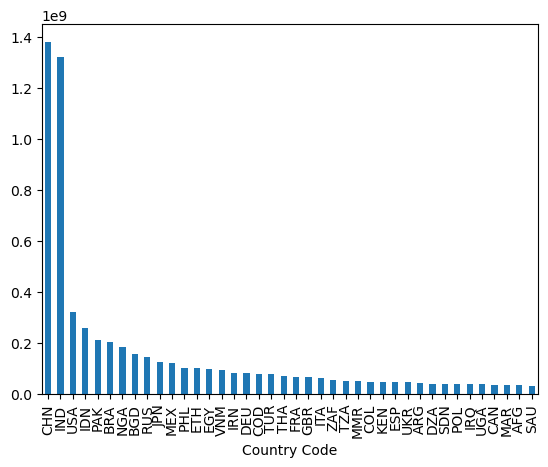

In [407]:
pop_plt = FullyFilled['Population, total'].sort_values(ascending = False).head(40).plot(kind = 'bar')
#pop_plt.xticks(range(0, len(FullyFilled.index[::3]), 3), FullyFilled.index[::3])
#pop_plt.grid(True)


In [408]:
FullyFilled['Population, total'].mean(), FullyFilled['Population, total'].median()

(53417266.28787879, 12898948.0)

In [409]:
FullyFilled.columns[FullyFilled.columns.str.contains('Pop')]

Index(['Population density people per sq. km of land area',
       'Population, total', 'Population growth annual percent'],
      dtype='object')

In [410]:
pd.set_option('plotting.backend', 'pandas_bokeh')

In [411]:
NoStrCCSBig=FullyFilled.columns[(FullyFilled.columns!='country') & (FullyFilled.columns!='rw_country_code')]

In [412]:
NoStrCCSBig

Index(['Fatalities Index', 'cri_rank', 'cri_score', 'fatalities_per_100k_rank',
       'fatalities_per_100k_total', 'fatalities_rank', 'fatalities_total',
       'losses_per_gdp__rank', 'losses_per_gdp__total', 'losses_usdm_ppp_rank',
       ...
       'Population, total', 'Net migration',
       'Refugee population by country or territory of origin',
       'Refugee population by country or territory of asylum',
       'Annual freshwater withdrawals, total percent of internal resources',
       'GDP growth annual percent', 'GDP per capita growth annual percent',
       'GNI per capita growth annual percent',
       'Population growth annual percent',
       'Net primary income Net income from abroad 2015 USD'],
      dtype='object', length=156)

In [413]:
FullyFilled_num = FullyFilled.loc[:,NoStrCCSBig]
FullyFilled_num

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,79,72.50,18,0.45,18,140,131,0.0001,119,...,32749848.0,60337.0,686.0,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10
ROU,107.0,61,61.50,112,0.01,102,1,16,0.6746,11,...,19815616.0,-49612.0,1731.0,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,-1.414073e+09
ESP,60.5,69,66.33,74,0.05,47,22,86,0.0394,31,...,46444832.0,-871.0,60.0,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,-1.989819e+08
SSD,114.0,133,117.33,114,0.00,114,0,120,0.0021,122,...,11194299.0,-160109.0,778722.0,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09
SLE,55.0,102,88.50,42,0.16,68,10,124,0.0011,131,...,7314773.0,-356.0,4900.0,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,-1.786899e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OMN,43.5,16,33.33,27,0.31,60,12,28,0.3901,30,...,4191776.0,134260.0,36.0,244.0,116.714286,5.017058,0.444639,3.074528,4.451608,-1.712205e+09
LBN,40.0,78,72.33,26,0.33,54,15,110,0.0080,108,...,6398940.0,-223722.0,4353.0,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,-3.848035e+08
RWA,64.0,110,97.00,60,0.09,68,10,130,0.0001,134,...,11642959.0,-14477.0,286357.0,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,-1.228484e+08


In [414]:
CCSBIGCorrs=FullyFilled_num.corr()
CCSBIGCorrs

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Fatalities Index,1.000000,0.757442,0.759061,0.936646,-0.222356,0.932876,-0.349756,0.153926,-0.091176,0.253772,...,-0.226835,0.151800,-0.177802,-0.050679,-0.096256,0.025117,0.058204,0.060856,-0.115869,-0.116435
cri_rank,0.757442,1.000000,0.994717,0.743013,-0.250688,0.672092,-0.294960,0.739322,-0.208942,0.667332,...,-0.227360,0.095755,-0.066195,0.102334,0.027684,0.031868,0.000323,0.011864,0.103084,-0.103077
cri_score,0.759061,0.994717,1.000000,0.745967,-0.274858,0.672124,-0.304049,0.745431,-0.235861,0.671596,...,-0.234760,0.099616,-0.051049,0.105438,0.027089,0.024295,-0.005829,0.011544,0.099224,-0.093574
fatalities_per_100k_rank,0.936646,0.743013,0.745967,1.000000,-0.289245,0.747606,-0.275593,0.225057,-0.172129,0.106087,...,-0.071757,0.186473,-0.134289,0.016218,-0.058938,0.035370,0.068943,0.088253,-0.119496,-0.093484
fatalities_per_100k_total,-0.222356,-0.250688,-0.274858,-0.289245,1.000000,-0.124161,0.056804,-0.204061,0.832963,-0.083113,...,-0.038750,-0.020121,-0.016246,-0.037825,-0.020940,-0.104606,-0.087499,-0.014883,-0.050750,0.020530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GDP growth annual percent,0.025117,0.031868,0.024295,0.035370,-0.104606,0.011252,0.067617,-0.001567,-0.045679,0.028016,...,0.105108,-0.043194,-0.074576,-0.005133,0.031755,1.000000,0.957071,0.694208,0.041942,-0.094589
GDP per capita growth annual percent,0.058204,0.000323,-0.005829,0.068943,-0.087499,0.039463,0.081583,-0.065480,-0.029341,-0.058749,...,0.120712,-0.072983,-0.101619,-0.102431,0.006369,0.957071,1.000000,0.714637,-0.249256,-0.078224
GNI per capita growth annual percent,0.060856,0.011864,0.011544,0.088253,-0.014883,0.024634,0.090276,-0.055615,-0.005847,-0.028541,...,0.122989,-0.086732,-0.045806,-0.028528,0.022286,0.694208,0.714637,1.000000,-0.136877,-0.052030
Population growth annual percent,-0.115869,0.103084,0.099224,-0.119496,-0.050750,-0.096814,-0.054509,0.216223,-0.049966,0.294672,...,-0.062847,0.108104,0.095896,0.341870,0.084131,0.041942,-0.249256,-0.136877,1.000000,-0.048841


In [415]:
#this Cell is newer than next
CCSBIGCorrs.sort_values(by = 'Fatalities Index')
# CCSBIGCorrs.sort_values(by = 'Fatalities Index').index[
# 1 is likely partially to due with being a producer, and location (Near South Asia)
# 2 is a bad sign and is likely an indicator of poverty as much as it is a cause
# Tarif rate is interesting and population might be but I'm going to look at Employment in Agriculture as this is my Hypothesis and its up there

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
fatalities_total,-0.349756,-0.294960,-0.304049,-0.275593,0.056804,-0.379756,1.000000,-0.073965,-0.031068,-0.258851,...,0.639758,-0.326904,0.056094,0.123535,0.013619,0.067617,0.081583,0.090276,-0.054509,0.052882
Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,-0.246807,-0.044215,-0.044955,-0.268059,-0.022314,-0.192307,0.035836,0.151841,-0.062367,0.187053,...,0.004651,-0.105270,0.382636,0.039451,0.018619,0.028505,-0.031423,0.047286,0.204539,-0.019546
"Selfemployed, total percent of total employment modeled ILO estimate",-0.234797,-0.092843,-0.099353,-0.252076,-0.026449,-0.185972,0.056018,-0.031242,0.020372,0.291500,...,0.074898,-0.288795,0.260957,-0.027046,-0.091027,-0.003720,-0.089201,-0.069336,0.286891,-0.127918
"Tariff rate, applied, weighted mean, all products percent",-0.228379,-0.054885,-0.070652,-0.289975,0.207345,-0.134832,0.028536,0.066437,0.116196,0.239840,...,0.030853,-0.176203,0.007664,0.025104,0.043956,0.018755,-0.059232,-0.052772,0.261256,-0.057855
"Population, total",-0.226835,-0.227360,-0.234760,-0.071757,-0.038750,-0.356302,0.639758,-0.093295,-0.049810,-0.334940,...,1.000000,-0.138313,0.043590,0.100098,0.018879,0.105108,0.120712,0.122989,-0.062847,-0.056861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cri_rank,0.757442,1.000000,0.994717,0.743013,-0.250688,0.672092,-0.294960,0.739322,-0.208942,0.667332,...,-0.227360,0.095755,-0.066195,0.102334,0.027684,0.031868,0.000323,0.011864,0.103084,-0.103077
cri_score,0.759061,0.994717,1.000000,0.745967,-0.274858,0.672124,-0.304049,0.745431,-0.235861,0.671596,...,-0.234760,0.099616,-0.051049,0.105438,0.027089,0.024295,-0.005829,0.011544,0.099224,-0.093574
fatalities_rank,0.932876,0.672092,0.672124,0.747606,-0.124161,1.000000,-0.379756,0.060421,0.004129,0.372073,...,-0.356302,0.096066,-0.199030,-0.112766,-0.121899,0.011252,0.039463,0.024634,-0.096814,-0.124635
fatalities_per_100k_rank,0.936646,0.743013,0.745967,1.000000,-0.289245,0.747606,-0.275593,0.225057,-0.172129,0.106087,...,-0.071757,0.186473,-0.134289,0.016218,-0.058938,0.035370,0.068943,0.088253,-0.119496,-0.093484


In [416]:
CCSBIGCorrs[CCSBIGCorrs.columns.str.contains('gricul')].sort_values(by='fatalities_rank')

#Agro irrigated land is to be expected, agri land is mayyybe to be expected, agri raw material exports is maybe a surprise??
# MMM well its still 11% correlation coefficient so pretty related. its just that imports are so much less likely to have high fatality index by comparison its not much


,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Agricultural land sq. km,-0.176431,-0.166631,-0.164936,-0.007766,-0.062222,-0.326536,0.243592,-0.023026,-0.073480,-0.331455,...,0.641671,0.194707,0.053163,0.046498,-0.013837,-0.024892,-0.014753,-0.029983,-0.034729,0.080951
Agricultural raw materials imports percent of merchandise imports,-0.158979,-0.163503,-0.151548,-0.046843,0.054003,-0.253263,0.173762,-0.062067,0.036947,-0.190302,...,0.298110,-0.299689,0.084220,0.213914,0.118760,0.072667,0.115300,0.108888,-0.154212,-0.025757
Employment in agriculture percent of total employment modeled ILO estimate,-0.225570,-0.136947,-0.146156,-0.257300,-0.020571,-0.163106,0.020288,-0.112485,0.048184,0.247644,...,0.027946,-0.252544,0.184967,-0.049155,-0.058114,0.027014,-0.056164,-0.074197,0.276176,-0.081818
"Agriculture, forestry, and fishing, value added percent of GDP",-0.217374,-0.100912,-0.114258,-0.279842,0.028197,-0.124385,0.010327,-0.069438,0.092221,0.301768,...,-0.006943,-0.240598,0.168122,-0.008215,-0.031744,-0.080134,-0.163775,-0.149403,0.294368,-0.060653
"Agriculture, forestry, and fishing, value added annual percent growth",-0.041642,0.039054,0.057174,-0.056196,-0.016119,-0.021167,0.013650,0.125606,-0.062699,0.112167,...,0.032895,0.039200,-0.021585,0.009079,0.023426,0.169078,0.129341,0.034078,0.113284,-0.029451
Agricultural land percent of land area,0.073182,0.075656,0.080361,0.147816,-0.096254,-0.013246,0.111794,0.036027,-0.062233,-0.001879,...,0.103741,-0.115198,0.095190,-0.027305,-0.169222,-0.043459,0.004246,0.035198,-0.160159,-0.072793
"Agriculture, forestry, and fishing, value added per worker constant 2015 USD",0.043029,0.031314,0.033126,0.083634,-0.022236,-0.004417,-0.001362,0.065205,-0.043417,-0.145854,...,-0.018728,0.110809,-0.070765,-0.024119,-0.019536,-0.009720,0.014241,-0.026917,-0.081077,0.044703
Agricultural raw materials exports percent of merchandise exports,0.042886,0.072674,0.068087,-0.028201,-0.068936,0.110314,-0.055892,0.026505,-0.072417,0.184217,...,-0.077720,-0.033795,0.164343,-0.078639,-0.049037,0.041559,0.007580,-0.052431,0.108076,-0.023064


In [417]:
FarmingFatality_General_Corrs = CCSBIGCorrs[CCSBIGCorrs.columns.str.contains('gricul') | CCSBIGCorrs.columns.str.upper().str.contains('RURAL')].sort_values(by='Fatalities Index')
FarmingFatality_General_Corrs
## Interesting and probably expected. Employment in agriculture (percent) is the biggest indicator (remember the lower the index/rank the more affected)
## Again raw material Exports is surprisingly low. just 0.4%. but Agri raw material imports is 15% which is pretty damn high. 
#Maybe implying a lack of self-sufficiency????  # but i dont think that makes sense if their export thing is so low? 
# Maybe i should graph it and colour code big, med, small countries?  Maybe these are different countries either with
# high agri business economy reliance or with high factory production economy reliance and high agribusiness import
# reliance? Maybe that makes sense as making things isnt the highest profit thing so often can't afford the increased
# prices of agri-imports that goes with climate-disasters?

#graph agri employment, graph imports, graph urban, graph urban employment ideally, graph exports 
#        (exports may be more related to knock-on effects of climate change like malnutrition 
#         (although then it does interest me why empin agriculture corr is so high? like surely the main different is likelihood?
#          i guess maybe nearer wildfires? further from hospitals? poorer country? indicating that even setting
#          aside knock-on effects its an extremely high-risk role, much more dangerous and we should pay for
#          the direct risk associated with the job))  at the same time again we return to low agri export correlation. 
#            are the most at risk those with agri-based economies but no-one willing to trade??


,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Employment in agriculture percent of total employment modeled ILO estimate,-0.225570,-0.136947,-0.146156,-0.257300,-0.020571,-0.163106,0.020288,-0.112485,0.048184,0.247644,...,0.027946,-0.252544,0.184967,-0.049155,-0.058114,0.027014,-0.056164,-0.074197,0.276176,-0.081818
Rural population,-0.221148,-0.222894,-0.235073,-0.099334,-0.031951,-0.317160,0.715063,-0.113882,-0.039908,-0.278724,...,0.965483,-0.236501,0.052407,0.091398,0.026052,0.130596,0.135449,0.145665,-0.028343,-0.129484
"Agriculture, forestry, and fishing, value added percent of GDP",-0.217374,-0.100912,-0.114258,-0.279842,0.028197,-0.124385,0.010327,-0.069438,0.092221,0.301768,...,-0.006943,-0.240598,0.168122,-0.008215,-0.031744,-0.080134,-0.163775,-0.149403,0.294368,-0.060653
Rural population growth annual percent,-0.212717,0.001751,-0.008421,-0.228274,-0.018650,-0.168584,-0.028958,0.140274,-0.031673,0.266832,...,-0.098527,-0.000844,0.173260,0.264855,0.103563,0.005781,-0.207660,-0.113228,0.732983,-0.009112
Rural population percent of total population,-0.201686,-0.150771,-0.157099,-0.246827,-0.035582,-0.128589,0.054925,-0.140521,0.040887,0.206845,...,0.051200,-0.300058,0.239693,-0.075501,0.002245,0.059919,0.016858,0.054099,0.138108,-0.103779
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Agricultural raw materials exports percent of merchandise exports,0.042886,0.072674,0.068087,-0.028201,-0.068936,0.110314,-0.055892,0.026505,-0.072417,0.184217,...,-0.077720,-0.033795,0.164343,-0.078639,-0.049037,0.041559,0.007580,-0.052431,0.108076,-0.023064
"Agriculture, forestry, and fishing, value added per worker constant 2015 USD",0.043029,0.031314,0.033126,0.083634,-0.022236,-0.004417,-0.001362,0.065205,-0.043417,-0.145854,...,-0.018728,0.110809,-0.070765,-0.024119,-0.019536,-0.009720,0.014241,-0.026917,-0.081077,0.044703
Rural population living in areas where elevation is below 5 meters percent of total population,0.069441,-0.072070,-0.078406,-0.030631,0.160955,0.163162,-0.059564,-0.268890,0.422372,0.120594,...,-0.072300,-0.001484,-0.070673,-0.108443,-0.006283,0.141156,0.175929,0.111414,-0.125871,0.002987
Agricultural land percent of land area,0.073182,0.075656,0.080361,0.147816,-0.096254,-0.013246,0.111794,0.036027,-0.062233,-0.001879,...,0.103741,-0.115198,0.095190,-0.027305,-0.169222,-0.043459,0.004246,0.035198,-0.160159,-0.072793


In [418]:
FarmingFatality_General_Corrsplot = FarmingFatality_General_Corrs['Fatalities Index'].plot(show_figure = False)
FarmingFatality_General_Corrsplot.xaxis.major_label_orientation = 0.2 * 3.14

show(FarmingFatality_General_Corrsplot)

In [419]:
CCSBIGCorrs.sort_values(by = 'Fatalities Index', )#ascending = False)

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
fatalities_total,-0.349756,-0.294960,-0.304049,-0.275593,0.056804,-0.379756,1.000000,-0.073965,-0.031068,-0.258851,...,0.639758,-0.326904,0.056094,0.123535,0.013619,0.067617,0.081583,0.090276,-0.054509,0.052882
Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,-0.246807,-0.044215,-0.044955,-0.268059,-0.022314,-0.192307,0.035836,0.151841,-0.062367,0.187053,...,0.004651,-0.105270,0.382636,0.039451,0.018619,0.028505,-0.031423,0.047286,0.204539,-0.019546
"Selfemployed, total percent of total employment modeled ILO estimate",-0.234797,-0.092843,-0.099353,-0.252076,-0.026449,-0.185972,0.056018,-0.031242,0.020372,0.291500,...,0.074898,-0.288795,0.260957,-0.027046,-0.091027,-0.003720,-0.089201,-0.069336,0.286891,-0.127918
"Tariff rate, applied, weighted mean, all products percent",-0.228379,-0.054885,-0.070652,-0.289975,0.207345,-0.134832,0.028536,0.066437,0.116196,0.239840,...,0.030853,-0.176203,0.007664,0.025104,0.043956,0.018755,-0.059232,-0.052772,0.261256,-0.057855
"Population, total",-0.226835,-0.227360,-0.234760,-0.071757,-0.038750,-0.356302,0.639758,-0.093295,-0.049810,-0.334940,...,1.000000,-0.138313,0.043590,0.100098,0.018879,0.105108,0.120712,0.122989,-0.062847,-0.056861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cri_rank,0.757442,1.000000,0.994717,0.743013,-0.250688,0.672092,-0.294960,0.739322,-0.208942,0.667332,...,-0.227360,0.095755,-0.066195,0.102334,0.027684,0.031868,0.000323,0.011864,0.103084,-0.103077
cri_score,0.759061,0.994717,1.000000,0.745967,-0.274858,0.672124,-0.304049,0.745431,-0.235861,0.671596,...,-0.234760,0.099616,-0.051049,0.105438,0.027089,0.024295,-0.005829,0.011544,0.099224,-0.093574
fatalities_rank,0.932876,0.672092,0.672124,0.747606,-0.124161,1.000000,-0.379756,0.060421,0.004129,0.372073,...,-0.356302,0.096066,-0.199030,-0.112766,-0.121899,0.011252,0.039463,0.024634,-0.096814,-0.124635
fatalities_per_100k_rank,0.936646,0.743013,0.745967,1.000000,-0.289245,0.747606,-0.275593,0.225057,-0.172129,0.106087,...,-0.071757,0.186473,-0.134289,0.016218,-0.058938,0.035370,0.068943,0.088253,-0.119496,-0.093484


In [420]:
FullyFilled[FullyFilled.index.isin(FullyFilled.index.unique())].shape[0]

132

In [421]:
from bokeh.models import FactorRange

sort_by = 'Fatalities Index'

sorted_Ccodes = FullyFilled[FullyFilled.index.isin(FullyFilled.index.unique())]
sorted_Ccodes = sorted_Ccodes.sort_values(by = sort_by, ascending = True)
sorted_Ccodes = sorted_Ccodes.index[::2].tolist()

DeathFarmWork = figure(plot_width = 900, plot_height = 400, x_range = FactorRange(*sorted_Ccodes), )

data = ColumnDataSource(FullyFilled.sort_values(by = sort_by, ascending = True)[::2]) # it sorts them but it is non negotiable which direction it goes. it looks like it has to be ascending.
                                                                                            #  No thats not true even. the graph changes if you say false or true but not by much and the index stays the same?


DeathFarmWork.line(x = 'Country Code', y = 'Employment in agriculture percent of total employment modeled ILO estimate', source = data, width = 0.9)
DeathFarmWork.xaxis.major_label_orientation = 45
DeathFarmWork.xaxis.axis_label = 'Fatality Indexed Countries (Every 2nd Value)'
DeathFarmWork.yaxis.axis_label = 'Agricultural Employment %'
DeathFarmWork.title = 'Countries: Greatest to Lowest Fatality Severity by % Agricultural Employment'


hover = HoverTool()
hover.tooltips = [
    ('Country', '@country'),
    ('Fatalities Index', '@{Fatalities Index}'),
    ('Agricultural Employment %', '@{Employment in agriculture percent of total employment modeled ILO estimate}')
]
DeathFarmWork.add_tools(hover)

show(DeathFarmWork)

## Despite the wild variability, there does seem to be a downward trend. IF i divide the countries into their Vhigh, high, mid, low, vlow death index groups, and then average those groups' percentage employments I wonder what would show
## Big Stufff

In [422]:
FullyFilled.sort_values(by = 'Fatalities Index').head(2)

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
FRA,3.0,France,16,33.33,4,5.19,2,3336,85,0.0401,...,66548272.0,18807.0,90.0,273117.0,14.058000,1.112912,0.754024,1.748671,0.355569,3.986102e+10
BEL,5.5,Belgium,46,52.83,6,3.66,5,410,108,0.0088,...,11274196.0,57008.0,66.0,35302.0,33.283333,2.041459,1.451893,1.523878,0.579446,4.951374e+09


In [423]:
sort_by = 'fatalities_per_100k_rank'

sorted_Ccodes = FullyFilled[FullyFilled.index.isin(FullyFilled.index.unique())]
sorted_Ccodes = sorted_Ccodes.sort_values(by = sort_by, ascending = True)
sorted_Ccodes = sorted_Ccodes.index[::2].tolist()

DeathFarmWork = figure(plot_width = 900, plot_height = 500, x_range = FactorRange(*sorted_Ccodes), )

data = ColumnDataSource(FullyFilled.sort_values(by = sort_by, ascending = True)[::2]) # it sorts them but it is non negotiable which direction it goes. it looks like it has to be ascending.
                                                                                            #  No thats not true even. the graph changes if you say false or true but not by much and the index stays the same?


DeathFarmWork.line(x = 'Country Code', y = 'Employment in agriculture percent of total employment modeled ILO estimate', source = data, width = 0.9)
DeathFarmWork.xaxis.major_label_orientation = 45
DeathFarmWork.xaxis.axis_label = 'fatalities_per_100k_ranked Countries'
DeathFarmWork.yaxis.axis_label = 'Agricultural Employment %'


hover = HoverTool()
hover.tooltips = [
    ('Country', '@country'),
    ('fatalities_per_100k_rank', '@{fatalities_per_100k_rank}'),
    ('Agricultural Employment %', '@{Employment in agriculture percent of total employment modeled ILO estimate}')
]
DeathFarmWork.add_tools(hover)

show(DeathFarmWork)
## Same here        Though when reporting should mention there was a surprisingly significant level of variability
# between countries (in terms of direct deaths). Which kind of makes sense as a lot of these things are going to be
# climate disaster specific which is kinda random but has a tendency to impact some more than others. still surprising
# though how many non agri Cs were high ranking. 
# Bahamas maybe less surprising because in caribean. Ok so Dominica is massively a farming economy (just had data missing), and micronesia and several of the other troughs are more about them being subsistance farmers not in employment than them not being in farming (this may apply a bit to those in the upper end of the least fataly affected but i suspect less)
# Unclear to what extent this impacts much though and some of it seems to broadly even out. nevertheless something to be aware of

In [424]:
FullyFilled[FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'] == FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].median()]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
Country Code,,,,,,,,,,,,,,,,,,,,,
KIR,114.0,Kiribati,83,75.50,114,0.00,114,0,5,6.2500,...,116707.0,-853.0,1764.5,9018.0,8.419888,9.865175,8.244125,20.644349,1.486484,1.370497e+08
DMA,21.5,Dominica,2,13.00,1,43.66,42,31,1,77.3694,...,70007.0,-393.0,35.0,9018.0,10.000000,-2.731503,-3.615168,2.286596,0.912632,-1.429632e+07
TUV,114.0,Tuvalu,81,75.17,114,0.00,114,0,3,33.3333,...,10877.0,-159.0,1764.5,9018.0,8.419888,10.416667,10.639997,2.286596,-0.202057,1.526285e+07
FSM,37.0,Micronesia,12,28.50,3,8.74,71,9,4,12.5786,...,109462.0,-1415.0,1764.5,5.0,8.419888,4.621884,4.203251,2.286596,0.400942,4.492024e+07


In [425]:
sort_by = 'fatalities_rank'

sorted_Ccodes = FullyFilled[FullyFilled.index.isin(FullyFilled.index.unique())]
sorted_Ccodes = sorted_Ccodes.sort_values(by = sort_by, ascending = True)
sorted_Ccodes = sorted_Ccodes.index.tolist()

DeathFarmWork = figure(plot_width = 900, plot_height = 500, x_range = FactorRange(*sorted_Ccodes), )

data = ColumnDataSource(FullyFilled.sort_values(by = sort_by, ascending = True)) # it sorts them but it is non negotiable which direction it goes. it looks like it has to be ascending.
                                                                                            #  No thats not true even. the graph changes if you say false or true but not by much and the index stays the same?


DeathFarmWork.line(x = 'Country Code', y = 'Employment in agriculture percent of total employment modeled ILO estimate', source = data, width = 1.5)
DeathFarmWork.xaxis.major_label_orientation = 45
DeathFarmWork.xaxis.axis_label = 'fatalities_ranked Countries'
DeathFarmWork.yaxis.axis_label = 'Agricultural Employment %'


hover = HoverTool()
hover.tooltips = [
    ('Country', '@country'),
    ('fatalities_rank', '@{fatalities_rank}'),
    ('Agricultural Employment %', '@{Employment in agriculture percent of total employment modeled ILO estimate}')
]
DeathFarmWork.add_tools(hover)

show(DeathFarmWork)
#there seems to be a broadly similar trend here but maybe a little more variable and less clear. will need to group by index/rank<x<y<z

In [426]:
FullyFilled['Fatalities Index'].max()

114.0

In [427]:
FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].quantile(0.8), print(f"Fatality 80%: {FullyFilled['Fatalities Index'].quantile(0.2)}, Fatality High Range: {FullyFilled['Fatalities Index'].min() + ((FullyFilled['Fatalities Index'].max() - FullyFilled['Fatalities Index'].min())/5)}")

Fatality 80%: 33.7, Fatality High Range: 25.2


(48.24933595800001, None)

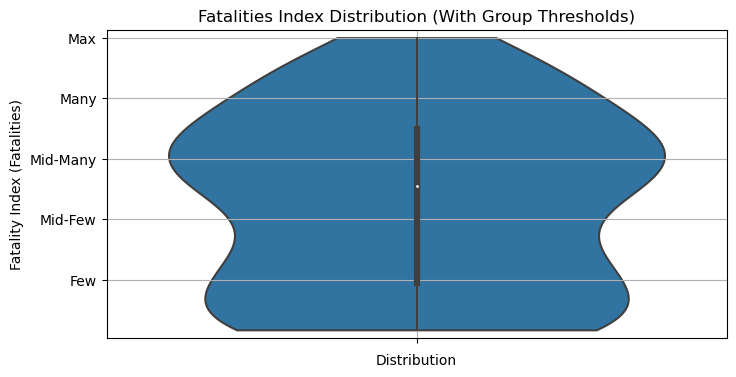

In [428]:
pd.set_option('plotting.backend', 'matplotlib')

plt.figure(figsize = (8,4))
sns.violinplot(y='Fatalities Index', data=FullyFilled, cut=0)
plt.ylim(0, 117)
plt.gca().invert_yaxis()

plt.yticks(list(range((int(FullyFilled['Fatalities Index'].min())), (int(FullyFilled['Fatalities Index'].max())), 23)), ['Max', 'Many', 'Mid-Many', 'Mid-Few', 'Few'])
plt.xlabel('Distribution')
plt.ylabel('Fatality Index (Fatalities)')
plt.title('Fatalities Index Distribution (With Group Thresholds)')
plt.grid(True)

plt.show()

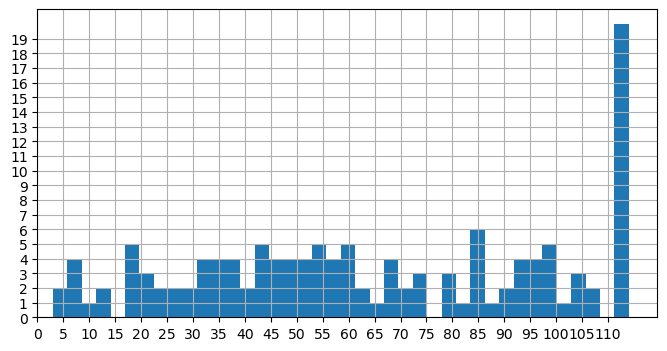

(None, 13)

In [429]:
#***&&&
plt.figure(figsize=(8, 4))
plt.hist(FullyFilled['Fatalities Index'], bins = 40)

plt.xlim(0)
plt.xticks(list(range(0, int(FullyFilled['Fatalities Index'].max()), 5)))
plt.yticks(list(range(0, 20)))

plt.grid(True)

plt.show(), FullyFilled[FullyFilled['Fatalities Index']<19].shape[0]  # Further Analysis would explore these top 10 countries. or rather maybe this top 10 threshold

In [430]:
# FewFarmEmps[FewFarmEmps['Fatalities Index']<19].shape[0]
#At 19 theres an ineresting little sike then drop

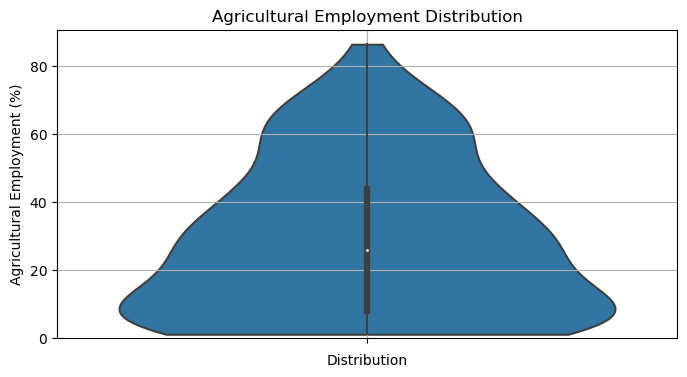

In [431]:
plt.figure(figsize = (8,4))
sns.violinplot(y='Employment in agriculture percent of total employment modeled ILO estimate', data=FullyFilled, cut=0)
plt.ylim(0) 

plt.ylabel('Agricultural Employment (%)')
plt.xlabel('Distribution')
plt.title('Agricultural Employment Distribution')
plt.grid(True)

plt.show()

In [432]:
FullyFilled['Fatalities Index'].max(), FullyFilled['Fatalities Index'].min()

(114.0, 3.0)

In [433]:
#***&&&
### Trying for now
""" Trying for now"""
"""
to_percentile = FullyFilled['Fatalities Index']
def Relative_Size_Rank_Grouper(x, variable = 'Deaths', percentile = to_percentile.quantile([0.2, 0.4, 0.6, 0.8])):
    VLowP_Thresh, LowP_Thresh, MidP_Thresh, HighP_Thresh = percentile
    
    if x <= VLowP_Thresh:
        return f'Very High {variable}'
    elif x <= LowP_Thresh:
        return f'High {variable}'
    elif x <= MidP_Thresh:
        return f'Medium {variable}'
    elif x <= HighP_Thresh:
        return f'Few {variable}'
    else:
        return f'Very Few {variable}'
"""

"\nto_percentile = FullyFilled['Fatalities Index']\ndef Relative_Size_Rank_Grouper(x, variable = 'Deaths', percentile = to_percentile.quantile([0.2, 0.4, 0.6, 0.8])):\n    VLowP_Thresh, LowP_Thresh, MidP_Thresh, HighP_Thresh = percentile\n    \n    if x <= VLowP_Thresh:\n        return f'Very High {variable}'\n    elif x <= LowP_Thresh:\n        return f'High {variable}'\n    elif x <= MidP_Thresh:\n        return f'Medium {variable}'\n    elif x <= HighP_Thresh:\n        return f'Few {variable}'\n    else:\n        return f'Very Few {variable}'\n"

In [434]:
"""
FullyFilled['Fatality_index_Groups'] = FullyFilled['Fatalities Index'].apply(Relative_Size_Rank_Grouper)
FullyFilled
"""

"\nFullyFilled['Fatality_index_Groups'] = FullyFilled['Fatalities Index'].apply(Relative_Size_Rank_Grouper)\nFullyFilled\n"

In [435]:
def Rank_Grouper(x, variable = 'Deaths', minimum = FullyFilled['Fatalities Index'].min(), maximum = FullyFilled['Fatalities Index'].max()):
    var_range = maximum - minimum
    var_grp_incrament = var_range/5

    V_lowNO_thresh = minimum + var_grp_incrament
    LowNO_thresh = V_lowNO_thresh + var_grp_incrament
    MidNO_thresh = LowNO_thresh + var_grp_incrament
    HighNO_thresh = MidNO_thresh + var_grp_incrament
    V_HighNO_thresh = HighNO_thresh + var_grp_incrament
    
    if x < V_lowNO_thresh:
        return f'Very High {variable}'
    elif x < LowNO_thresh:
        return f'High {variable}'
    elif x < MidNO_thresh:
        return f'Medium {variable}'
    elif x < HighNO_thresh:
        return f'Few {variable}'
    else:
        return f'Very Few {variable}'

In [436]:
# Could Be Useful
def Size_Grouper(x, variable = 'Percent Farmers', minimum = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].min(), maximum = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].max()):
    var_range = maximum - minimum
    var_grp_incrament = var_range/5

    V_lowNO_thresh = minimum + var_grp_incrament
    LowNO_thresh = V_lowNO_thresh + var_grp_incrament
    MidNO_thresh = LowNO_thresh + var_grp_incrament
    HighNO_thresh = MidNO_thresh + var_grp_incrament
    V_HighNO_thresh = HighNO_thresh + var_grp_incrament
    
    if x > V_HighNO_thresh:
        return f'Very High {variable}'
    elif x > HighNO_thresh:
        return f'High {variable}'
    elif x > MidNO_thresh:
        return f'Medium {variable}'
    elif x > LowNO_thresh:
        return f'Few {variable}'
    else:
        return f'Very Few {variable}'

In [437]:
FullyFilled['Fatality_index_Groups'] = FullyFilled['Fatalities Index'].apply(Rank_Grouper)
FullyFilled

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,60337.0,686.0,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10,Very High Deaths
ROU,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,-49612.0,1731.0,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,-1.414073e+09,Very Few Deaths
ESP,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,-871.0,60.0,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,-1.989819e+08,Medium Deaths
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,-160109.0,778722.0,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths
SLE,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,-356.0,4900.0,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,-1.786899e+07,Medium Deaths
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OMN,43.5,Oman,16,33.33,27,0.31,60,12,28,0.3901,...,134260.0,36.0,244.0,116.714286,5.017058,0.444639,3.074528,4.451608,-1.712205e+09,High Deaths
LBN,40.0,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,...,-223722.0,4353.0,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,-3.848035e+08,High Deaths
RWA,64.0,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,...,-14477.0,286357.0,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,-1.228484e+08,Medium Deaths


In [438]:
FullyFilled[FullyFilled['Fatality_index_Groups']=='Very High Deaths']

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,60337.0,686.0,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10,Very High Deaths
BHS,20.5,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,...,1001.0,216.0,7.0,8.419888,0.996231,0.079105,-0.346102,0.912227,-3.744381e+08,Very High Deaths
BEL,5.5,Belgium,46,52.83,6,3.66,5,410,108,0.0088,...,57008.0,66.0,35302.0,33.283333,2.041459,1.451893,1.523878,0.579446,4.951374e+09,Very High Deaths
GHA,10.0,Ghana,8,23.33,10,0.99,10,267,35,0.2655,...,-13308.0,22962.0,17404.0,4.747442,2.120759,-0.265333,2.114422,2.364270,-1.124073e+09,Very High Deaths
ITA,21.0,Italy,19,34.83,29,0.29,13,174,62,0.0958,...,34031.0,69.0,118036.0,18.608283,0.778304,0.875477,0.775990,-0.096376,-9.608222e+09,Very High Deaths
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTM,8.0,Guatemala,31,45.00,7,1.77,9,288,83,0.0419,...,-48162.0,10284.0,222.0,3.044048,4.092171,2.346295,2.556686,1.691465,-1.124783e+09,Very High Deaths
NPL,11.5,Nepal,42,51.33,12,0.69,11,198,90,0.0299,...,-221059.0,9051.0,32669.0,4.791675,3.976053,3.417884,3.344864,0.538271,2.604486e+08,Very High Deaths
MOZ,7.5,Mozambique,1,12.17,8,1.25,7,351,8,1.4993,...,30414.0,55.0,5624.0,1.468594,7.393094,4.174323,2.286596,3.043020,-4.223532e+08,Very High Deaths


In [439]:
FullyFilled

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,60337.0,686.0,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10,Very High Deaths
ROU,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,-49612.0,1731.0,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,-1.414073e+09,Very Few Deaths
ESP,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,-871.0,60.0,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,-1.989819e+08,Medium Deaths
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,-160109.0,778722.0,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths
SLE,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,-356.0,4900.0,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,-1.786899e+07,Medium Deaths
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OMN,43.5,Oman,16,33.33,27,0.31,60,12,28,0.3901,...,134260.0,36.0,244.0,116.714286,5.017058,0.444639,3.074528,4.451608,-1.712205e+09,High Deaths
LBN,40.0,Lebanon,78,72.33,26,0.33,54,15,110,0.0080,...,-223722.0,4353.0,1529213.0,37.750000,0.462321,-1.493848,-1.383005,1.966373,-3.848035e+08,High Deaths
RWA,64.0,Rwanda,110,97.00,60,0.09,68,10,130,0.0001,...,-14477.0,286357.0,144739.0,5.268556,8.856842,6.290306,6.689990,2.385956,-1.228484e+08,Medium Deaths


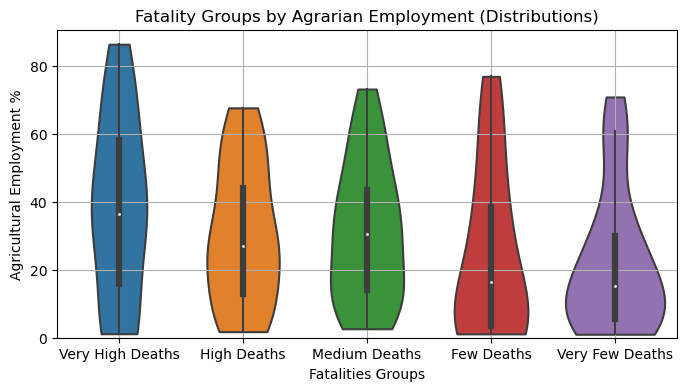

In [440]:
plt.figure(figsize = (8,4))

#variable = 'Deaths'
#x_plotter = {1: f'Very High {variable}', 2: f'High {variable}', 3: f'Medium {variable}', 4: f'Low {variable}', 5: f'Very Low {variable}'}

sns.violinplot(x = 'Fatality_index_Groups', y='Employment in agriculture percent of total employment modeled ILO estimate', data=FullyFilled.sort_values(by = 'Fatalities Index'), cut=0)
plt.ylim(0)

plt.ylabel('Agricultural Employment %')
plt.xlabel('Fatalities Groups')
plt.title("Fatality Groups by Agrarian Employment (Distributions)")

plt.grid(True)

plt.show()

<Axes: xlabel='Fatality_index_Groups'>

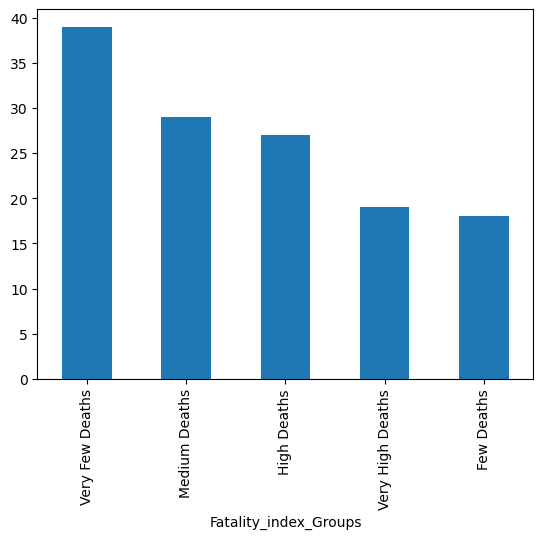

In [441]:
FullyFilled['Fatality_index_Groups'].value_counts().plot(kind = 'bar')

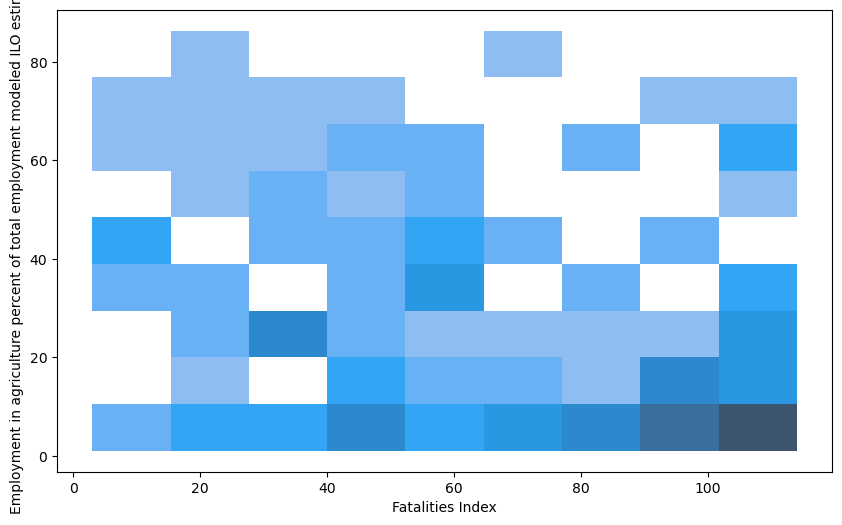

In [442]:
plt.figure(figsize = (10,6))

#variable = 'Deaths'
#x_plotter = {1: f'Very High {variable}', 2: f'High {variable}', 3: f'Medium {variable}', 4: f'Low {variable}', 5: f'Very Low {variable}'}

sns.histplot(x = 'Fatalities Index', y='Employment in agriculture percent of total employment modeled ILO estimate', data=FullyFilled)#.sort_values(by = 'Fatalities Index'))  #(initially had x= 'Fatality_index_Groups' )

plt.show()

In [443]:
# Led nowhere and Unecessary Also. Don't create more work for myself. just do the necessary.
"""
minimum = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].min()
maximum = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].max()
FullyFilled['Farm_Work_percent_Groups'] = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].apply(Rank_Grouper, variable = 'Percent Farmers', minimum = minimum, maximum = maximum)
FullyFilled
"""

"\nminimum = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].min()\nmaximum = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].max()\nFullyFilled['Farm_Work_percent_Groups'] = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].apply(Rank_Grouper, variable = 'Percent Farmers', minimum = minimum, maximum = maximum)\nFullyFilled\n"

In [444]:
## I dont think Heatmap is the one for right here because it wants to use all the collumns and everything in the df

"""

plt.figure(figsize = (10,6))

#variable = 'Deaths'
#x_plotter = {1: f'Very High {variable}', 2: f'High {variable}', 3: f'Medium {variable}', 4: f'Low {variable}', 5: f'Very Low {variable}'}

sns.heatmap(x = 'Fatalities Index', y='Employment in agriculture percent of total employment modeled ILO estimate', data=FullyFilled_num.sort_values(by = 'Fatalities Index'))

plt.show()

"""

"\n\nplt.figure(figsize = (10,6))\n\n#variable = 'Deaths'\n#x_plotter = {1: f'Very High {variable}', 2: f'High {variable}', 3: f'Medium {variable}', 4: f'Low {variable}', 5: f'Very Low {variable}'}\n\nsns.heatmap(x = 'Fatalities Index', y='Employment in agriculture percent of total employment modeled ILO estimate', data=FullyFilled_num.sort_values(by = 'Fatalities Index'))\n\nplt.show()\n\n"

In [445]:
# Entirely Unneccessary
"""
plt.figure(figsize = (10,6))

def group_numerator(x):
    if not pd.isna(x):
        if x.upper().str.contains('VERY LOW'):
            return 20
        elif x.upper().str.contains('LOW'):
            return 40
        elif x.upper().str.contains('MEDIUM'):
            return 60
        elif x.upper().str.contains('VERY HIGH'):
            return 100
        else:
            return 80

FullyFilled['Farm_Work_percent_Groups'] = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].apply(group_numerator)
FullyFilled['Farm_Work_percent_Groups']
"""

"\nplt.figure(figsize = (10,6))\n\ndef group_numerator(x):\n    if not pd.isna(x):\n        if x.upper().str.contains('VERY LOW'):\n            return 20\n        elif x.upper().str.contains('LOW'):\n            return 40\n        elif x.upper().str.contains('MEDIUM'):\n            return 60\n        elif x.upper().str.contains('VERY HIGH'):\n            return 100\n        else:\n            return 80\n\nFullyFilled['Farm_Work_percent_Groups'] = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].apply(group_numerator)\nFullyFilled['Farm_Work_percent_Groups']\n"

In [446]:
## Didnt work. AND deeply unneccessary
"""
#variable = 'Deaths'
#x_plotter = {1: f'Very High {variable}', 2: f'High {variable}', 3: f'Medium {variable}', 4: f'Low {variable}', 5: f'Very Low {variable}'}


sns.histplot(x = 'Fatality_index_Groups', y='Farm_Work_percent_Groups', alpha = 0.6, data=FullyFilled.sort_values(by = ['Fatalities Index',])) #'Employment in agriculture percent of total employment modeled ILO estimate']), alpha = 0.6)

#plt.yaxis.y_ticker = {<20:'Very Low', <40: 'Low'}

plt.show()
"""

"\n#variable = 'Deaths'\n#x_plotter = {1: f'Very High {variable}', 2: f'High {variable}', 3: f'Medium {variable}', 4: f'Low {variable}', 5: f'Very Low {variable}'}\n\n\nsns.histplot(x = 'Fatality_index_Groups', y='Farm_Work_percent_Groups', alpha = 0.6, data=FullyFilled.sort_values(by = ['Fatalities Index',])) #'Employment in agriculture percent of total employment modeled ILO estimate']), alpha = 0.6)\n\n#plt.yaxis.y_ticker = {<20:'Very Low', <40: 'Low'}\n\nplt.show()\n"

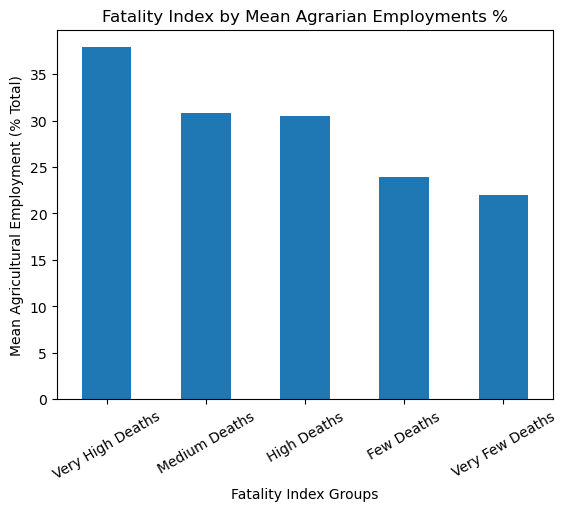

In [447]:
FullyFilled.groupby('Fatality_index_Groups')['Employment in agriculture percent of total employment modeled ILO estimate'].mean().sort_values(ascending = False).plot(kind = 'bar')

plt.xlabel('Fatality Index Groups')
plt.xticks(rotation = 30)
plt.ylabel('Mean Agricultural Employment (% Total)')
plt.title('Fatality Index by Mean Agrarian Employments %')
plt.show()


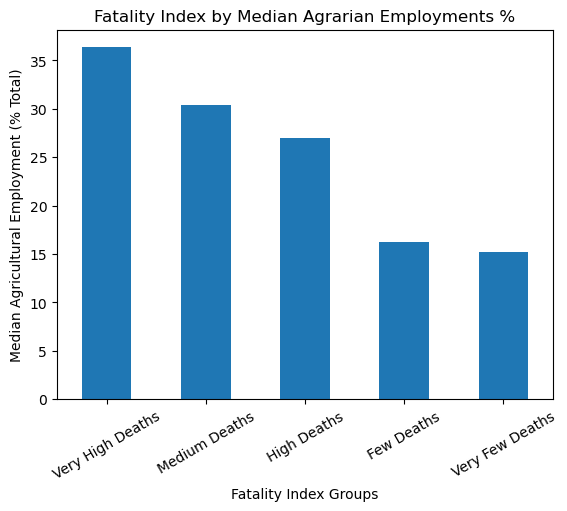

In [448]:
FullyFilled.groupby('Fatality_index_Groups')['Employment in agriculture percent of total employment modeled ILO estimate'].median().sort_values(ascending = False).plot(kind = 'bar')

plt.xlabel('Fatality Index Groups')
plt.xticks(rotation = 30)
plt.ylabel('Median Agricultural Employment (% Total)')
plt.title('Fatality Index by Median Agrarian Employments %')
plt.show()

In [449]:
## Ok Good. glad we got those trends sorted

In [450]:
pd.set_option('display.max_rows', None)
CCSBIGCorrs.sort_values(by='Fatalities Index')
## Ok so first off, interesting that exports of goods and services puts you in a better position than imports of goods and services. Weird
## Also Trade % of GDP puts you in a better position also. 

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
fatalities_total,-0.349756,-0.294960,-0.304049,-0.275593,0.056804,-0.379756,1.000000,-0.073965,-0.031068,-0.258851,...,0.639758,-0.326904,0.056094,0.123535,0.013619,0.067617,0.081583,0.090276,-0.054509,0.052882
Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,-0.246807,-0.044215,-0.044955,-0.268059,-0.022314,-0.192307,0.035836,0.151841,-0.062367,0.187053,...,0.004651,-0.105270,0.382636,0.039451,0.018619,0.028505,-0.031423,0.047286,0.204539,-0.019546
"Selfemployed, total percent of total employment modeled ILO estimate",-0.234797,-0.092843,-0.099353,-0.252076,-0.026449,-0.185972,0.056018,-0.031242,0.020372,0.291500,...,0.074898,-0.288795,0.260957,-0.027046,-0.091027,-0.003720,-0.089201,-0.069336,0.286891,-0.127918
"Tariff rate, applied, weighted mean, all products percent",-0.228379,-0.054885,-0.070652,-0.289975,0.207345,-0.134832,0.028536,0.066437,0.116196,0.239840,...,0.030853,-0.176203,0.007664,0.025104,0.043956,0.018755,-0.059232,-0.052772,0.261256,-0.057855
"Population, total",-0.226835,-0.227360,-0.234760,-0.071757,-0.038750,-0.356302,0.639758,-0.093295,-0.049810,-0.334940,...,1.000000,-0.138313,0.043590,0.100098,0.018879,0.105108,0.120712,0.122989,-0.062847,-0.056861
Employment in agriculture percent of total employment modeled ILO estimate,-0.225570,-0.136947,-0.146156,-0.257300,-0.020571,-0.163106,0.020288,-0.112485,0.048184,0.247644,...,0.027946,-0.252544,0.184967,-0.049155,-0.058114,0.027014,-0.056164,-0.074197,0.276176,-0.081818
"Tariff rate, applied, simple mean, all products percent",-0.225569,-0.069887,-0.087053,-0.257104,0.210958,-0.163306,0.029336,0.015910,0.148540,0.236889,...,0.067234,-0.224277,0.023566,0.020805,0.000913,0.037134,-0.051299,-0.050847,0.293315,-0.095829
"Vulnerable employment, total percent of total employment modeled ILO estimate",-0.223838,-0.083445,-0.090640,-0.244496,-0.025338,-0.172987,0.055818,-0.029637,0.021494,0.298629,...,0.073207,-0.287346,0.261414,-0.036351,-0.113959,0.004045,-0.082738,-0.071358,0.290239,-0.118679
fatalities_per_100k_total,-0.222356,-0.250688,-0.274858,-0.289245,1.000000,-0.124161,0.056804,-0.204061,0.832963,-0.083113,...,-0.038750,-0.020121,-0.016246,-0.037825,-0.020940,-0.104606,-0.087499,-0.014883,-0.050750,0.020530
"Tariff rate, most favored nation, simple mean, all products percent",-0.222291,-0.032595,-0.054433,-0.223737,0.110717,-0.191400,0.059721,0.082494,0.003365,0.202528,...,0.107257,-0.180487,0.035598,0.108418,0.141400,0.075807,0.001875,-0.009081,0.242307,-0.118296


In [451]:
FullyFilled.columns[FullyFilled.columns.str.upper().str.contains('EDU') | FullyFilled.columns.str.upper().str.contains('SCHO')]

Index([], dtype='object')

In [452]:
pd.set_option('display.max_rows', 10)

In [453]:



# Cool So I've done a little exploratory analysis. 
# I think Here Its time to subdivide a couple DFs
# Then I think I should Explore what might be going wrong in countries with Low Agrarian Employment Economies?
        # Manufacturing? (Low Value? High Value?)
        # Social Services? 
        # Or Simply just Geo-Spatial Factors like Size and location
# Then Its time to look at Agrarian Based Economies That Do have a serious Problem (I.E most likely those around the ecuator)
    # and in particular: Those that dont have a problem in these same regions.


print('First though, lets make sure I know where everyone is.')

First though, lets make sure I know where everyone is.


In [454]:
CountryLocs_dirty = pd.read_csv('world_country_and_usa_states_latitude_and_longitude_values.csv')
CountryLocs_dirty

,country_code,latitude,longitude,country,usa_state_code,usa_state_latitude,usa_state_longitude,usa_state
0,AD,42.546245,1.601554,Andorra,AK,63.588753,-154.493062,Alaska
1,AE,23.424076,53.847818,United Arab Emirates,AL,32.318231,-86.902298,Alabama
2,AF,33.939110,67.709953,Afghanistan,AR,35.201050,-91.831833,Arkansas
3,AG,17.060816,-61.796428,Antigua and Barbuda,AZ,34.048928,-111.093731,Arizona
4,AI,18.220554,-63.068615,Anguilla,CA,36.778261,-119.417932,California
...,...,...,...,...,...,...,...,...
240,YE,15.552727,48.516388,Yemen,NaN,NaN,NaN,NaN
241,YT,-12.827500,45.166244,Mayotte,NaN,NaN,NaN,NaN
242,ZA,-30.559482,22.937506,South Africa,NaN,NaN,NaN,NaN
243,ZM,-13.133897,27.849332,Zambia,NaN,NaN,NaN,NaN


In [455]:
CountryLocs_dirty[CountryLocs_dirty['country_code'].isin(FullyFilled.index)]

,country_code,latitude,longitude,country,usa_state_code,usa_state_latitude,usa_state_longitude,usa_state


In [456]:
extra = CountryLocs_dirty.columns[CountryLocs_dirty.columns.isin(CountryLocs_dirty.loc[:,'usa_state_code':])]
extra = extra.to_list()
extra.append('country_code')
CountryLocs_Less_dirty = CountryLocs_dirty.copy()
CountryLocs_Less_dirty = CountryLocs_Less_dirty.drop(extra, axis = 1)
CountryLocs_Less_dirty

,latitude,longitude,country
0,42.546245,1.601554,Andorra
1,23.424076,53.847818,United Arab Emirates
2,33.939110,67.709953,Afghanistan
3,17.060816,-61.796428,Antigua and Barbuda
4,18.220554,-63.068615,Anguilla
...,...,...,...
240,15.552727,48.516388,Yemen
241,-12.827500,45.166244,Mayotte
242,-30.559482,22.937506,South Africa
243,-13.133897,27.849332,Zambia


In [457]:
CountryLocs_Less_dirty.info(), CountryLocs_Less_dirty.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245 entries, 0 to 244
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   244 non-null    float64
 1   longitude  244 non-null    float64
 2   country    245 non-null    object 
dtypes: float64(2), object(1)
memory usage: 5.9+ KB


(None, (245, 3))

In [458]:
CountryLocs_Less_dirty[CountryLocs_Less_dirty['latitude'].isna() | CountryLocs_Less_dirty['longitude'].isna() | CountryLocs_Less_dirty['country'].isna()]

,latitude,longitude,country
226,NaN,NaN,U.S. Minor Outlying Islands


In [459]:
Locs_easy = CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].isin(FullyFilled['country'])]
Locs_easy.shape[0]

120

In [460]:
Locs_easy[Locs_easy['country']=='Sudan']

,latitude,longitude,country
192,12.862807,30.217636,Sudan


In [461]:
pd.set_option('display.max_rows', 12)
Locs_tricky = FullyFilled[~FullyFilled['country'].isin(CountryLocs_Less_dirty['country'])].sort_values(by = 'country')
Locs_tricky

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups
Country Code,,,,,,,,,,,,,,,,,,,,,
CIV,60.0,Cote d'Ivoire,108,95.00,67,0.07,53,16,128,0.0003,...,-21498.0,71107.0,1972.0,1.512233,7.194949,4.463890,4.075486,2.580767,-7.622046e+08,Medium Deaths
COD,49.0,Democratic Republic of Congo,68,65.67,66,0.07,32,60,71,0.0583,...,47831.0,541487.0,383095.0,0.075956,6.916167,3.353084,5.171038,3.389391,-2.111940e+09,Medium Deaths
MKD,52.0,Former Yugoslav Republic of Macedonia,18,33.83,28,0.29,76,6,12,0.8921,...,-1378.0,1769.0,697.0,15.940420,3.855865,3.717657,2.279083,0.133166,-2.399457e+08,Medium Deaths
IRN,46.0,Islamic Republic of Iran,44,52.17,62,0.08,30,65,69,0.0708,...,628310.0,84950.0,979435.0,72.334630,-1.424885,-3.629417,-4.100838,2.261785,2.302643e+08,High Deaths
KGZ,58.5,Kyrgyz Republic,101,88.00,45,0.13,72,8,121,0.0020,...,-29468.0,2498.0,349.0,15.751073,3.875825,1.758864,2.286596,2.059026,-1.972758e+08,Medium Deaths
LAO,89.0,Lao People’s Democratic Republic,94,81.17,88,0.03,90,2,65,0.0856,...,-12995.0,7359.0,9018.0,4.122899,7.270066,5.753411,5.793903,1.423956,-4.854750e+08,Few Deaths
MMR,19.5,Myanmar,6,20.83,25,0.33,14,173,22,0.4786,...,-94128.0,451804.0,9018.0,3.313821,6.992840,6.137643,2.286596,0.802515,-1.593032e+09,Very High Deaths
COG,83.5,Republic of Congo,119,104.00,77,0.05,90,2,126,0.0006,...,-18219.0,14772.0,44952.0,0.020721,0.415193,-1.954714,0.000037,2.388405,4.982183e+07,Few Deaths
YEM,44.5,Republic of Yemen,26,41.83,48,0.11,41,32,31,0.3048,...,-38355.0,15901.0,267163.0,169.761905,-27.994546,-29.921761,2.286596,2.712955,-1.018052e+09,High Deaths


In [462]:
pd.set_option('display.max_rows', 13)
Locs_tricky['country']

Country Code
CIV                            Cote d'Ivoire
COD             Democratic Republic of Congo
MKD    Former Yugoslav Republic of Macedonia
IRN                 Islamic Republic of Iran
KGZ                          Kyrgyz Republic
LAO         Lao People’s Democratic Republic
MMR                                  Myanmar
COG                        Republic of Congo
YEM                        Republic of Yemen
SVK                          Slovak Republic
SSD                              South Sudan
BHS                              The Bahamas
Name: country, dtype: object

In [463]:
x = 0
word_bit = 'IVOI'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

41    Côte d'Ivoire
Name: country, dtype: object

In [464]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

41    Cote d'Ivoire
Name: country, dtype: object

In [465]:
x = 1
word_bit = 'CONGO'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

37         Congo [DRC]
39    Congo [Republic]
Name: country, dtype: object

In [466]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'CONGO')]['country']

37    Democratic Republic of Congo
39                Congo [Republic]
Name: country, dtype: object

In [467]:
x = 2
Locs_tricky['country'][x]

'Former Yugoslav Republic of Macedonia'

In [468]:
word_bit = 'MACED'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

140    Macedonia [FYROM]
Name: country, dtype: object

In [469]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

140    Former Yugoslav Republic of Macedonia
Name: country, dtype: object

In [470]:
x = 3
Locs_tricky['country'][x]

'Islamic Republic of Iran'

In [471]:
word_bit = 'IRAN'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

105    Iran
Name: country, dtype: object

In [472]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

105    Islamic Republic of Iran
Name: country, dtype: object

In [473]:
x = 4
Locs_tricky['country'][x]

'Kyrgyz Republic'

In [474]:
word_bit = 'KYRG'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

113    Kyrgyzstan
Name: country, dtype: object

In [475]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

113    Kyrgyz Republic
Name: country, dtype: object

In [476]:
x = 5
Locs_tricky['country'][x]

'Lao People’s Democratic Republic'

In [477]:
word_bit = 'LAO'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

123    Laos
Name: country, dtype: object

In [478]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

123    Lao People’s Democratic Republic
Name: country, dtype: object

In [479]:
x = 6
Locs_tricky['country'][x]

'Myanmar'

In [480]:
word_bit = 'MYAN'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

142    Myanmar [Burma]
Name: country, dtype: object

In [481]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

142    Myanmar
Name: country, dtype: object

In [482]:
x = 7
Locs_tricky['country'][x]

'Republic of Congo'

In [483]:
word_bit = 'CONGO'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

37    Democratic Republic of Congo
39                Congo [Republic]
Name: country, dtype: object

In [484]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}') & (~CountryLocs_Less_dirty['country'].str.upper().str.contains('DEMOCRATIC'))]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

37    Democratic Republic of Congo
39               Republic of Congo
Name: country, dtype: object

In [485]:
x = 8
Locs_tricky['country'][x]

'Republic of Yemen'

In [486]:
word_bit = 'YEMEN'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

240    Yemen
Name: country, dtype: object

In [487]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

240    Republic of Yemen
Name: country, dtype: object

In [488]:
x = 9
Locs_tricky['country'][x]

'Slovak Republic'

In [489]:
word_bit = 'SLOVA'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

198    Slovakia
Name: country, dtype: object

In [490]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

198    Slovak Republic
Name: country, dtype: object

In [491]:
x = 10
Locs_tricky['country'][x]

'South Sudan'

In [492]:
word_bit = 'SUDAN'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

192    Sudan
Name: country, dtype: object

In [493]:
FullyFilled[FullyFilled['country'].str.upper().str.contains(f'{word_bit}')]['country']

Country Code
SSD    South Sudan
SDN          Sudan
Name: country, dtype: object

In [494]:
# I will Impute the coordinates for Sudan into South Sudan as they should be near enough.
"""
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']
"""

"\nCountry_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]\nCountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]\nCountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']\n"

In [495]:
x = 11
Locs_tricky['country'][x]

'The Bahamas'

In [496]:
word_bit = 'BAHAM'
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

29    Bahamas
Name: country, dtype: object

In [497]:
Country_replace_ind = CountryLocs_Less_dirty.loc[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country'].index[0]
CountryLocs_Less_dirty.loc[Country_replace_ind, 'country'] = Locs_tricky['country'].values[x]
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].str.upper().str.contains(f'{word_bit}')]['country']

29    The Bahamas
Name: country, dtype: object

In [498]:
CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].isin(Locs_tricky['country'])].shape[0]

11

In [499]:
LocNames_fixed = CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].isin(Locs_tricky['country'])]
LocNames_fixed

,latitude,longitude,country
29,25.034280,-77.396280,The Bahamas
37,-4.038333,21.758664,Democratic Republic of Congo
39,-0.228021,15.827659,Republic of Congo
41,7.539989,-5.547080,Cote d'Ivoire
105,32.427908,53.688046,Islamic Republic of Iran
113,41.204380,74.766098,Kyrgyz Republic
123,19.856270,102.495496,Lao People’s Democratic Republic
140,41.608635,21.745275,Former Yugoslav Republic of Macedonia
142,21.913965,95.956223,Myanmar
198,48.669026,19.699024,Slovak Republic


In [500]:
Locs_easy = CountryLocs_Less_dirty[CountryLocs_Less_dirty['country'].isin(FullyFilled['country'])]
Locs_easy.shape[0]

131

In [501]:
FullyFilled.shape[0]

132

In [502]:
FullyFilled[~FullyFilled['country'].isin(Locs_easy['country'])]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups
Country Code,,,,,,,,,,,,,,,,,,,,,
SSD,114.0,South Sudan,133,117.33,114,0.0,114,0,120,0.0021,...,-160109.0,778722.0,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths


In [503]:
Locs_easy[Locs_easy['country'].str.upper().str.contains('SUDAN')]

,latitude,longitude,country
192,12.862807,30.217636,Sudan


In [504]:
FullyFilled[FullyFilled['country'].str.upper().str.contains('SUDAN')]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups
Country Code,,,,,,,,,,,,,,,,,,,,,
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,-160109.0,778722.0,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths
SDN,42.5,Sudan,82,75.33,50,0.11,35,43,109,0.0080,...,49080.0,627080.0,309632.0,673.375000,1.910177,-1.207998,-1.595925,3.107512,-1.445924e+09,High Deaths


In [505]:
FullyFilled = FullyFilled.reset_index().merge(Locs_easy, how = 'outer', on = 'country').set_index('Country Code')
FullyFilled.head()

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,122.0,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10,Very High Deaths,23.885942,45.079162
ROU,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,2581.0,15.254837,3.160504,3.646554,2.958805,-0.470052,-1.414073e+09,Very Few Deaths,45.943161,24.966760
ESP,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,6447.0,28.336331,3.838519,3.919117,4.438222,-0.077589,-1.989819e+08,Medium Deaths,40.463667,-3.749220
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths,NaN,NaN
SLE,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,760.0,0.132625,-20.491074,-22.383315,-21.222686,2.408687,-1.786899e+07,Medium Deaths,8.460555,-11.779889


In [506]:
FullyFilled[FullyFilled['longitude'].isna()]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude
Country Code,,,,,,,,,,,,,,,,,,,,,
SSD,114.0,South Sudan,133,117.33,114,0.0,114,0,120,0.0021,...,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths,NaN,NaN


In [507]:
mask = FullyFilled['country'].str.upper().str.contains('SUDAN')
FullyFilled.loc[mask, 'latitude'] 

Country Code
SSD          NaN
SDN    12.862807
Name: latitude, dtype: float64

In [508]:
FullyFilled.loc[mask, 'latitude'] = FullyFilled.loc[mask]['latitude'].fillna(method = 'bfill')
FullyFilled.loc[mask, 'latitude']

Country Code
SSD    12.862807
SDN    12.862807
Name: latitude, dtype: float64

In [509]:
FullyFilled[FullyFilled['longitude'].isna()]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude
Country Code,,,,,,,,,,,,,,,,,,,,,
SSD,114.0,South Sudan,133,117.33,114,0.0,114,0,120,0.0021,...,263012.0,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths,12.862807,NaN


In [510]:
mask = FullyFilled['country'].str.upper().str.contains('SUDAN')
FullyFilled.loc[mask, 'longitude'] 

Country Code
SSD          NaN
SDN    30.217636
Name: longitude, dtype: float64

In [511]:
FullyFilled.loc[mask, 'longitude'] = FullyFilled.loc[mask]['longitude'].fillna(method = 'bfill')
FullyFilled.loc[mask, 'longitude']

Country Code
SSD    30.217636
SDN    30.217636
Name: longitude, dtype: float64

In [512]:
# Equator = 0
FullyFilled[FullyFilled['latitude']==0]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude
Country Code,,,,,,,,,,,,,,,,,,,,,


In [513]:
CCSBIGCorrs.sort_values(by = 'Fatalities Index')

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,...,"Population, total",Net migration,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD
fatalities_total,-0.349756,-0.294960,-0.304049,-0.275593,0.056804,-0.379756,1.000000,-0.073965,-0.031068,-0.258851,...,0.639758,-0.326904,0.056094,0.123535,0.013619,0.067617,0.081583,0.090276,-0.054509,0.052882
Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,-0.246807,-0.044215,-0.044955,-0.268059,-0.022314,-0.192307,0.035836,0.151841,-0.062367,0.187053,...,0.004651,-0.105270,0.382636,0.039451,0.018619,0.028505,-0.031423,0.047286,0.204539,-0.019546
"Selfemployed, total percent of total employment modeled ILO estimate",-0.234797,-0.092843,-0.099353,-0.252076,-0.026449,-0.185972,0.056018,-0.031242,0.020372,0.291500,...,0.074898,-0.288795,0.260957,-0.027046,-0.091027,-0.003720,-0.089201,-0.069336,0.286891,-0.127918
"Tariff rate, applied, weighted mean, all products percent",-0.228379,-0.054885,-0.070652,-0.289975,0.207345,-0.134832,0.028536,0.066437,0.116196,0.239840,...,0.030853,-0.176203,0.007664,0.025104,0.043956,0.018755,-0.059232,-0.052772,0.261256,-0.057855
"Population, total",-0.226835,-0.227360,-0.234760,-0.071757,-0.038750,-0.356302,0.639758,-0.093295,-0.049810,-0.334940,...,1.000000,-0.138313,0.043590,0.100098,0.018879,0.105108,0.120712,0.122989,-0.062847,-0.056861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cri_rank,0.757442,1.000000,0.994717,0.743013,-0.250688,0.672092,-0.294960,0.739322,-0.208942,0.667332,...,-0.227360,0.095755,-0.066195,0.102334,0.027684,0.031868,0.000323,0.011864,0.103084,-0.103077
cri_score,0.759061,0.994717,1.000000,0.745967,-0.274858,0.672124,-0.304049,0.745431,-0.235861,0.671596,...,-0.234760,0.099616,-0.051049,0.105438,0.027089,0.024295,-0.005829,0.011544,0.099224,-0.093574
fatalities_rank,0.932876,0.672092,0.672124,0.747606,-0.124161,1.000000,-0.379756,0.060421,0.004129,0.372073,...,-0.356302,0.096066,-0.199030,-0.112766,-0.121899,0.011252,0.039463,0.024634,-0.096814,-0.124635
fatalities_per_100k_rank,0.936646,0.743013,0.745967,1.000000,-0.289245,0.747606,-0.275593,0.225057,-0.172129,0.106087,...,-0.071757,0.186473,-0.134289,0.016218,-0.058938,0.035370,0.068943,0.088253,-0.119496,-0.093484


In [514]:
##    Just a little Section checking out if PPP and GDP losses are actually highly correlated ()


NoStrCCSBigwithLONGnLat = NoStrCCSBig.tolist()
NoStrCCSBigwithLONGnLat = NoStrCCSBigwithLONGnLat + ['longitude', 'latitude']
NoStrCCSBigwithLONGnLat

pd.set_option('display.max_rows', None)

FullyFilled.loc[:,FullyFilled.columns.isin(NoStrCCSBigwithLONGnLat)].corr(method = 'spearman').sort_values(by = 'losses_per_gdp__rank', ascending = False).iloc[:,7:]#.loc['Land area sq. km', 'losses_per_gdp__rank']
# pop size, latitude, land area, None very relevant

,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,...,Refugee population by country or territory of origin,Refugee population by country or territory of asylum,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,latitude,longitude
losses_per_gdp__rank,1.000000,-0.965917,0.635497,-0.635497,0.023438,0.100030,-0.043129,-0.032579,-0.002792,-0.028789,...,0.090869,0.238432,0.056422,0.074671,-0.035841,0.099522,0.173391,-0.064690,0.140992,-0.090333
cri_score,0.739990,-0.699748,0.669056,-0.669056,0.061871,-0.110459,-0.008085,-0.077442,0.211942,0.228683,...,-0.031451,0.081406,-0.018807,0.087435,0.027942,0.094380,0.036079,0.003444,0.138539,-0.124615
cri_rank,0.739990,-0.699748,0.669056,-0.669056,0.061871,-0.110459,-0.008085,-0.077442,0.211942,0.228683,...,-0.031451,0.081406,-0.018807,0.087435,0.027942,0.094380,0.036079,0.003444,0.138539,-0.124615
losses_usdm_ppp_rank,0.635497,-0.591454,1.000000,-1.000000,-0.021325,-0.349314,0.054516,-0.118399,0.077417,0.163488,...,0.136601,-0.069563,-0.158299,0.176689,0.023334,0.064972,0.312941,0.260708,-0.160293,-0.059741
Merchandise imports from low and middleincome economies in South Asia percent of total merchandise imports,0.327623,-0.324139,0.242762,-0.242762,0.102456,0.274329,0.222168,0.031107,-0.298327,-0.394581,...,0.365574,0.303329,0.034178,0.126828,-0.142106,0.002883,0.547750,0.050918,-0.376439,0.142396
Merchandise imports from low and middleincome economies in MENA percent of total merchandise imports,0.312719,-0.293294,0.142195,-0.142195,0.199181,0.177378,-0.078718,0.134808,-0.125961,-0.229217,...,0.192812,0.438745,0.354925,0.013185,-0.069425,0.010857,0.204205,0.063639,0.229953,0.080495
Merchandise imports from low and middleincome economies outside region percent of total merchandise imports,0.294480,-0.311979,0.026298,-0.026298,0.237987,0.438814,0.101275,0.035045,-0.354896,-0.517371,...,0.177770,0.364195,0.126265,-0.149468,-0.303042,-0.110103,0.349178,-0.068400,-0.100458,-0.117489
"Agriculture, forestry, and fishing, value added annual percent growth",0.278843,-0.275945,0.195325,-0.195325,-0.131117,0.134671,0.017474,-0.014742,-0.086037,-0.115000,...,0.122512,-0.048412,-0.070794,0.268799,0.181362,0.199460,0.088548,-0.133933,-0.025630,-0.019439
Labor tax and contributions percent of commercial profits,0.266847,-0.268189,-0.048952,0.048952,0.061621,0.178894,-0.027065,0.126463,0.125316,0.037326,...,-0.047759,0.124204,0.090923,-0.063142,0.008741,-0.072978,-0.201100,-0.113950,0.344468,-0.257784
Gross value added at basic prices GVA constant 2015 USD,0.262555,-0.251763,-0.479711,0.479711,0.005946,0.454313,-0.164888,0.100438,-0.088722,-0.200093,...,-0.172759,0.330069,0.259141,-0.136201,-0.049428,0.018553,-0.230110,-0.438549,0.336297,-0.082837


In [515]:
Tropic_Cancer = 23.43612
Tropic_Capricorn = -23.43612
SubTropicNorth = 35
SubTropicSouth = -35
Equator = 0

def tropic_grouper(x):
    if x<=SubTropicNorth and x>Tropic_Cancer:
        return 'Sub Tropic, N'
    elif x<=Tropic_Cancer and x>Equator:
        return 'Tropic, N'
    elif x<Equator and x>=Tropic_Capricorn:
        return 'Tropic, S'
    elif x<Tropic_Capricorn and x>=SubTropicSouth:
        return 'Sub Tropic, S'
    elif x not in range(-35, 35) and x>0:
        return 'Other North'
    else:
        return 'Other South'

In [516]:
FullyFilled['climate_group'] = FullyFilled['latitude'].apply(tropic_grouper)
FullyFilled

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,"Annual freshwater withdrawals, total percent of internal resources",GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude,climate_group
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,948.875000,4.690145,2.694521,2.688027,1.924622,1.307606e+10,Very High Deaths,23.885942,45.079162,"Sub Tropic, N"
ROU,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,15.254837,3.160504,3.646554,2.958805,-0.470052,-1.414073e+09,Very Few Deaths,45.943161,24.966760,Other North
ESP,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,28.336331,3.838519,3.919117,4.438222,-0.077589,-1.989819e+08,Medium Deaths,40.463667,-3.749220,Other North
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,2.530769,-10.793365,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths,12.862807,30.217636,"Tropic, N"
SLE,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,0.132625,-20.491074,-22.383315,-21.222686,2.408687,-1.786899e+07,Medium Deaths,8.460555,-11.779889,"Tropic, N"
ZAF,67.5,South Africa,33,45.67,84,0.03,51,19,24,0.4722,...,41.651786,1.321862,-0.757928,-0.127725,2.074017,-6.010724e+09,Medium Deaths,-30.559482,22.937506,"Sub Tropic, S"
SRB,114.0,Serbia,83,75.50,114,0.00,114,0,33,0.2794,...,55.774949,1.806059,2.311016,1.450846,-0.494773,-1.397012e+09,Very Few Deaths,44.016521,21.005859,Other North
SVK,99.5,Slovak Republic,123,105.33,97,0.02,102,1,115,0.0046,...,4.552381,5.167182,5.067285,3.377582,0.095034,-1.640272e+09,Very Few Deaths,48.669026,19.699024,Other North
SLB,70.5,Solomon Islands,89,76.83,39,0.17,102,1,80,0.0445,...,8.419888,1.676146,-0.860530,-1.599890,2.526508,-1.831299e+07,Few Deaths,-9.645710,160.156194,"Tropic, S"


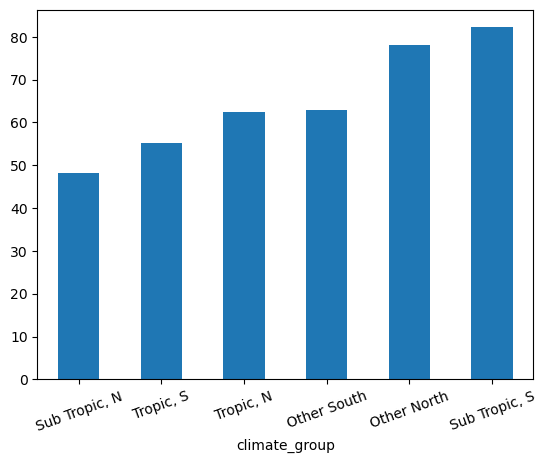

In [517]:
FullyFilled.groupby('climate_group')['Fatalities Index'].mean().sort_values().plot(kind = 'bar')
plt.xticks(rotation = 20)
plt.show()

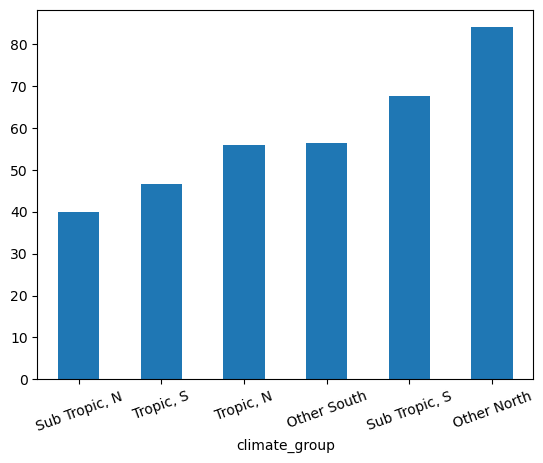

In [518]:

FullyFilled.groupby('climate_group')['Fatalities Index'].median().sort_values().plot(kind = 'bar')
plt.xticks(rotation = 20)
plt.show()

# Very interesting that SubTropic South is so low ranking here '.mean()'. (remember the bigger the index the less fatal)
#  NB tho, median(reverses the last two). So there must be a couple severe outliers in Other North

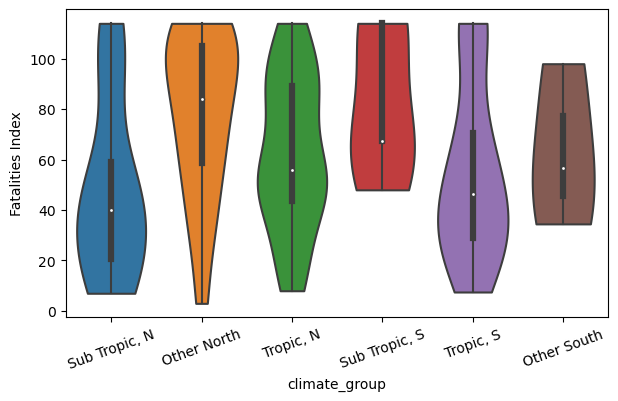

In [519]:
plt.figure(figsize = (7,4))

sns.violinplot(x = 'climate_group', y = 'Fatalities Index', data=FullyFilled, cut=0)
plt.xticks(rotation = 20)

plt.show()

# Can for sure see that 'Other North' has a central tendency indicating high index rank but also has a few of the worst effected

In [520]:
FullyFilled[FullyFilled['climate_group']=='Sub Tropic, S']['country']

Country Code
ZAF    South Africa
SWZ       Swaziland
URY         Uruguay
AUS       Australia
PRY        Paraguay
Name: country, dtype: object

In [521]:
#### Eh. Not sure if i need this
#colstoInitMove=['Country Name', 'country', 'rw_country_code',] #'Country Code']
#notmoving=list(set(climateCstats.columns) - set(colstoInitMove))
#notmovingOther=list(set(climateCSBig.columns)-set(notmoving))
#climateCSBig1=climateCSBig[['Country Name', 'country', 'rw_country_code', 'Country Code', *notmoving, *notmovingOther]]

In [522]:
## I think the next step is gonna be grouping this all into e.g. economy, geography, population, infrastructure?\
#(I expect/think i'll look most at where geography and economy overlap)
# Also cleaning 2017 USD
# Also checking back at whatever task I was going to do before
# Also maybe getting rid of a lot of that 'value added stuff' (make new df without it)
# Can message One of the Data guys personally (on linkedin maybe? if noone replies) about splitting it into multiple DFs. with the Groupings though maybe shouldnt be too bad?
# Can also compare health spending stats; also can probs delete fertility stat

##### #### I think Before Grouping/Spliting or whatever, I think its wisest to Seperate out what I dont want (at least until later)

In [523]:
ValAddedDf=FullyFilled_num.loc[:,FullyFilled_num.columns.str.contains('value added')]
ValAddedCols=FullyFilled_num.columns[FullyFilled_num.columns.str.contains('value added')]
ValAddedCols

Index(['Textiles and clothing percent of value added in manufacturing',
       'Machinery and transport equipment percent of value added in manufacturing',
       'Manufacturing, value added percent of GDP',
       'Other manufacturing percent of value added in manufacturing',
       'Gross value added at basic prices GVA constant 2015 USD',
       'Agriculture, forestry, and fishing, value added percent of GDP',
       'Agriculture, forestry, and fishing, value added annual percent growth',
       'Agriculture, forestry, and fishing, value added per worker constant 2015 USD'],
      dtype='object')

In [524]:
## pop growth, rural and urban pop growths, GDP and GNI (/per capitas) growth - These Last miiight be interesting to explore further as they may indicate aid/stimulation measures (but again this would be omething for late and something that first and foremost reqs IMF/WB intervention things)
#Trends2BAware4Policy
Trends2BAware4PolicyDF=FullyFilled_num.loc[:,(FullyFilled_num.columns.str.contains('growth'))] #& (~FullyFilled_num.columns.str.contains('formation'))]     I think because GCF is useful it can and should g in the trends to be aware of
Trends2BAware4PolicyCols=FullyFilled_num.columns[(FullyFilled_num.columns.str.contains('growth'))] #& (~FullyFilled_num.columns.str.contains('formation'))]
Trends2BAware4PolicyCols

Index(['Gross capital formation annual percent growth',
       'Exports of goods and services annual percent growth',
       'Agriculture, forestry, and fishing, value added annual percent growth',
       'Imports of goods and services annual percent growth',
       'GNI growth annual percent', 'Rural population growth annual percent',
       'Urban population growth annual percent', 'GDP growth annual percent',
       'GDP per capita growth annual percent',
       'GNI per capita growth annual percent',
       'Population growth annual percent'],
      dtype='object')

In [525]:
## GCF is how much is being invested back into the economy (could help track both outflows of money? fiscal stagnation?
#(hopefully doesnt count foreign returns on investment as investment but It shouldnt because this is profit.
#It may be 'an incentive' but its not a material investment))

FullyFilled_num.loc[:,(FullyFilled_num.columns.str.contains('ormation') & (~FullyFilled_num.columns.isin(Trends2BAware4PolicyCols)))]


,Gross capital formation percent of GDP,Gross capital formation constant 2015 USD
Country Code,,
SAU,34.223505,2.291210e+11
ROU,25.521694,4.539898e+10
ESP,18.987433,2.271200e+11
SSD,5.750756,6.899643e+08
SLE,15.407139,6.551161e+08
ZAF,18.633207,6.460315e+10
SRB,18.681026,7.408138e+09
SVK,24.627085,2.189370e+10
SLB,15.945207,2.085489e+08


In [526]:
## Q: Hmm imports/exports goods and servs % growth. do i have an alternative?

FullyFilled_num.loc[:,FullyFilled_num.columns.str.contains('goods')]

# A: Yes

,"Net trade in goods and services BoP, 2015 USD",Exports of goods and services percent of GDP,ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Exports of goods, services and primary income BoP, 2015 USD",Exports of goods and services 2015 USD,Imports of goods and services percent of GDP,Imports of goods and services annual percent growth,Imports of goods and services constant 2015 USD,"Imports of goods, services and primary income BoP, 2015 USD"
Country Code,,,,,,,,,,,
SAU,-2.216940e+10,32.563925,0.160367,2.180100e+11,0.687384,1.843261e+11,1.649716e+11,36.939958,-1.152081,2.473070e+11,1.934196e+11
ROU,-1.093365e+09,41.349484,3.664775,7.355407e+10,4.583192,5.936829e+10,5.565953e+10,42.171679,8.507855,7.501662e+10,6.185741e+10
ESP,2.749133e+10,33.610861,1.248703,4.020390e+11,4.316234,3.502535e+11,3.042293e+11,30.572344,5.076943,3.656930e+11,3.229966e+11
SSD,-5.879304e+08,36.651349,0.620566,4.397356e+09,-52.310687,1.918116e+09,3.327549e+09,28.900000,-41.000000,3.467364e+09,2.747719e+09
SLE,-1.095688e+09,19.210881,0.169581,8.168523e+08,-55.089356,5.962262e+08,6.181251e+08,47.068477,-18.269543,2.001365e+09,1.777054e+09
ZAF,-3.372157e+09,27.713638,1.423563,9.608590e+10,3.059774,7.887022e+10,7.270972e+10,29.013038,5.044861,1.005910e+11,8.820129e+10
SRB,-2.447577e+09,45.177242,1.210330,1.791546e+10,9.275845,1.377157e+10,1.355692e+10,52.218525,3.963024,2.070775e+10,1.760987e+10
SVK,7.827033e+08,91.600474,16.666781,8.143363e+10,6.644266,6.367942e+10,6.162212e+10,88.587558,8.518328,7.875512e+10,6.404637e+10
SLB,-7.141054e+07,40.360520,0.000588,5.278792e+08,-6.465541,4.370563e+08,3.994546e+08,47.827893,0.776213,6.255457e+08,5.267230e+08


In [527]:
FullyFilled_num.loc[:,FullyFilled_num.columns.str.contains('land')]

,Agricultural land percent of land area,Agricultural land sq. km,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area where elevation is below 5 meters percent of total land area,Population density people per sq. km of land area,Rural land area sq. km,Rural land area where elevation is below 5 meters percent of total land area,Permanent cropland percent of land area,Urban land area sq. km,Urban land area where elevation is below 5 meters percent of total land area,Forest area percent of land area
Country Code,,,,,,,,,,,,,
SAU,80.773042,1736370.000,1.623490,0.106565,3490000.0,0.380595,15.234684,1.908957e+06,0.360796,0.068382,7756.634132,0.019799,0.454484
ROU,60.231224,138580.000,38.151947,0.442984,8778000.0,1.385362,86.124896,2.299058e+05,1.373999,1.847184,5124.834377,0.011364,29.993741
ESP,53.189062,265765.000,24.573101,0.264361,12278220.0,0.816065,92.952686,4.889257e+05,0.648742,9.826002,15655.069410,0.167323,37.127532
SSD,44.929106,283920.500,4.016030,0.226709,2537850.0,0.000000,17.714460,6.236250e+05,0.000000,0.128179,666.354722,0.000000,11.325622
SLE,54.710446,39490.000,21.945137,0.216548,1584000.0,5.256683,101.340718,7.191078e+04,5.203343,2.285952,713.580516,0.053340,36.485592
ZAF,79.417850,963410.000,9.892094,0.214759,12000000.0,0.114151,46.061301,1.204427e+06,0.106017,0.340453,15118.662080,0.008134,14.205121
SRB,39.801052,34810.000,29.624971,0.365167,2591000.0,0.000000,81.127178,7.445258e+04,0.000000,2.286760,2323.390620,0.000000,31.094558
SVK,39.278732,18886.000,28.077035,0.248903,1350000.0,0.000000,112.803149,4.687644e+04,0.000000,0.374360,1805.386356,0.000000,39.968179
SLB,4.144337,1160.000,0.821722,0.037541,23000.0,7.290033,21.888532,2.841450e+04,7.263445,3.036799,37.833488,0.026588,90.268667


In [528]:
FullyFilled_num['Habitable Land'] = FullyFilled_num['Urban land area sq. km'] + FullyFilled_num['Agricultural land sq. km']
FullyFilled['Habitable Land'] = FullyFilled['Urban land area sq. km'] + FullyFilled['Agricultural land sq. km']

FullyFilled_num['Habitable Land']

Country Code
SAU    1.744127e+06
ROU    1.437048e+05
ESP    2.814201e+05
SSD    2.845869e+05
SLE    4.020358e+04
ZAF    9.785287e+05
SRB    3.713339e+04
SVK    2.069139e+04
SLB    1.197833e+03
SWZ    1.229792e+04
TUR    4.009707e+05
TZA    3.898879e+05
THA    2.479667e+05
BHS    3.337442e+02
UGA    1.480041e+05
VNM    1.500934e+05
GBR    1.940560e+05
URY    1.456939e+05
USA    4.233760e+06
VUT    1.897943e+03
ARE    6.091105e+03
UKR    4.313513e+05
BOL    3.792659e+05
BEL    2.101088e+04
CIV    2.249820e+05
HRV    1.702041e+04
LKA    3.102783e+04
ECU    6.018385e+04
EGY    5.681673e+04
SWE    3.434773e+04
MDA    2.475610e+04
MEX    1.015388e+06
AUS    3.493136e+06
AGO    4.608813e+05
GRC    6.473866e+04
GIN    1.468407e+05
HND    3.532693e+04
GHA    1.297147e+05
HUN    5.656883e+04
IRN    4.757571e+05
IRQ    9.926297e+04
IDN    6.457551e+05
ITA    1.503667e+05
IRL    4.556139e+04
ALB    1.257069e+04
DZA    4.239211e+05
AUT    3.015821e+04
ARG    1.218827e+06
BIH    2.340193e+04
KHM    

In [529]:
## potntially pop density implies city count; also check str.contains(city)
## I Think figure out my country samples now?      I think the way to do this is to figure out which countries/indexes have the most NaNs.
# Then sort currencies/go back to grouping?


# then go back to grouping? hmm I think it makes most sense to do top 50 CRI rank (hmm no i think CRI rank weights econ most, so top 50 in top ppp,ppp,gdp,gdp,fat,fat,fat,fat hmmm)

In [530]:
##LandPopShape
LandPopShape=FullyFilled_num.loc[:,((FullyFilled_num.columns.str.contains('gric') | FullyFilled_num.columns.str.contains('ural')\
                                   | FullyFilled_num.columns.str.contains('rban') | FullyFilled_num.columns.str.contains('ity'))\
                                    | FullyFilled_num.columns.str.contains('abitable') | FullyFilled_num.columns.str.upper().str.contains('INDEX')\
                                    | FullyFilled_num.columns.str.upper().str.contains('RANK')
                                  & (~FullyFilled_num.columns.isin(ValAddedCols)) & (~FullyFilled_num.columns.str.upper().str.contains('LOSSES'))\
                                    & (~FullyFilled_num.columns.isin(Trends2BAware4PolicyCols)))]
LandPopShape

,Fatalities Index,cri_rank,fatalities_per_100k_rank,fatalities_rank,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,Population density people per sq. km of land area,Rural land area sq. km,...,Employment in agriculture percent of total employment modeled ILO estimate,Rural population,Rural population percent of total population,Rural population growth annual percent,Rural population living in areas where elevation is below 5 meters percent of total population,Urban population percent of total population,Urban population growth annual percent,Urban population living in areas where elevation is below 5 meters percent of total population,Urban population,Habitable Land
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,79,18,18,80.773042,1736370.000,0.041730,0.709904,15.234684,1.908957e+06,...,5.928436,5508524.0,16.820,0.625130,0.684172,83.180,2.189460,2.523845,27241324.0,1.744127e+06
ROU,107.0,61,112,102,60.231224,138580.000,1.725463,1.583415,86.124896,2.299058e+05,...,25.585658,9137575.0,46.113,-0.441853,0.081375,53.887,-0.494177,0.246959,10678041.0,1.437048e+05
ESP,60.5,69,74,47,53.189062,265765.000,1.028850,1.219005,92.952686,4.889257e+05,...,4.123886,9473817.0,20.398,-1.227919,0.626205,79.602,0.219325,3.372221,36971015.0,2.814201e+05
SSD,114.0,133,114,114,44.929106,283920.500,1.563652,1.191393,17.714460,6.236250e+05,...,60.366485,9083950.0,81.148,-0.447568,0.000000,18.852,1.036605,0.000000,2110349.0,2.845869e+05
SLE,55.0,102,42,68,54.710446,39490.000,0.731767,0.836547,101.340718,7.191078e+04,...,55.948263,4328224.0,59.171,1.739984,2.349253,40.829,3.385804,1.187167,2986549.0,4.020358e+04
ZAF,67.5,33,84,51,79.417850,963410.000,2.302119,0.931559,46.061301,1.204427e+06,...,15.437600,19652884.0,35.172,0.617599,0.085390,64.828,2.873153,0.114057,36223620.0,9.785287e+05
SRB,114.0,83,114,114,39.801052,34810.000,1.563652,1.191393,81.127178,7.445258e+04,...,19.408654,3143538.0,44.304,-0.749521,0.000000,55.696,-0.291666,0.000000,3951845.0,3.713339e+04
SVK,99.5,123,97,102,39.278732,18886.000,0.917710,1.018973,112.803149,4.687644e+04,...,3.175869,2500969.0,46.111,0.336034,0.000000,53.889,-0.110722,0.000000,2922832.0,2.069139e+04
SLB,70.5,89,39,102,4.144337,1160.000,38.790699,0.661805,21.888532,2.841450e+04,...,40.354281,475669.0,77.640,1.930560,16.065929,22.360,4.623815,1.797857,136991.0,1.197833e+03


In [531]:
FullyFilled_num.columns[FullyFilled_num.columns.str.contains('ity')]

Index(['Population density people per sq. km of land area'], dtype='object')

In [532]:
pd.set_option('plotting.backend', 'pandas_bokeh')

In [533]:
habfig = LandPopShape.sort_values(by = 'Fatalities Index', ascending = False).plot(y = 'Habitable Land', show_figure = False)
habfig.width = 850
#habfig.xaxis.ticker = LandPopShape.iloc[::10,0]

show(habfig)
## There seems to be some kind of correlation

In [534]:
farmfig = LandPopShape.sort_values(by = 'Fatalities Index', ascending = False).plot(y = 'Agricultural land percent of land area', show_figure = False)
farmfig.width = 850


show(farmfig)

## Hmm less of a correlation.although i guess that makes sense because more land is safer on the one hand but also indicates an agricultural society which is less safe

In [535]:
Urbfig = LandPopShape.sort_values(by = 'Fatalities Index', ascending = False).plot(y = 'Urban land area sq. km', show_figure = False)
Urbfig.width = 850

show(Urbfig)
#possible trend. kinda similar to habitable land trend.  already interesting

In [536]:
pd.set_option('display.max_columns', None)

In [537]:
# Ok oops. So here i'm looking at countries with high death rates, low farmwork rates IN the affected regions. Not sure what good this is.
FullyFilled[((FullyFilled['Fatality_index_Groups'] == 'Very High Deaths') | (FullyFilled['Fatality_index_Groups'] == 'High Deaths')) &\
           (FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate']<FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].median()) &\
            ((FullyFilled['climate_group'].str.contains('Sub Tropic, N') | \
              FullyFilled['climate_group'].str.contains('Tropic, S')))]      # The Two Most Fatally affected Regions

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 

In [538]:
# Ok so its interesting. You can see its extremely rare to have a Small Agrarian Workforce & to have significant death counts.


In [539]:
pd.set_option('display.max_columns', 20)

In [540]:
SomehowDying = FullyFilled[((FullyFilled['Fatality_index_Groups'] == 'Very High Deaths') | \
             (FullyFilled['Fatality_index_Groups'] == 'High Deaths')) &\
           (FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'] < \
            FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].median())]
SomehowDying

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,GDP growth annual percent,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude,climate_group,Habitable Land
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,4.690145,2.694521,2.688027,1.924622,1.307606e+10,Very High Deaths,23.885942,45.079162,"Sub Tropic, N",1.744127e+06
BHS,20.5,The Bahamas,7,22.83,2,9.07,39,33,11,0.9035,...,0.996231,0.079105,-0.346102,0.912227,-3.744381e+08,Very High Deaths,25.034280,-77.396280,"Sub Tropic, N",3.337442e+02
USA,31.5,United States,21,36.17,55,0.10,8,325,48,0.1504,...,2.706370,1.953004,2.458577,0.736217,1.665743e+11,High Deaths,37.090240,-95.712891,Other North,4.233760e+06
BEL,5.5,Belgium,46,52.83,6,3.66,5,410,108,0.0088,...,2.041459,1.451893,1.523878,0.579446,4.951374e+09,Very High Deaths,50.503887,4.469936,Other North,2.101088e+04
IRN,46.0,Islamic Republic of Iran,44,52.17,62,0.08,30,65,69,0.0708,...,-1.424885,-3.629417,-4.100838,2.261785,2.302643e+08,High Deaths,32.427908,53.688046,"Sub Tropic, N",4.757571e+05
IRQ,33.5,Iraq,93,78.00,37,0.18,30,65,125,0.0006,...,4.722864,1.917912,1.771199,2.714976,-1.147338e+09,High Deaths,33.223191,43.679291,"Sub Tropic, N",9.926297e+04
ITA,21.0,Italy,19,34.83,29,0.29,13,174,62,0.0958,...,0.778304,0.875477,0.775990,-0.096376,-9.608222e+09,Very High Deaths,41.871940,12.567380,Other North,1.503667e+05
CHL,34.5,Chile,10,25.17,32,0.22,37,39,19,0.6267,...,2.151942,1.105758,3.188695,1.029426,-4.503365e+09,High Deaths,-35.675147,-71.542969,Other South,1.315576e+05
COL,26.5,Colombia,33,45.67,31,0.22,22,108,76,0.0496,...,2.955901,1.990616,3.706353,0.941994,-2.894351e+09,High Deaths,4.570868,-74.297333,"Tropic, N",4.529586e+05


In [541]:
# Ok so first of all. the first thing to note is that this is a small dataset.
# The Majority of highdeath countries have at least a Medium level of agricultural employment.
# But this is actually the median(). what if i group into more objective and even groups

In [542]:
pd.set_option('display.max_rows', 6)

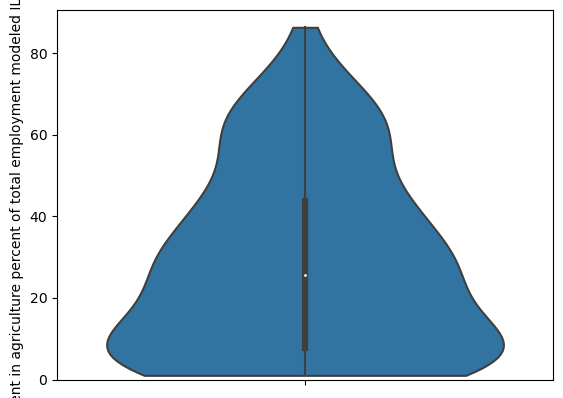

In [543]:
sns.violinplot(y='Employment in agriculture percent of total employment modeled ILO estimate', data = FullyFilled, cut=0)
plt.ylim(0) 
plt.show()

# Ok so Given shape of the below violin chart, 
# It doesnt make sense to use Size_Grouper as size is relative and the most common employment percent is around 20%

In [544]:
to_percentile = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate']
def Relative_Size_Grouper(x, variable = 'Percent Farmers', percentile = to_percentile.quantile([0.2, 0.4, 0.6, 0.8])):
    VLowP_Thresh, LowP_Thresh, MidP_Thresh, HighP_Thresh = percentile
    
    if x <= VLowP_Thresh:
        return f'Very Low {variable}'
    elif x <= LowP_Thresh:
        return f'Low {variable}'
    elif x <= MidP_Thresh:
        return f'Medium {variable}'
    elif x <= HighP_Thresh:
        return f'High {variable}'
    else:
        return f'Very High {variable}'

In [545]:
FullyFilled['Farm_Work_PCent_Group'] = FullyFilled['Employment in agriculture percent of total employment modeled ILO estimate'].apply(Relative_Size_Grouper)
FullyFilled.head()

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude,climate_group,Habitable Land,Farm_Work_PCent_Group
Country Code,,,,,,,,,,,,,,,,,,,,,
SAU,18.0,Saudi Arabia,79,72.50,18,0.45,18,140,131,0.0001,...,2.694521,2.688027,1.924622,1.307606e+10,Very High Deaths,23.885942,45.079162,"Sub Tropic, N",1.744127e+06,Low Percent Farmers
ROU,107.0,Romania,61,61.50,112,0.01,102,1,16,0.6746,...,3.646554,2.958805,-0.470052,-1.414073e+09,Very Few Deaths,45.943161,24.966760,Other North,1.437048e+05,Medium Percent Farmers
ESP,60.5,Spain,69,66.33,74,0.05,47,22,86,0.0394,...,3.919117,4.438222,-0.077589,-1.989819e+08,Medium Deaths,40.463667,-3.749220,Other North,2.814201e+05,Very Low Percent Farmers
SSD,114.0,South Sudan,133,117.33,114,0.00,114,0,120,0.0021,...,-10.642074,-5.799706,-0.169452,-1.116156e+09,Very Few Deaths,12.862807,30.217636,"Tropic, N",2.845869e+05,Very High Percent Farmers
SLE,55.0,Sierra Leone,102,88.50,42,0.16,68,10,124,0.0011,...,-22.383315,-21.222686,2.408687,-1.786899e+07,Medium Deaths,8.460555,-11.779889,"Tropic, N",4.020358e+04,Very High Percent Farmers


In [546]:
FullyFilled['Labor tax and contributions percent of commercial profits'].median(), FullyFilled['Labor tax and contributions percent of commercial profits'].max(),
FullyFilled[FullyFilled['Labor tax and contributions percent of commercial profits']==FullyFilled['Labor tax and contributions percent of commercial profits'].max()]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude,climate_group,Habitable Land,Farm_Work_PCent_Group
Country Code,,,,,,,,,,,,,,,,,,,,,
FRA,3.0,France,16,33.33,4,5.19,2,3336,85,0.0401,...,0.754024,1.748671,0.355569,3.986102e+10,Very High Deaths,46.227638,2.213749,Other North,310299.66088,Very Low Percent Farmers


In [547]:
FullyFilled[FullyFilled['Profit tax percent of commercial profits']==FullyFilled['Profit tax percent of commercial profits'].max()]

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,...,GDP per capita growth annual percent,GNI per capita growth annual percent,Population growth annual percent,Net primary income Net income from abroad 2015 USD,Fatality_index_Groups,latitude,longitude,climate_group,Habitable Land,Farm_Work_PCent_Group
Country Code,,,,,,,,,,,,,,,,,,,,,
LBR,97.0,Liberia,98,86.0,92,0.02,102,1,59,0.0983,...,-2.03303,2.286596,2.035414,-2.118804e+08,Very Few Deaths,6.428055,-9.429499,"Tropic, N",18817.088365,High Percent Farmers


In [548]:
FullyFilled[['Labor tax and contributions percent of commercial profits', 'Profit tax percent of commercial profits']]

,Labor tax and contributions percent of commercial profits,Profit tax percent of commercial profits
Country Code,,
SAU,12.8,2.2
ROU,30.0,10.9
ESP,35.6,13.4
...,...,...
RWA,5.6,25.8
QAT,11.3,0.0
TGO,23.1,10.7


In [549]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [550]:
SomehowDying = FullyFilled[((FullyFilled['Fatality_index_Groups'] == 'Very High Deaths') | \
                            (FullyFilled['Fatality_index_Groups'] == 'High Deaths')) & \
                           (FullyFilled['Farm_Work_PCent_Group'].str.upper().str.contains('LOW'))]
SomehowDying

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 

In [551]:
Dying = FullyFilled[((FullyFilled['Fatality_index_Groups'] == 'Very High Deaths') |\
                            (FullyFilled['Fatality_index_Groups'] == 'High Deaths'))]
Dying.shape[0], SomehowDying.shape[0]

(46, 14)

In [552]:
SomehowDying = SomehowDying.set_index('country')

In [553]:
SomehowDying.loc[:,SomehowDying.columns.str.upper().str.contains('TAX')]

,Customs and other import duties percent of tax revenue,Other taxes percent of revenue,Labor tax and contributions percent of commercial profits,Profit tax percent of commercial profits
country,,,,
Saudi Arabia,26.370859,2.306535,12.8,2.2
The Bahamas,20.476368,6.491286,6.3,0.0
United States,1.863385,0.580888,9.8,28.1
Belgium,6.943738,0.545701,49.4,8.4
Islamic Republic of Iran,6.943738,1.191736,25.9,17.8
Iraq,12.614545,0.131056,13.5,15.0
Italy,6.943738,4.633504,43.4,19.5
Chile,1.162273,3.636434,5.3,22.0
Colombia,3.649827,6.369669,18.6,22.1


In [554]:
StrCols = ['country', 'rw_country_code', 'Country Code', 'Fatality_index_Groups', 'climate_group', 'Farm_Work_PCent_Group']
StrCols

['country',
 'rw_country_code',
 'Country Code',
 'Fatality_index_Groups',
 'climate_group',
 'Farm_Work_PCent_Group']

In [555]:
pd.set_option('display.max_columns', 1)
pd.set_option('display.max_rows', None)

In [556]:
# Because of the following I'm going to Use Spearman's Rank (should probably go back and change this in previours Corrs).

#Magnitude of Correlation:

#The correlation coefficient’s magnitude might be affected by the non-linear relationship between 
# ranks and the actual values. If the ranking doesn’t correspond linearly to the changes in the 
# other variable, the correlation might be weaker.

In [557]:
YDyingNoStr = SomehowDying.loc[:,(~SomehowDying.columns.isin(StrCols))]
YDyingNoStr_Corr = YDyingNoStr.corr(method = 'spearman').sort_values(by = 'Fatalities Index', ascending = False)
YDyingNoStr_Corr

,Fatalities Index,...
Fatalities Index,1.000000,...
fatalities_per_100k_rank,0.736264,...
Employment in industry percent of total employment modeled ILO estimate,0.683516,...
Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,0.674725,...
fatalities_rank,0.631464,...
Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports,0.600000,...
longitude,0.595604,...
Employment in agriculture percent of total employment modeled ILO estimate,0.538462,...
"Tariff rate, most favored nation, weighted mean, primary products percent",0.506085,...
Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,0.498901,...


In [558]:
# [
# The lower 'Profit tax percent of commercial profits' this is the Worse the death rank. 46%
# The Higher the Labour Tax the Worse the death rank  -51%     NB- Spearmanned = -20%
# High Emp in Industry = Good.  57%
# The higher the Tarif Rate on the primary products and to the most favoured nation, the Better the Death Rank.  55%
# Ok weird :   High Emp in Agriculture = Good.  41% (16% lower than industry but still weird)
# Also Weird:   High Emp in Services = Bad -61%

#Corr not Cause:   Interesting that High Trade with Poor and Middle countries in East Asia and Pacific, correlates with Better rank ().     I think about High Tech Trade (with e.g. Korea, China, Japan etc.). Whatever the product defo corr not cause (correlated to high income consumer practices and possibly to Which Industries domestic economies are built on).         [This Next NO NO Wrong --> I guess this is partially about oil and weapons and a lot about trade in general as the other merch exp and imp (perc of merch) follow close behind. More of a correlation Than Causation.
                # Which Corr Though?   Industry or High-Income Consumer Practices?
    
# ]    These were with Pearsons rank corr. Im gonna use Spearmans

"""
 - High Emp in Industry = Good. 68%
 - Same as above regarding trade with Poor and Mid, East Asia and Pacific
 - Far East is good (big longitute) 60%.   Indicating Geo-spatial factors i reckon as being near Meridian Line (Africa) or '-x' (Caribean n Hurricains) might be hard. Also far east youre more likely in sub-tropics than tropics.
 - High Emp in Farms  = Good. 54%
 - High Tariff rate on the primary products and to the most favoured nation = Good. 51%        - NB. Weighted is most useful Here by far (accounting for different sector's importance, different trade's importance, different primary product's importance)
 - High Farm, Forestry and Fishing Value Added %GDP = Good. 49%
 - High Ores n Metal exports %merch exp = Good. 45%
 - High 'Other' manufacturing (%value added in manufacturing) = Good. 45%
 -       High Merch imp and Exp from Poor and Mid South Asia (agriculture and textiles mainly i think?) = good. 
 - High Profit Tax %Commerce profits = Good. 42%
 -         Probs more Corr than Cause:  High Immigration = good. 40%, Same with High Refugee pop = good. 40%
 - High Gross Domestic Savings = Good. 37%
 
 NOW 4 Bad
 
 - High Merch Exports to High income countries %merch exp = BAD. -75%     Cause or Corr or both?   HMMM --> But a Lot of these arent poor? Worse deals from more Less purchasing power/Currency Depreciation/Unfavourable(/difficult fiscal debt servicing requirements) dependency/less political power/classic primitive accumilation? More likely to demand favourable business deals (friendlier tarif rates)? 
 - High Emp in Services = Bad. -64%      Cause or Corr?
 
 ##   Come back to this.
 """

"\n - High Emp in Industry = Good. 68%\n - Same as above regarding trade with Poor and Mid, East Asia and Pacific\n - Far East is good (big longitute) 60%.   Indicating Geo-spatial factors i reckon as being near Meridian Line (Africa) or '-x' (Caribean n Hurricains) might be hard. Also far east youre more likely in sub-tropics than tropics.\n - High Emp in Farms  = Good. 54%\n - High Tariff rate on the primary products and to the most favoured nation = Good. 51%        - NB. Weighted is most useful Here by far (accounting for different sector's importance, different trade's importance, different primary product's importance)\n - High Farm, Forestry and Fishing Value Added %GDP = Good. 49%\n - High Ores n Metal exports %merch exp = Good. 45%\n - High 'Other' manufacturing (%value added in manufacturing) = Good. 45%\n -       High Merch imp and Exp from Poor and Mid South Asia (agriculture and textiles mainly i think?) = good. \n - High Profit Tax %Commerce profits = Good. 42%\n -       

In [559]:
YDyingNoStr_Corr.loc['Labor tax and contributions percent of commercial profits', 'Fatalities Index']

-0.2087912087912088

In [560]:
GNI_method = 'Atlas method 2015 USD'
YDyingNoStr_Corr.loc['Fatalities Index', f'GNI per capita, {GNI_method}']
# GDP Total doesnt make much difference
# GNI per capita definetely makes a difference but a Negative One??

-0.5340659340659341

In [561]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
SomehowDying.head(2)

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 5 meters

In [562]:
SomehowDying.index

Index(['Saudi Arabia', 'The Bahamas', 'United States', 'Belgium',
       'Islamic Republic of Iran', 'Iraq', 'Italy', 'Chile', 'Colombia',
       'France', 'Japan', 'Russia', 'Oman', 'Lebanon'],
      dtype='object', name='country')

In [563]:
## So the method is Go through the variables that correlate most to
#  Fat index for SomehowDying on a graph with SomehowDying seperate to ExpectedDying

def Whats_different(x, different_grp = SomehowDying.index.to_list(), variable = 'Dying'):
    if x in different_grp:
        return f'Somehow {variable}'
    else:
        return f'Expected Surviving'#Not {variable}'

In [564]:
Dying['Fatality_Deviant'] = Dying['country'].apply(Whats_different)
FullyFilled['Fatality_Deviant'] = FullyFilled['country'].apply(Whats_different)

In [565]:
Dying.head()

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 

In [566]:
Dying.head()

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 

In [567]:
def color_coder(x):
    if x == 'Somehow Dying':
        return 'red'
    else:
        return 'blue'


Dying['color_col'] = Dying['Fatality_Deviant'].apply(color_coder)
FullyFilled['color_col'] = FullyFilled['Fatality_Deviant'].apply(color_coder)

Dying.head()

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 

In [568]:
colour_plot_list = Dying['color_col'].to_list()
type(colour_plot_list)

list

In [569]:
variable = 'Merchandise exports to highincome economies percent of total merchandise exports'
df = Dying

# Had to make a FactorRange for the x-axis because Bokeh was refusing to plot data onto the blank figure.
# Plus It looks Nicer if theres a clear seperation between SomehowDying and ExpectedDying

country_names = df[df['country'].isin(df['country'].unique())]#.tolist()
country_names = country_names.sort_values(by = 'Fatality_Deviant', ascending = False)
country_names = country_names['country'].tolist()
x_range = FactorRange(*country_names)

Dying_Deviant_Plot = figure(width=750, height=350, x_range=x_range)

Dying_Deviant_Plot.scatter(x = df['country'], y = df[variable],\
                           fill_color = colour_plot_list, hatch_color = colour_plot_list, size = 8, alpha = 0.8)

Dying_Deviant_Plot.xaxis.major_label_orientation = 0.2 * 3.14

Dying_Deviant_Plot.title = variable

show(Dying_Deviant_Plot)

In [570]:
# Ok so High Merchandise exports to highincome economies is only marginally higher amoungst SomehowDying.


# However, I think whilst i'm on the right track trying to see what these countries have in common, I think I
# should be comparing their data with other Few Farmer countries rather than other High Deaths countries (the
# latter will have some similarity stuffs)

In [571]:
FewFarmEmps = FullyFilled[FullyFilled['Farm_Work_PCent_Group'].str.upper().str.contains('LOW')]
FewFarmEmps.shape[0]

53

In [572]:
# [
# The lower 'Profit tax percent of commercial profits' this is the Worse the death rank. 46%
# The Higher the Labour Tax the Worse the death rank  -51%     NB- Spearmanned = -20%
# High Emp in Industry = Good.  57%
# The higher the Tarif Rate on the primary products and to the most favoured nation, the Better the Death Rank.  55%
# Ok weird :   High Emp in Agriculture = Good.  41% (16% lower than industry but still weird)
# Also Weird:   High Emp in Services = Bad -61%

#Corr not Cause:   Interesting that High Trade with Poor and Middle countries in East Asia and Pacific, correlates with Better rank ().     I think about High Tech Trade (with e.g. Korea, China, Japan etc.). Whatever the product defo corr not cause (correlated to high income consumer practices and possibly to Which Industries domestic economies are built on).         [This Next NO NO Wrong --> I guess this is partially about oil and weapons and a lot about trade in general as the other merch exp and imp (perc of merch) follow close behind. More of a correlation Than Causation.
                # Which Corr Though?   Industry or High-Income Consumer Practices?
    
# ]    These were with Pearsons rank corr. Im gonna use Spearmans

"""
 - High Emp in Industry = Good. 68%
 - Same as above regarding trade with Poor and Mid, East Asia and Pacific
 - Far East is good (big longitute) 60%.   Indicating Geo-spatial factors i reckon as being near Meridian Line (Africa) or '-x' (Caribean n Hurricains) might be hard. Also far east youre more likely in sub-tropics than tropics.
 - High Emp in Farms  = Good. 54%
 - High Tariff rate on the primary products and to the most favoured nation = Good. 51%        - NB. Weighted is most useful Here by far (accounting for different sector's importance, different trade's importance, different primary product's importance)
 - High Farm, Forestry and Fishing Value Added %GDP = Good. 49%
 - High Ores n Metal exports %merch exp = Good. 45%
 - High 'Other' manufacturing (%value added in manufacturing) = Good. 45%
 -       High Merch imp and Exp from Poor and Mid South Asia (agriculture and textiles mainly i think?) = good. 
 - High Profit Tax %Commerce profits = Good. 42%
 -         Probs more Corr than Cause:  High Immigration = good. 40%, Same with High Refugee pop = good. 40%
 - High Gross Domestic Savings = Good. 37%
 
 NOW 4 Bad
 
 - High Merch Exports to High income countries %merch exp = BAD. -75%     Cause or Corr or both?   HMMM --> But a Lot of these arent poor? Worse deals from more Less purchasing power/Currency Depreciation/Unfavourable(/difficult fiscal debt servicing requirements) dependency/less political power/classic primitive accumilation? More likely to demand favourable business deals (friendlier tarif rates)? 
 - High Emp in Services = Bad. -64%      Cause or Corr?
 
 ##   Come back to this.
 """

"\n - High Emp in Industry = Good. 68%\n - Same as above regarding trade with Poor and Mid, East Asia and Pacific\n - Far East is good (big longitute) 60%.   Indicating Geo-spatial factors i reckon as being near Meridian Line (Africa) or '-x' (Caribean n Hurricains) might be hard. Also far east youre more likely in sub-tropics than tropics.\n - High Emp in Farms  = Good. 54%\n - High Tariff rate on the primary products and to the most favoured nation = Good. 51%        - NB. Weighted is most useful Here by far (accounting for different sector's importance, different trade's importance, different primary product's importance)\n - High Farm, Forestry and Fishing Value Added %GDP = Good. 49%\n - High Ores n Metal exports %merch exp = Good. 45%\n - High 'Other' manufacturing (%value added in manufacturing) = Good. 45%\n -       High Merch imp and Exp from Poor and Mid South Asia (agriculture and textiles mainly i think?) = good. \n - High Profit Tax %Commerce profits = Good. 42%\n -       

In [573]:
#So Here Im checking Spearman's SomehowDying Corrs against FewFarms Graph
pd.set_option('display.max_columns', 1)
YDyingNoStr = SomehowDying.loc[:,(~SomehowDying.columns.isin(StrCols))]
YDyingNoStr_Corr = YDyingNoStr.corr(method = 'spearman').sort_values(by = 'Fatalities Index', ascending = False)
YDyingNoStr_Corr

,Fatalities Index,...
Fatalities Index,1.000000,...
fatalities_per_100k_rank,0.736264,...
Employment in industry percent of total employment modeled ILO estimate,0.683516,...
Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,0.674725,...
fatalities_rank,0.631464,...
Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports,0.600000,...
longitude,0.595604,...
Employment in agriculture percent of total employment modeled ILO estimate,0.538462,...
"Tariff rate, most favored nation, weighted mean, primary products percent",0.506085,...
Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,0.498901,...


In [574]:
#So Here Im checking Spearman's SomehowDying Corrs against FewFarms Graph

##variable = 'Employment in industry percent of total employment modeled ILO estimate'
##variable = 'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports'
##variable = 'Tariff rate, most favored nation, weighted mean, primary products percent'
##variable = 'longitude'
##variable = 'Employment in agriculture percent of total employment modeled ILO estimate'
##variable = 'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports'
##variable = 'Agriculture, forestry, and fishing, value added percent of GDP'
##variable = 'Ores and metals exports percent of merchandise exports'
##variable = 'Other manufacturing percent of value added in manufacturing'
##variable = 'Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports'
##variable = 'Merchandise imports from low and middleincome economies outside region percent of total merchandise imports'
##variable = 'Profit tax percent of commercial profits'      #42%    25-50% considered low but majority of data corr < +-50 and the cause will likely be a plathora of variables so I'm going to look at the most significant variables (corr > +-30%) in FewFarms and compare them to Some of the most significant in SomehowDying

##variable = 'Merchandise exports to highincome economies percent of total merchandise exports'

df = FewFarmEmps

colour_plot_list = df['color_col'].to_list()

# Had to make a FactorRange for the x-axis because Bokeh was refusing to plot data onto the blank figure.
# Plus It looks Nicer if theres a clear seperation between SomehowDying and ExpectedDying

country_names = df[df['country'].isin(df['country'].unique())]#.tolist()
country_names = country_names.sort_values(by = 'Fatality_Deviant', ascending = False)
# gotta make the colour_plot_list
# colour_plot_list    # actually maybe not? 
country_names = country_names['country'].tolist()


x_range = FactorRange(*country_names)

Dying_Deviant_Plot = figure(width=750, height=350, x_range=x_range)

Dying_Deviant_Plot.scatter(x = df['country'], y = df[variable],\
                           fill_color = colour_plot_list, hatch_color = colour_plot_list, size = 8, alpha = 0.8)


Dying_Deviant_Plot.xaxis.major_label_orientation = 0.2 * 3.14
Dying_Deviant_Plot.title = variable

show(Dying_Deviant_Plot)

In [575]:
# This is all going off just whats visible in graphs. if nothing comes up can MAAAyyyybe
# have a look at the averages between the two groups but actually TBH it SHOULD be visible
# because if it isnt, then its probably more Geospatial Or Random and more 'more studies needed'
# because if visibly random/uncorrelated then no real trend in this kinda case
"""
- Roughly same Emp in Industry between groups 
- Defo Higher  Merch Exports to Poor/Mid, East Asia and Pacific   in   SomehowDying.    I suspect more corr () than cuase (just does more trade with them for things?? - although idk now) but Might have to do with industry and being a 'producer'
- Less variation in Somehow Tarif Rate on Primary product to Favourite nation. Difficult to Tell who is higher though, but does eem to be a difference (the others are either really low or really high wheras somehowdying is evenly distributed around the middle)
- longitude has little diff
- Emp in Farm might be lower but has a couple outliers.     Can expect outliers tho. So yeah Might actually be a bit LOWER?
- Slightly/Fairly(ish) Higher Merch Exports to Cs outside their own region in Somehow.
- Pretty much the same Value Added from Fishing
- Similar Ore exports
- Higher 'Other Manufacturing % value added' in Somehow
- Merch Exp to South Asia might be slliiiightly higherr?/lower?. Iran and Iraq Outliers. are they gonna be consistant outliers?
- I think Higher imports from outside their region
- 

- profit tax doesnt seem majorly diff
Bad
- Ok so interestingly SomehowDying actually seems to have MArginally LESS Merch exports to highincome economies (which was Corr Bad).
"""

"\n- Roughly same Emp in Industry between groups \n- Defo Higher  Merch Exports to Poor/Mid, East Asia and Pacific   in   SomehowDying.    I suspect more corr () than cuase (just does more trade with them for things?? - although idk now) but Might have to do with industry and being a 'producer'\n- Less variation in Somehow Tarif Rate on Primary product to Favourite nation. Difficult to Tell who is higher though, but does eem to be a difference (the others are either really low or really high wheras somehowdying is evenly distributed around the middle)\n- longitude has little diff\n- Emp in Farm might be lower but has a couple outliers.     Can expect outliers tho. So yeah Might actually be a bit LOWER?\n- Slightly/Fairly(ish) Higher Merch Exports to Cs outside their own region in Somehow.\n- Pretty much the same Value Added from Fishing\n- Similar Ore exports\n- Higher 'Other Manufacturing % value added' in Somehow\n- Merch Exp to South Asia might be slliiiightly higherr?/lower?. Iran 

In [576]:
"""
25-50% considered low but majority of data corr < +-50 and the cause will likely be
a plathora of variables so I'm going to look at the most significant variables (corr > +-30%)
in FewFarms and compare them to Some of the most significant in SomehowDying. 

No no no, Ignore this:         [Differences between FewFarms Corrs and SomehowDying Corrs will give a clue. but important to remember
                               [that the absence of data in SomehowDying will mean SHD.corr shows what correlates to higher death rates GIVEN that one is in that group which is not necessarily the same thing as Causing that higher death rate      and the presence of data in FewFarms will skew.
                deeply correlates with the condition of the subgroup. Yes.

If a variable is correlated with the conditions of a subgroup (within that subgroup)
significantly more than those conditions in the wider population,
it suggests that the variable is significantly correlated with the reasons involved in an object’s grouping in that subgroup
(in the reason a country is grouped there).

"""
# might wanna do FewFarmEmp.grouby(['Fatality_Deviant']).mean()
# any significant differences are important causes or corrs       in some cases maybe just domain specific() but in most its relevant. can test my graphing results and stuff this way.

"\n25-50% considered low but majority of data corr < +-50 and the cause will likely be\na plathora of variables so I'm going to look at the most significant variables (corr > +-30%)\nin FewFarms and compare them to Some of the most significant in SomehowDying. \n\nNo no no, Ignore this:         [Differences between FewFarms Corrs and SomehowDying Corrs will give a clue. but important to remember\n                               [that the absence of data in SomehowDying will mean SHD.corr shows what correlates to higher death rates GIVEN that one is in that group which is not necessarily the same thing as Causing that higher death rate      and the presence of data in FewFarms will skew.\n                deeply correlates with the condition of the subgroup. Yes.\n\nIf a variable is correlated with the conditions of a subgroup (within that subgroup)\nsignificantly more than those conditions in the wider population,\nit suggests that the variable is significantly correlated with the reason

In [577]:
StrCols = StrCols + ['Fatality_Deviant', 'color_col']

pd.set_option('display.max_columns', 1)

FF_YDyingNoStr = FewFarmEmps.loc[:,(~FewFarmEmps.columns.isin(StrCols))]
FF_YDyingNoStr_Corr = FF_YDyingNoStr.corr(method = 'spearman').sort_values(by = 'Fatalities Index', ascending = False)
FF_YDyingNoStr_Corr

,Fatalities Index,...
Fatalities Index,1.000000,...
fatalities_per_100k_rank,0.954096,...
fatalities_rank,0.949270,...
cri_rank,0.798086,...
cri_score,0.798086,...
Exports of goods and services percent of GDP,0.445438,...
Trade percent of GDP,0.407406,...
losses_usdm_ppp_rank,0.373738,...
Merchandise trade percent of GDP,0.358218,...
Merchandise exports to low and middleincome economies within region percent of total merchandise exports,0.356716,...


In [578]:
"""
I reckon even if i list the top/bottom 20 in YDyingNoStr_Corr and either df then drop 
or just drop the top/bottom 20 in FF_YDyingNoStr_Corr
"""

'\nI reckon even if i list the top/bottom 20 in YDyingNoStr_Corr and either df then drop \nor just drop the top/bottom 20 in FF_YDyingNoStr_Corr\n'

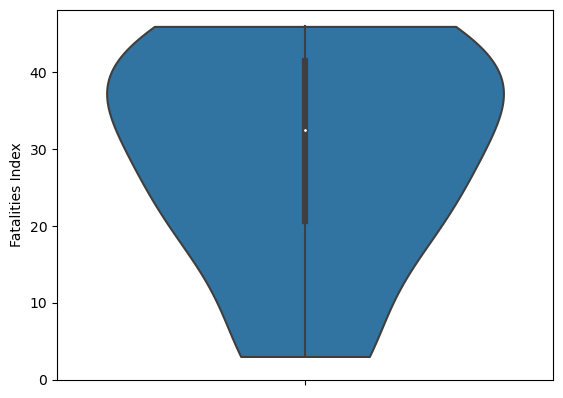

In [579]:
sns.violinplot(y='Fatalities Index', data = SomehowDying.sort_values(by = 'Fatalities Index'), cut=0)
plt.ylim(0) 
plt.show()

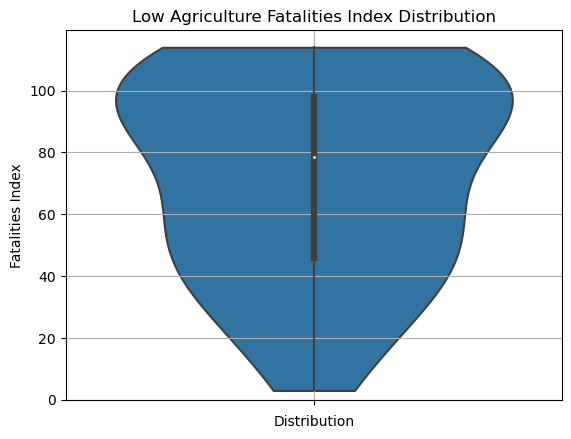

In [580]:
sns.violinplot(y='Fatalities Index', data = FewFarmEmps.sort_values(by = 'Fatalities Index'), cut=0)
plt.ylim(0)
plt.title('Low Agriculture Fatalities Index Distribution')
plt.xlabel('Distribution')
plt.grid(True)
plt.show()

In [581]:
pd.set_option('display.max_columns', None)

In [582]:
"""
Just wanna try against fatalities_per_100k_rank
...

YDyingNoStr = SomehowDying.loc[:,(~SomehowDying.columns.isin(StrCols))]
YDyingNoStr_Corr = YDyingNoStr.corr(method = 'spearman').sort_values(by = 'Fatalities Index', ascending = False)
YDyingNoStr_Corr
"""
#Not sure if thats necessary tbf

"\nJust wanna try against fatalities_per_100k_rank\n...\n\nYDyingNoStr = SomehowDying.loc[:,(~SomehowDying.columns.isin(StrCols))]\nYDyingNoStr_Corr = YDyingNoStr.corr(method = 'spearman').sort_values(by = 'Fatalities Index', ascending = False)\nYDyingNoStr_Corr\n"

In [583]:
Y_Dying_Top_Var = YDyingNoStr_Corr.index[0:21].tolist()
Y_Dying_Top_Var = Y_Dying_Top_Var + YDyingNoStr_Corr.index[-20:].tolist()
len(Y_Dying_Top_Var)

41

In [584]:
Expected_Survive_Top_Var = FF_YDyingNoStr_Corr.index[0:21].tolist()
Expected_Survive_Top_Var = Expected_Survive_Top_Var + FF_YDyingNoStr_Corr.index[-20:].tolist()
len(Expected_Survive_Top_Var)

41

In [585]:
# Expected_Survive_Top_Var = list(set(Expected_Survive_Top_Var) - set(['fatalities_per_100k_rank', 'fatalities_rank', 'fatalities_total', 'fatalities_per_100k_total'))
# Y_Dying_Top_Var = list(set(Y_Dying_Top_Var) - set(['fatalities_per_100k_rank', 'fatalities_rank', 'fatalities_total', 'fatalities_per_100k_total'))

In [586]:
Common_Fatality_Var = []
Special_Ydying_relation = []
for entry in Y_Dying_Top_Var:
    if entry == 'Fatalities Index':
        Common_Fatality_Var.append(entry)
        Special_Ydying_relation.append(entry)
    elif entry in Expected_Survive_Top_Var:
        Common_Fatality_Var.append(entry)
    else:
        Special_Ydying_relation.append(entry)
#len(Special_Ydying_relation), print(Common_Fatality_Var)
Special_Ydying_relation

['Fatalities Index',
 'Employment in industry percent of total employment modeled ILO estimate',
 'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports',
 'Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports',
 'longitude',
 'Employment in agriculture percent of total employment modeled ILO estimate',
 'Tariff rate, most favored nation, weighted mean, primary products percent',
 'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports',
 'Agriculture, forestry, and fishing, value added percent of GDP',
 'Ores and metals exports percent of merchandise exports',
 'Other manufacturing percent of value added in manufacturing',
 'Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports',
 'Profit tax percent of commercial profits',
 'Merchandise imports from low and middl

In [587]:
Expected_Survive_Top_Var1 = FF_YDyingNoStr_Corr.index[0:26].tolist()
Expected_Survive_Top_Var1 = Expected_Survive_Top_Var1 + FF_YDyingNoStr_Corr.index[-25:].tolist()
len(Expected_Survive_Top_Var1)

Common_Fatality_Var1 = []
Special_Ydying_relation1 = []
for entry in Y_Dying_Top_Var:
    if entry == 'Fatalities Index':
        Common_Fatality_Var1.append(entry)
        Special_Ydying_relation1.append(entry)
    elif entry in Expected_Survive_Top_Var1:
        Common_Fatality_Var1.append(entry)
    else:
        Special_Ydying_relation1.append(entry)
# len(Special_Ydying_relation1), print(Common_Fatality_Var1),

print(f"Variables within 5 correlation coefficients of SomehowDying Variables: {list(set(Special_Ydying_relation) - set(Special_Ydying_relation1))}")

Variables within 5 correlation coefficients of SomehowDying Variables: ['Merchandise exports to low and middleincome economies outside region percent of total merchandise exports']


In [588]:
FF_common_cols_not_wanted = list(set(Common_Fatality_Var) - set(['Fatalities Index',]))
FF_common_Rows_not_wanted = list(set(FF_YDyingNoStr_Corr.columns.tolist()) - set(Common_Fatality_Var))

FF_Fat_Corr_df = FF_YDyingNoStr_Corr[[*Common_Fatality_Var]].copy()
FF_Fat_Corr_df = FF_Fat_Corr_df.drop(FF_common_cols_not_wanted, axis=1).add_prefix('FF_')
FF_Fat_Corr_df = FF_Fat_Corr_df.drop(FF_common_Rows_not_wanted, axis=0)
FF_Fat_Corr_df


YDie_common_Rows_not_wanted = list(set(YDyingNoStr_Corr.columns.tolist()) - set(Common_Fatality_Var))

YDie_Com_Fat_Corr_df = YDyingNoStr_Corr[[*Common_Fatality_Var]].copy()
YDie_Com_Fat_Corr_df = YDie_Com_Fat_Corr_df.drop(FF_common_cols_not_wanted, axis=1).add_prefix('YDying_')
YDie_Com_Fat_Corr_df = YDie_Com_Fat_Corr_df.drop(YDie_common_Rows_not_wanted, axis=0)
YDie_Com_Fat_Corr_df

DF_Fat_Common_Compare = YDie_Com_Fat_Corr_df.merge(FF_Fat_Corr_df, how = 'outer', left_index = True, right_index = True)
#DF_Fat_Common_Compare = DF_Fat_Common_Compare.sort_values(by = 'YDying_Fatalities Index', ascending = False)
DF_Fat_Common_Compare

,YDying_Fatalities Index,FF_Fatalities Index
Fatalities Index,1.000000,1.000000
ICT goods exports percent of total goods exports,-0.424176,0.200069
Merchandise exports to low and middleincome economies within region percent of total merchandise exports,-0.468730,0.356716
Merchandise imports from low and middleincome economies outside region percent of total merchandise imports,0.446154,-0.333280
Merchandise imports from low and middleincome economies within region percent of total merchandise imports,-0.509712,0.342108
fatalities_per_100k_rank,0.736264,0.954096
fatalities_per_100k_total,-0.729293,-0.958943
fatalities_rank,0.631464,0.949270
fatalities_total,-0.631464,-0.949270


In [589]:
# Can make a similar Df for YDying_Top_Var but kind of redundant as we know that they arent in the top 20 for the standard FewFarm Economies

In [590]:
ExpectedlyFine = FewFarmEmps[FewFarmEmps['color_col']=='blue']
ExpectedlyFine['country'].head()

Country Code
ESP              Spain
ZAF       South Africa
SVK    Slovak Republic
SWZ          Swaziland
GBR     United Kingdom
Name: country, dtype: object

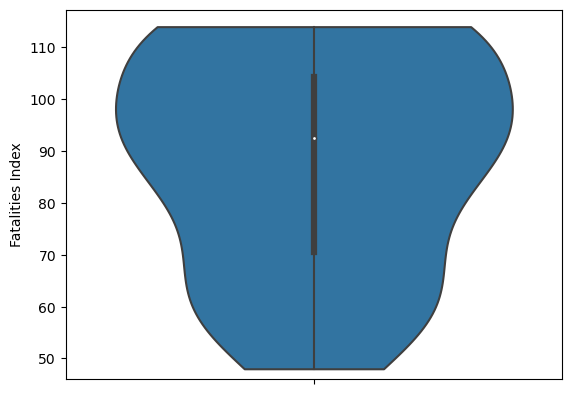

In [591]:
sns.violinplot(y='Fatalities Index', data = ExpectedlyFine.sort_values(by = 'Fatalities Index'), cut=0)
plt.ylim(46) 
plt.show()

In [592]:
from sklearn.linear_model import LinearRegression

In [593]:
pd.set_option('display.max_columns', 1)
YDying_Special_Corr = YDyingNoStr_Corr[YDyingNoStr_Corr.index.isin(Special_Ydying_relation)]
YDying_Special_Corr

,Fatalities Index,...
Fatalities Index,1.000000,...
Employment in industry percent of total employment modeled ILO estimate,0.683516,...
Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,0.674725,...
Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports,0.600000,...
longitude,0.595604,...
Employment in agriculture percent of total employment modeled ILO estimate,0.538462,...
"Tariff rate, most favored nation, weighted mean, primary products percent",0.506085,...
Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,0.498901,...
"Agriculture, forestry, and fishing, value added percent of GDP",0.490110,...
Ores and metals exports percent of merchandise exports,0.454945,...


In [594]:
Special_Var_dict = {}

In [595]:
## If I want to cycle through the graphs of the different variables in the following 2 cells,
## simply delete the relevant Hashtags from the cells below

In [596]:
x = [0,]
#x = [-1]
# to 

In [597]:
#(-1,-12) [-10 not including, fatality totals] (health spending -15, GDP/cap growth -15 not including), (1,12) [10], Profit at 16 including 3fattotals     Still some other good stuff on that end. Can check both out more tomorrow
#x.append(1)
x.append(-1)
variable = Special_Ydying_relation[sum(x)]
#variable = Special_Ydying_relation[-sum(x)]

#variable = 'Fuel exports percent of merchandise exports'
#variable = 'Commercial service exports 2015 USD'
#variable = 'Service exports BoP, 2015 USD'
#variable = 'Exports of goods and services percent of GDP'

df = FewFarmEmps#[~FewFarmEmps['country'].isin(['United States', 'Japan'])]

colour_plot_list = df['color_col'].to_list()

country_names = df[df['country'].isin(df['country'].unique())]#.tolist()
country_names = country_names.sort_values(by = 'Fatalities Index', ascending = True) # Can try with fatalities_per_100k_rank but might not be nec
country_names = country_names['country'].tolist()

x_range = FactorRange(*country_names)

Dying_Deviant_Plot = figure(width=800, height=350, x_range=x_range)

Dying_Deviant_Plot.scatter(x = df['country'], y = df[variable],\
                           fill_color = colour_plot_list, hatch_color = colour_plot_list, size = 8, alpha = 0.8)


country_indicies = {country: index for index, country in enumerate(country_names)}
df['country_num'] = df['country'].map(country_indicies)

for colour in df['color_col'].unique():
    subset = df[df['color_col']==colour]
    x_vals = subset['country_num'].values
    y_vals = subset[variable].values
    
    x_vals_reshaped = x_vals.reshape(-1,1) # NB - '-1' in '.reshape()' essentially means len(x_vals). and '1' essentially means 1 column (which can be conceptualised having a thread not a line on a page, its the same thing but with an extra dimension that means it can be touched and reshaped/understood. Similarly linearRegression requires 2 dimensions not 1)
    model = LinearRegression().fit(x_vals_reshaped, y_vals) # Make and fit the model
    y_PredictedOrFitted_vals = model.predict(x_vals_reshaped)
    
    Dying_Deviant_Plot.line(x = subset['country'], y = y_PredictedOrFitted_vals, line_color = colour, line_dash = 'dashed', legend = f'Fit {colour}')


Dying_Deviant_Plot.xaxis.major_label_orientation = 0.2 * 3.14
Dying_Deviant_Plot.title = variable

#Special_Var_dict[variable] = [('SomehowDying', SomehowDying[variable].mean()), ('ExpectedlyFine', ExpectedlyFine[variable].mean())]

show(Dying_Deviant_Plot)

In [598]:
sum(x), 6, 

(-1, 6)

In [599]:
#***&&&
x_vals_all = df['country_num'].values.reshape(-1, 1)
y_vals_all = df[variable].values
model_all = LinearRegression().fit(x_vals_all, y_vals_all)
y_PredictedOrFitted_vals_all = model_all.predict(x_vals_all)

# Created/modified my existing Bokeh figure
Dying_Deviant_Plot = figure(width=750, height=350, x_range=x_range)

# Scatter plot
Dying_Deviant_Plot.scatter(x=df['country'], y=df[variable], 
                           fill_color=colour_plot_list, hatch_color=colour_plot_list, size=8, alpha=0.8)

# Plot individual lines of best fit by color
#for colour in df['color_col'].unique():
 #   subset = df[df['color_col'] == colour]
  #  x_vals = subset['country_num'].values.reshape(-1, 1)
   # y_vals = subset[variable].values
    #model = LinearRegression().fit(x_vals, y_vals)
#    y_PredictedOrFitted_vals = model.predict(x_vals)
 #   Dying_Deviant_Plot.line(x=subset['country'], y=y_PredictedOrFitted_vals, 
 #                          line_color=colour, line_dash='dashed', legend=f'Fit {colour}')

# Plot overall line of best fit
Dying_Deviant_Plot.line(x=df['country'], y=y_PredictedOrFitted_vals_all, 
                       line_color='green', line_dash='solid', legend='Overall Fit')

# Additional plot configurations
Dying_Deviant_Plot.xaxis.major_label_orientation = 0.2 * 3.14
Dying_Deviant_Plot.title.text = variable

# Show the plot
show(Dying_Deviant_Plot)

In [600]:
#***&&&
"""
imp_indexes = []

imp_indexes.append(sum(x))

imp_indexes
New_Vars_Percentiled = []

New_Vars_Percentiled.append(Special_Ydying_relation[imp_indexes[0]])

Special_Ydying_relation[imp_indexes[0]]
"""

'\nimp_indexes = []\n\nimp_indexes.append(sum(x))\n\nimp_indexes\nNew_Vars_Percentiled = []\n\nNew_Vars_Percentiled.append(Special_Ydying_relation[imp_indexes[0]])\n\nSpecial_Ydying_relation[imp_indexes[0]]\n'

In [601]:
# ***&&&
"""
New_Vars_Percentiled = ['Employment in agriculture percent of total employment modeled ILO estimate',
 'longitude',
 'Merchandise exports to highincome economies percent of total merchandise exports',
 'Net primary income Net income from abroad 2015 USD',
 'Communications, computer, etc. percent of service imports, BoP',
 'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports']
"""

"\nNew_Vars_Percentiled = ['Employment in agriculture percent of total employment modeled ILO estimate',\n 'longitude',\n 'Merchandise exports to highincome economies percent of total merchandise exports',\n 'Net primary income Net income from abroad 2015 USD',\n 'Communications, computer, etc. percent of service imports, BoP',\n 'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports']\n"

In [602]:
most_important_Vars = []

In [603]:
inverse_clue =[]     # add the below one

In [604]:
Maybe_imp_self_suff = []   #_orClue

In [605]:
most_important_Vars.append(variable)
# interesting. Rural Pop is higher amongst big deaths but Higher=Better in this group.
# MAAAYYYBe Farms Forests n Fishing. not super stat noteworthy but maybe part of a broader pic of self sufficiency?
# Nah these are direct deaths surely cant be

In [606]:
inverse_clue.append(variable)

In [607]:
Maybe_imp_self_suff.append(variable)
# Other Manufacturing and its trend might be a clue in that other than 'Other' might be more fruitful.

In [608]:
most_important_Vars = list(set(most_important_Vars))

In [609]:
most_important_Vars = ['Merchandise imports from highincome economies percent of total merchandise imports',
 'Agricultural land percent of land area',
 'Employment in agriculture percent of total employment modeled ILO estimate',
 'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports',
 'Medium and hightech exports percent manufactured exports',
 'GNI per capita constant 2015 USD',
 'Merchandise exports to highincome economies percent of total merchandise exports',
 'Employment in industry percent of total employment modeled ILO estimate',
 'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports',
 'Communications, computer, etc. percent of service imports, BoP',
 'GNI per capita, Atlas method 2015 USD',
 'Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports']
# Communications, computer, etc. percent of service imports, BoP, 
ReCheck = ['Agricultural land percent of land area', 'GNI per capita, Atlas method 2015 USD', 'Merchandise exports to highincome economies percent of total merchandise exports']


In [610]:
inverse_clue = ['ICT goods exports percent of total goods exports',
  'Health Spending(%GDP/Cap)',
  'Other manufacturing percent of value added in manufacturing']
Maybe_imp_self_suff = ['Agriculture, forestry, and fishing, value added percent of GDP',
  'Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports',
  'Agricultural land percent of land area']

In [611]:
most_important_Vars, inverse_clue, Maybe_imp_self_suff

(['Merchandise imports from highincome economies percent of total merchandise imports',
  'Agricultural land percent of land area',
  'Employment in agriculture percent of total employment modeled ILO estimate',
  'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports',
  'Medium and hightech exports percent manufactured exports',
  'GNI per capita constant 2015 USD',
  'Merchandise exports to highincome economies percent of total merchandise exports',
  'Employment in industry percent of total employment modeled ILO estimate',
  'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports',
  'Communications, computer, etc. percent of service imports, BoP',
  'GNI per capita, Atlas method 2015 USD',
  'Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports'],
 ['ICT goods exports percent of total goods exports',
  'Healt

In [612]:
# Here Marg > Slightly
# Inverse = SomehowDying Gradient trend
# SS = potential Small sample issue
# NB - because Inverse refers to SomehowDying, and im mapping this from corr(), really what the inverse () is telling me is that ExpectedDying is the opposite of whats written there.

### Double check later if any have opp trend higher = better in good or higher = worse in bad
"""
SomehowDying's Line of Best Fit is:
BAD     -----    Inverse Corr (so we expect the Bigger Var's No. the Worse)    -----     NB - Reverse order from here
- Merch Exports to High income Economies   =   Lower.   Steeper
- Emp in Services   =   Same.   Sig Steeper
- Ag, Forestry, Fishing value added USD   =   Same
- Merch Imports from Poor n Mid SubSaharan Africa %   =  Same.   Slight Slight Inverse (Higher = Worse)
- GNI/capita USD  =    Slightly Lower.      MArg Steeper.   Inverse (Higher = Worse)
- GNI/capita Atlas USD   =   Same.  Marg Steeper.   Inverse
- GNI/capita PPP USD    =    Slight Lower.    Marg Steeper.   Inverse
- Merch Imports from Rich Cs % Imports   =   Same.     Steeper
- Price level PPP Conversion Factor GDP to Market Exchange Rate    =   Same.     MArge Steeper. (variation n SS)     Inverse/Diff  (Higher = Worse vs Flat)
- Textiles Val added in Manufacturing   =   Same
- Agri Land % Land area   =   Same.       Sig Steepr.     Inverse/Diff  (Higher = Worse vs Flat)
- Health Spending %GDP/cap   =   Same.   Steeper.    Inverse/Diff  (Higher = Worse vs Flat)       NB - Not much variation from line
- GDP/cap anual growth %   =   Same.     Slightly Steeper
- Mid-High Tech Exports % Manufactured Exports   =    Same.     Steeper    Inverse  (variation n SS)
- Communications, Computer % Imports   =   Same.   Steeper.   Inverse/Diff (Lower = Worse vs Flat)
- ICT goods Exports %   =   Lower   Slight Inverse       (Higher=Worse)

"""
# I feel like health spending has got to tell quite a lot right. i.e. healthspending is DEfo Corr not DEfo NOt Cause. 
#  So its gonna be something about Wealthier More Developed Countries  (the Lower outliers here are Oman, Saudi Arabia, to some extent Bahamas)
# Like its For sure majorly an Industry Issue Probs relat
#  So Given that Developed/Wealthier Cs      And given Export Stats;  Emp in Services;  and To some extent Self Sufficiency Stats??? (DCheck)
#         Should probs check out the key industries

"\nSomehowDying's Line of Best Fit is:\nBAD     -----    Inverse Corr (so we expect the Bigger Var's No. the Worse)    -----     NB - Reverse order from here\n- Merch Exports to High income Economies   =   Lower.   Steeper\n- Emp in Services   =   Same.   Sig Steeper\n- Ag, Forestry, Fishing value added USD   =   Same\n- Merch Imports from Poor n Mid SubSaharan Africa %   =  Same.   Slight Slight Inverse (Higher = Worse)\n- GNI/capita USD  =    Slightly Lower.      MArg Steeper.   Inverse (Higher = Worse)\n- GNI/capita Atlas USD   =   Same.  Marg Steeper.   Inverse\n- GNI/capita PPP USD    =    Slight Lower.    Marg Steeper.   Inverse\n- Merch Imports from Rich Cs % Imports   =   Same.     Steeper\n- Price level PPP Conversion Factor GDP to Market Exchange Rate    =   Same.     MArge Steeper. (variation n SS)     Inverse/Diff  (Higher = Worse vs Flat)\n- Textiles Val added in Manufacturing   =   Same\n- Agri Land % Land area   =   Same.       Sig Steepr.     Inverse/Diff  (Higher = Wor

In [613]:
# importantVars = (vars + industry + coords)??

In [614]:
"""
GOOD
- Employment in Industry   =   Marginally Higher.    Defo Steeper             NB - Not Sig Steeper tho.
- Merch EXPORTS to Poor and Mid East Asia   =   Sig Higher.   Sig Sig Sig Steeper.  Inverse (Higher = Better)
- Merch Imports from Poor and Mid East Asia   =   Higher.  Sig Steeper.   Inverse (Higher = Better)
- Longitude   =   Higher.    Steeper.    Slightly More Variable
- Emp in Ag %   =   Slightly Less.  Steeper.   Sig Inverse (Higher = Better)     (Sig in decent Corr here)   
Hits 50 - Tarif Rate Favourite Nation N Primary product   =    Neg Higher.   Inverse (Higher = Better)
- Merch Exports to Poor n Mid Cs Outside Region   =   Sig Higher.   Sig Sig Steeper.    Marg More Variable
Drops to 45 - Ag, Forestry, Fishing value added %GDP   =    Lower.    Steeper.    
- Ores Metal exports   =   Same   Inverse (Higher = Better)           
- Other Manufacturing % of value added in manufacturing   =  Marg  Higher.   Steeper.    Inverse (Higher = Better)
- Merch Exports to Poor n Mid Cs South Asia %Total Exports   =   Marg Higher.   Sig Steeper.   Inverse/Diff (Higher = Better vs Flat)
- Profit tax % commercial profits   =   Marg Lower.   Steeper.   Inverse (Higher = Better)    But pretty Variable
- Merch imports from Poor n Mid South Asia  =  Marg Higher.   More Variable            NB -Domain Specific (Sig Location relevant)
- Net migration = Same   (USA Outlier).    Slight Inverse      (People go to Rich places but also Hot places?)
- Refugee Pop   =  Marg Higher
- Gross Domestic Savings = Same
- pop growth  =  Same.   Marg Steeper
"""

# I think what industry emp, and exports, and Tarif rates   is all pointing to is its an industry issue  (Production; Sector; and/or policy on that Sector)
# I think what a lot of 
# I think  Emp in Ag; Forestry and Fishing   pointing to less self-sufficient

#I think merch imports from Poor/Mid East Asia  is telling
"""  Imports from outside region   """

'  Imports from outside region   '

In [615]:
len(x)

2

In [616]:
Special_Var_dict

{}

In [617]:
pd.set_option('display.max_columns', None)

In [618]:
print(most_important_Vars, inverse_clue, Maybe_imp_self_suff)

['Merchandise imports from highincome economies percent of total merchandise imports', 'Agricultural land percent of land area', 'Employment in agriculture percent of total employment modeled ILO estimate', 'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports', 'Medium and hightech exports percent manufactured exports', 'GNI per capita constant 2015 USD', 'Merchandise exports to highincome economies percent of total merchandise exports', 'Employment in industry percent of total employment modeled ILO estimate', 'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports', 'Communications, computer, etc. percent of service imports, BoP', 'GNI per capita, Atlas method 2015 USD', 'Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports'] ['ICT goods exports percent of total goods exports', 'Health Spending(%GDP/Cap)', 'Oth

In [619]:
SussIndustry = SomehowDying.loc[:,((((SomehowDying.columns.str.upper().str.contains('EXPORTS')) |\
                                     (SomehowDying.columns.str.upper().str.contains('MANUFACTURE')) |\
                                     (SomehowDying.columns.str.upper().str.contains('TECH')) |\
                                     (SomehowDying.columns.str.upper().str.contains('HIGH')))) &\
                                   (~SomehowDying.columns.str.upper().str.contains('IMPORT')))]
SussIndustry

,Agricultural raw materials exports percent of merchandise exports,"Computer, communications and other services percent of commercial service exports",Hightechnology exports percent of manufactured exports,Manufactures exports percent of merchandise exports,Medium and hightech exports percent manufactured exports,Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,Food exports percent of merchandise exports,Fuel exports percent of merchandise exports,"Exports of goods, services and primary income BoP, 2015 USD","Goods exports BoP, 2015 USD","Service exports BoP, 2015 USD",Exports of goods and services 2015 USD,Insurance and financial services percent of commercial service exports
country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Saudi Arabia,0.041730,1.944557,0.787294,18.110075,36.992335,32.563925,5.129572,0.160367,2.180100e+11,0.687384,6.459423,1.044830e+10,1.540295e+11,1.316190,59.757250,18.914034,0.954538,0.804740,3.696531,12.006904,3.865766,40.242515,24.957582,73.364236,1.838751,78.430773,1.843261e+11,1.540197e+11,1.095260e+10,1.649716e+11,4.030963
The Bahamas,0.882461,7.170782,0.000000,60.596488,63.225896,36.358574,74.765013,1.398514,4.244100e+09,1.396467,8.623700,2.156781e+09,3.942490e+08,10.219793,64.144904,0.139092,0.173850,1.105274,0.007143,0.019302,34.406274,35.850935,24.957582,89.023188,28.301261,0.000000,2.618536e+09,3.938947e+08,2.191074e+09,3.211578e+09,2.488306
United States,2.264736,45.484949,21.380941,63.714653,65.287447,12.471819,10.109410,9.438522,2.270620e+12,0.319626,46.908187,5.670193e+11,1.137019e+12,2.808836,60.428349,10.825093,1.312902,22.914381,0.943989,1.678999,1.169930,38.845294,24.957582,25.703708,9.966026,8.003418,2.350148e+12,1.143685e+12,5.822194e+11,1.718214e+12,17.542932
Belgium,1.355406,62.823901,12.334459,72.149336,52.696019,77.805282,2.495243,2.179949,3.597210e+11,3.721675,62.612494,8.104275e+10,3.002959e+11,2.786699,85.700312,2.725065,2.745288,1.550281,1.427787,2.372058,2.515471,13.335950,24.957582,7.343841,11.905117,8.791064,3.229724e+11,1.897253e+11,8.245327e+10,2.722066e+11,8.640502
Islamic Republic of Iran,0.584979,31.332928,1.432634,28.903755,26.272244,18.720835,8.352100,0.069937,7.642086e+10,10.070317,35.232174,2.617480e+09,5.317821e+10,2.885625,22.014089,38.578996,16.994103,0.036425,0.894476,19.769895,1.629936,77.009355,0.894476,37.495760,9.674525,57.793086,1.291751e+10,7.810206e+09,2.836621e+09,5.782888e+10,2.488306
Iraq,0.021946,34.503174,6.194386,0.183736,27.280235,34.514146,5.025670,0.620566,5.756066e+10,34.456305,36.037432,3.719410e+09,4.356943e+10,3.010352,52.043100,23.382517,0.610874,0.926343,2.045363,20.781357,

In [620]:
Some_OtherSuss_Vars = SussIndustry.columns[~SussIndustry.columns.isin(most_important_Vars)].tolist()
Some_OtherSuss_Vars

['Agricultural raw materials exports percent of merchandise exports',
 'Computer, communications and other services percent of commercial service exports',
 'Hightechnology exports percent of manufactured exports',
 'Manufactures exports percent of merchandise exports',
 'Exports of goods and services percent of GDP',
 'International tourism, receipts percent of total exports',
 'ICT goods exports percent of total goods exports',
 'Exports of goods and services constant 2015 USD',
 'Exports of goods and services annual percent growth',
 'Communications, computer, etc. percent of service exports, BoP',
 'Commercial service exports 2015 USD',
 'Merchandise exports 2015 USD',
 'Ores and metals exports percent of merchandise exports',
 'Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports',
 'Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports',
 'Merchandi

In [621]:
PERCENT_OF_EXPORTS = FullyFilled.loc[:,FullyFilled.columns.str.upper().str.contains('PERCENT')\
                 & FullyFilled.columns.str.upper().str.contains('EXPORT') \
                 & ~FullyFilled.columns.str.upper().str.contains('GROWTH')]
PERCENT_OF_EXPORTS_cols = PERCENT_OF_EXPORTS.columns.tolist()
len(PERCENT_OF_EXPORTS_cols)

23

In [622]:
Manufacturing_Output_Industry = FullyFilled.loc[:,FullyFilled.columns.str.upper().str.contains('PERCENT')\
                                                 & FullyFilled.columns.str.upper().str.contains('MANUFACTUR')\
                                                 & ~FullyFilled.columns.str.upper().str.contains('IMPORT')\
                                                 & ~FullyFilled.columns.str.upper().str.contains('GROWTH')]
Manufacturing_Output_Industry_cols = Manufacturing_Output_Industry.columns.tolist()

In [623]:
MERCH_Exports = FullyFilled.loc[:,FullyFilled.columns.str.upper().str.contains('MERCH')\
                & FullyFilled.columns.str.upper().str.contains('PERCENT')\
                & FullyFilled.columns.str.upper().str.contains('EXPORT')\
                & ~FullyFilled.columns.str.upper().str.contains('EXPORTS TO ')]
MERCH_Exports_cols = MERCH_Exports.columns.tolist()

In [624]:
FullyFilled['country']

Country Code
SAU                             Saudi Arabia
ROU                                  Romania
ESP                                    Spain
SSD                              South Sudan
SLE                             Sierra Leone
ZAF                             South Africa
SRB                                   Serbia
SVK                          Slovak Republic
SLB                          Solomon Islands
SWZ                                Swaziland
TUR                                   Turkey
TZA                                 Tanzania
THA                                 Thailand
BHS                              The Bahamas
UGA                                   Uganda
VNM                                  Vietnam
GBR                           United Kingdom
URY                                  Uruguay
USA                            United States
VUT                                  Vanuatu
ARE                     United Arab Emirates
UKR                                  Ukrai

In [625]:
Trade_df = FullyFilled.loc[:,FullyFilled.columns.str.upper().str.contains('TRAD') | FullyFilled.columns.str.contains('country')]
Trade_cols = Trade_df.columns.tolist()
Trade_cols = list(set(Trade_cols) - set(['country']))

In [626]:
Trade_df.loc[Trade_df['country'].isin(SomehowDying.index)]

,country,rw_country_code,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Refugee population by country or territory of origin,Refugee population by country or territory of asylum
Country Code,,,,,,,,
SAU,Saudi Arabia,SAU,-2.216940e+10,56.495119,69.503884,15.311781,686.0,122.0
BHS,The Bahamas,BHS,-6.173723e+08,29.769809,73.484738,35.752584,216.0,7.0
USA,United States,USA,-3.713757e+11,20.970387,27.823565,6.963153,4824.0,273198.0
BEL,Belgium,BEL,4.920916e+09,167.058527,154.192546,46.129701,66.0,35302.0
IRN,Islamic Republic of Iran,IRN,-1.233562e+09,28.223507,39.422589,15.351618,84950.0,979435.0
IRQ,Iraq,IRQ,-1.353775e+09,69.611526,69.591769,13.698530,264086.0,277702.0
ITA,Italy,ITA,4.179884e+10,47.255319,56.418176,10.962368,69.0,118036.0
CHL,Chile,CHL,-1.509739e+09,51.318960,59.349110,9.356852,554.0,1840.0
COL,Colombia,COL,-1.438092e+10,30.579671,38.360764,7.630381,340116.0,212.0


In [627]:
LandDf = FullyFilled.loc[:,FullyFilled.columns.str.upper().str.contains('LAND')]
LandCols = LandDf.columns.tolist()
LandCols

['Agricultural land percent of land area',
 'Agricultural land sq. km',
 'Arable land percent of land area',
 'Arable land hectares per person',
 'Arable land hectares',
 'Land area sq. km',
 'Land area where elevation is below 5 meters percent of total land area',
 'Population density people per sq. km of land area',
 'Rural land area sq. km',
 'Rural land area where elevation is below 5 meters percent of total land area',
 'Permanent cropland percent of land area',
 'Urban land area sq. km',
 'Urban land area where elevation is below 5 meters percent of total land area',
 'Forest area percent of land area',
 'Habitable Land']

In [628]:
population_df = FullyFilled.loc[:,FullyFilled.columns.str.upper().str.contains('POP')]
population_df
population_cols = population_df.columns.tolist()

In [629]:
LandPop_poss_Suss_vars = LandPopShape.columns.tolist()
LandPop_poss_Suss_vars

['Fatalities Index',
 'cri_rank',
 'fatalities_per_100k_rank',
 'fatalities_rank',
 'Agricultural land percent of land area',
 'Agricultural land sq. km',
 'Agricultural raw materials exports percent of merchandise exports',
 'Agricultural raw materials imports percent of merchandise imports',
 'Population density people per sq. km of land area',
 'Rural land area sq. km',
 'Rural land area where elevation is below 5 meters percent of total land area',
 'Urban land area sq. km',
 'Urban land area where elevation is below 5 meters percent of total land area',
 'Agriculture, forestry, and fishing, value added percent of GDP',
 'Agriculture, forestry, and fishing, value added annual percent growth',
 'Agriculture, forestry, and fishing, value added per worker constant 2015 USD',
 'Employment in agriculture percent of total employment modeled ILO estimate',
 'Rural population',
 'Rural population percent of total population',
 'Rural population growth annual percent',
 'Rural population li

In [630]:
Some_OtherSuss_Vars = list(set(Some_OtherSuss_Vars) - set(most_important_Vars))

In [631]:
def fatality_variable_name_changer(x):
    if x == 'Expected Surviving':
        return 'Low Fatalities'
    elif x == 'Somehow Dying':
        return 'High Fatalities'
    else:
        return x

In [632]:
col_set = [*Some_OtherSuss_Vars, *most_important_Vars]
FF_SussVars = FewFarmEmps[[*col_set,'Fatality_Deviant']]#*most_important_Vars, *Some_OtherSuss_Vars, *Special_Ydying_relation]]   LandPop_poss_Suss_vars
FF_SussVars['Fatality_Deviant'] = FF_SussVars['Fatality_Deviant'].apply(fatality_variable_name_changer)
FF_SussVars_grpd_med = FF_SussVars.groupby('Fatality_Deviant')[[*col_set]].mean()#, *,most_important_Vars,*Some_OtherSuss_Vars, *Special_Ydying_relation]].mean()
new_order = ['Low Fatalities','High Fatalities']
FF_SussVars_grpd_med = FF_SussVars_grpd_med.reindex(new_order)
FF_SussVars_grpd_med

,Insurance and financial services percent of commercial service exports,Travel services percent of commercial service exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Exports of goods and services constant 2015 USD,Exports of goods and services 2015 USD,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,"Exports of goods, services and primary income BoP, 2015 USD",Manufactures exports percent of merchandise exports,Hightechnology exports percent of manufactured exports,Commercial service exports 2015 USD,Ores and metals exports percent of merchandise exports,Fuel exports percent of merchandise exports,Merchandise exports 2015 USD,ICT goods exports percent of total goods exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Exports of goods and services percent of GDP,"Service exports BoP, 2015 USD",Exports of goods and services annual percent growth,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,"Goods exports BoP, 2015 USD","Computer, communications and other services percent of commercial service exports","Communications, computer, etc. percent of service exports, BoP",Food exports percent of merchandise exports,"International tourism, receipts percent of total exports",Agricultural raw materials exports percent of merchandise exports,Merchandise imports from highincome economies percent of total merchandise imports,Agricultural land percent of land area,Employment in agriculture percent of total employment modeled ILO estimate,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Medium and hightech exports percent manufactured exports,GNI per capita constant 2015 USD,Merchandise exports to highincome economies percent of total merchandise exports,Employment in industry percent of total employment modeled ILO estimate,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,"Communications, computer, etc. percent of service imports, BoP","GNI per capita, Atlas method 2015 USD",Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports
Fatality_Deviant,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Low Fatalities,6.378043,34.600072,2.701376,2.128170e+11,1.610420e+11,4.593472,1.802192e+11,53.294804,13.842875,3.902364e+10,5.936917,12.503107,1.223817e+11,4.791478,2.562955,4.241926,47.423846,3.945089e+10,4.904608,24.341032,4.671472,1.141047e+11,37.722817,38.621692,21.208701,12.138212,2.348685,67.262703,39.847108,6.916122,7.737783,46.204010,27438.186466,71.069567,23.939883,18.806340,42.098984,22584.863743,13.404692
High Fatalities,6.070562,39.771809,3.659284,4.008801e+11,3.033524e+11,4.372147,3.820334e+11,44.580709,9.602187,7.991059e+10,7.245158,32.454852,2.321260e+11,2.193776,5.306456,4.868413,31.179681,8.156242e+10,5.318041,20.681507,5.201533,2.216361e+11,33.931394,35.397983,11.209232,13.362323,1.552880,61.923858,33.546057,6.461239,16.212661,45.795366,22615.927050,59.112359,24.157708,34.983146,41.870345,18270.904275,18.173293


In [633]:
#***&&&
"""
col_set = Some_OtherSuss_Vars #most_important_Vars
FF_SussVars = FewFarmEmps[[*col_set,'Fatality_Deviant']]#*most_important_Vars, *Some_OtherSuss_Vars, *Special_Ydying_relation]]   LandPop_poss_Suss_vars
FF_SussVars_grpd_med = FF_SussVars.groupby([*FF_SussVars.columns.tolist()])[[*col_set]].mean()#, *,most_important_Vars,*Some_OtherSuss_Vars, *Special_Ydying_relation]].mean()
FF_SussVars_grpd_med   
"""

"\ncol_set = Some_OtherSuss_Vars #most_important_Vars\nFF_SussVars = FewFarmEmps[[*col_set,'Fatality_Deviant']]#*most_important_Vars, *Some_OtherSuss_Vars, *Special_Ydying_relation]]   LandPop_poss_Suss_vars\nFF_SussVars_grpd_med = FF_SussVars.groupby([*FF_SussVars.columns.tolist()])[[*col_set]].mean()#, *,most_important_Vars,*Some_OtherSuss_Vars, *Special_Ydying_relation]].mean()\nFF_SussVars_grpd_med   \n"

In [634]:
FF_SussVars_grpd_med = FF_SussVars_grpd_med/FF_SussVars_grpd_med.iloc[0] #The row switches when i change the index names
FF_SussVars_grpd_med

,Insurance and financial services percent of commercial service exports,Travel services percent of commercial service exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Exports of goods and services constant 2015 USD,Exports of goods and services 2015 USD,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,"Exports of goods, services and primary income BoP, 2015 USD",Manufactures exports percent of merchandise exports,Hightechnology exports percent of manufactured exports,Commercial service exports 2015 USD,Ores and metals exports percent of merchandise exports,Fuel exports percent of merchandise exports,Merchandise exports 2015 USD,ICT goods exports percent of total goods exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Exports of goods and services percent of GDP,"Service exports BoP, 2015 USD",Exports of goods and services annual percent growth,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,"Goods exports BoP, 2015 USD","Computer, communications and other services percent of commercial service exports","Communications, computer, etc. percent of service exports, BoP",Food exports percent of merchandise exports,"International tourism, receipts percent of total exports",Agricultural raw materials exports percent of merchandise exports,Merchandise imports from highincome economies percent of total merchandise imports,Agricultural land percent of land area,Employment in agriculture percent of total employment modeled ILO estimate,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Medium and hightech exports percent manufactured exports,GNI per capita constant 2015 USD,Merchandise exports to highincome economies percent of total merchandise exports,Employment in industry percent of total employment modeled ILO estimate,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,"Communications, computer, etc. percent of service imports, BoP","GNI per capita, Atlas method 2015 USD",Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports
Fatality_Deviant,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Low Fatalities,1.000000,1.000000,1.0000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
High Fatalities,0.951791,1.149472,1.3546,1.883685,1.883685,0.951817,2.119827,0.836493,0.693656,2.047748,1.220357,2.595743,1.896738,0.457849,2.070444,1.147689,0.657468,2.067442,1.084295,0.849656,1.113468,1.942393,0.899493,0.916531,0.52852,1.100848,0.66117,0.920627,0.841869,0.934229,2.095259,0.991156,0.82425,0.831753,1.009099,1.860178,0.994569,0.808989,1.355741


In [635]:
pd.set_option('plotting.backend', 'pandas_bokeh')

In [636]:
"""The Names of my Columns were far too long for my graphs so I Shortened and abbreviated them in the cell below"""

'The Names of my Columns were far too long for my graphs so I Shortened and abbreviated them in the cell below'

In [637]:
#long_col_names = FarmingFatality_General_Corrs.index   
long_col_names = FF_SussVars_grpd_med.columns 
#long_col_names = FullyFilled.columns

shorter_names = {}
shorter_name_list = []

for entry in long_col_names:
    modified_entry = entry.upper()
    entry1 = modified_entry
    
    if 'PERCENT OF TOTAL MERCHANDISE EXPORTS' in modified_entry:
        entry1 = modified_entry.replace('PERCENT OF TOTAL MERCHANDISE EXPORTS', '(% Merch exp)')
    if 'PERCENT OF TOTAL GOODS EXPORTS' in modified_entry:
        entry1 = modified_entry.replace('PERCENT OF TOTAL GOODS EXPORTS', '(% Goods exp)')
    if 'PERCENT OF MERCHANDISE EXPORTS' in modified_entry:
        entry1 = modified_entry.replace('PERCENT OF MERCHANDISE EXPORTS', '(% Merch exp)')
    if 'PERCENT OF TOTAL EXPORTS' in modified_entry:
        entry1 = entry1.replace('PERCENT OF TOTAL EXPORTS', '(% exp)')
    if 'PERCENT MANUFACTURED EXPORTS' in modified_entry:
        entry1 = entry1.replace('PERCENT MANUFACTURED EXPORTS', '(% Manu exp)')
    if 'EXPORTS % MANUFACTURED EXPORTS' in modified_entry:
        entry1 = entry1.replace('EXPORTS % MANUFACTURED EXPORTS', 'Exports (% Manu exp)')
    if 'GOODS AND SERVICES' in modified_entry:
        entry1 = entry1.replace('GOODS AND SERVICES', "Goods N' Servs")
    if 'PERCENT OF EMPLOYMENT' in modified_entry:
        entry1 = entry1.replace('PERCENT OF EMPLOYMENT', '(% Emp)')
    if 'PERCENT OF TOTAL EMPLOYMENT' in modified_entry:
        entry1 = entry1.replace('PERCENT OF TOTAL EMPLOYMENT', '(% T-Emp)')
    if 'PERCENT' in modified_entry:
        entry1 = entry1.replace('PERCENT', "%")
    if 'PERCENT OF EXPORTS' in modified_entry:
        entry1 = entry1.replace('PERCENT OF EXPORTS', '(% exp)')
    if 'MERCHANDISE EXPORTS TO' in modified_entry:
        entry1 = entry1.replace('MERCHANDISE EXPORTS TO', 'Exports to')
    if 'MERCHANDISE EXPORTS' in modified_entry:
        entry1 = entry1.replace('MERCHANDISE EXPORTS', 'Merch Exports')
    if 'PERCENT OF COMMERCIAL SERVICE EXPORTS' in modified_entry:
        entry1 = entry1.replace('PERCENT OF COMMERCIAL SERVICE EXPORTS', '(% service exp)')    
    if 'LOW AND MIDDLEINCOME ECONOMIES IN' in modified_entry:
        entry1 = entry1.replace('LOW AND MIDDLEINCOME ECONOMIES IN', 'Low-Mid Econs')
    if 'LOW AND MIDDLEINCOME ECONOMIES' in modified_entry:
        entry1 = entry1.replace('LOW AND MIDDLEINCOME ECONOMIES', 'Low-Mid Econs')
    if 'THE CARIBBEAN' in modified_entry:
        entry1 = entry1.replace('THE CARIBBEAN', 'CARIBBEAN')
    if ' OF ' in modified_entry:
        entry1 = entry1.replace(' OF ', ' ')
    if ' TO ' in modified_entry:
        entry1 = entry1.replace(' TO ', ' ')
    if '&' in modified_entry:
        entry1 = entry1.replace('&', '')
    if 'MIDDLE EAST & NORTH AFRICA' in modified_entry:
        entry1 = entry1.replace('MIDDLE EAST & NORTH AFRICA', 'MENA')
    if ' AND ' in modified_entry:
        entry1 = entry1.replace(' AND ', "N' ")
    if "LN' " in modified_entry:
        entry1 = entry1.replace("LN' ", "LAND ")
    if 'SERVICES' in modified_entry:
        entry1 = entry1.replace('SERVICES', 'Servs')
    if 'PRIMARY' in modified_entry:
        entry1 = entry1.replace('PRIMARY', 'Main')
    if 'HIGHTECHNOLOGY' in modified_entry:
        entry1 = entry1.replace('HIGHTECHNOLOGY', 'HighTech')
    if 'ICT GOODS EXPORTS' in modified_entry:
        entry1 = entry1.replace('HIGHTECHNOLOGY', 'HighTech')
    if 'MODELED ILO ESTIMATE' in modified_entry:
        entry1 = entry1.replace('MODELED ILO ESTIMATE', '')
    if 'MODELED LLO ESTIMATE' in modified_entry:
        entry1 = entry1.replace('MODELED LLO ESTIMATE', '')
    if 'MODELED IIO ESTIMATE' in modified_entry:
        entry1 = entry1.replace('MODELED IIO ESTIMATE', '')
    if 'MERCHANDISE' in modified_entry:
        entry1 = entry1.replace('MERCHANDISE', 'MERCH')
    if 'VALUE ADDED' in modified_entry:
        entry1 = entry1.replace('VALUE ADDED', 'VAL-ADDED')
    if 'ANNUAL' in modified_entry:
        entry1 = entry1.replace('ANNUAL', '')
    else:
        entry1 = entry1
        
    words = entry1.split()
    capitalized_words = [word.capitalize() for word in words]  # Capitalized each word
    entry1 = ' '.join(capitalized_words)    # Join back into a single string
    
    entry1 = entry1.replace('Mena', 'MENA')
    entry1 = entry1.replace('Usd', 'USD')
    entry1 = entry1.replace('Bop', 'BoP')
    entry1 = entry1.replace('Gdp', 'GDP')
    entry1 = entry1.replace('Gni', 'GNI')
    entry1 = entry1.replace('Ict', 'ICT')
    
    shorter_names[entry] = entry1  # Store the modified or unchanged entry
    shorter_name_list.append(entry1)

len(shorter_names)

39

In [638]:
FF_SussVars_grpd_med = FF_SussVars_grpd_med.rename(columns = shorter_names)
Sig_meanExportsdfFuel = FF_SussVars_grpd_med.loc[:, abs(FF_SussVars_grpd_med.iloc[1] - FF_SussVars_grpd_med.iloc[0]) >= (0.3*((FF_SussVars_grpd_med.iloc[1] + FF_SussVars_grpd_med.iloc[0])/2))]


In [639]:
                                          #Nope Nah all Wrong[          ### All the sourrounding and Below are interesting Stats. but im not sure if its the best way to
                                                                        # measure corrs (i mean as ive seen a lot of the significant Corr's magnitude isnt captured
                                                                        # when I Mean() the grouped variable.(e.g. imports from high income Cs). I'd need a Weighted mean
                                                                        # and maybe some other complexities that time wont allow. For now lets just prove this claim below.
             
                
df = Sig_meanExportsdfFuel.loc[:,(~Sig_meanExportsdfFuel.columns.str.upper().str.contains('BOP')) & (~Sig_meanExportsdfFuel.columns.str.upper().str.contains('CONSTANT'))].sort_values(by = ['Fatality_Deviant'])#.loc[:,(Sig_meanExportsdfFuel.columns.str.upper().str.contains('EXPORT'))]
df = df.T
df = df.sort_values(by = 'High Fatalities')# As im interested in Exports

FF_SussVars_grpd_Plot = df.plot(kind = 'bar', show_figure = False)
FF_SussVars_grpd_Plot.plot_width = 970
FF_SussVars_grpd_Plot.plot_height = 495
FF_SussVars_grpd_Plot.title
#FF_SussVars_grpd_Plot.legend([])
FF_SussVars_grpd_Plot.legend.visible = True
FF_SussVars_grpd_Plot.legend.location = 'top_left'
FF_SussVars_grpd_Plot.xaxis.major_label_orientation = 0.2 * 3.14
FF_SussVars_grpd_Plot.title = 'Most Distinct Correlation Variables & Exports'

show(FF_SussVars_grpd_Plot)
## NB - Remember 'Expected Dying' here is Expected Surviving
## Agriclture Forestry and Fishing Consistantly different
# Urban Pop significantly higher in somehow. Same as Rural Pop actually. 
# Ok so when done like   .agg(median),  FF_SussVars_grpd = FF_SussVars_grpd/FF_SussVars_grpd.iloc[0]     
# with LandPop_poss_Suss_vars
#        # Basically its just that SomeHowDying is Bigger. Bigger MEdian Pop Bigger, Median Land, habitable
# somehow when same thing but with LandCols
# more land --- less pop-density and less-Arable land/person  (lots of unarable land)


# LandCols
#  Way More of Every Kind of Land

#most_important_Vars
# vast countries that trade Tons with East Asia    (and I guess South Asia (below) - but given pop sizes im gonna assume thats textiles for the pop)
#Some_OtherSuss_Vars
# They Export: Fuel; Insurance and Financial Services; A tiny bit of Textiles; A equal amount of 'Other Manufacturing'
#  I believe Trade and Exports makes up a Smaller % of their GDP but they trade and export Far More
# Trade in general makes up a smaller % of their GDP  but they Import Tons and Tons.  (way more than others)
#population_cols
# Big pops all round. Interestingly Including Originating Refugees


# they dont export: computers and coms; ICT goods (at all); manufactures exports

<Axes: xlabel='Fatality_Deviant'>

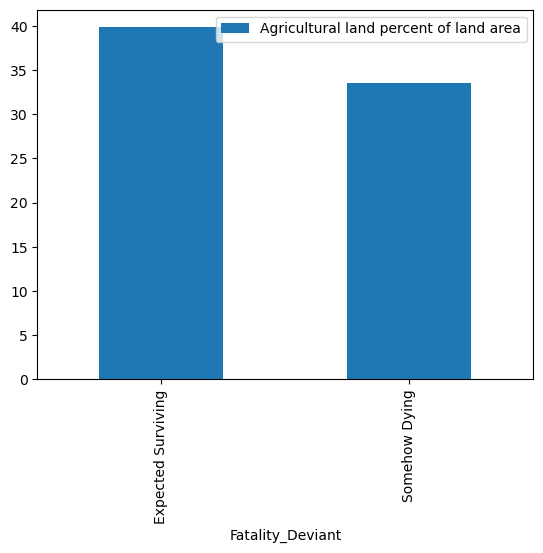

In [640]:
FewFarmEmpsNewMeanDF = FewFarmEmps.groupby('Fatality_Deviant')[['Agricultural land percent of land area']].mean()
pd.set_option('plotting.backend', 'matplotlib')

FewFarmEmpsNewMeanDF.plot(kind = 'bar')

In [641]:
pd.set_option('plotting.backend', 'pandas_bokeh')

In [642]:
FarmingFatality_General_Corrs.sort_values(by = 'Fatalities Index').head()

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 5 meters percent of tota

In [643]:
dfFatGeneralFarmcorrsALTEREd = FarmingFatality_General_Corrs.loc[FarmingFatality_General_Corrs['Fatalities Index']<=0]
dfFatGeneralFarmcorrsALTEREd['Deaths Index'] = dfFatGeneralFarmcorrsALTEREd['Fatalities Index'].apply(abs)
dfFatGeneralFarmcorrsALTEREd = dfFatGeneralFarmcorrsALTEREd[['Deaths Index']]
dfFatGeneralFarmcorrsALTEREd

,Deaths Index
Employment in agriculture percent of total employment modeled ILO estimate,0.225570
Rural population,0.221148
"Agriculture, forestry, and fishing, value added percent of GDP",0.217374
Rural population growth annual percent,0.212717
Rural population percent of total population,0.201686
Agricultural land sq. km,0.176431
Agricultural raw materials imports percent of merchandise imports,0.158979
Rural land area sq. km,0.130244
"Agriculture, forestry, and fishing, value added annual percent growth",0.041642


In [644]:
dfFatGeneralFarmcorrsALTEREd
DFFarmingFatality_General_Corrs = dfFatGeneralFarmcorrsALTEREd.rename(shorter_names, axis=0).sort_values(by = 'Deaths Index')

FarmingFatality_General_Corrsplot = DFFarmingFatality_General_Corrs.plot(show_figure = False)
FarmingFatality_General_Corrsplot.legend.location = 'top_left'
FarmingFatality_General_Corrsplot.plot_width = 960

FarmingFatality_General_Corrsplot.xaxis.major_label_orientation = 0.3 * 3.14

show(FarmingFatality_General_Corrsplot)

In [645]:
SomehowDying.iloc[0:]

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 5 meters

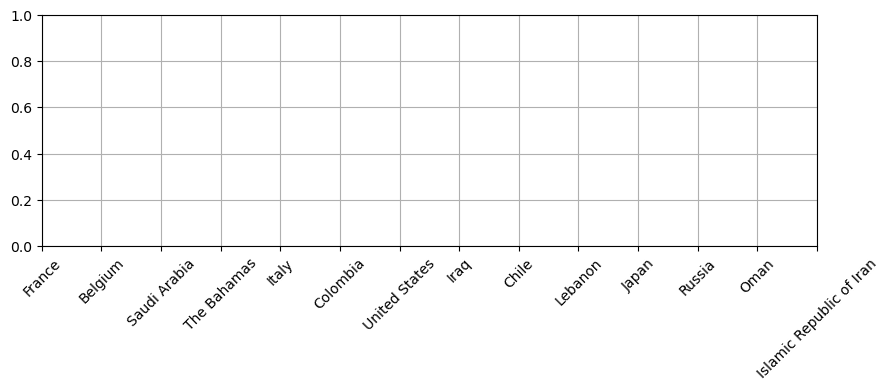

In [646]:
plt.figure(figsize = (10,3))
SomedowDying_sorted = SomehowDying.iloc[0:,:].sort_values(by = 'Fatalities Index')
SDLongplot = SomedowDying_sorted.plot(y = 'longitude', kind = 'line')
plt.xticks(rotation = 45)
plt.xticks(list(range(0, len(SomehowDying.index), 1)), SomedowDying_sorted.index)
plt.grid(True)

plt.show()

In [647]:
SomehowDying['longitude'].median()

24.2148325

In [648]:
pd.set_option('display.max_rows', 6)
YDying_Special_Corr_1Col = YDying_Special_Corr['Fatalities Index']
YDying_Special_Corr_1Col =YDying_Special_Corr_1Col

In [649]:
df = YDying_Special_Corr_1Col.iloc[1:]

CorrPlot = df.plot(kind = 'bar', show_figure = False)
CorrPlot.plot_width = 1000
CorrPlot.plot_height = 800
CorrPlot.title
CorrPlot.legend.visible = False

CorrPlot.legend.location = 'top_right'
CorrPlot.xaxis.major_label_orientation = 0.4 * 3.14

show(CorrPlot)

In [650]:
ReCheck

['Agricultural land percent of land area',
 'GNI per capita, Atlas method 2015 USD',
 'Merchandise exports to highincome economies percent of total merchandise exports']

In [651]:
col_set = YDying_Special_Corr.index.tolist()

FF_SussVars_fMean = FewFarmEmps[[*col_set,'Fatality_Deviant']]
FF_SussVars_grpd_mean = FF_SussVars_fMean.groupby('Fatality_Deviant')[[*col_set]].mean()#, *,most_important_Vars,*Some_OtherSuss_Vars, *Special_Ydying_relation]].mean()
FF_SussVars_grpd_mean

,Fatalities Index,Employment in industry percent of total employment modeled ILO estimate,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports,longitude,Employment in agriculture percent of total employment modeled ILO estimate,"Tariff rate, most favored nation, weighted mean, primary products percent",Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,"Agriculture, forestry, and fishing, value added percent of GDP",Ores and metals exports percent of merchandise exports,Other manufacturing percent of value added in manufacturing,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Profit tax percent of commercial profits,Merchandise imports from low and middleincome economies in South Asia percent of total merchandise imports,Net migration,Refugee population by country or territory of asylum,Gross domestic savings percent of GDP,Population growth annual percent,Rural land area where elevation is below 5 meters percent of total land area,"Communications, computer, etc. percent of service imports, BoP",Medium and hightech exports percent manufactured exports,GDP per capita growth annual percent,Agricultural land percent of land area,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,Merchandise imports from highincome economies percent of total merchandise imports,"GNI per capita, PPP constant 2015 USD",GNI per capita constant 2015 USD,"GNI per capita, Atlas method 2015 USD",Merchandise imports from low and middleincome economies in SubSaharan Africa percent of total merchandise imports,"Agriculture, forestry, and fishing, value added per worker constant 2015 USD",Employment in services percent of total employment modeled ILO estimate,Merchandise exports to highincome economies percent of total merchandise exports
Fatality_Deviant,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Expected Surviving,88.000000,23.939883,7.737783,13.404692,5.227160,6.916122,5.187179,18.806340,3.547059,5.936917,44.137728,2.562955,14.984615,1.758858,68904.461538,112166.179487,25.611980,1.179619,3.088274,42.098984,46.204010,1.910328,39.847108,3.295071,0.714816,67.262703,33540.314950,27438.186466,22584.863743,3.524827,49867.654407,69.144008,71.069567
Somehow Dying,29.178571,24.157708,16.212661,18.173293,12.721808,6.461239,5.197857,34.983146,3.063272,7.245158,47.093573,5.306456,13.485714,2.656761,175870.928571,271814.642857,23.379989,1.276022,6.330973,41.870345,45.795366,0.544876,33.546057,3.203471,0.652404,61.923858,31568.492863,22615.927050,18270.904275,1.528223,26280.746474,69.381054,59.112359


In [652]:
FF_SussVars_grpd_mean = FF_SussVars_grpd_mean/FF_SussVars_grpd_mean.iloc[0]
FF_SussVars_grpd_mean

,Fatalities Index,Employment in industry percent of total employment modeled ILO estimate,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports,longitude,Employment in agriculture percent of total employment modeled ILO estimate,"Tariff rate, most favored nation, weighted mean, primary products percent",Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,"Agriculture, forestry, and fishing, value added percent of GDP",Ores and metals exports percent of merchandise exports,Other manufacturing percent of value added in manufacturing,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Profit tax percent of commercial profits,Merchandise imports from low and middleincome economies in South Asia percent of total merchandise imports,Net migration,Refugee population by country or territory of asylum,Gross domestic savings percent of GDP,Population growth annual percent,Rural land area where elevation is below 5 meters percent of total land area,"Communications, computer, etc. percent of service imports, BoP",Medium and hightech exports percent manufactured exports,GDP per capita growth annual percent,Agricultural land percent of land area,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,Merchandise imports from highincome economies percent of total merchandise imports,"GNI per capita, PPP constant 2015 USD",GNI per capita constant 2015 USD,"GNI per capita, Atlas method 2015 USD",Merchandise imports from low and middleincome economies in SubSaharan Africa percent of total merchandise imports,"Agriculture, forestry, and fishing, value added per worker constant 2015 USD",Employment in services percent of total employment modeled ILO estimate,Merchandise exports to highincome economies percent of total merchandise exports
Fatality_Deviant,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Expected Surviving,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000,1.00000,1.00000,1.000000,1.000000
Somehow Dying,0.331575,1.009099,2.095259,1.355741,2.43379,0.934229,1.002058,1.860178,0.863609,1.220357,1.066969,2.070444,0.899971,1.510503,2.552388,2.423321,0.912854,1.081723,2.050003,0.994569,0.991156,0.285226,0.841869,0.972201,0.912689,0.920627,0.94121,0.82425,0.808989,0.43356,0.52701,1.003428,0.831753


In [653]:
ExpectedSurvivors = FewFarmEmps[~FewFarmEmps['country'].isin(SomehowDying.index.tolist())]

In [654]:
ExpectedSurvivors['Fatality_Deviant']

Country Code
ESP    Expected Surviving
ZAF    Expected Surviving
SVK    Expected Surviving
              ...        
ISR    Expected Surviving
JOR    Expected Surviving
QAT    Expected Surviving
Name: Fatality_Deviant, Length: 39, dtype: object

In [655]:
StrCols

['country',
 'rw_country_code',
 'Country Code',
 'Fatality_index_Groups',
 'climate_group',
 'Farm_Work_PCent_Group',
 'Fatality_Deviant',
 'color_col']

In [656]:
import scipy.stats as stats

dfA = SomehowDying.loc[:,~SomehowDying.columns.isin(StrCols)]
dfB = ExpectedSurvivors.loc[:,~ExpectedSurvivors.columns.isin(StrCols)]

#variable = 'Merchandise exports to highincome economies percent of total merchandise exports'

variable_dict = {}

for variable in FF_SussVars_fMean.columns[~FF_SussVars_fMean.columns.isin(StrCols)].tolist():
    
    mean_A = dfA[variable].mean()    # Step 1: Calculate means and variances
    mean_B = dfB[variable].mean()
    var_A = dfA[variable].var(ddof=1)  # Sample variance
    var_B = dfB[variable].var(ddof=1)

                                    # Step 2: Calculate the standard error of the difference in means
    n_A = len(dfA)
    n_B = len(dfB)
    SE = np.sqrt(var_A/n_A + var_B/n_B)

                                    # Step 3: Calculate the t-value
    t_value = (mean_A - mean_B) / SE

                                    # Step 4: Calculate the degrees of freedom using Welch-Satterthwaite equation
    df = (var_A/n_A + var_B/n_B)**2 / ((var_A**2 / ((n_A**2) * (n_A - 1))) + (var_B**2 / ((n_B**2) * (n_B - 1))))

                                    # Step 5: Calculate the p-value
    p_value = 2 * (1 - stats.t.cdf(np.abs(t_value), df))

                                    # Interpretation
    alpha = 0.05
    if p_value < alpha:
        variable_dict[variable] = ['Reject H0 (Sig Difference)', ('t-value' ,t_value), ('degrees of freedom', df), ('p-value', p_value)]
    else:
        variable_dict[variable] = ['Fail to Reject H0 (No Sig Difference)', ('t-value', t_value), ('degrees of freedom', df), ('p-value', p_value)]
        
variable_dict

Sig_MeanDiff_Var = []
NonSigDiff = []
for variable in variable_dict:
    if variable_dict[variable][0] == 'Reject H0 (Sig Difference)':
        Sig_MeanDiff_Var.append(variable)
    else:
        NonSigDiff.append(variable)
Sig_MeanDiff_Var, len(NonSigDiff)

(['Fatalities Index',
  'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports',
  'Merchandise exports to highincome economies percent of total merchandise exports'],
 30)

In [657]:
# Better Fancy method that doesnt assume normal distribution. but idk how useful still.
from scipy.stats import wilcoxon

fancyFancySig = []
fancyFancyNonSig = []

for entry in YDying_Special_Corr.index.tolist():
    
    #dfDieA = SomehowDying.loc[:,~SomehowDying.columns.isin(StrCols)]
    #dfSurviveB = ExpectedSurvivors.loc[:,~ExpectedSurvivors.columns.isin(StrCols)]
    
    subgroup_mean = FF_SussVars_grpd_mean.loc['Somehow Dying', entry]
    other_mean = FF_SussVars_grpd_mean.loc['Expected Surviving', entry]

    
    # Calculate the difference in means
    mean_diff = subgroup_mean - other_mean
    # Perform Wilcoxon signed-rank test on the mean differences
    statistic, p_value = wilcoxon(mean_diff)
    
    
    if p_value < 0.05:
        fancyFancySig.append(entry)
    else:
        fancyFancyNonSig.append(entry)

fancyFancySig
# Print the results
#print("Wilcoxon Signed-Rank Test:")
#print(f"Statistic: {statistic}")
#print(f"P-value: {p_value}")



[]

In [658]:
fancyFancyNonSig

['Fatalities Index',
 'Employment in industry percent of total employment modeled ILO estimate',
 'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports',
 'Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports',
 'longitude',
 'Employment in agriculture percent of total employment modeled ILO estimate',
 'Tariff rate, most favored nation, weighted mean, primary products percent',
 'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports',
 'Agriculture, forestry, and fishing, value added percent of GDP',
 'Ores and metals exports percent of merchandise exports',
 'Other manufacturing percent of value added in manufacturing',
 'Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports',
 'Profit tax percent of commercial profits',
 'Merchandise imports from low and middl

In [659]:
# I ended up comparing the means to a minimum threshold coeficient to determine what might constitue a sigificant difference.
# I did this instead of the facy stats methods shown above 

In [660]:
# The Way I was Gonna do before I learnt the fancy stats way   -Skrew the Stats Fancy Way
#"""
sig_mean_difference = []

for entry in YDying_Special_Corr.index.tolist():
    if abs(FF_SussVars_grpd_mean.loc['Expected Surviving', entry] - FF_SussVars_grpd_mean.loc['Somehow Dying', entry]) >= ((FF_SussVars_grpd_mean.loc['Expected Surviving', entry] + FF_SussVars_grpd_mean.loc['Somehow Dying', entry])/2)*0.3:
        sig_mean_difference.append(entry)
sig_mean_difference
#"""

['Fatalities Index',
 'Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports',
 'Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports',
 'longitude',
 'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports',
 'Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports',
 'Merchandise imports from low and middleincome economies in South Asia percent of total merchandise imports',
 'Net migration',
 'Refugee population by country or territory of asylum',
 'Rural land area where elevation is below 5 meters percent of total land area',
 'GDP per capita growth annual percent',
 'Merchandise imports from low and middleincome economies in SubSaharan Africa percent of total merchandise imports',
 'Agriculture, forestry, and fishing, value added per worker constant 2015 USD']

In [661]:
#***&&&
"""
mean_corr_checking_delerius = []
for entry in New_Vars_Percentiled:
    if entry in sig_mean_difference:
        mean_corr_checking_delerius.append(entry)
        
mean_corr_checking_delerius
"""

'\nmean_corr_checking_delerius = []\nfor entry in New_Vars_Percentiled:\n    if entry in sig_mean_difference:\n        mean_corr_checking_delerius.append(entry)\n        \nmean_corr_checking_delerius\n'

In [662]:
Sig_MeanDiff_Var

['Fatalities Index',
 'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports',
 'Merchandise exports to highincome economies percent of total merchandise exports']

In [663]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

In [664]:
FF_YDyingNoStr_Corr

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 5 meters percent of tota

In [665]:
Expected_Survive_Top_Var = FF_YDyingNoStr_Corr.index[0:6].tolist()   #until +-0.4 corr coeff
Expected_Survive_Top_Var = Expected_Survive_Top_Var + FF_YDyingNoStr_Corr.index[-5:].tolist()   
len(Expected_Survive_Top_Var)

11

In [666]:
Not_relevant_Vars = FF_YDyingNoStr_Corr.loc[:,~FF_YDyingNoStr_Corr.columns.isin(Expected_Survive_Top_Var)].columns.tolist()

FF_YDyingNoStr_Corr_Relevant = FF_YDyingNoStr_Corr.copy()
FF_YDyingNoStr_Corr_Relevant = FF_YDyingNoStr_Corr_Relevant.drop([*Not_relevant_Vars], axis=0)
FF_YDyingNoStr_Corr_Relevant = FF_YDyingNoStr_Corr_Relevant.drop(['fatalities_per_100k_rank', 'fatalities_rank', 'cri_score', 'cri_rank', 'fatalities_per_100k_total', 'fatalities_total'], axis = 0)

FF_YDyingNoStr_Corr_Relevant = FF_YDyingNoStr_Corr_Relevant['Fatalities Index'].copy()
FF_YDyingNoStr_Corr_Relevant

Fatalities Index                                1.000000
Exports of goods and services percent of GDP    0.445438
Urban land area sq. km                         -0.412215
Population, total                              -0.475064
Urban population                               -0.485128
Name: Fatalities Index, dtype: float64

In [667]:
#***&&&
FewFarmEmps['Fatalities Index'].sort_values().plot()

Figure(id='11055', ...)

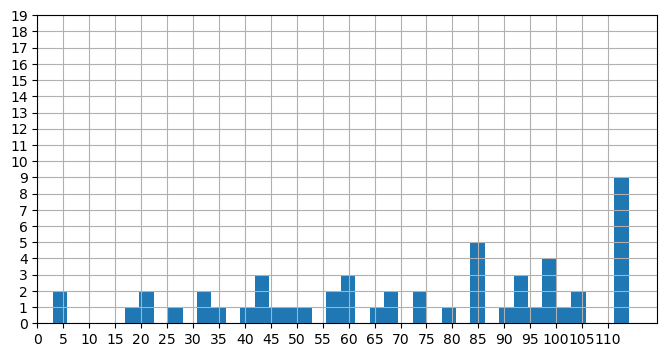

(None, 6)

In [668]:
#***&&&
df = FewFarmEmps
plt.figure(figsize=(8, 4))
plt.hist(df['Fatalities Index'], bins = 40)

plt.xlim(0)
plt.xticks(list(range(0, int(FullyFilled['Fatalities Index'].max()), 5)))
plt.yticks(list(range(0, 20)))

plt.grid(True)

plt.show(), FewFarmEmps[FewFarmEmps['Fatalities Index']<30].shape[0]

In [669]:
#***&&&
FewFarmEmps[FewFarmEmps['Fatalities Index']<40] # Belgium and France were apparently outliers. 

,Fatalities Index,country,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 

In [670]:
#***&&&
SomehowDying['Fatalities Index'].max(), SomehowDying.shape

(46.0, (14, 163))

In [671]:
#***&&&
FewFarmEmps.shape

(53, 167)

In [672]:
#***&&&
FewFarmEmps['Fatalities Index'].quantile([0.25, 0.5, 0.75])
### Ok so in LAAATer Prjects, a Mean Comparison between these Quantiles might be good.

0.25    46.0
0.50    78.5
0.75    98.0
Name: Fatalities Index, dtype: float64

In [673]:
#***&&&
FewFarmEmps[FewFarmEmps['Fatalities Index']<=FewFarmEmps['Fatalities Index'].quantile(0.25)].shape

(14, 167)

In [674]:
#  gonna try the above in the below graph

## If I want to cycle through the graphs of the different variables in the following cell,
## simply delete the relevant Hashtags from the cells below

In [675]:
x = [0,]
#x = [-1]
# to 

In [676]:
#(-1,-12) [-10 not including, fatality totals] (health spending -15, GDP/cap growth -15 not including), (1,12) [10], Profit at 16 including 3fattotals     Still some other good stuff on that end. Can check both out more tomorrow

#x.append(1)
variable = sig_mean_difference[sum(x)]
#variable = Special_Ydying_relation[-sum(x)]
#variable = FF_YDyingNoStr_Corr_Relevant.index[sum(x)]

df = FewFarmEmps#[~FewFarmEmps['country'].isin(['United States',])]#'Iran', 'Oman'])]

colour_plot_list = df['color_col'].to_list()

country_names = df[df['country'].isin(df['country'].unique())]#.tolist()
country_names = country_names.sort_values(by = 'Fatalities Index', ascending = True) # Can try with fatalities_per_100k_rank but might not be nec
country_names = country_names['country'].tolist()

x_range = FactorRange(*country_names)

Dying_Deviant_Plot = figure(width=800, height=350, x_range=x_range)

Dying_Deviant_Plot.scatter(x = df['country'], y = df[variable],\
                           fill_color = colour_plot_list, hatch_color = colour_plot_list, size = 8, alpha = 0.8)


country_indicies = {country: index for index, country in enumerate(country_names)}
df['country_num'] = df['country'].map(country_indicies)

for colour in df['color_col'].unique():
    subset = df#df[df['color_col']==colour]
    x_vals = subset['country_num'].values
    y_vals = subset[variable].values
    
    x_vals_reshaped = x_vals.reshape(-1,1) # NB - '-1' in '.reshape()' essentially means len(x_vals). and '1' essentially means 1 column (which can be conceptualised having a thread not a line on a page, its the same thing but with an extra dimension that means it can be touched and reshaped/understood. Similarly linearRegression requires 2 dimensions not 1)
    model = LinearRegression().fit(x_vals_reshaped, y_vals) # Make and fit the model
    y_PredictedOrFitted_vals = model.predict(x_vals_reshaped)
    
    Dying_Deviant_Plot.line(x = subset['country'], y = y_PredictedOrFitted_vals, line_color = colour, line_dash = 'dashed', legend = f'Fit {colour}')


Dying_Deviant_Plot.xaxis.major_label_orientation = 0.2 * 3.14
Dying_Deviant_Plot.title = variable

#Special_Var_dict[variable] = [('SomehowDying', SomehowDying[variable].mean()), ('ExpectedlyFine', ExpectedlyFine[variable].mean())]

show(Dying_Deviant_Plot)

In [677]:
CorrCorrMeanMean_list = ['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports',\
                         'Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports',\
                         'Merchandise exports to low and middleincome economies outside region percent of total merchandise exports',\
                         'Net migration']

#  Ok But what about with StatNArrowedMean list   -   The fancy way assumed a normal distribution which isnt always the case with these variables As some are Normal and then explode. 
# Just Exp to Outside and Imports.   

In [678]:
#  There were some significant Mean differences that werent being acknwledged by the Fancy stats method so i was exploring them here
"""
variable_dict['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports']

FF_SussVars_grpd_mean['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports']

SomehowDying['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports'].std(), \
ExpectedSurvivors['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports'].std()

FF_SussVars_grpd_mean[[*Sig_MeanDiff_Var]]
"""

"\nvariable_dict['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports']\n\nFF_SussVars_grpd_mean['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports']\n\nSomehowDying['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports'].std(), ExpectedSurvivors['Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports'].std()\n\nFF_SussVars_grpd_mean[[*Sig_MeanDiff_Var]]\n"

In [679]:
# Exports East Asia   More notable than Imports East Asia   Check without outliers?
# Exports to Cs Outside Region
# Net Migration = More Sig if not including USA (sig outliers)
# 

In [680]:
# Merch Imports South Asia = Same if not including Iran and Oman (sig outliers)
# Net Migration = More Sig if not including USA (sig outliers)
# Emp in Services is a false corr coefficient. would be less steep with more datapoints looks pretty steady when you look at the broader data.
            # defo right. the line of best fit for subset = df is streight though, marginal incline

In [681]:
# Longitude is marginally interesting in that ExpectedSurvivors Is Far More Consistant. SomehowDying is pretty variable.
SomehowDying['longitude'].std(), ExpectedSurvivors['longitude'].std(), FewFarmEmps['longitude'].std(), print('NVM')

NVM


(70.79139079987262, 56.95156036054121, 60.284482022506104, None)

In [682]:
ReCheck

['Agricultural land percent of land area',
 'GNI per capita, Atlas method 2015 USD',
 'Merchandise exports to highincome economies percent of total merchandise exports']

In [683]:
FF_YDyingNoStr_Corr_Relevant

Fatalities Index                                1.000000
Exports of goods and services percent of GDP    0.445438
Urban land area sq. km                         -0.412215
Population, total                              -0.475064
Urban population                               -0.485128
Name: Fatalities Index, dtype: float64

In [684]:
#FF_SussVars_grpd_mean[[
col_set = FF_YDyingNoStr_Corr_Relevant.index.tolist()

FF_SussVars_fMean3 = FewFarmEmps[[*col_set,'Fatality_Deviant']]
FF_SussVars_grpd_mean3 = FF_SussVars_fMean3.groupby('Fatality_Deviant')[[*col_set]].mean()#, *,most_important_Vars,*Some_OtherSuss_Vars, *Special_Ydying_relation]].mean()
FF_SussVars_grpd_mean3

,Fatalities Index,Exports of goods and services percent of GDP,Urban land area sq. km,"Population, total",Urban population
Fatality_Deviant,,,,,
Expected Surviving,88.000000,47.423846,8092.819744,2.581975e+07,2.029939e+07
Somehow Dying,29.178571,31.179681,27671.990668,6.848583e+07,5.480993e+07


In [685]:
col_set = FF_YDyingNoStr_Corr_Relevant.index.tolist()

In [686]:
sig_mean_difference_FF = []
for entry in col_set:
    if abs(FF_SussVars_grpd_mean3.loc['Expected Surviving', entry] - FF_SussVars_grpd_mean3.loc['Somehow Dying', entry]) >= ((FF_SussVars_grpd_mean3.loc['Expected Surviving', entry] + FF_SussVars_grpd_mean3.loc['Somehow Dying', entry])/2)*0.3:
        sig_mean_difference_FF.append(entry)
sig_mean_difference_FF

['Fatalities Index',
 'Exports of goods and services percent of GDP',
 'Urban land area sq. km',
 'Population, total',
 'Urban population']

In [687]:
FF_SussVars_grpd_mean3 = FF_SussVars_grpd_mean3/FF_SussVars_grpd_mean3.iloc[0]
FF_SussVars_grpd_mean3

,Fatalities Index,Exports of goods and services percent of GDP,Urban land area sq. km,"Population, total",Urban population
Fatality_Deviant,,,,,
Expected Surviving,1.000000,1.000000,1.000000,1.000000,1.000000
Somehow Dying,0.331575,0.657468,3.419326,2.652459,2.700077


In [688]:
SigSigVars = FewFarmEmps[['country','Fatality_Deviant', *sig_mean_difference_FF, *CorrCorrMeanMean_list]]
SigSigVars

,country,Fatality_Deviant,Fatalities Index,Exports of goods and services percent of GDP,Urban land area sq. km,"Population, total",Urban population,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Net migration
Country Code,,,,,,,,,,,
SAU,Saudi Arabia,Somehow Dying,18.0,32.563925,7756.634132,32749848.0,27241324.0,18.914034,20.395343,40.242515,60337.0
ESP,Spain,Expected Surviving,60.5,33.610861,15655.069410,46444832.0,36971015.0,2.672767,9.035121,18.551163,-871.0
ZAF,South Africa,Expected Surviving,67.5,27.713638,15118.662080,55876504.0,36223620.0,10.960415,24.299659,18.967348,644996.0
SVK,Slovak Republic,Expected Surviving,99.5,91.600474,1805.386356,5423801.0,2922832.0,1.638353,5.385068,9.092966,2637.0
SWZ,Swaziland,Expected Surviving,114.0,43.106866,177.918671,1133936.0,264207.0,0.013261,4.434722,0.203747,-10464.0
BHS,The Bahamas,Somehow Dying,20.5,36.358574,203.744243,392697.0,324941.0,0.139092,0.976184,35.850935,1001.0
GBR,United Kingdom,Expected Surviving,83.5,27.845951,22675.976250,65116219.0,53802927.0,7.231741,12.918547,16.131097,254218.0
URY,Uruguay,Expected Surviving,114.0,22.477851,1017.871369,3402818.0,3234208.0,15.764801,20.088779,51.472776,-4156.0
USA,United States,Somehow Dying,31.5,12.471819,186573.446700,320738994.0,261950744.0,10.825093,27.462478,38.845294,1221849.0


In [689]:

## I think its a good idea here as can see how everyhting correlates with Each Other, not just Index
#   I wanna see how each variable Correlates with One another. Not Just Fatalities Index
variable = 'Exports of goods and services percent of GDP'
SigSigVars.iloc[:,2:].corr(method = 'spearman').sort_values(by = variable, ascending = True)
## So High prevelance of Exports amongst these columns indicates a correlation with industry and Production specifically. 
# As Noted earlier its mostly fuel and finance. What is Imported from East Asia?  I googled it and its Fuel, Circuits, Elictrical-Conductors, Gold,  

,Fatalities Index,Exports of goods and services percent of GDP,Urban land area sq. km,"Population, total",Urban population,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Net migration
Merchandise imports from low and middleincome economies in East Asia & Pacific percent of total merchandise imports,-0.234218,-0.600710,0.446863,0.500403,0.556926,0.671988,1.000000,0.373085,0.311079
Urban population,-0.485128,-0.513466,0.962103,0.987663,1.000000,0.390905,0.556926,0.218029,0.274875
"Population, total",-0.475064,-0.470005,0.972263,1.000000,0.987663,0.318497,0.500403,0.171021,0.233511
Urban land area sq. km,-0.412215,-0.388970,1.000000,0.972263,0.962103,0.325754,0.446863,0.172714,0.313256
Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,-0.278515,-0.364377,0.172714,0.171021,0.218029,0.738268,0.373085,1.000000,0.246089
Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,-0.213443,-0.352443,0.325754,0.318497,0.390905,1.000000,0.671988,0.738268,0.506047
Net migration,-0.087140,-0.052733,0.313256,0.233511,0.274875,0.506047,0.311079,0.246089,1.000000
Fatalities Index,1.000000,0.445438,-0.412215,-0.475064,-0.485128,-0.213443,-0.234218,-0.278515,-0.087140
Exports of goods and services percent of GDP,0.445438,1.000000,-0.388970,-0.470005,-0.513466,-0.352443,-0.600710,-0.364377,-0.052733


In [690]:
SomehowDying

,Fatalities Index,cri_rank,cri_score,fatalities_per_100k_rank,fatalities_per_100k_total,fatalities_rank,fatalities_total,losses_per_gdp__rank,losses_per_gdp__total,losses_usdm_ppp_rank,losses_usdm_ppp_total,rw_country_code,Agricultural land percent of land area,Agricultural land sq. km,Agricultural raw materials exports percent of merchandise exports,Agricultural raw materials imports percent of merchandise imports,"Net trade in goods and services BoP, 2015 USD",Merchandise trade percent of GDP,Trade percent of GDP,Trade in services percent of GDP,Textiles and clothing percent of value added in manufacturing,Price level ratio of PPP conversion factor GDP to market exchange rate,"Computer, communications and other services percent of commercial service exports","Computer, communications and other services percent of commercial service imports",Customs and other import duties percent of tax revenue,Hightechnology exports percent of manufactured exports,Machinery and transport equipment percent of value added in manufacturing,Manufactures exports percent of merchandise exports,Manufactures imports percent of merchandise imports,"Manufacturing, value added percent of GDP",Medium and hightech exports percent manufactured exports,Other manufacturing percent of value added in manufacturing,Other taxes percent of revenue,"Tariff rate, most favored nation, simple mean, primary products percent","Tariff rate, most favored nation, weighted mean, primary products percent","Tariff rate, applied, weighted mean, primary products percent","Tariff rate, most favored nation, simple mean, all products percent","Tariff rate, applied, weighted mean, all products percent","Tariff rate, applied, simple mean, primary products percent","Tariff rate, applied, simple mean, all products percent",Adjusted savings: gross savings percent of GNI,Gross capital formation percent of GDP,Gross capital formation annual percent growth,Gross capital formation constant 2015 USD,Gross domestic savings percent of GDP,Gross domestic savings 2015 USD,Gross national expenditure percent of GDP,Gross national expenditure constant 2015 USD,Gross savings percent of GNI,Gross savings percent of GDP,Gross value added at basic prices GVA constant 2015 USD,Gross savings 2015 USD,"GNI per capita, Atlas method 2015 USD","GNI, Atlas method 2015 USD",Exports of goods and services percent of GDP,"International tourism, receipts percent of total exports",ICT goods exports percent of total goods exports,Exports of goods and services constant 2015 USD,Exports of goods and services annual percent growth,"Communications, computer, etc. percent of service exports, BoP",Commercial service exports 2015 USD,Merchandise exports 2015 USD,Ores and metals exports percent of merchandise exports,Merchandise exports to highincome economies percent of total merchandise exports,Merchandise exports to low and middleincome economies in East Asia & Pacific percent of total merchandise exports,Merchandise exports to low and middleincome economies in Europe & Central Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in Latin America & the Caribbean percent of total merchandise exports,Merchandise exports to low and middleincome economies in MENA percent of total merchandise exports,Merchandise exports to low and middleincome economies in South Asia percent of total merchandise exports,Merchandise exports to low and middleincome economies in SubSaharan Africa percent of total merchandise exports,Merchandise exports to low and middleincome economies outside region percent of total merchandise exports,Merchandise exports to low and middleincome economies within region percent of total merchandise exports,Travel services percent of commercial service exports,General government final consumption expenditure percent of GDP,Arable land percent of land area,Arable land hectares per person,Arable land hectares,Land area sq. km,Land area where elevation is below 5 meters

In [691]:
#   japan makes sense
#    bahamas is a little island,    

In [692]:
"""
H0 = no mean diff
H1 = significant mean diff
t-test time    independent two sample test
"""

#MMM No I dont think so. Another Time.

'\nH0 = no mean diff\nH1 = significant mean diff\nt-test time    independent two sample test\n'